В данном Jupyter Notebook описан приведен анализ получившихся данных морфосинтаксического анализа для решения задачи атрибуции автора.


In [1]:
import pandas as pd
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage  
from matplotlib import pyplot as plt
%matplotlib inline

import seaborn as sn
import pandas as pd
import seaborn as sns; sns.set()

In [2]:
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
import numpy as np

from sklearn.preprocessing import normalize
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import cross_validate, cross_val_score, StratifiedKFold
from sklearn.metrics.scorer import make_scorer
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB

from collections import defaultdict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.neighbors import NearestNeighbors

from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan

from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.svm import SVC, LinearSVC
from sklearn.preprocessing import scale


In [9]:
from collections import defaultdict, Counter
import pickle

In [4]:
def hopkins(X):
    X = pd.DataFrame(X)
    #print(X)
    d = X.shape[1]
    
    #d = len(vars) # columns
    n = len(X) # rows
    #print('Columns: {} \t Rows: {}'.format(d,n))
    
    m = int(0.5*n)
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
    #print('Heuristic: {}'.format(n))
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        #print ujd, wjd
        H = 0
 
    return H

In [5]:
from matplotlib import pyplot

def do_clustering(X, cluster_count):
    clusterer = KMeans(n_clusters=cluster_count)
    print('Count of clusters: {}'.format(cluster_count))
    cluster_numbers = clusterer.fit_predict(X)
    return cluster_numbers

def draw_feature_importance(name_of_features, importance, title, results_folder = None):
    fig, ax = pyplot.subplots(figsize=(15,10))
    ax = sns.barplot(x=name_of_features, y=importance,color='Darkblue', ax = ax)

    for item in ax.get_xticklabels():
        item.set_rotation(90)
    ax.set_alpha(0.8)
    ax.set_title('Feature Importance : {}'.format(title))
    if results_folder is not None:
        plt.savefig(os.path.join(results_folder, 'RF_feature_importance.png'), bbox_inches="tight")
    plt.show()


In [153]:
import os
directory = 'result_of_experiments_0104'
if not os.path.exists(directory):
    os.makedirs(directory)
if not os.path.exists(os.path.join(directory,'Clustering_Result')):
    os.makedirs(os.path.join(directory,'Clustering_Result'))
if not os.path.exists(os.path.join(directory,'Classification_Result')):
    os.makedirs(os.path.join(directory,'Classification_Result'))

In [7]:
statStructure = defaultdict(dict)

COUNT_OF_FOLDS = 3

In [10]:
statStructure = pickle.load(open('statstructure.pkl', 'rb'))

In [11]:
list_of_models = [
    ('Random Forest', RandomForestClassifier(n_estimators=20)),
    ('Logistic Regression', LogisticRegression(multi_class='ovr', solver = 'saga', max_iter=100, penalty='l1' )),
    ('Linear SVC', LinearSVC()),
]


In [163]:
def calc_description_errors(y_true, y_prediction, label_encoder):
    y_true_original_names = label_encoder.inverse_transform(y_true)
    y_prediction_original_names = label_encoder.inverse_transform(y_prediction)
    
    description_error = defaultdict(Counter)
    
    for index, true_label in enumerate(y_true_original_names):
        predicted_label = y_prediction_original_names[index]
        description_error[true_label][predicted_label] += 1
    return description_error

In [164]:
def classification_experiment(
    X, Y , list_of_models, 
    current_representation_name,
    global_statistics,
    name_of_features,
    folder_with_results = None,
    count_of_folds = 3,
    feature_importance_available = True,
    scaling = True,
    dict_for_predictions = None
):
    
    if folder_with_results is not None:
        results_folder = os.path.join(folder_with_results, current_representation_name)
        if not os.path.exists(results_folder):
            os.makedirs(results_folder)
    else:
        results_folder = None
        
    if scaling:
        XS = scale(X)
    else:
        XS = X
        
    for name_of_model, current_model_instance in list_of_models:
        print('Current model: {}'.format(name_of_model))
        skf = StratifiedKFold(n_splits=count_of_folds, random_state=None, shuffle=True)
        
        res_metrics = defaultdict(list)
        
        for train_index, test_index in skf.split(XS, Y):
            X_train, X_test = XS[train_index], XS[test_index]
            y_train, y_test = Y[train_index], Y[test_index]
        
            current_model_instance.fit(X_train, y_train)
            predictions = current_model_instance.predict(X_test)
            
            dict_for_predictions[name_of_model].append((y_test, predictions))
            
            res_metrics['Accuracy'].append(accuracy_score(y_test, predictions))
            res_metrics['Precision'].append(precision_score(y_test, predictions, average='weighted'))
            res_metrics['Recall'].append(recall_score(y_test, predictions,  average='weighted'))
            res_metrics['f1'].append(f1_score(y_test, predictions,  average='weighted'))
            res_metrics['confusion'].append(confusion_matrix(y_test, predictions))
            
            if feature_importance_available and isinstance(current_model_instance, RandomForestClassifier):
                res_metrics['RF_feature_importance'].append(current_model_instance.feature_importances_)
            if feature_importance_available and isinstance(current_model_instance, LogisticRegression):
                res_metrics['Logistic_feature_importance'].append(current_model_instance.coef_)
        
        global_statistics[current_representation_name][name_of_model] = {}
        for current_metric in res_metrics:        
            if current_metric not in ['confusion', 'RF_feature_importance', 'Logistic_feature_importance']:
                global_statistics[current_representation_name][name_of_model][current_metric] = np.mean(res_metrics[current_metric])
                print('{:10}\tmean: {:.5f}'.format(current_metric, np.mean(res_metrics[current_metric])))
            elif current_metric == 'confusion':
                for index_number, array in enumerate(res_metrics[current_metric]):
                    df_cm = pd.DataFrame(array, index = [i for i in le.classes_], columns = [i for i in le.classes_])
                    plt.clf()
                    plt.figure(figsize = (10,7))
                    ax = plt.axes()
                    sn.heatmap(df_cm, annot=True, ax=ax)
                    ax.set_title('Confusion Matrix: {}'.format(name_of_model))
                    if results_folder is not None:
                        plt.savefig(os.path.join(results_folder, 'confusion_matrix_{}_cv_{}'.format(name_of_model,index_number)))
#                    if index_number == 1:
#                        plt.show()
                        
            elif current_metric == 'RF_feature_importance':
                feature_and_importance = defaultdict(list)
                for cv_iteration, importance in enumerate(res_metrics[current_metric]):
                    for feature_name, importance_val in zip(name_of_features, importance):
                        feature_and_importance[feature_name].append(importance_val)
                list_of_feature_names = []
                list_of_importance_values = []
                for feature_name in feature_and_importance:
                    list_of_feature_names.append(feature_name)
                    list_of_importance_values.append(np.mean(feature_and_importance[feature_name]))            
                draw_feature_importance(list_of_feature_names, list_of_importance_values, currentPart, results_folder)
            elif current_metric == 'Logistic_feature_importance':
                plt.clf()
                ax = plt.axes()
                sns.heatmap(abs(np.mean(res_metrics['Logistic_feature_importance'], axis=0)), xticklabels = name_of_features, yticklabels=le.classes_, ax=ax)
                ax.set_title('Logistic Regression Feature Importance')
                if results_folder is not None:
                    plt.savefig(os.path.join(results_folder, 'LR_feature_importance.png'))
                plt.show()
        

Seaborn colors: https://python-graph-gallery.com/100-calling-a-color-with-seaborn/

In [14]:
def clustering_experiment(X, label_list_by_authors, global_statistics, current_representation):
    hstat = hopkins(X)
    print('Hopkins stats: {}'.format(hstat))
    global_statistics[current_representation]['Hopkins'] = hstat 

    print('Clustering by 30 clusters:')
    cluster_numbers = do_clustering(X, 30)
    global_statistics[current_representation]['ARS'] = adjusted_rand_score(cluster_numbers, label_list_by_authors)
    global_statistics[current_representation]['AMI'] = adjusted_mutual_info_score(cluster_numbers, label_list_by_authors)

    print("\tARS: {}".format(global_statistics[current_representation]['ARS']))
    print("\tAMI: {}".format(global_statistics[current_representation]['AMI']))

# Сбалансированность выборки

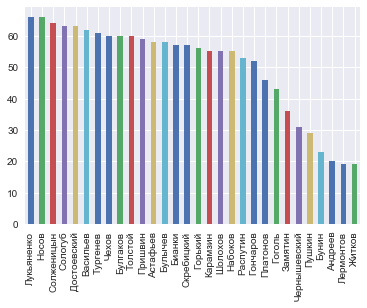

In [17]:
simpleMorphoDF['Author'].value_counts().plot(kind='bar')


In [466]:
global_error_writer = pd.ExcelWriter(os.path.join(directory, 'global_errors.xlsx'),  engine='xlsxwriter')
global_confusion_matrix_write = pd.ExcelWriter(os.path.join(directory, 'global_confusion_matrix.xlsx'),  engine='xlsxwriter')

# Simple Morphology

In [467]:
currentPart = 'Simple Morphology'

simpleMorphoDF = pd.read_csv('OutData/MorphoTags.csv')
print('Shape: {}'.format(simpleMorphoDF.shape))
simpleMorphoDF.head()

Shape: (1506, 21)


,Unnamed: 0,ADJ,ADP,ADV,AUX,CCONJ,DET,INTJ,NOUN,NUM,...,PRON,PROPN,PUNCT,SCONJ,SPACE,SYM,VERB,X,Author,Novel
0,0.003359,0.088371,0.076826,0.054156,0.008186,0.061083,0.014274,0.001469,0.178841,0.005248,...,0.073048,0.023300,0.197733,0.019312,0.00000,0.000000,0.152603,0.007137,Андреев,Ангелочек
1,0.031534,0.098241,0.083081,0.053669,0.009400,0.043966,0.020315,0.000303,0.169193,0.004245,...,0.060036,0.040631,0.192541,0.014857,0.00000,0.000303,0.130685,0.007580,Андреев,Баргамот и Гараська
2,0.030252,0.103828,0.057330,0.065733,0.011204,0.079365,0.015500,0.001120,0.144911,0.008030,...,0.074697,0.012885,0.200373,0.018114,0.00056,0.000000,0.138749,0.009337,Андреев,Бездна
3,0.024113,0.081008,0.076673,0.064752,0.011921,0.068003,0.019236,0.000542,0.160661,0.015443,...,0.059604,0.053644,0.157681,0.025196,0.00000,0.000000,0.138716,0.006502,Андреев,Большой шлем
4,0.029442,0.092934,0.072965,0.056068,0.012545,0.078597,0.012289,0.000512,0.151050,0.004352,...,0.082693,0.024066,0.186892,0.018945,0.00000,0.000000,0.142089,0.005376,Андреев,В подвале


In [468]:
X = simpleMorphoDF.drop(columns=['Author', 'Novel', 'SPACE', simpleMorphoDF.columns[0]], axis=1).values
name_of_features = simpleMorphoDF.drop(columns=['Author', 'Novel', 'SPACE', simpleMorphoDF.columns[0]], axis=1).columns
label_list_by_authors = simpleMorphoDF.Author.values

countOfAuthors = len(simpleMorphoDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))
le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors


In [469]:
le.classes_

array(['Андреев', 'Астафьев', 'Бианки', 'Булгаков', 'Булычев', 'Бунин',
       'Васильев', 'Гоголь', 'Гончаров', 'Горький', 'Достоевский',
       'Житков', 'Замятин', 'Карамзин', 'Лермонтов', 'Лукьяненко',
       'Набоков', 'Носов', 'Платонов', 'Пришвин', 'Пушкин', 'Распутин',
       'Скребицкий', 'Солженицын', 'Сологуб', 'Толстой', 'Тургенев',
       'Чернышевский', 'Чехов', 'Шолохов'], dtype=object)

### Clustering Structure

##### Hopkins statistics

Замечания о примении статистики Хопкина: https://stats.stackexchange.com/questions/332651/validating-cluster-tendency-using-hopkins-statistic
Тест Хопкина проводится итеративно, в качестве порогового значения для отклонения альтернативной гипотезы используется значение 0.5. Таким образом, в случае, если H < 0.5 - это означает, что маловероятно, что D имеет статистически значимые кластера.
Другими словами, чем ближе значение статистики Хопкинса к единице, тем более уверенно мыв можем отклонить нулевую гипотезу и сделать заключение, что набор данных D имеет статистически значимое разбиение на кластера.

Однако, также приводится аргумент, что тест Хопкинса в основном тестирует равномерное распределение в данных (см. ссылку). Малое значение статистики Хопкинса говорит о том, что данные, скорее всего, распределены равномерно (по крайней мере, в рамках текущей нормализации).

В качестве реализации статистики Хопкина был использован вариант: https://matevzkunaver.wordpress.com/2017/06/20/hopkins-test-for-cluster-tendency/

In [470]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8633797229860601
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.21942268908758722
	AMI: 0.3989127428438392


### 3 Folds Cross-Validation

Алён, в списке ```list_of_models``` содержатся ```tuple``` следующего вида: ```(имя классификатора; классификатор)```. В случае, если хочешь попробовать и другие классификаторы, то просто добавь в этот список.

Специфичные методы (например, ```feature_importance``` для ```RandomForestClassifier```) применяются только для соответствующих классификаторов, поэтому добавлено для них дополнительное условие ```isinstance(current_model, RandomForestClassifier)```, поэтому, можно не бояться, что вылетит с ошибкой.

Задал 3 блока для кросс-валидации, иначе графиков будет слишком много :)

Current model: Random Forest
Accuracy  	mean: 0.70185
Precision 	mean: 0.70867
Recall    	mean: 0.70185
f1        	mean: 0.69216


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

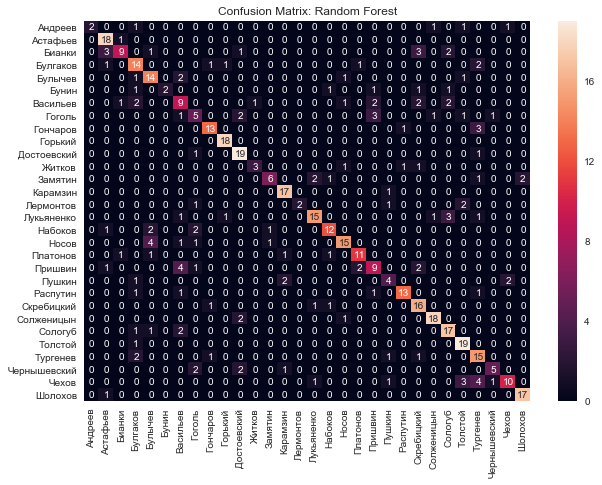

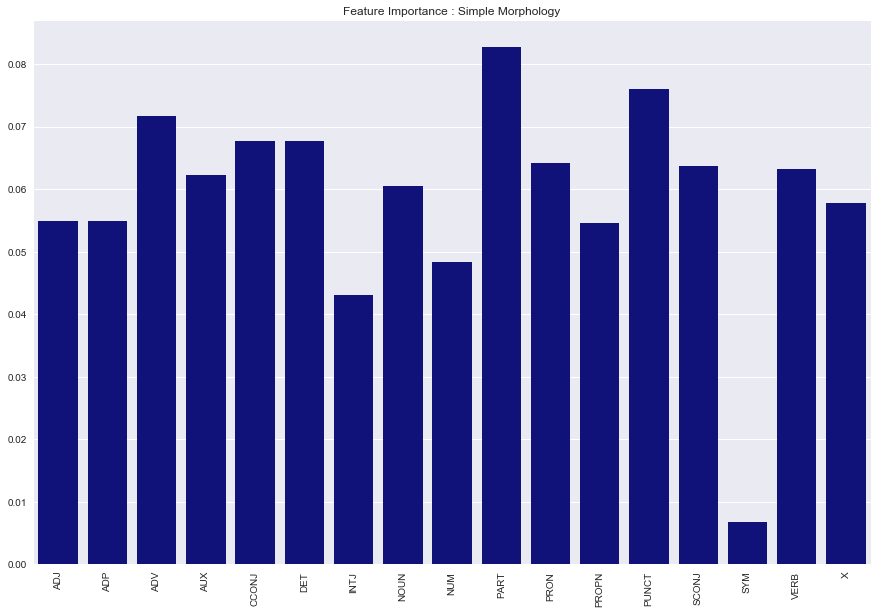

Current model: Logistic Regression
Accuracy  	mean: 0.78606
Precision 	mean: 0.79198
Recall    	mean: 0.78606
f1        	mean: 0.77495


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

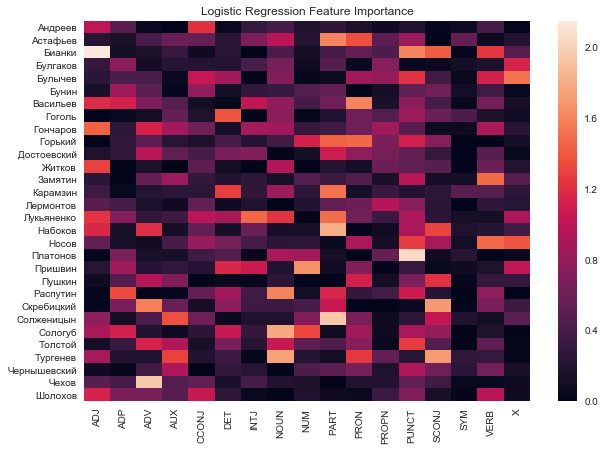

Current model: Linear SVC
Accuracy  	mean: 0.79076
Precision 	mean: 0.79554
Recall    	mean: 0.79076
f1        	mean: 0.78476


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

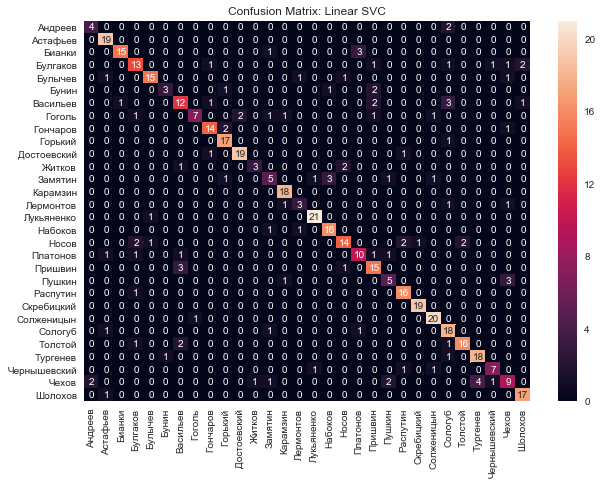

In [471]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

<Figure size 432x288 with 0 Axes>

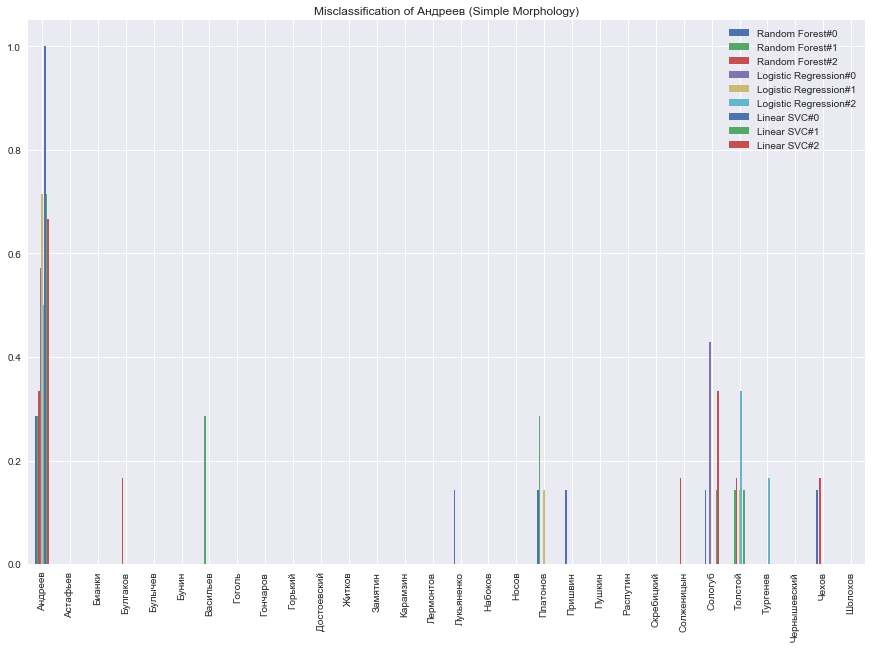

<Figure size 432x288 with 0 Axes>

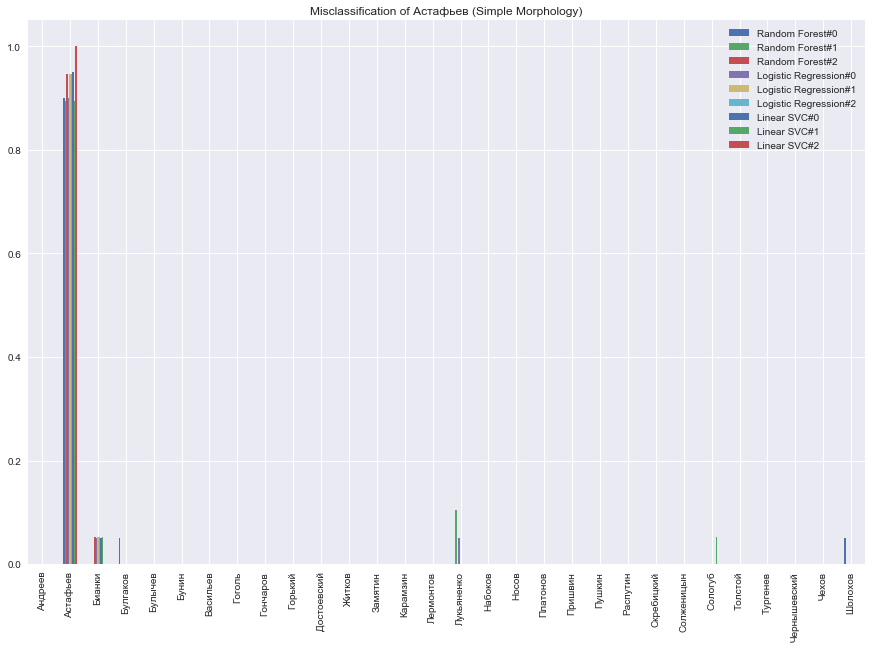

<Figure size 432x288 with 0 Axes>

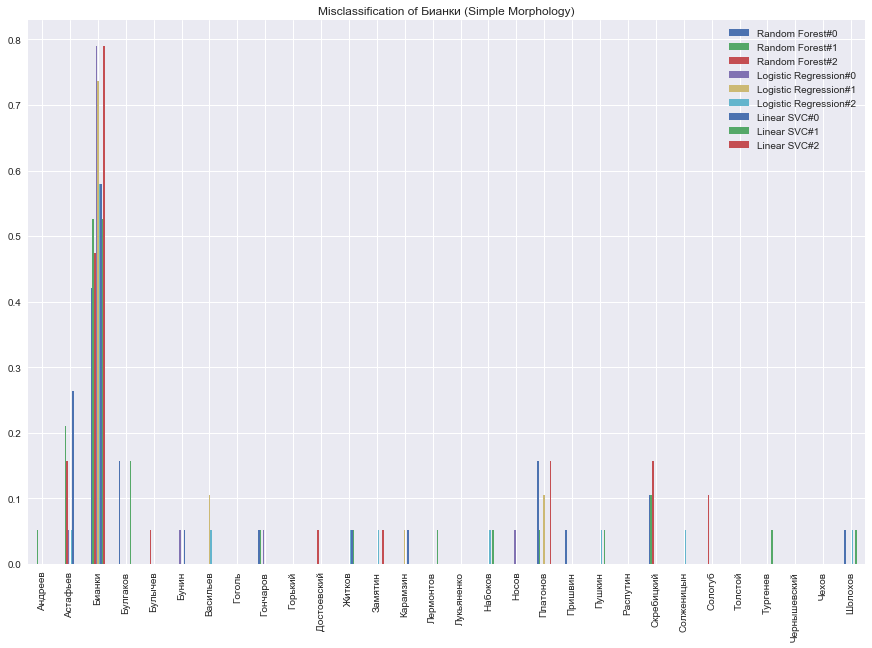

<Figure size 432x288 with 0 Axes>

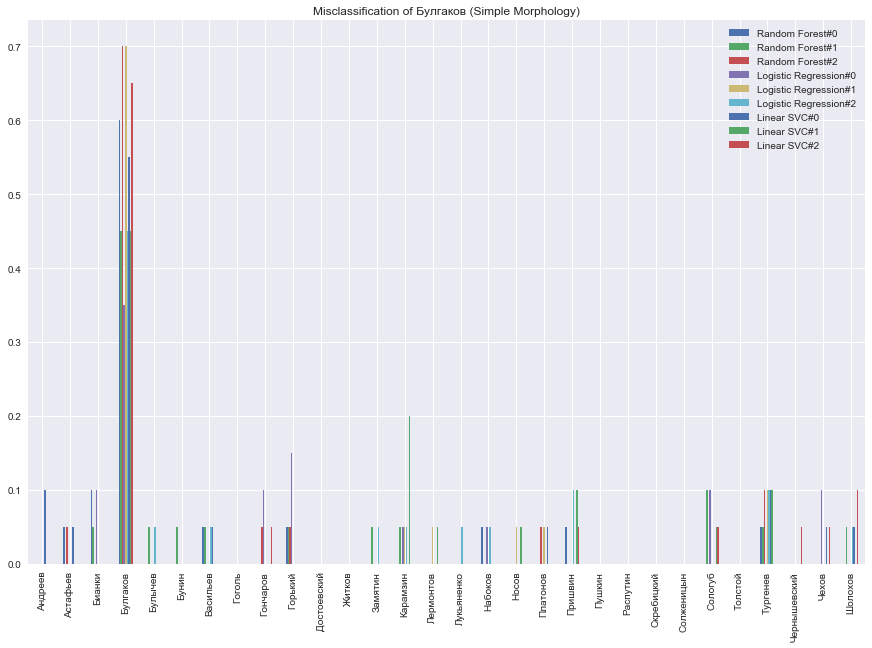

<Figure size 432x288 with 0 Axes>

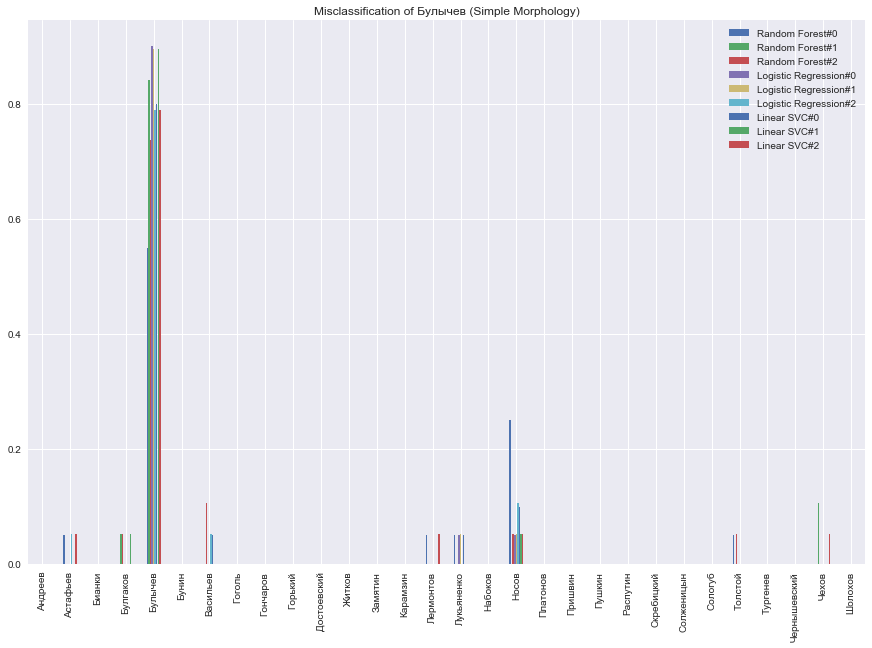

<Figure size 432x288 with 0 Axes>

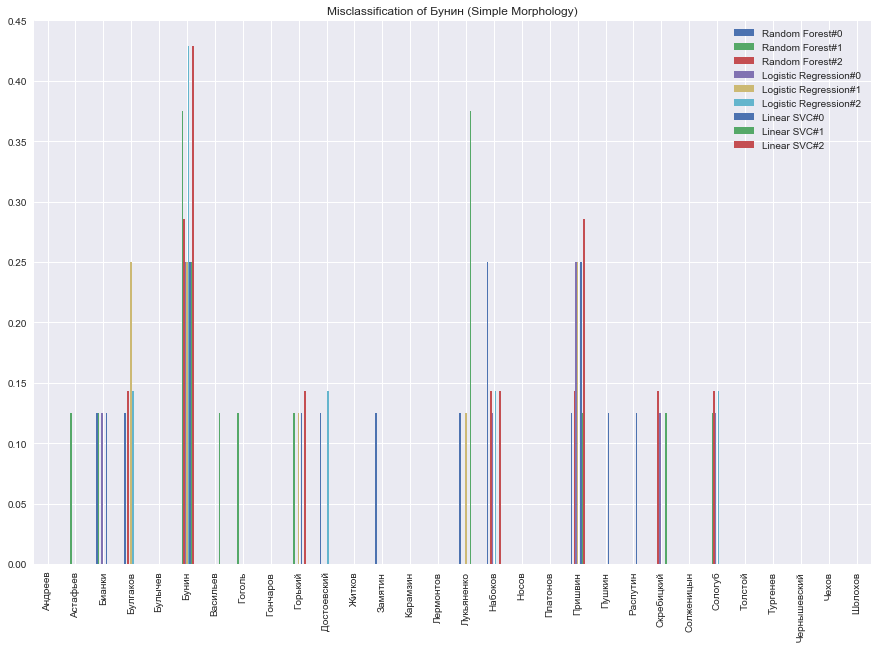

<Figure size 432x288 with 0 Axes>

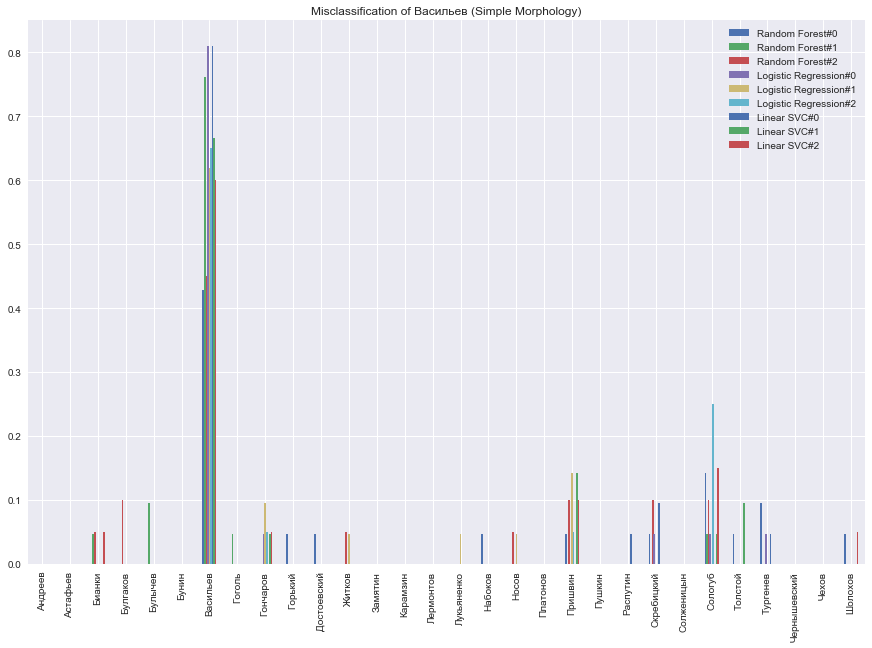

<Figure size 432x288 with 0 Axes>

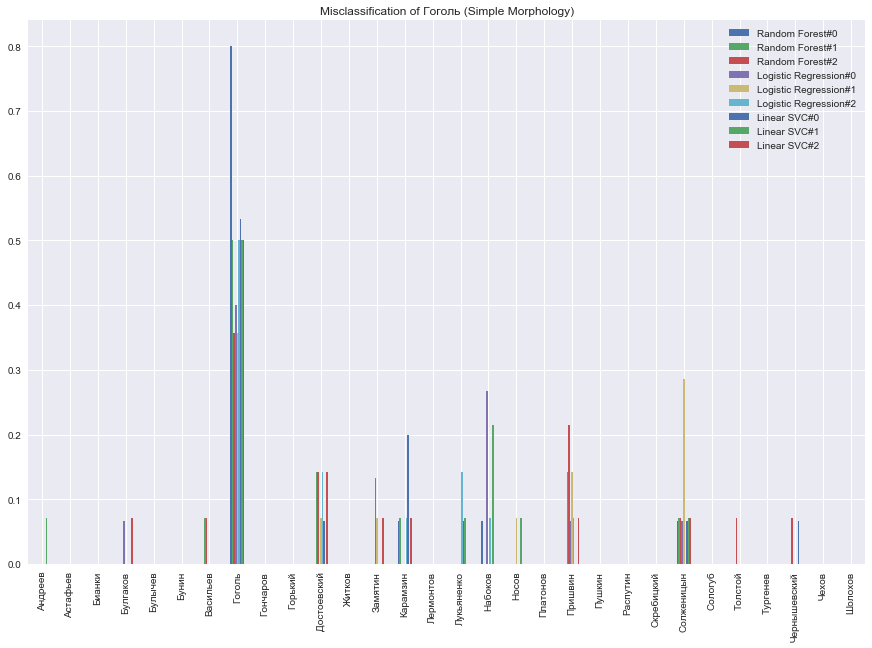

<Figure size 432x288 with 0 Axes>

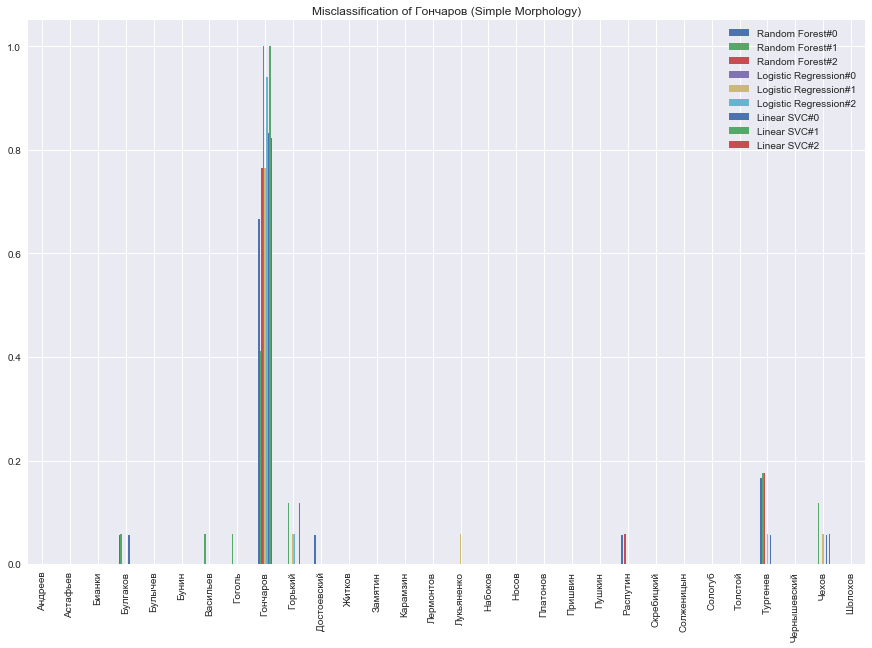

<Figure size 432x288 with 0 Axes>

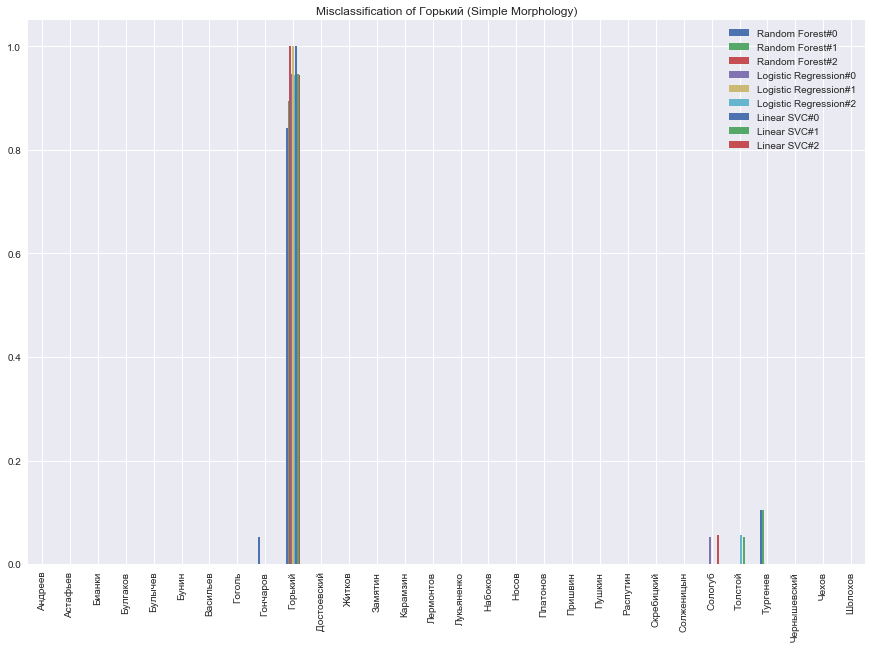

<Figure size 432x288 with 0 Axes>

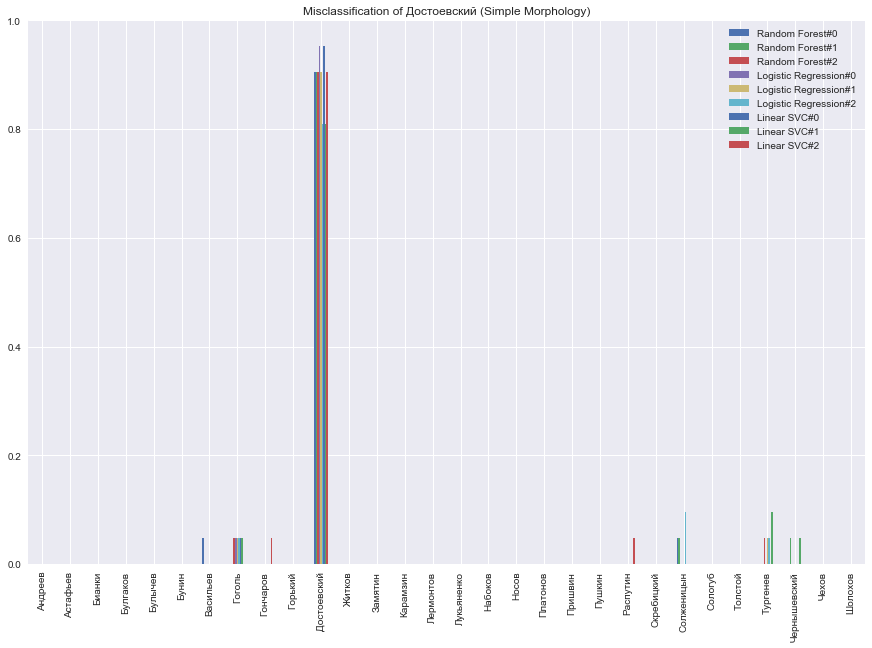

<Figure size 432x288 with 0 Axes>

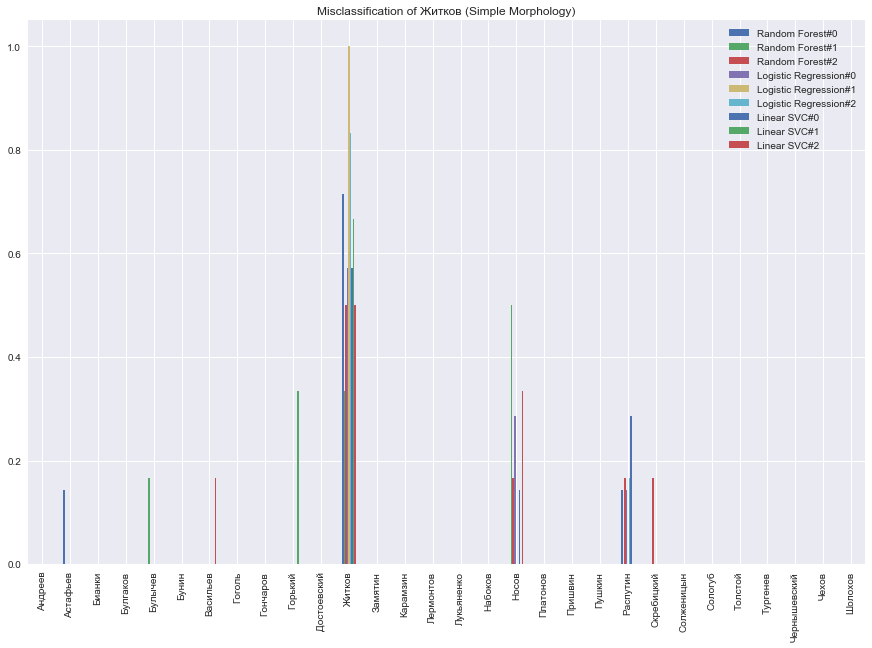

<Figure size 432x288 with 0 Axes>

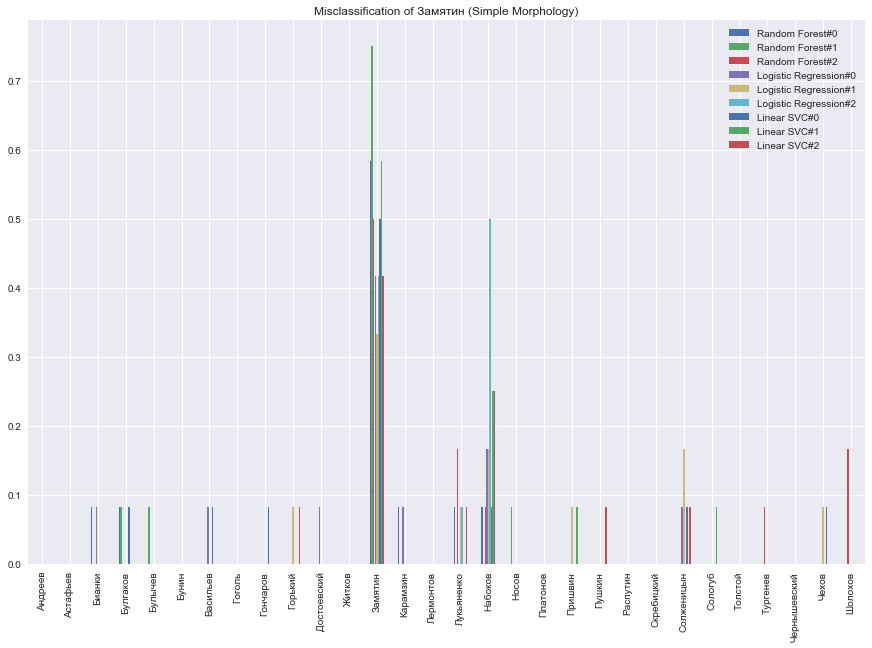

<Figure size 432x288 with 0 Axes>

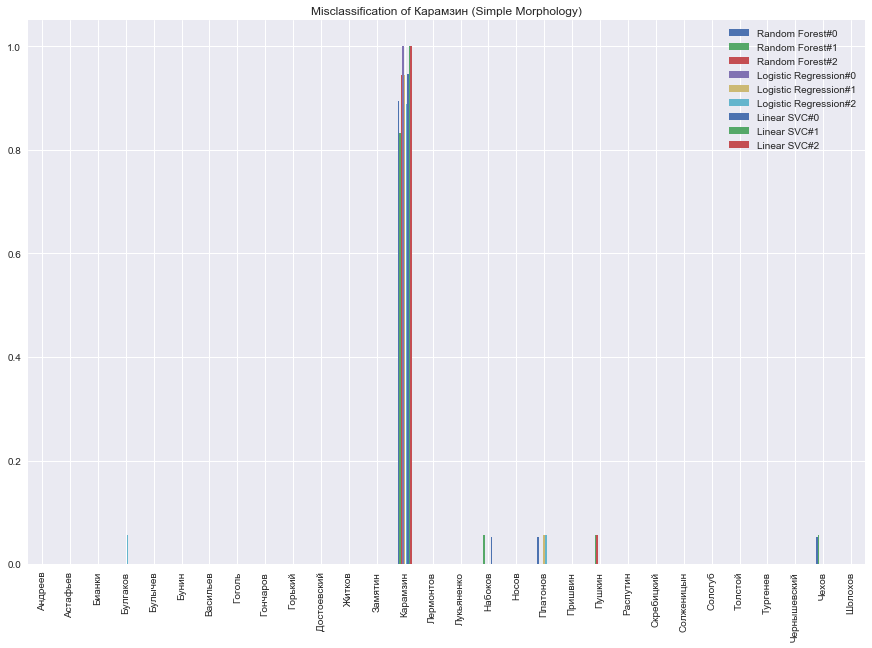

<Figure size 432x288 with 0 Axes>

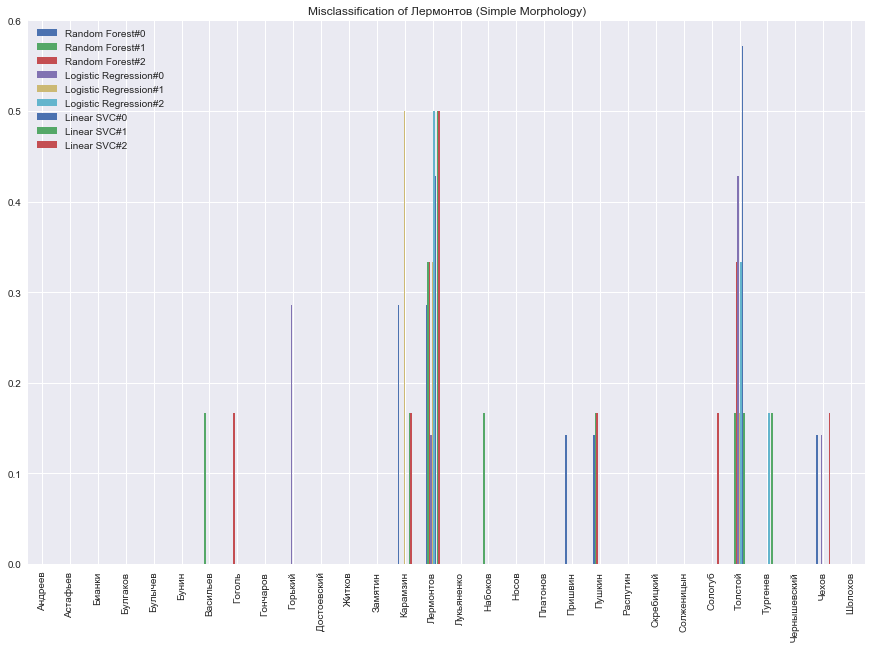

<Figure size 432x288 with 0 Axes>

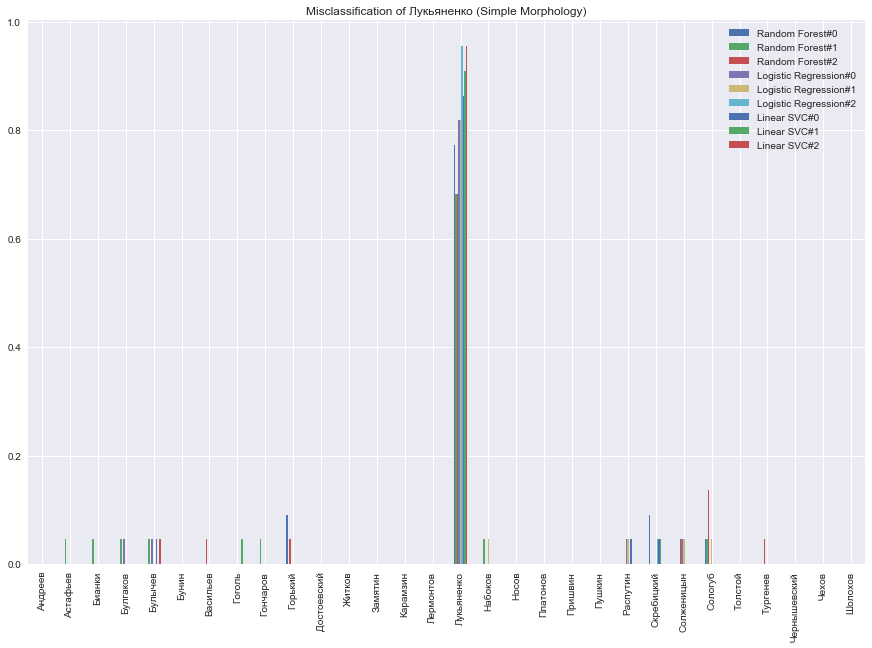

<Figure size 432x288 with 0 Axes>

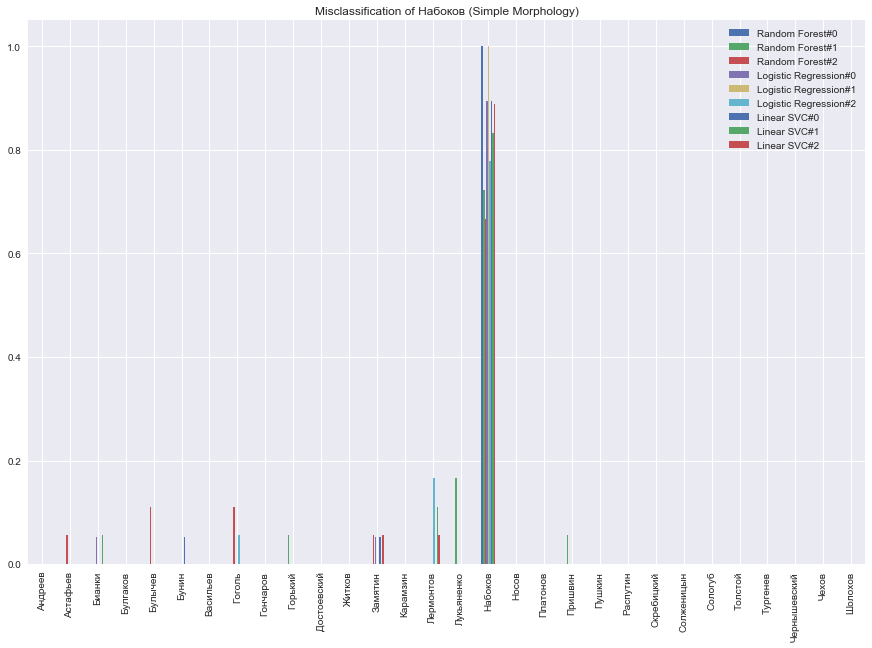

<Figure size 432x288 with 0 Axes>

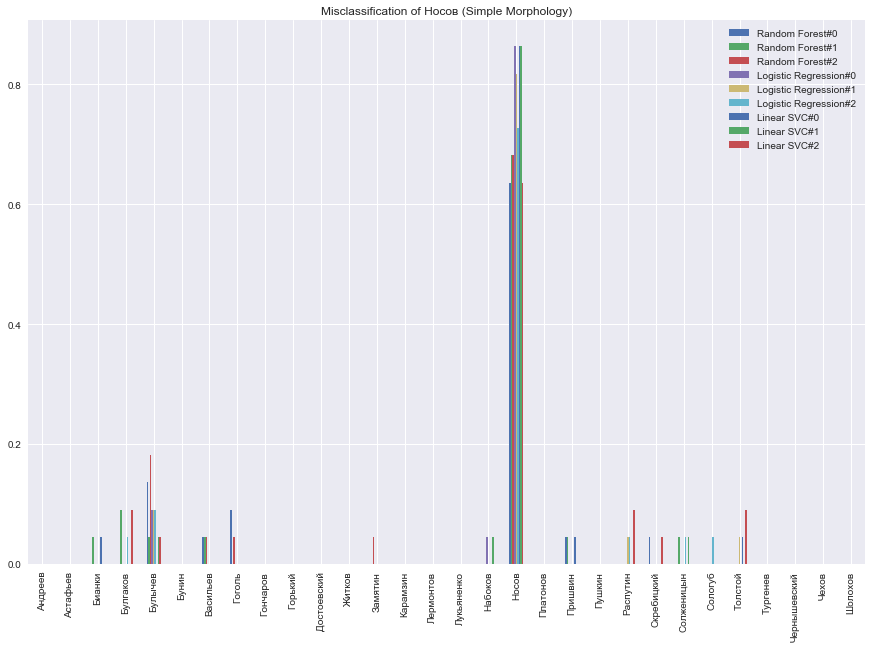

<Figure size 432x288 with 0 Axes>

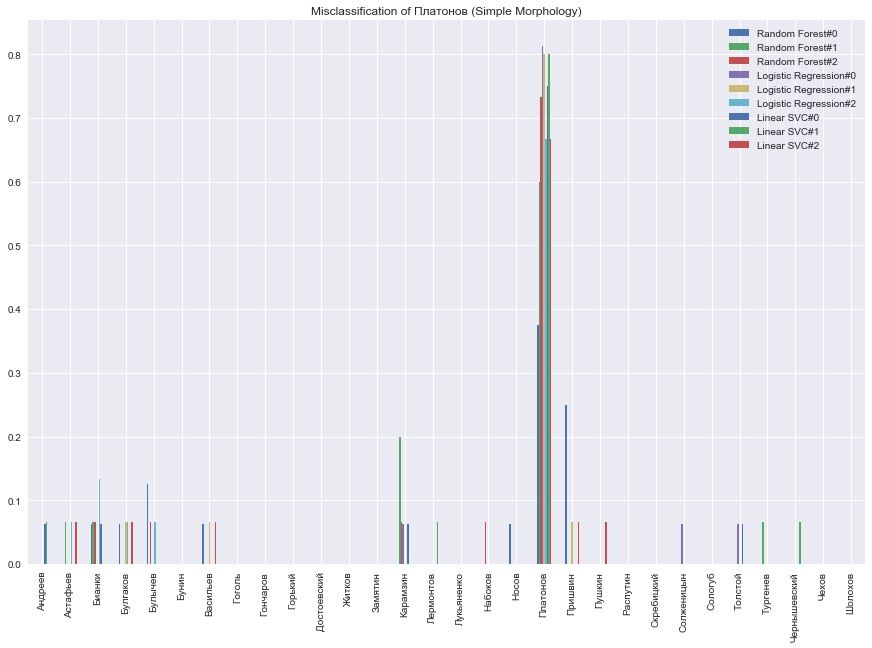

<Figure size 432x288 with 0 Axes>

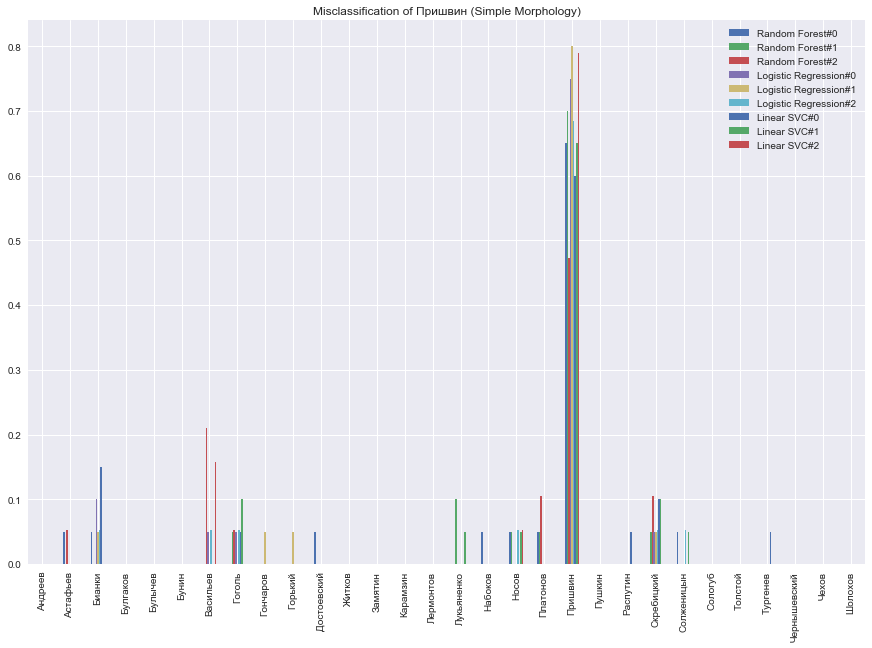

<Figure size 432x288 with 0 Axes>

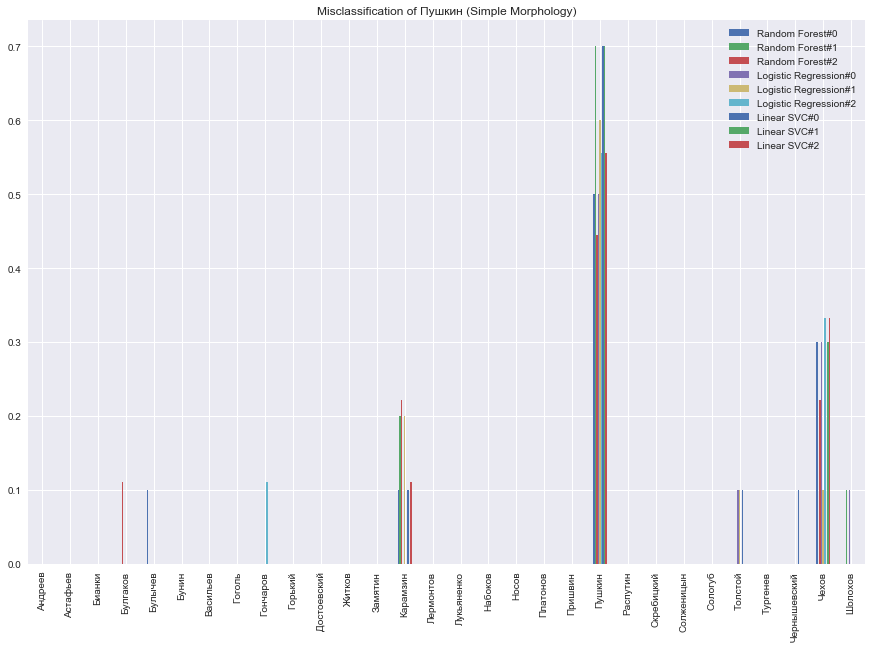

<Figure size 432x288 with 0 Axes>

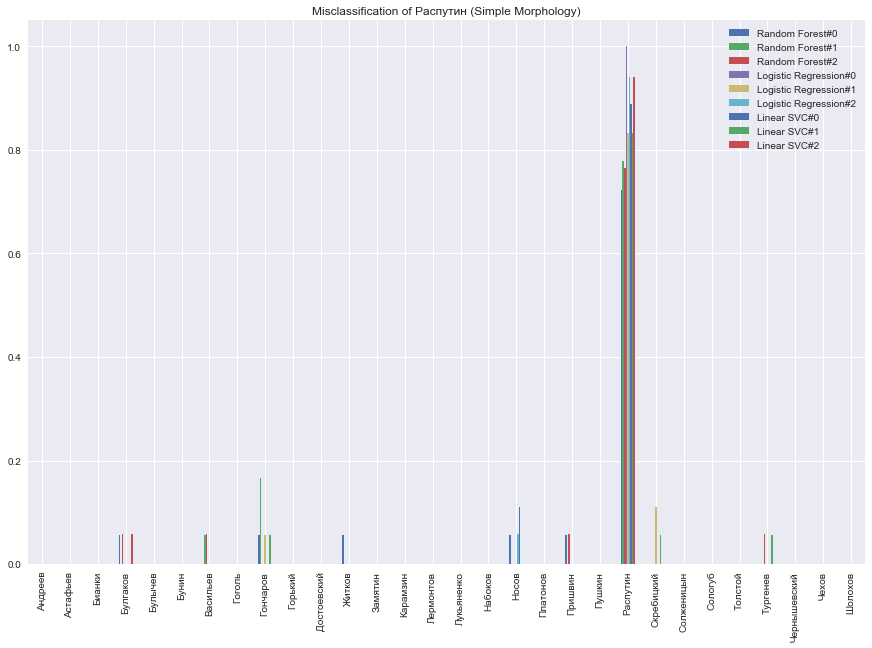

<Figure size 432x288 with 0 Axes>

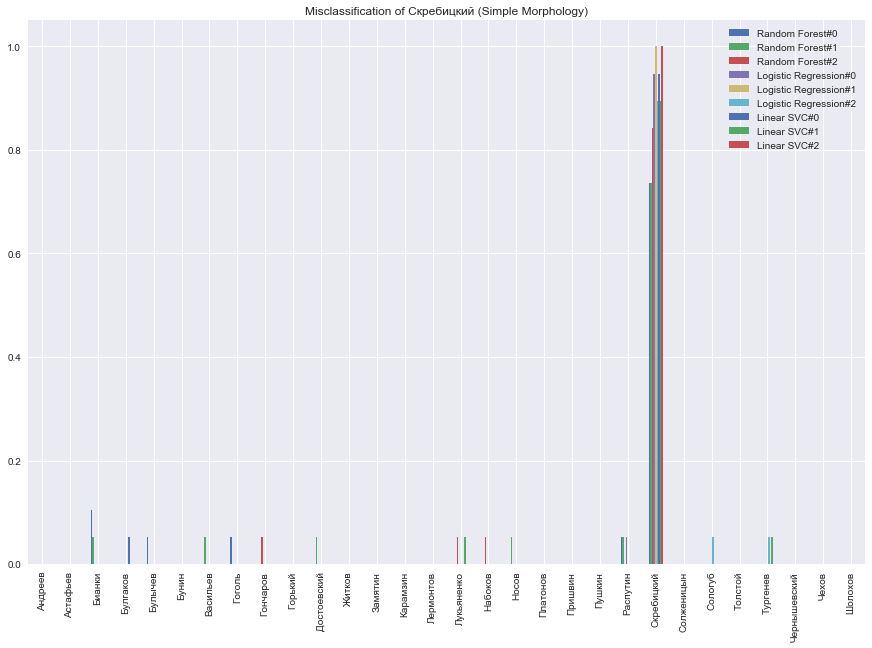

<Figure size 432x288 with 0 Axes>

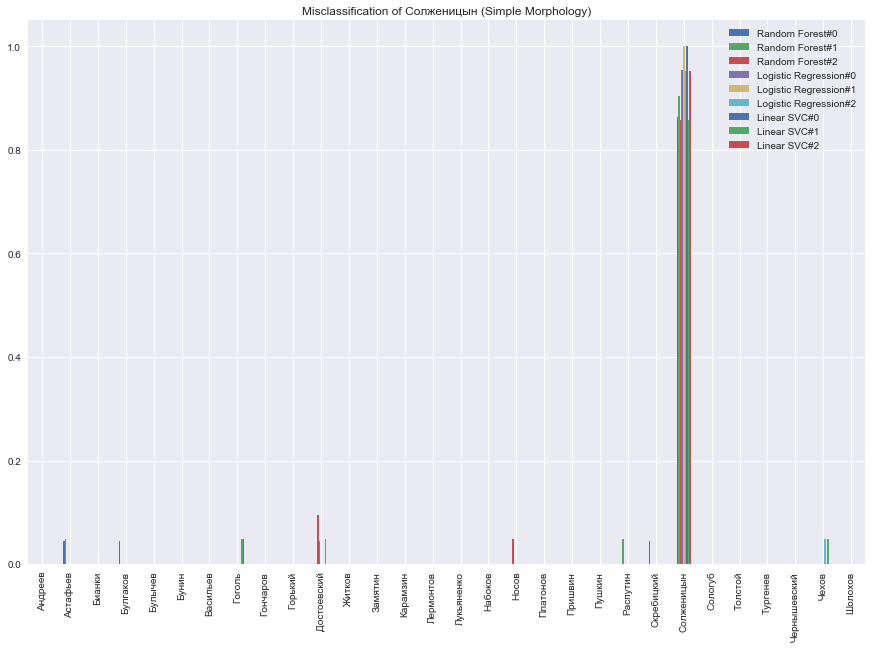

<Figure size 432x288 with 0 Axes>

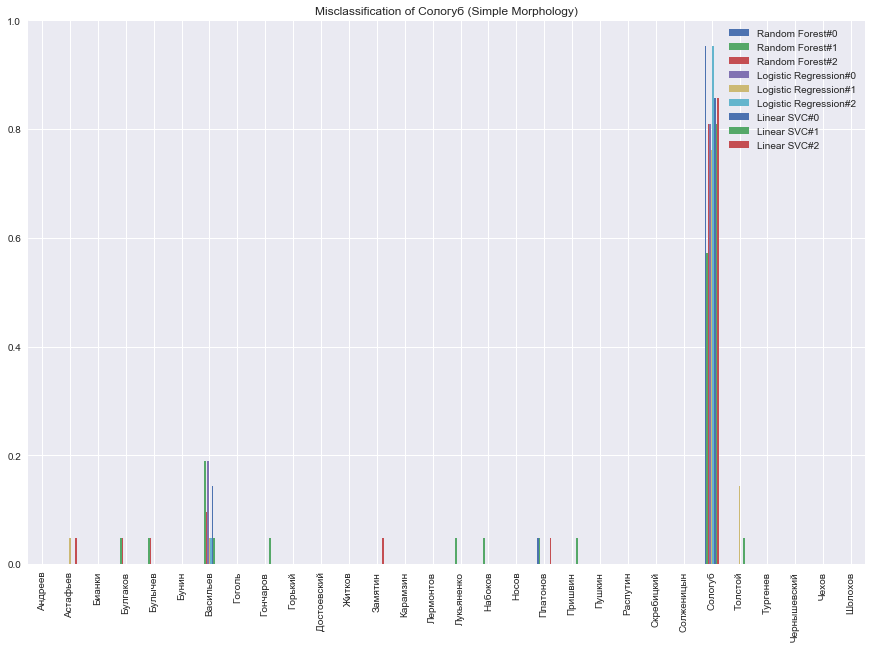

<Figure size 432x288 with 0 Axes>

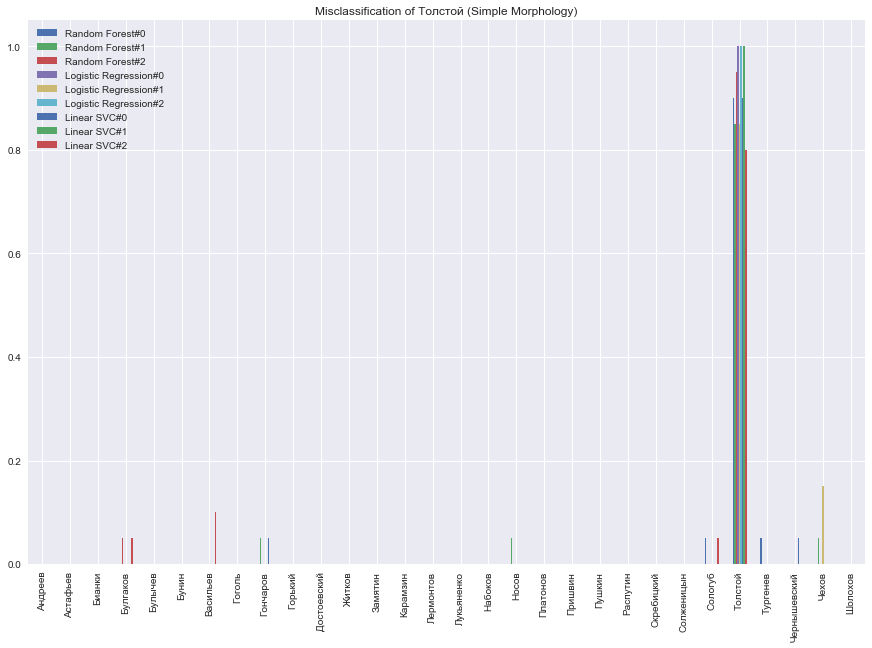

<Figure size 432x288 with 0 Axes>

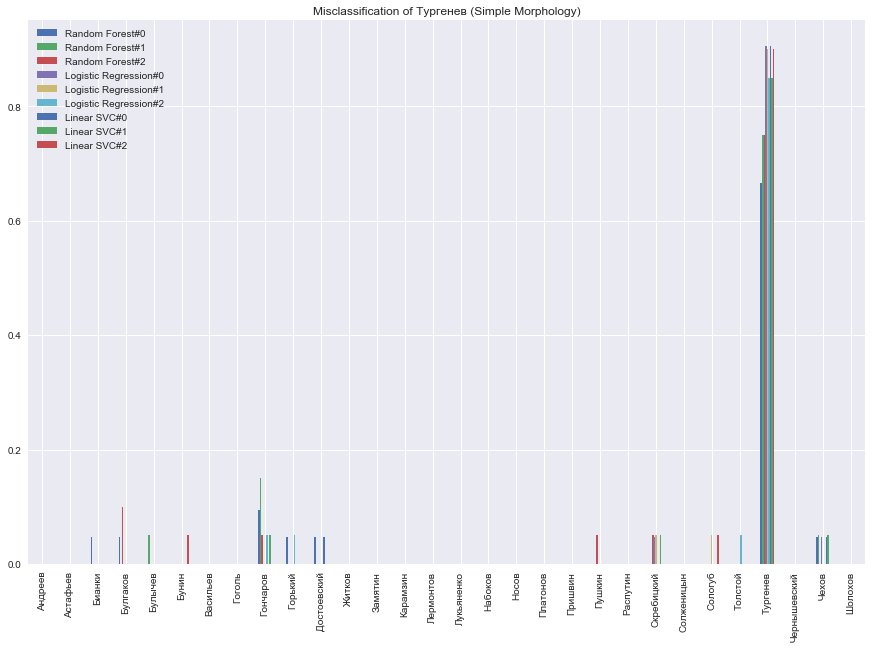

<Figure size 432x288 with 0 Axes>

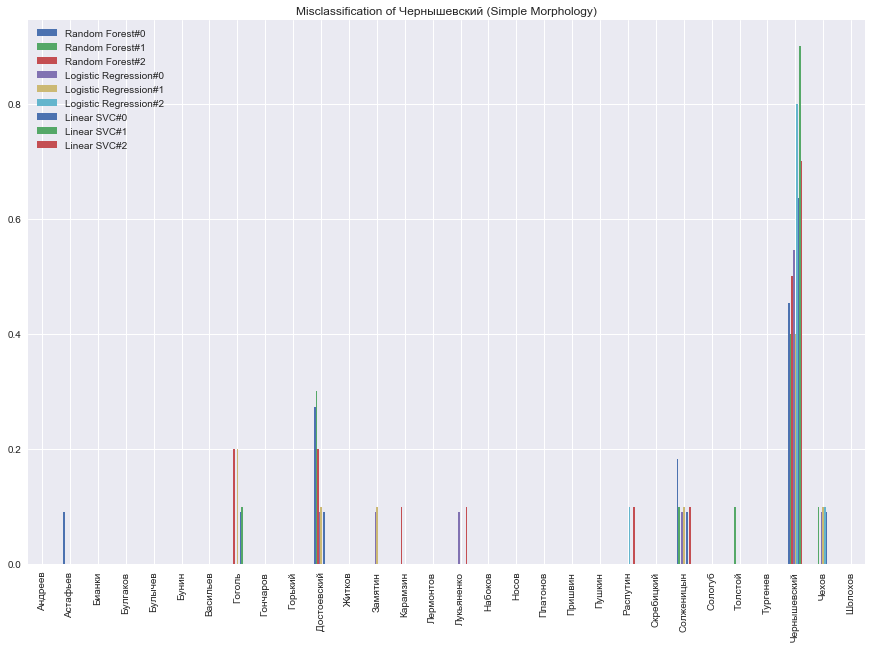

<Figure size 432x288 with 0 Axes>

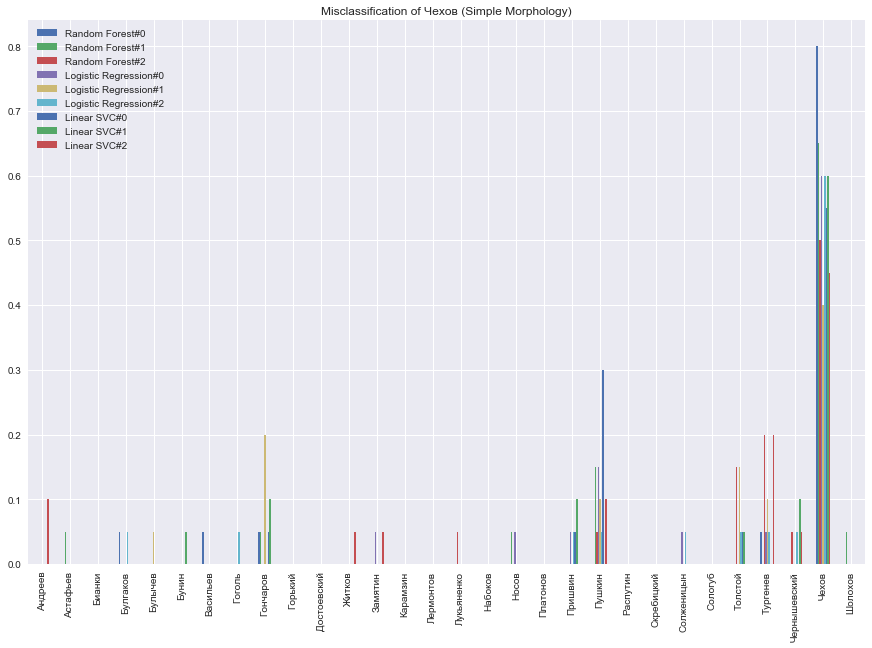

<Figure size 432x288 with 0 Axes>

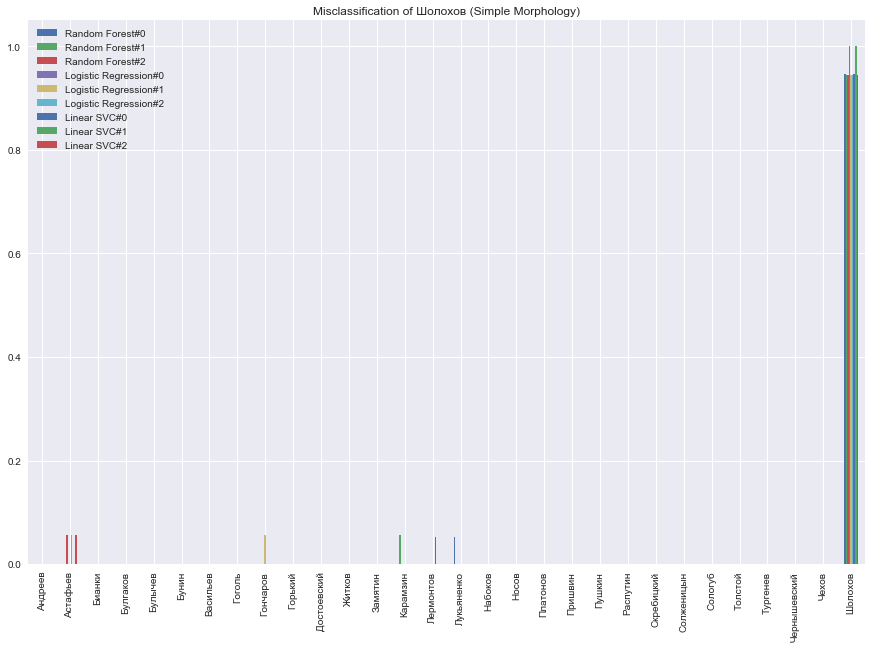

In [472]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [473]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [474]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

In [475]:
statStructure

defaultdict(dict,
            {'Simple Morphology': {'Hopkins': 0.8633797229860601,
              'ARS': 0.21942268908758722,
              'AMI': 0.3989127428438392,
              'Random Forest': {'Accuracy': 0.7018525530263191,
               'Precision': 0.7086654474011214,
               'Recall': 0.7018525530263191,
               'f1': 0.6921590438373871},
              'Logistic Regression': {'Accuracy': 0.7860585401600312,
               'Precision': 0.7919828125629196,
               'Recall': 0.7860585401600312,
               'f1': 0.774952149097541},
              'Linear SVC': {'Accuracy': 0.7907630702479285,
               'Precision': 0.7955411546852239,
               'Recall': 0.7907630702479285,
               'f1': 0.7847614356547045}},
             'Complex Morphology': {'Hopkins': 0.8206763774157005,
              'ARS': 0.14514576578034744,
              'AMI': 0.328771617170937,
              'Random Forest': {'Accuracy': 0.5594125502321652,
               'Prec

# Complex Morphology

In [476]:
currentPart = 'Complex Morphology'

extendedMorphoDF = pd.read_csv('OutData/ExtendedMorpho.csv')
print('Shape: {}'.format(extendedMorphoDF.shape))
extendedMorphoDF.head()

Shape: (1506, 18)


,Абстрактность,Будущее,Динамичность,Местоименная замена,Настоящее,Обобщенность действия,Описательность,Описательность действия,Пассив,Предметность,Признак действия,Прошедшее,Реальная модальность,Совершенность действия,Состояние,Численность,Author,Novel
0,0.160285,0.108844,0.296920,0.313892,0.103741,0.019971,0.493320,0.254926,0.467391,0.337751,0.295292,0.787415,0.957483,0.450680,0.012536,0.011305,Андреев,Ангелочек
1,0.231467,0.110749,0.264293,0.309055,0.188925,0.020599,0.545322,0.313808,0.465517,0.274002,0.280899,0.700326,0.967427,0.374593,0.015642,0.005848,Андреев,Баргамот и Гараська
2,0.177638,0.056667,0.288829,0.401316,0.076667,0.002225,0.655213,0.413959,0.257143,0.305938,0.382647,0.866667,0.968333,0.473333,0.013083,0.027251,Андреев,Бездна
3,0.169300,0.059908,0.261773,0.252717,0.059908,0.018033,0.501906,0.368231,0.636364,0.339797,0.334426,0.880184,0.993088,0.359447,0.006925,0.041931,Андреев,Большой шлем
4,0.195986,0.110132,0.287671,0.381791,0.105727,0.009983,0.558739,0.333876,0.404255,0.310959,0.341098,0.784141,0.955947,0.409692,0.012329,0.014327,Андреев,В подвале


In [477]:
X = extendedMorphoDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = extendedMorphoDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = extendedMorphoDF.Author.values

countOfAuthors = len(simpleMorphoDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors


##### Hopkins stats

In [478]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8203129690108217
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.12547472071982196
	AMI: 0.3121247626931725


Current model: Random Forest
Accuracy  	mean: 0.57241
Precision 	mean: 0.57187
Recall    	mean: 0.57241
f1        	mean: 0.55999


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

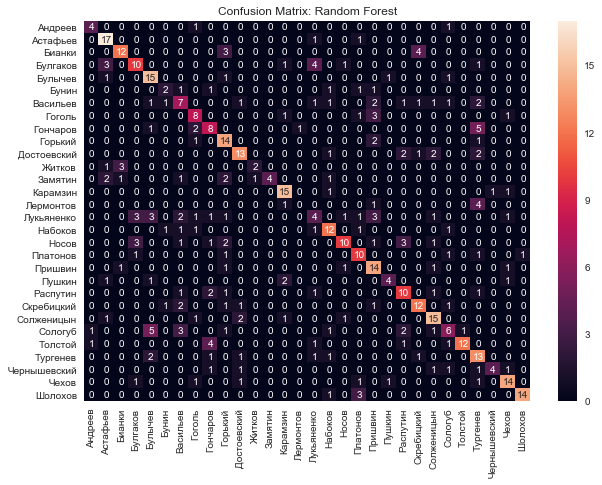

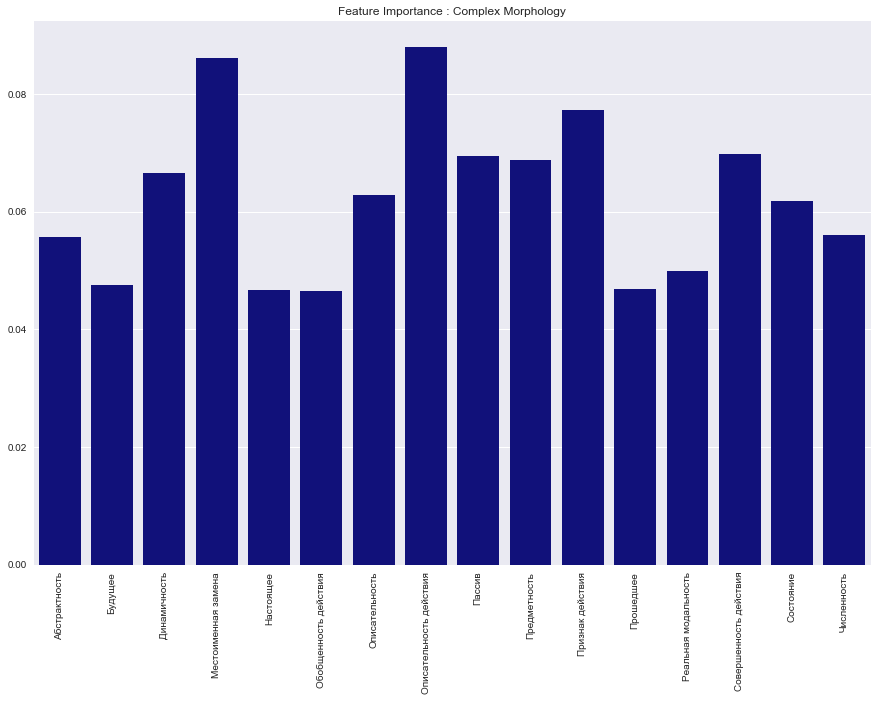

Current model: Logistic Regression
Accuracy  	mean: 0.63463
Precision 	mean: 0.62783
Recall    	mean: 0.63463
f1        	mean: 0.62159


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

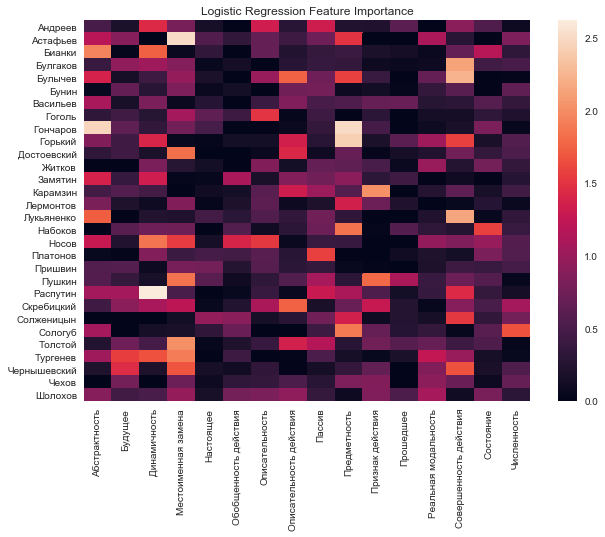

Current model: Linear SVC
Accuracy  	mean: 0.62717
Precision 	mean: 0.62279
Recall    	mean: 0.62717
f1        	mean: 0.61384


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

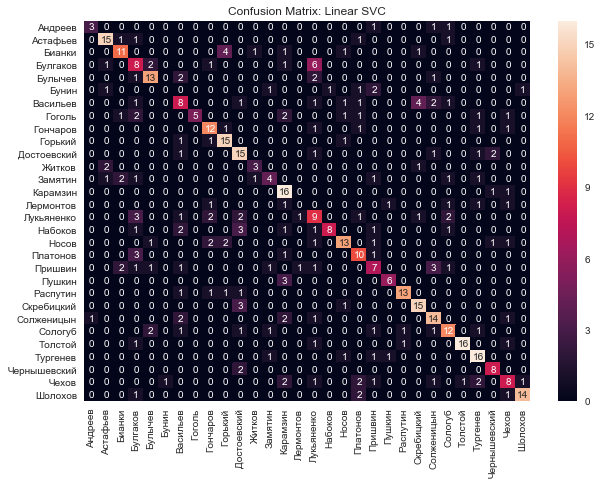

In [479]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

# Сложная морфология. Гистограмма распределения ошибочных предсказаний.

<Figure size 432x288 with 0 Axes>

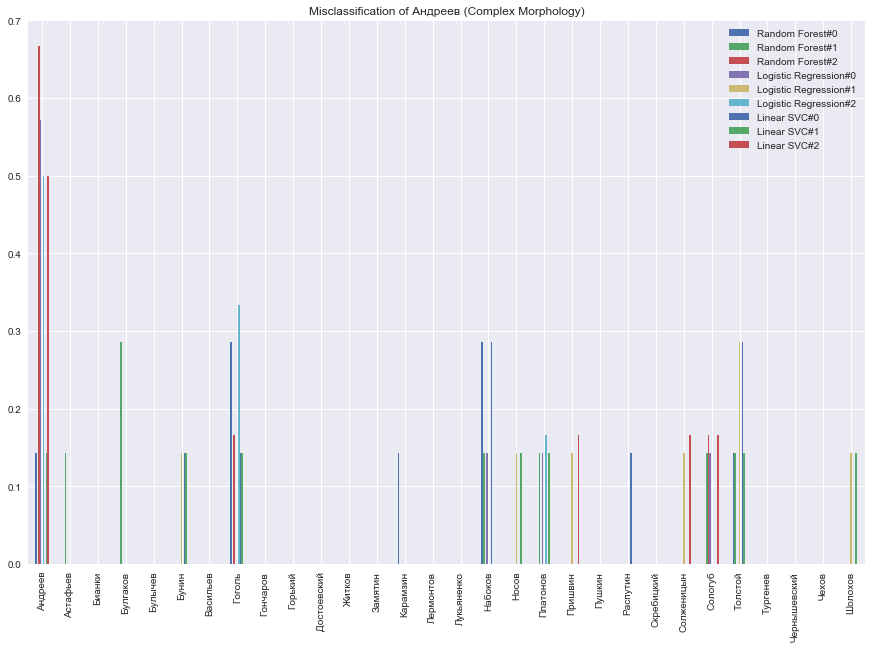

<Figure size 432x288 with 0 Axes>

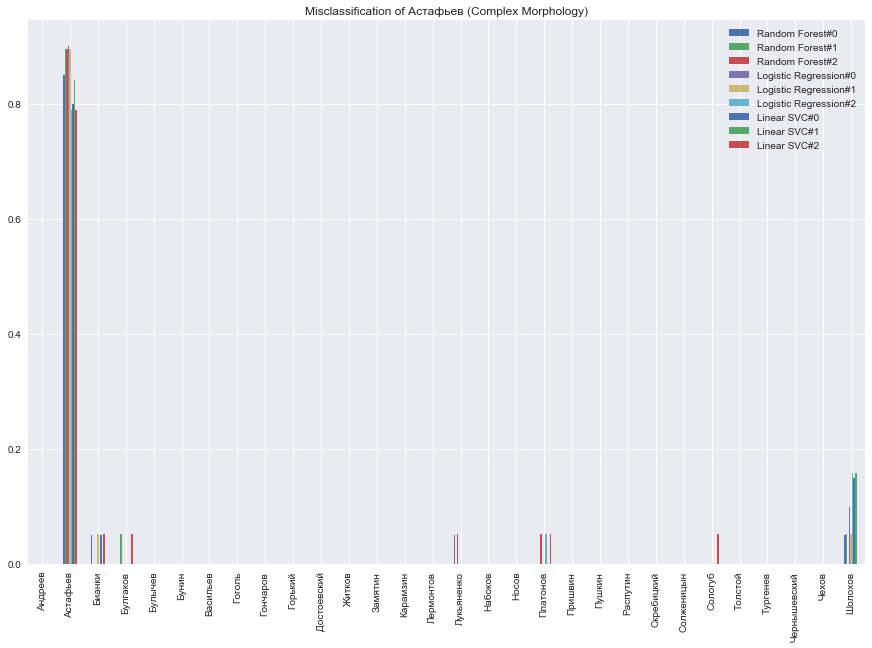

<Figure size 432x288 with 0 Axes>

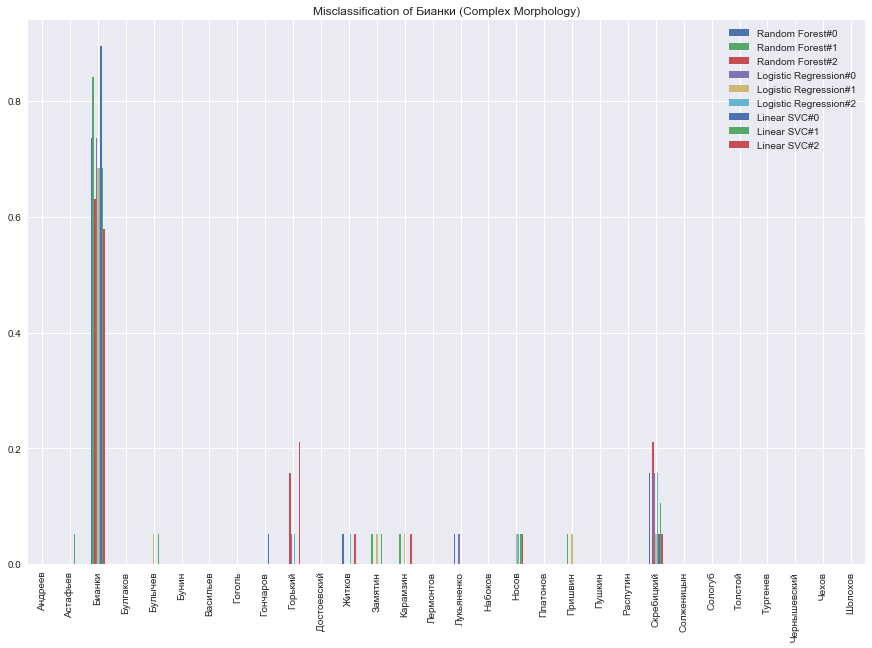

<Figure size 432x288 with 0 Axes>

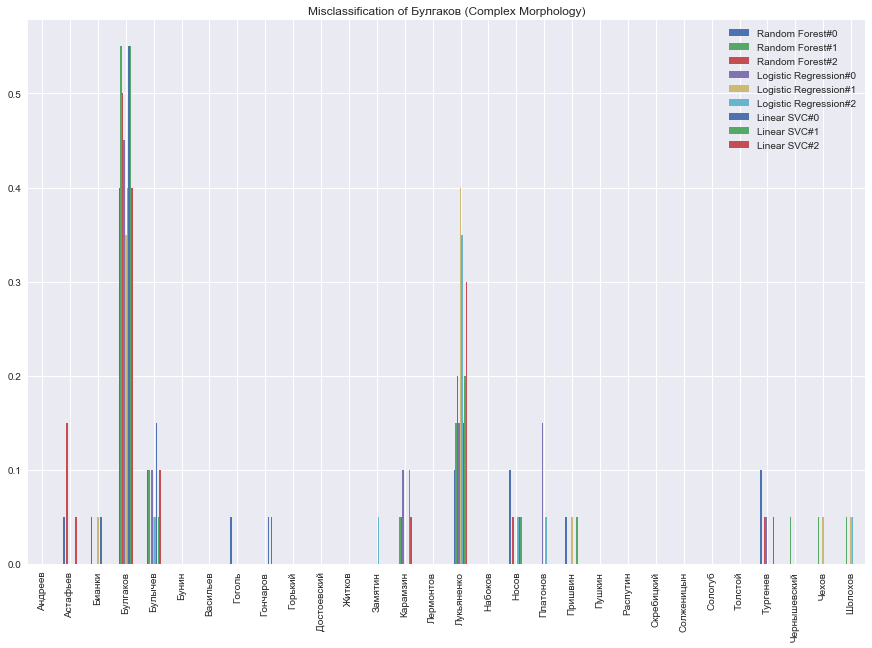

<Figure size 432x288 with 0 Axes>

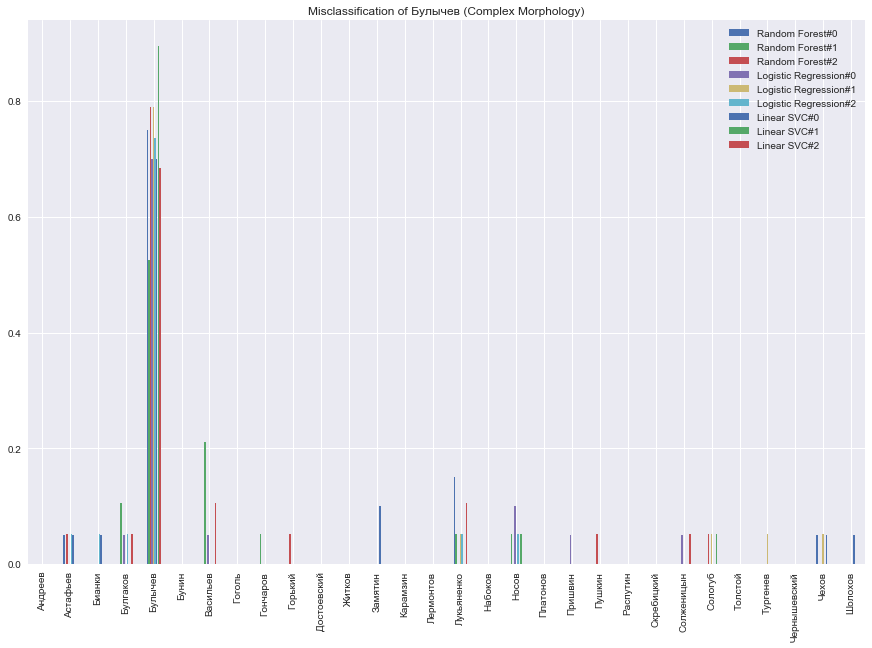

<Figure size 432x288 with 0 Axes>

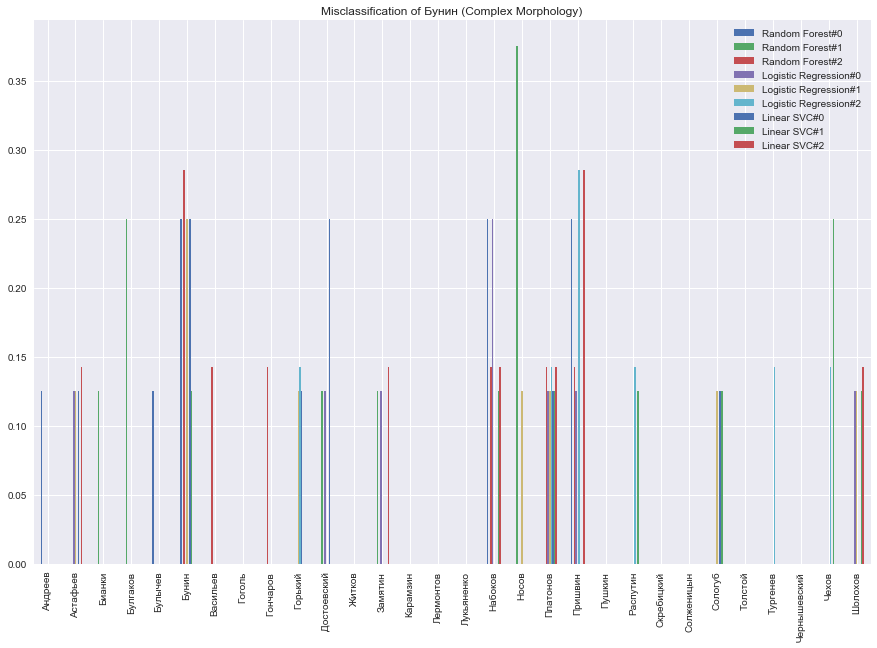

<Figure size 432x288 with 0 Axes>

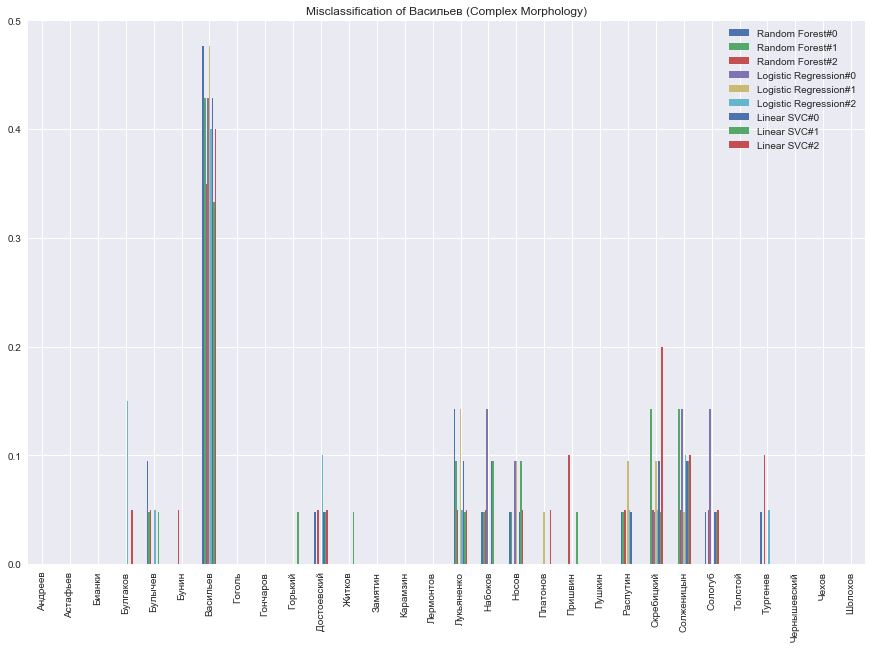

<Figure size 432x288 with 0 Axes>

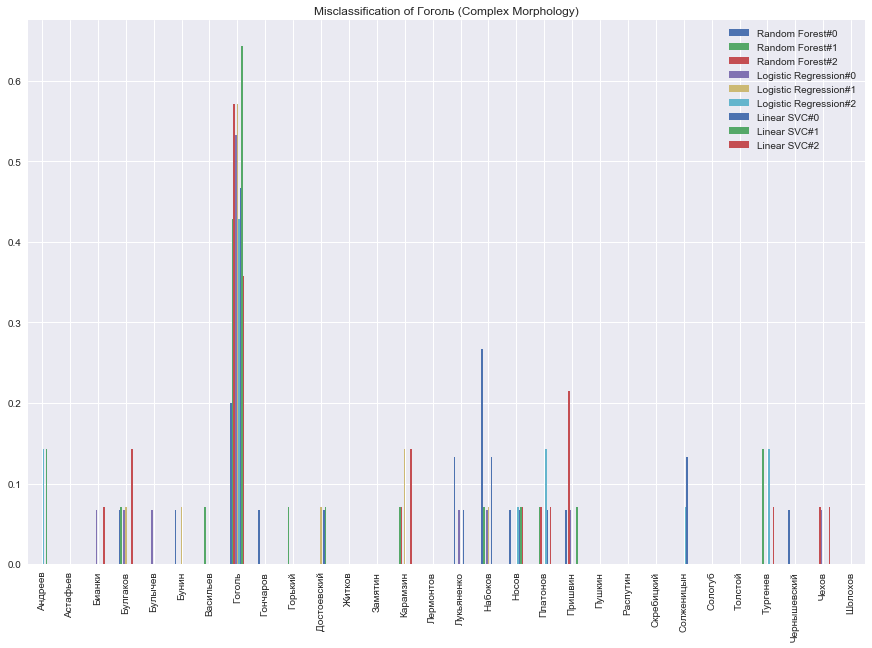

<Figure size 432x288 with 0 Axes>

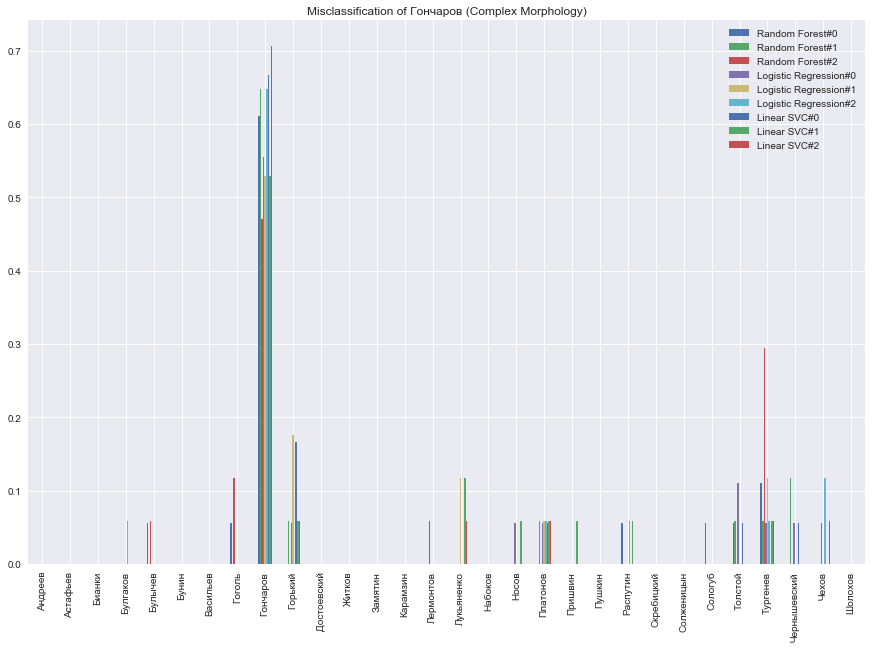

<Figure size 432x288 with 0 Axes>

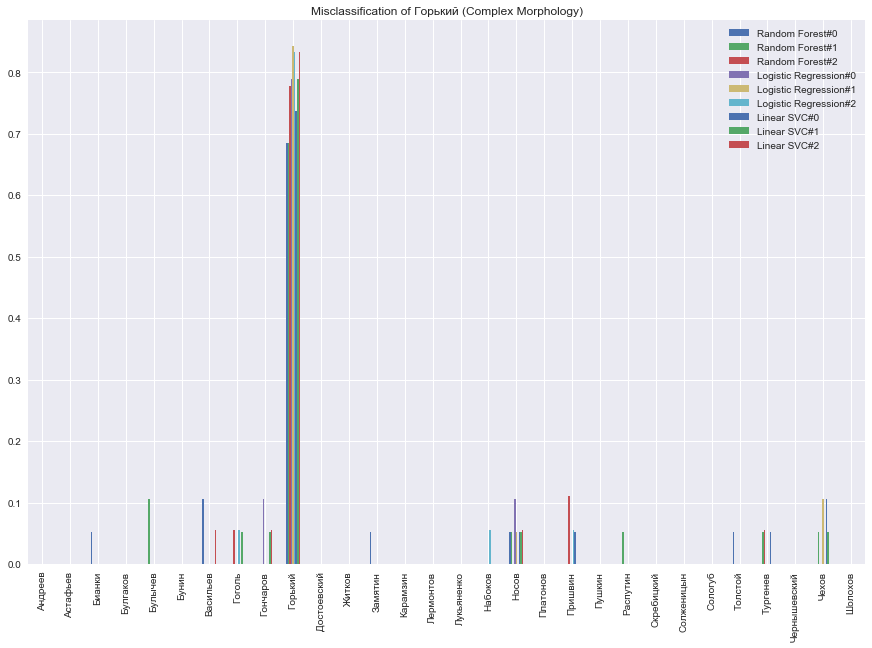

<Figure size 432x288 with 0 Axes>

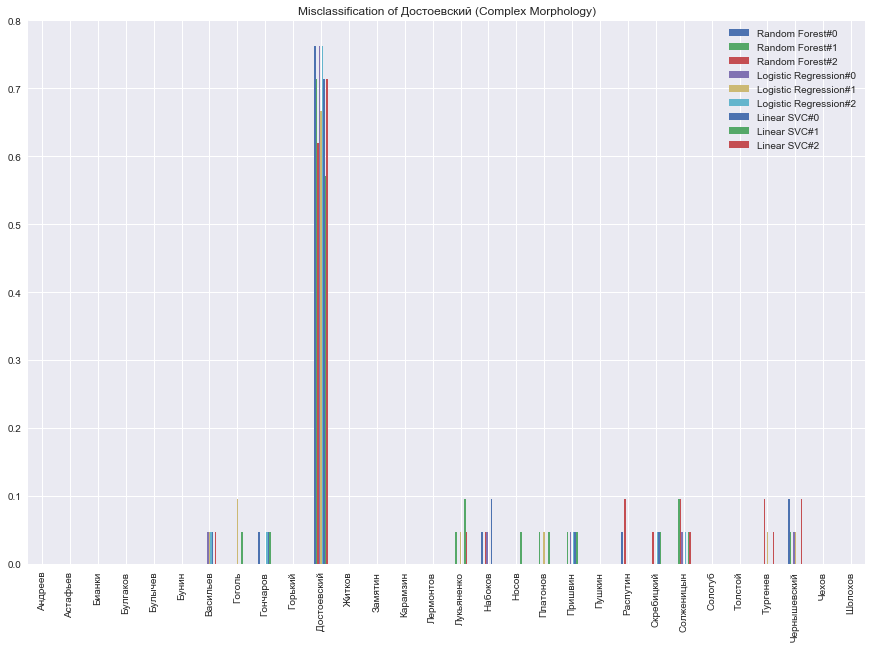

<Figure size 432x288 with 0 Axes>

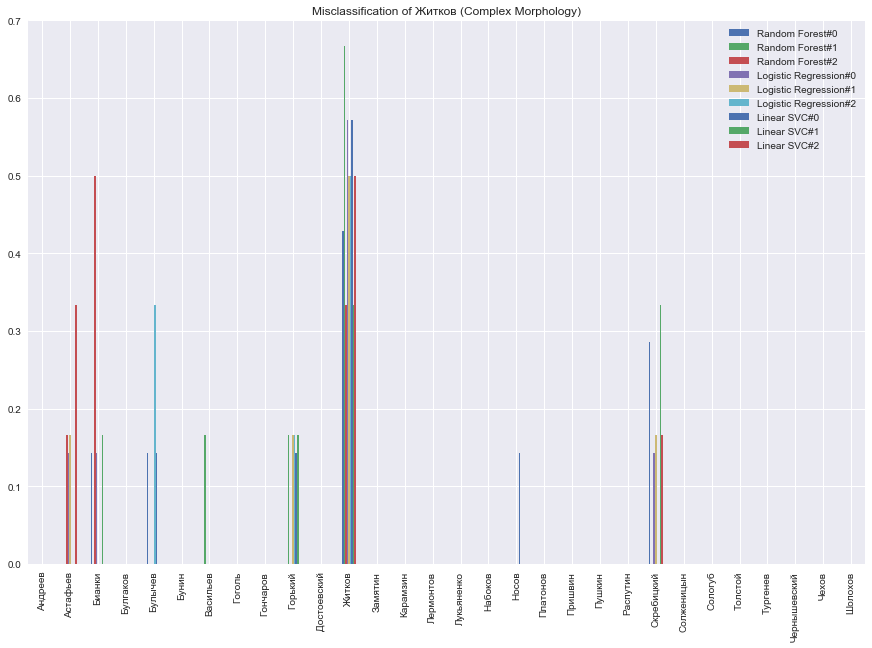

<Figure size 432x288 with 0 Axes>

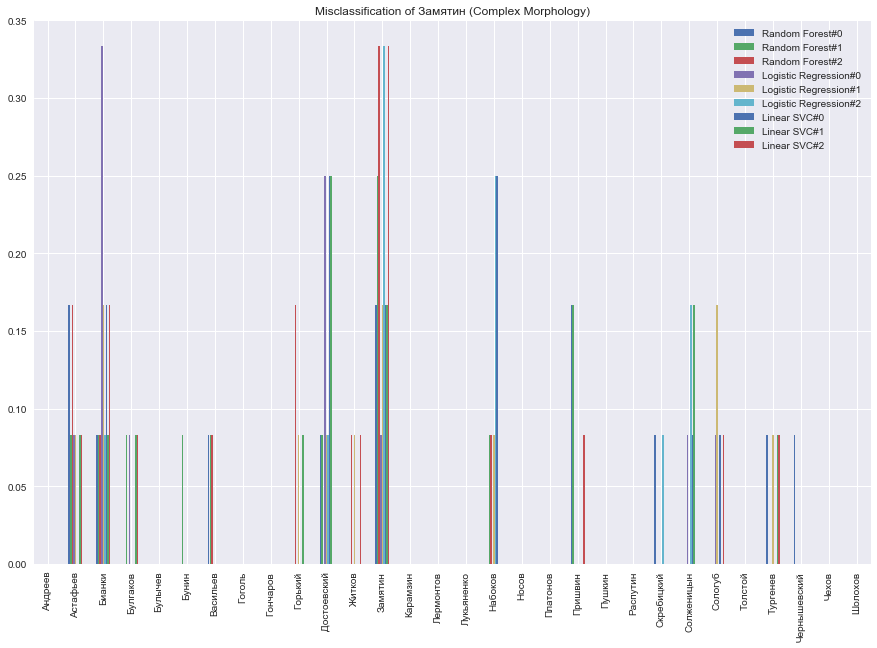

<Figure size 432x288 with 0 Axes>

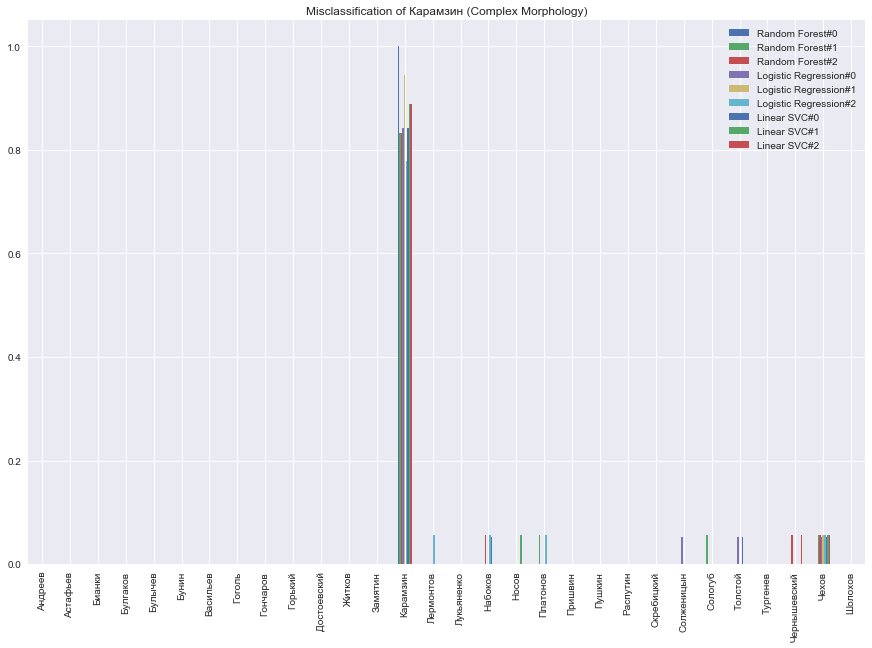

<Figure size 432x288 with 0 Axes>

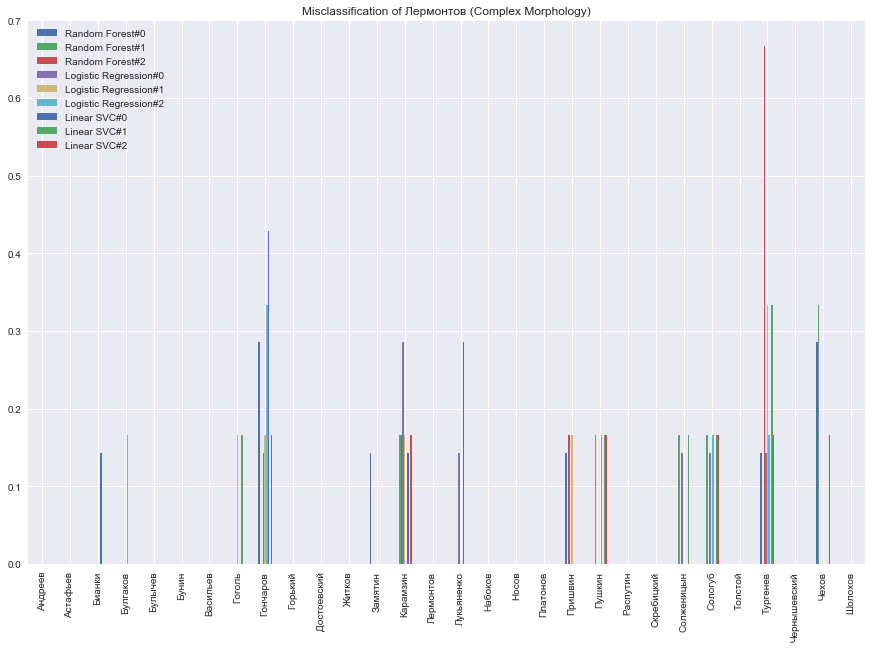

<Figure size 432x288 with 0 Axes>

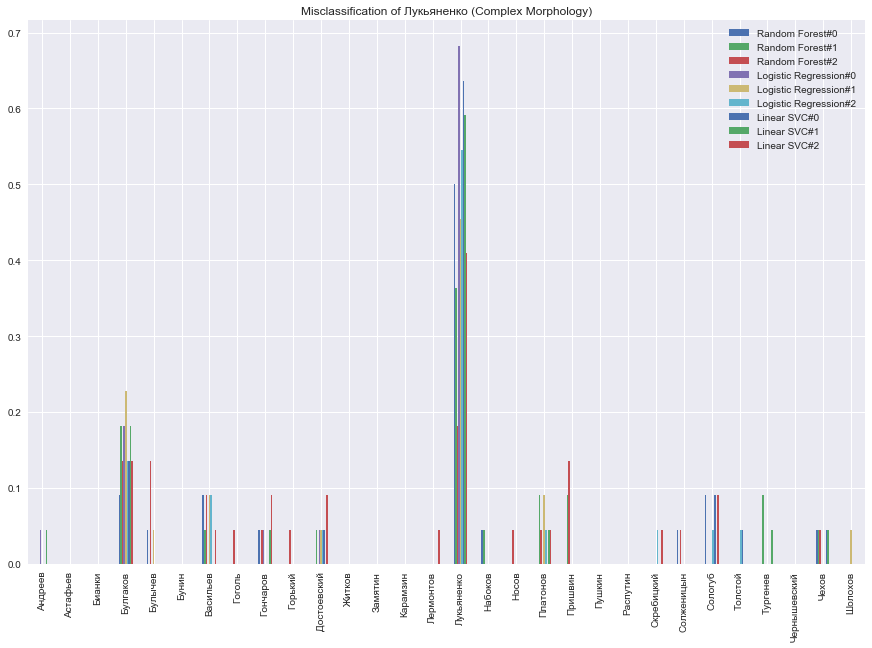

<Figure size 432x288 with 0 Axes>

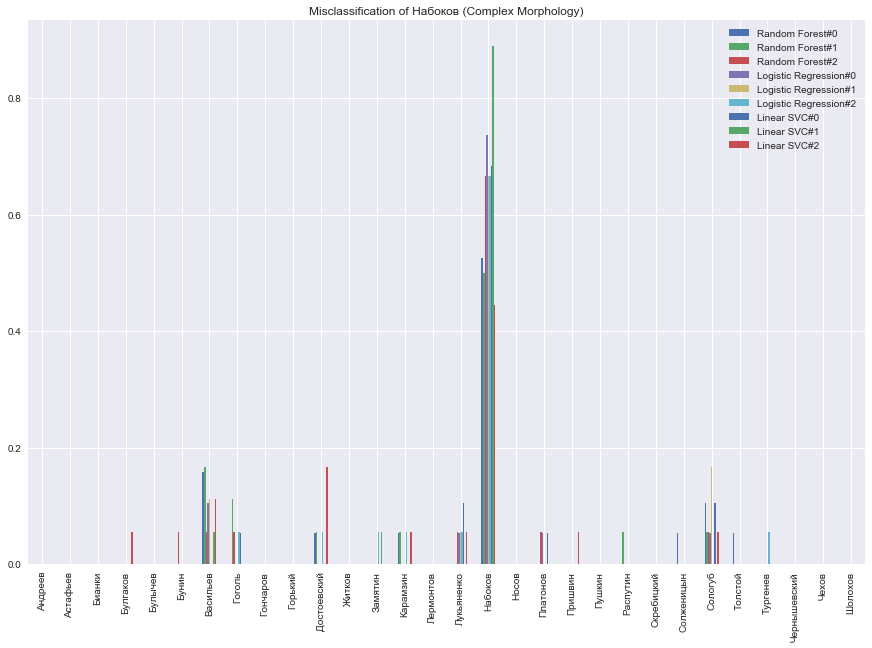

<Figure size 432x288 with 0 Axes>

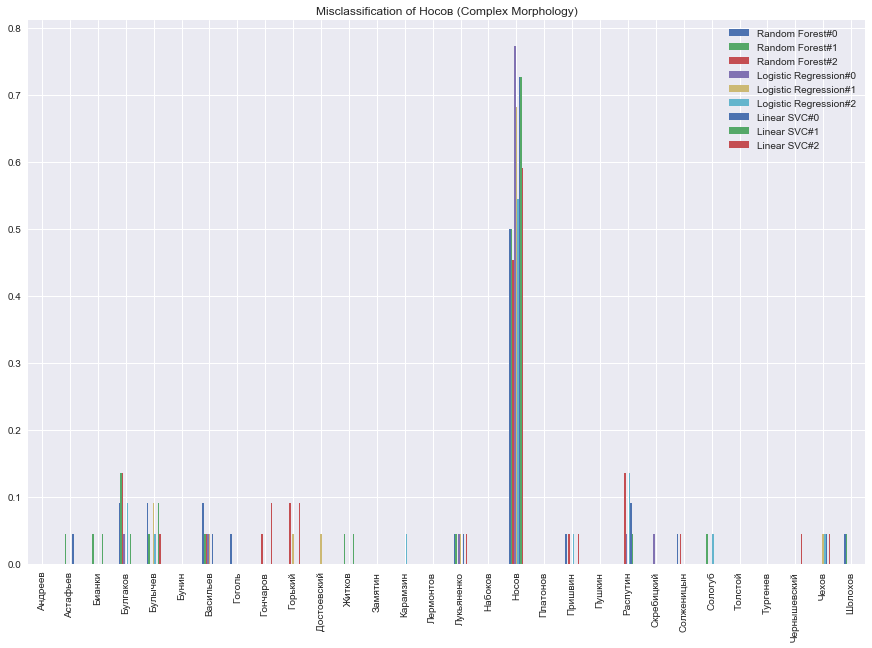

<Figure size 432x288 with 0 Axes>

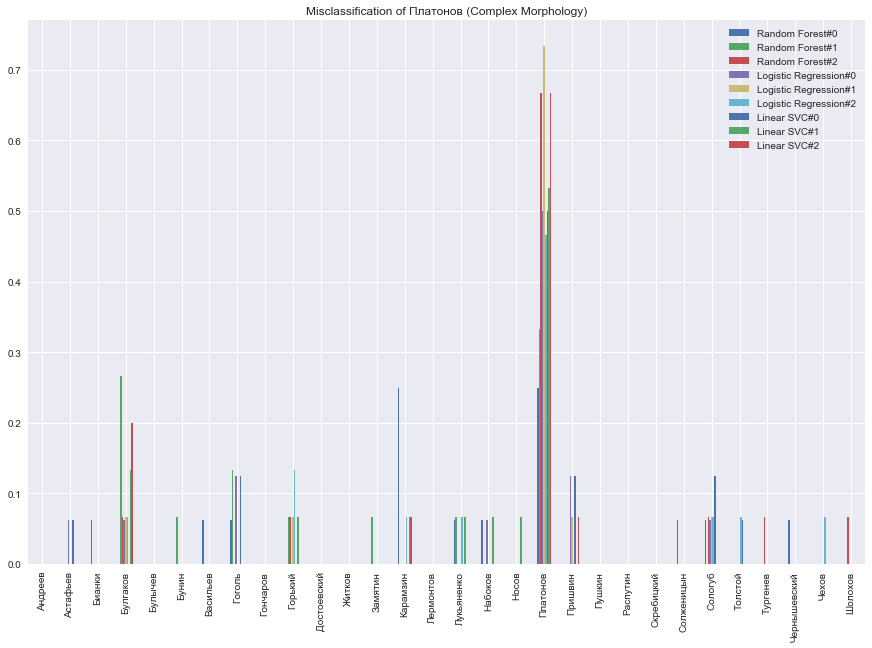

<Figure size 432x288 with 0 Axes>

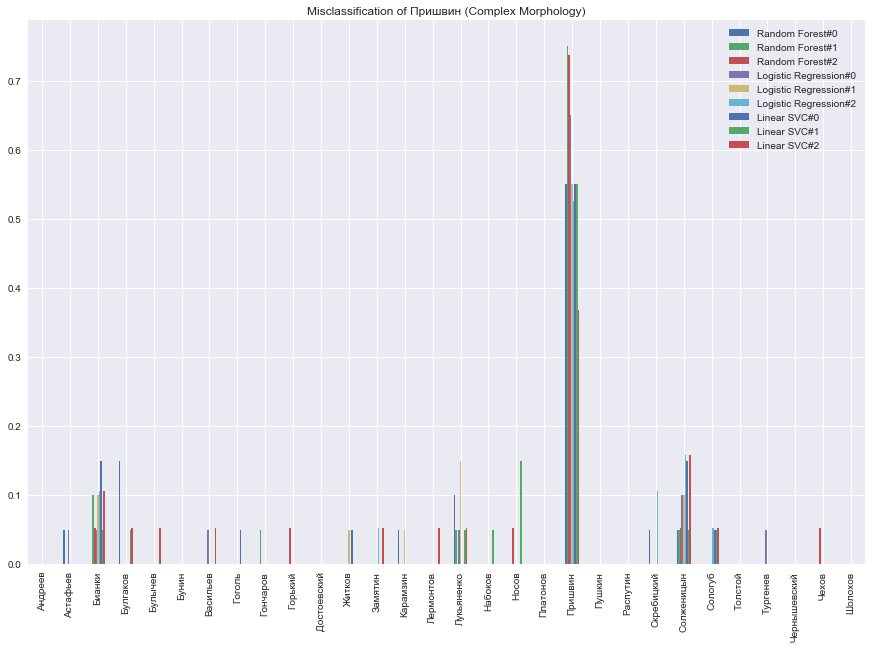

<Figure size 432x288 with 0 Axes>

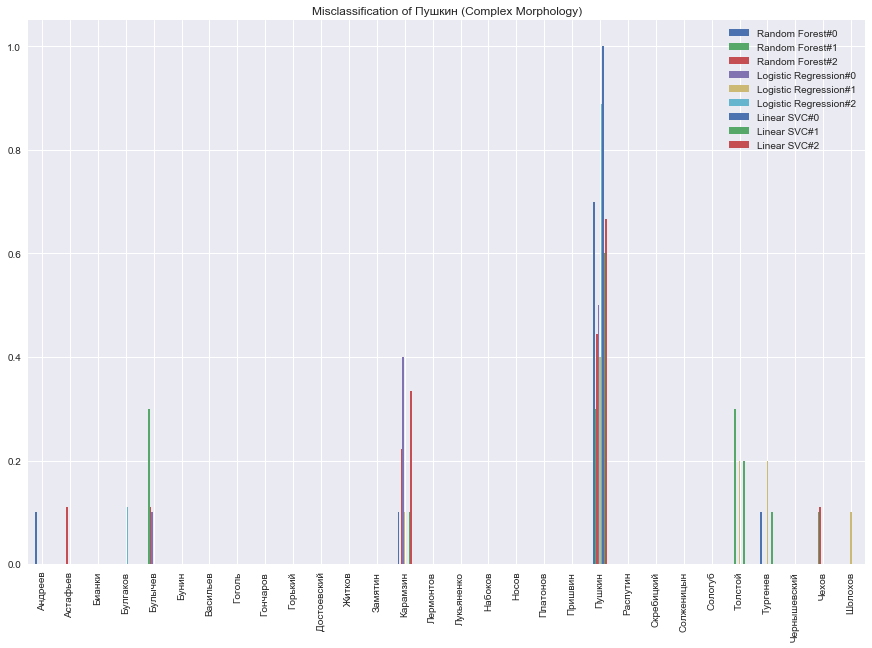

<Figure size 432x288 with 0 Axes>

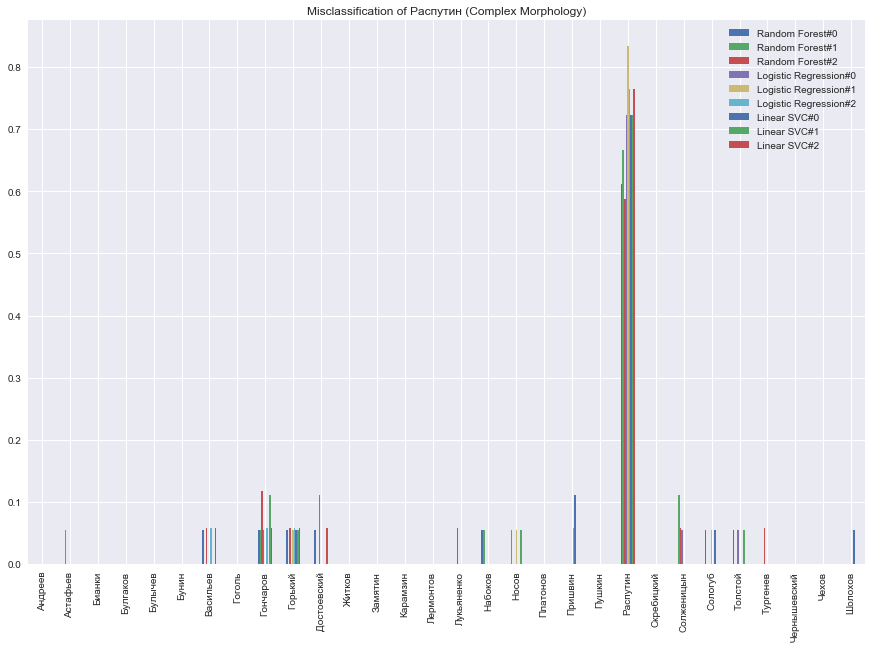

<Figure size 432x288 with 0 Axes>

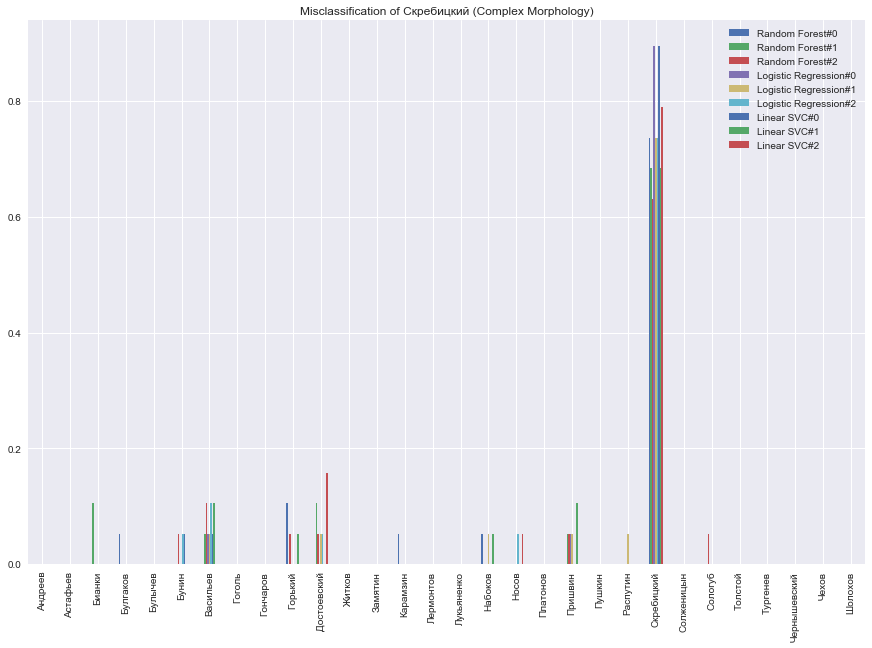

<Figure size 432x288 with 0 Axes>

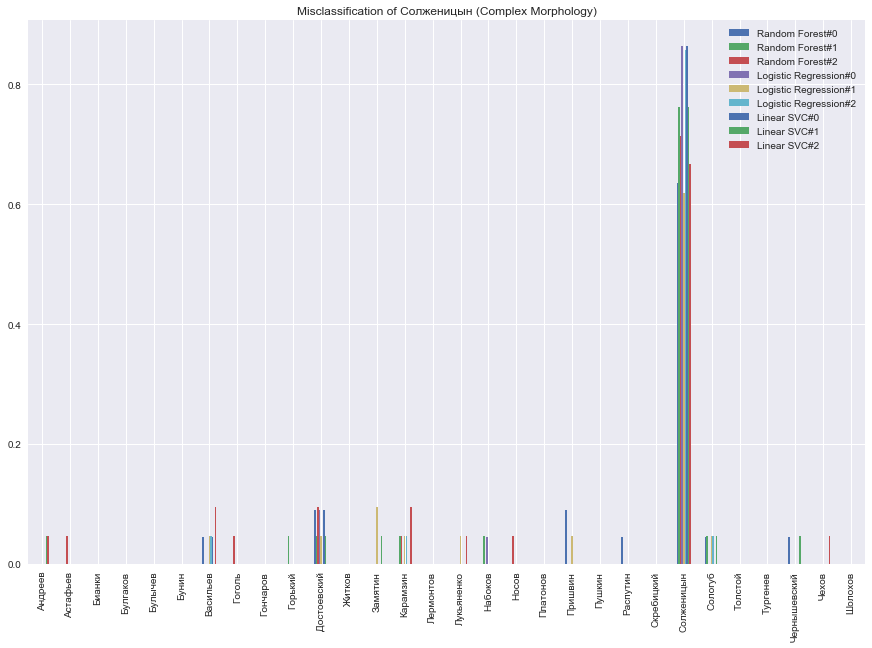

<Figure size 432x288 with 0 Axes>

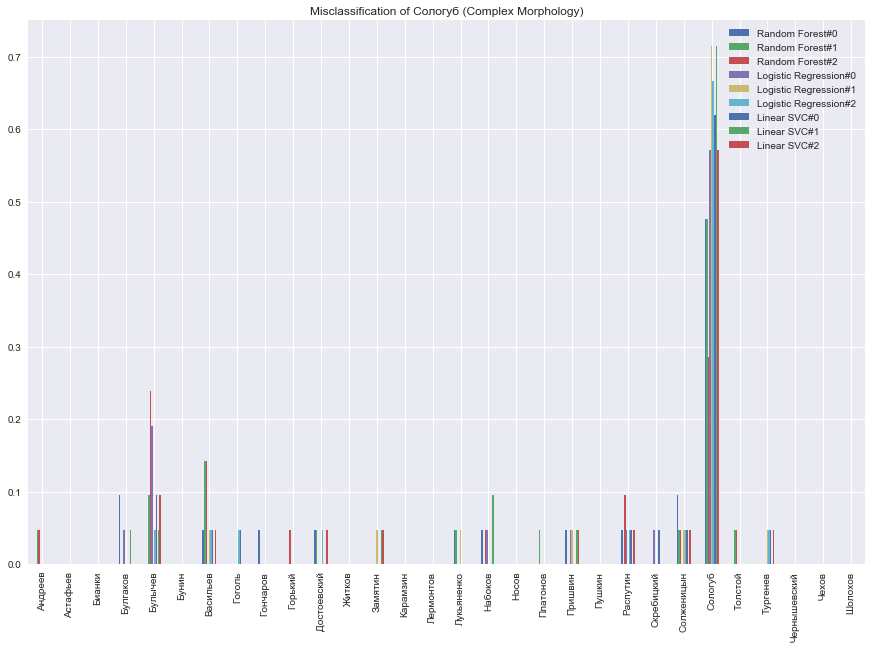

<Figure size 432x288 with 0 Axes>

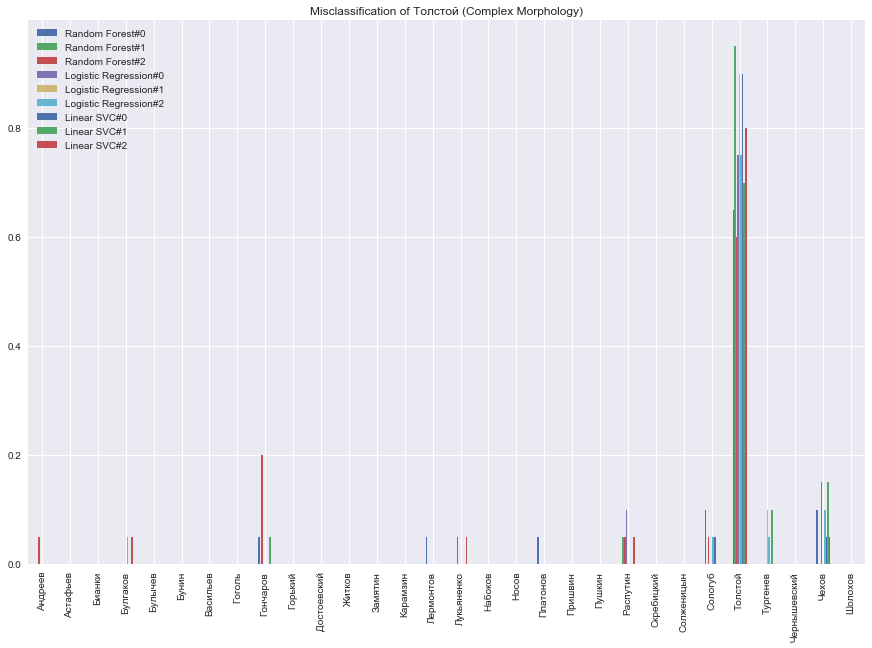

<Figure size 432x288 with 0 Axes>

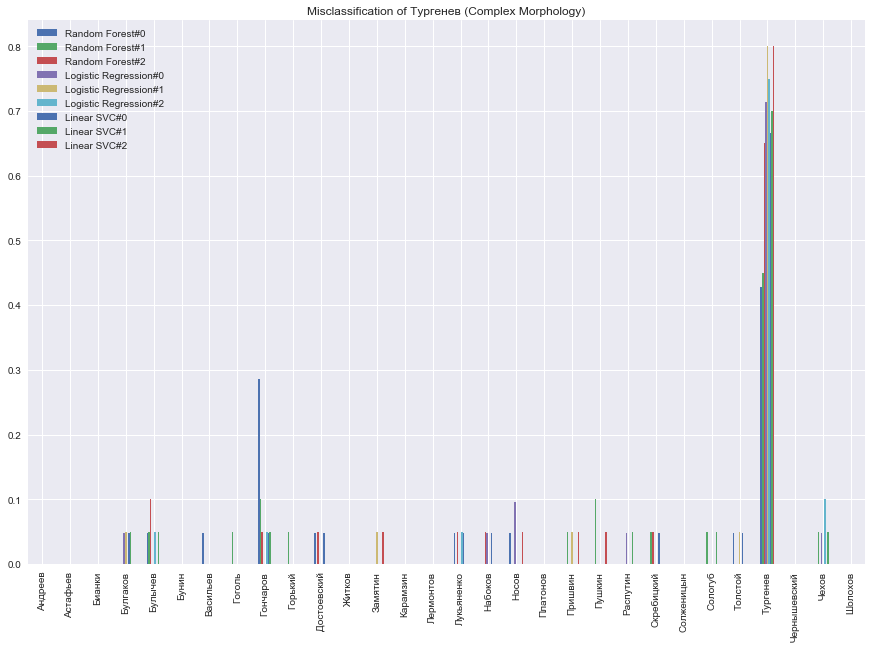

<Figure size 432x288 with 0 Axes>

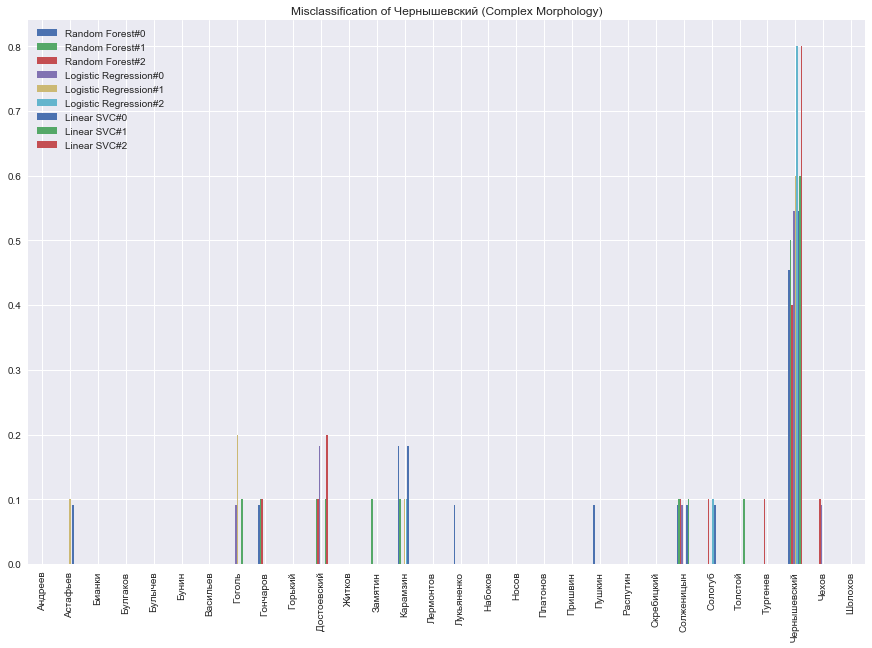

<Figure size 432x288 with 0 Axes>

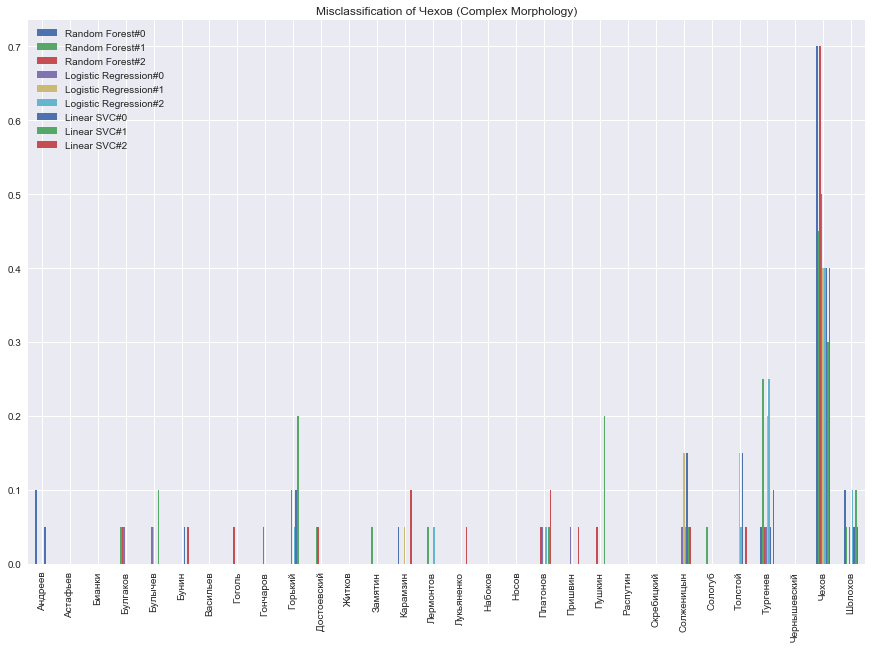

<Figure size 432x288 with 0 Axes>

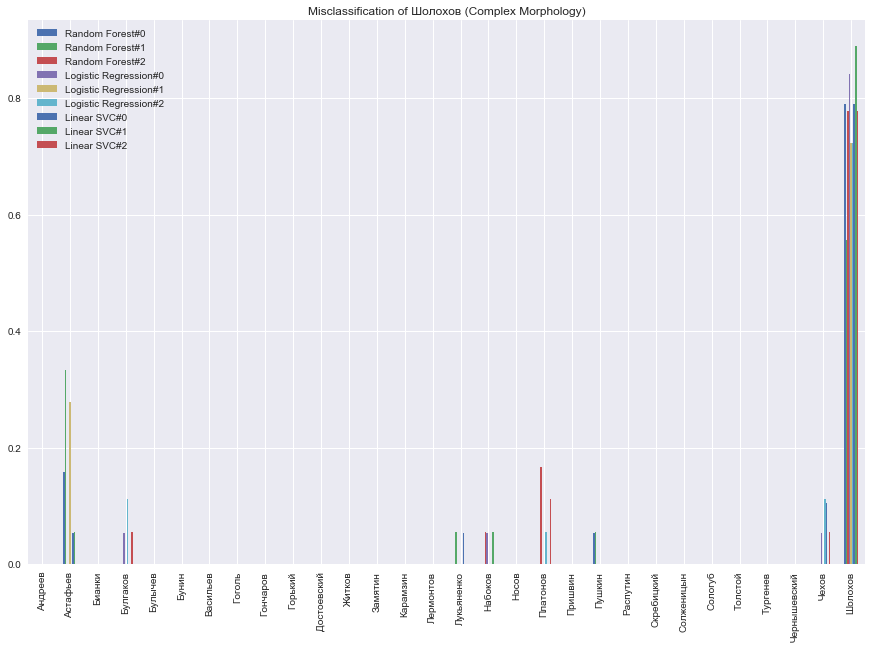

In [480]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [481]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [482]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

In [483]:
statStructure

defaultdict(dict,
            {'Simple Morphology': {'Hopkins': 0.8633797229860601,
              'ARS': 0.21942268908758722,
              'AMI': 0.3989127428438392,
              'Random Forest': {'Accuracy': 0.7018525530263191,
               'Precision': 0.7086654474011214,
               'Recall': 0.7018525530263191,
               'f1': 0.6921590438373871},
              'Logistic Regression': {'Accuracy': 0.7860585401600312,
               'Precision': 0.7919828125629196,
               'Recall': 0.7860585401600312,
               'f1': 0.774952149097541},
              'Linear SVC': {'Accuracy': 0.7907630702479285,
               'Precision': 0.7955411546852239,
               'Recall': 0.7907630702479285,
               'f1': 0.7847614356547045}},
             'Complex Morphology': {'Hopkins': 0.8203129690108217,
              'ARS': 0.12547472071982196,
              'AMI': 0.3121247626931725,
              'Random Forest': {'Accuracy': 0.5724144679179731,
               'Pre

# Синтаксис - базовые структурные компоненты

In [484]:
currentPart = 'Simple Syntax'

simpleSyntaxDF = pd.read_csv('OutData/SyntaxDependencies.csv')
print('Shape: {}'.format(simpleSyntaxDF.shape))
simpleSyntaxDF.head()

Shape: (1506, 43)


,Unnamed: 0,ROOT,acl,acl:relcl,advcl,advmod,amod,appos,aux,aux:pass,...,nummod:gov,obj,obl,orphan,parataxis,punct,vocative,xcomp,Author,Novel
0,0.003359,0.061503,0.011755,0.008816,0.016793,0.066961,0.057725,0.001679,0.001889,0.001259,...,0.002939,0.036314,0.090680,0.000210,0.017842,0.198783,0.0,0.011125,Андреев,Ангелочек
1,0.020619,0.057914,0.013341,0.006671,0.014857,0.068223,0.060643,0.005761,0.001819,0.002122,...,0.000910,0.034263,0.095209,0.001819,0.016980,0.199818,0.0,0.012129,Андреев,Баргамот и Гараська
2,0.020542,0.056583,0.009524,0.005415,0.018674,0.070401,0.059197,0.002801,0.000934,0.000747,...,0.005042,0.031933,0.073950,0.000934,0.010271,0.207656,0.0,0.005229,Андреев,Бездна
3,0.014901,0.043891,0.006502,0.005148,0.018423,0.078840,0.052018,0.006502,0.002167,0.002167,...,0.009212,0.030615,0.090219,0.000271,0.012734,0.162558,0.0,0.009753,Андреев,Большой шлем
4,0.019201,0.055300,0.005376,0.006912,0.020225,0.060164,0.057860,0.004352,0.001536,0.000512,...,0.002560,0.033538,0.090374,0.000512,0.010241,0.191244,0.0,0.008449,Андреев,В подвале


In [485]:
X = simpleSyntaxDF.drop(columns=['Author', 'Novel', simpleSyntaxDF.columns[0]], axis=1).values
name_of_features = simpleSyntaxDF.drop(columns=['Author', 'Novel',   simpleSyntaxDF.columns[0]], axis=1).columns
label_list_by_authors = simpleSyntaxDF.Author.values

countOfAuthors = len(simpleSyntaxDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors


##### Hopkins stats

In [486]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.870945207089491
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.26861458066869415
	AMI: 0.4692323320029153


### Classification with 3 Folds Cross-Validation

Current model: Random Forest
Accuracy  	mean: 0.77626
Precision 	mean: 0.78011
Recall    	mean: 0.77626
f1        	mean: 0.76652


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

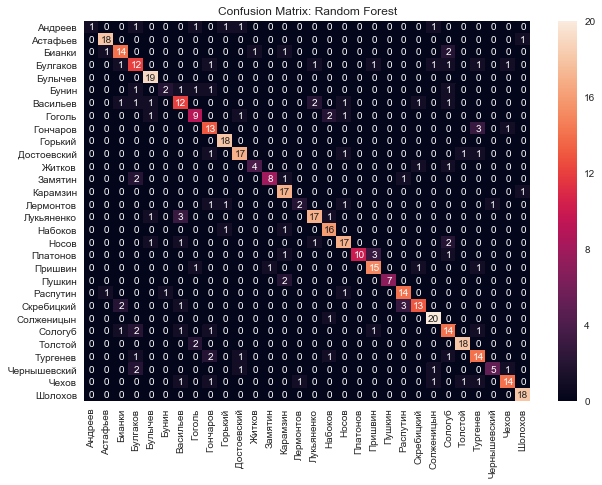

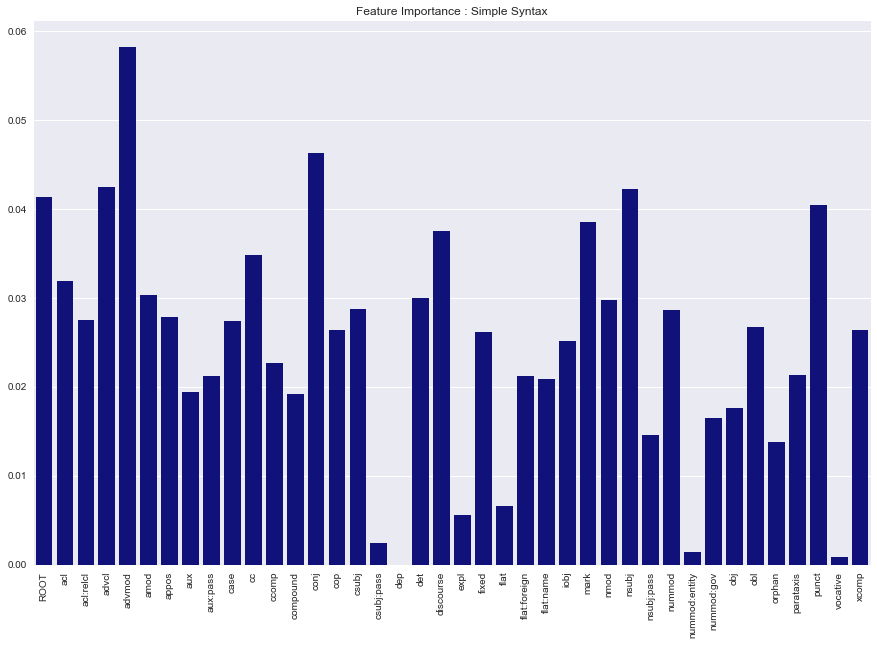

Current model: Logistic Regression
Accuracy  	mean: 0.89042
Precision 	mean: 0.89752
Recall    	mean: 0.89042
f1        	mean: 0.88458


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

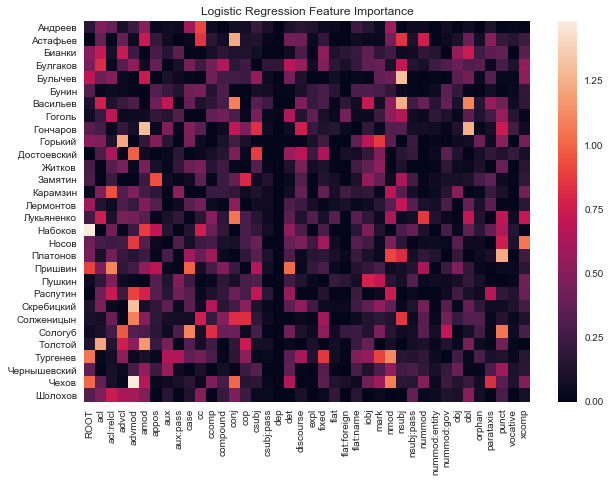

Current model: Linear SVC
Accuracy  	mean: 0.89460
Precision 	mean: 0.89594
Recall    	mean: 0.89460
f1        	mean: 0.89263


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

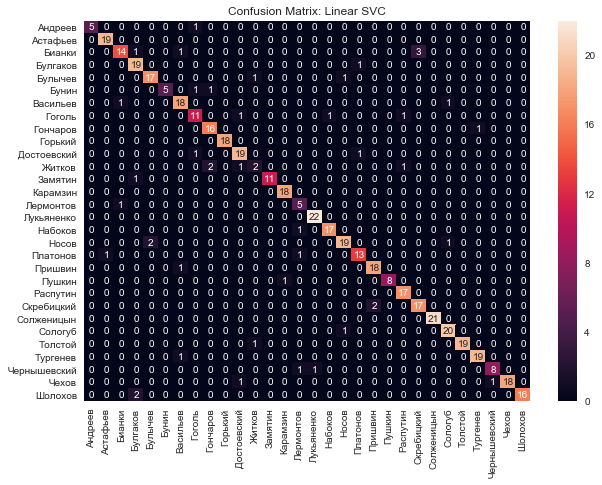

In [487]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

<Figure size 432x288 with 0 Axes>

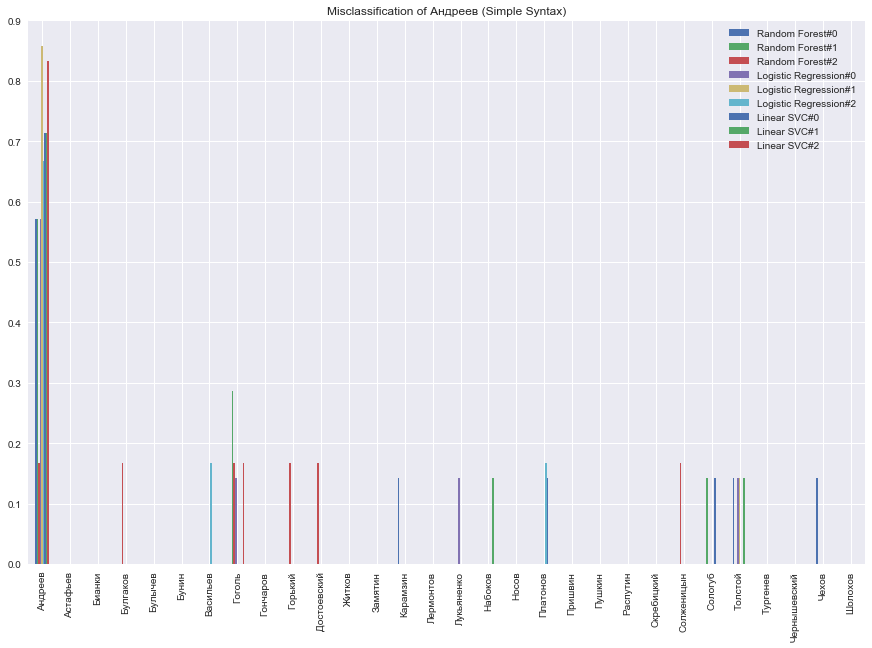

<Figure size 432x288 with 0 Axes>

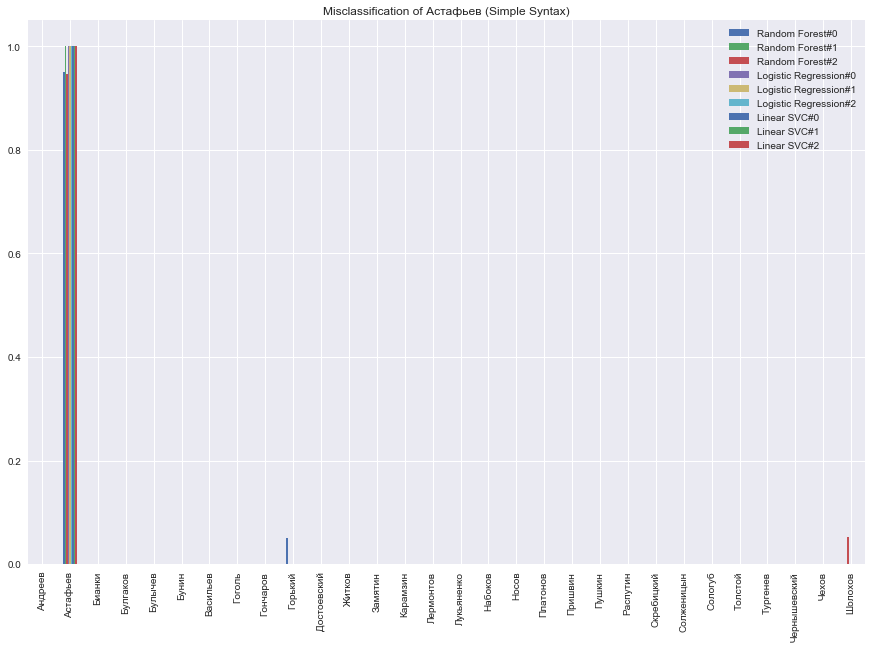

<Figure size 432x288 with 0 Axes>

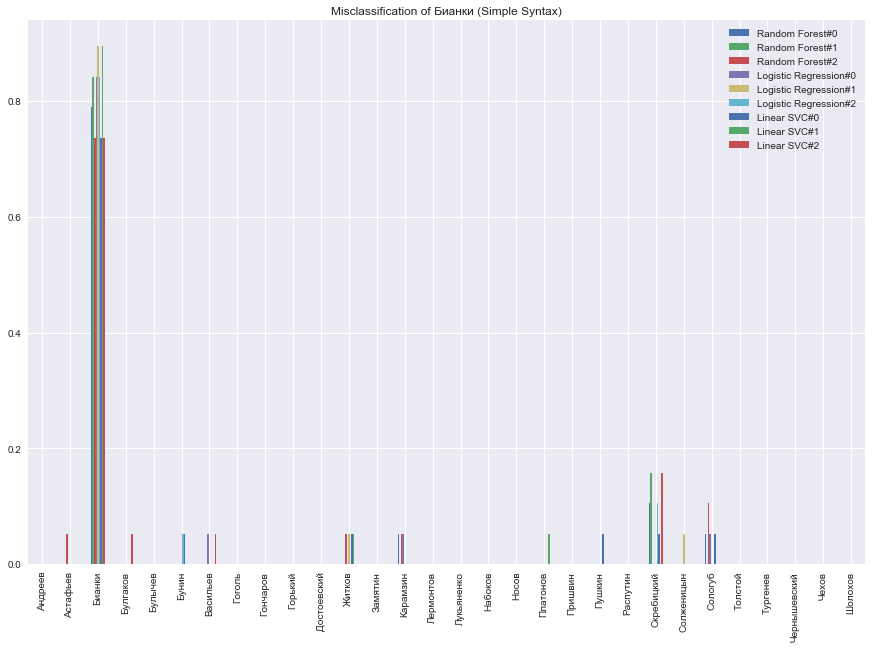

<Figure size 432x288 with 0 Axes>

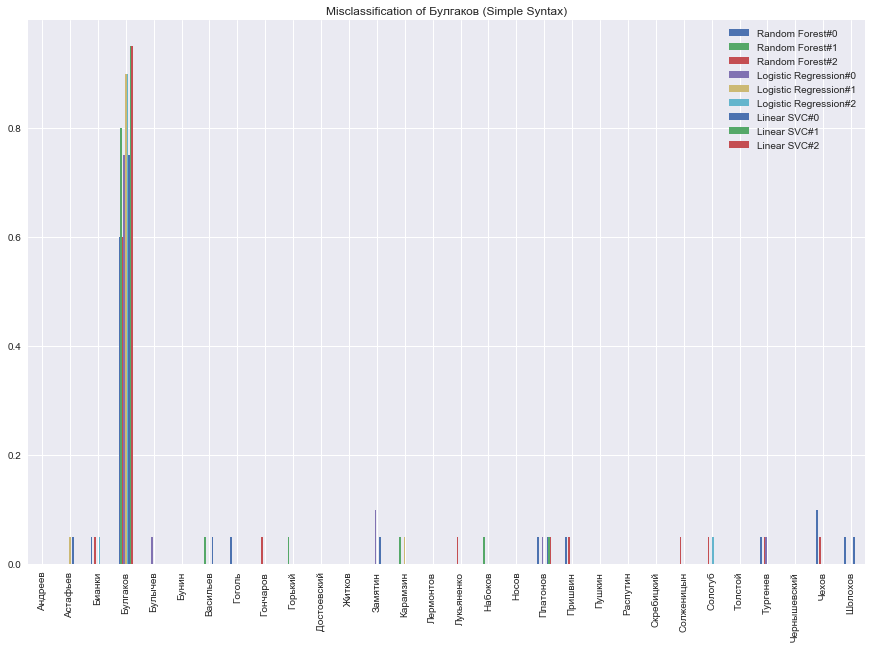

<Figure size 432x288 with 0 Axes>

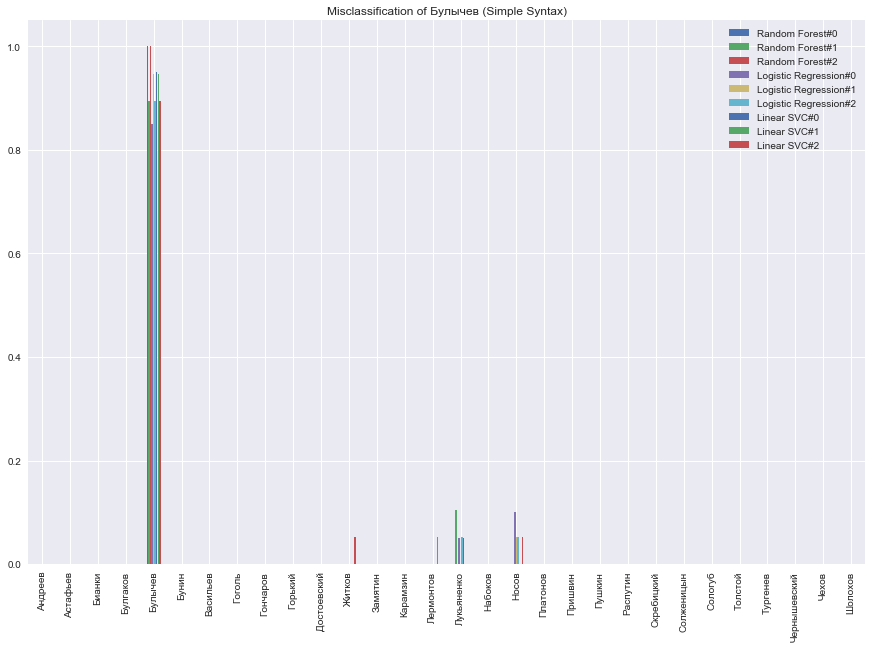

<Figure size 432x288 with 0 Axes>

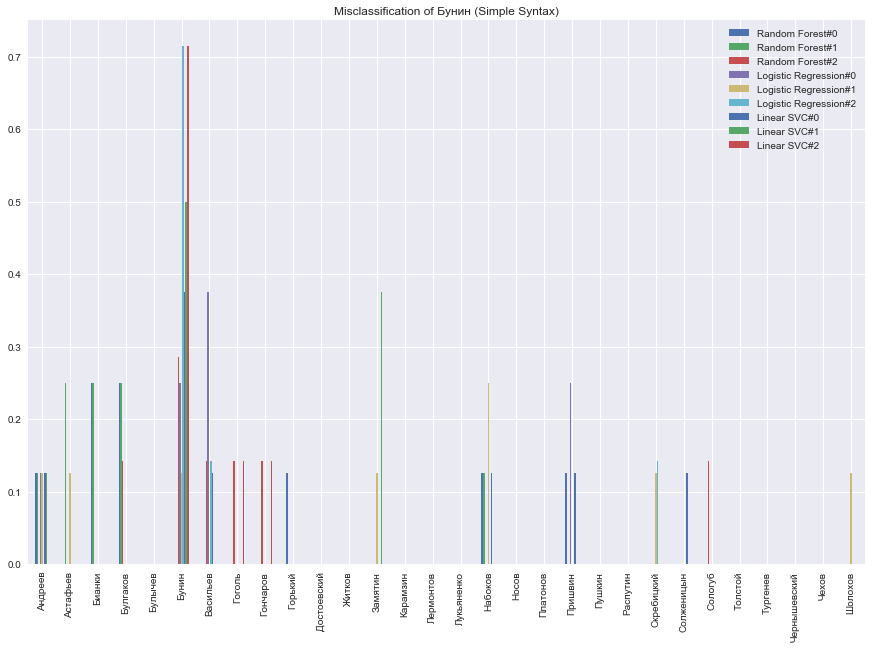

<Figure size 432x288 with 0 Axes>

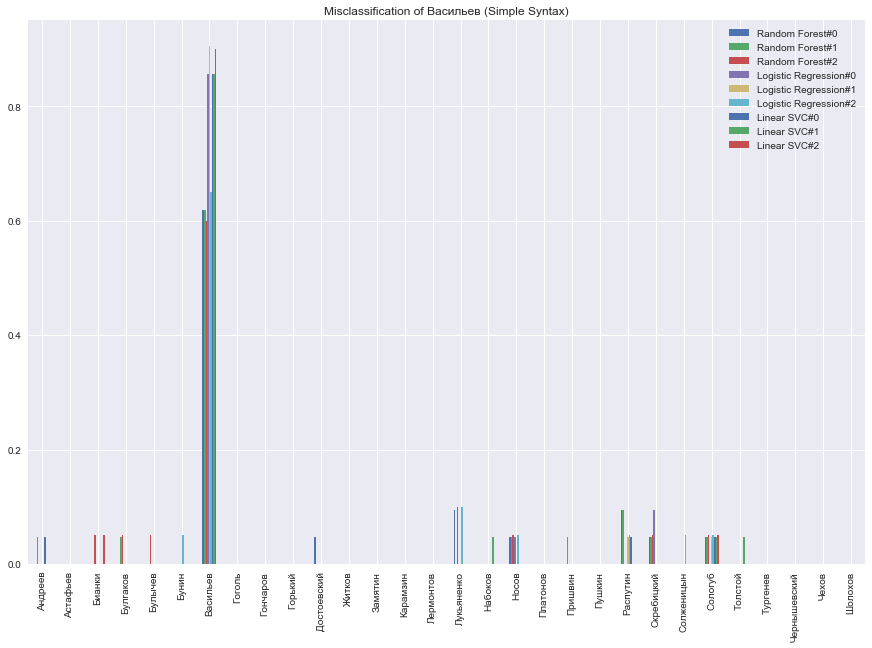

<Figure size 432x288 with 0 Axes>

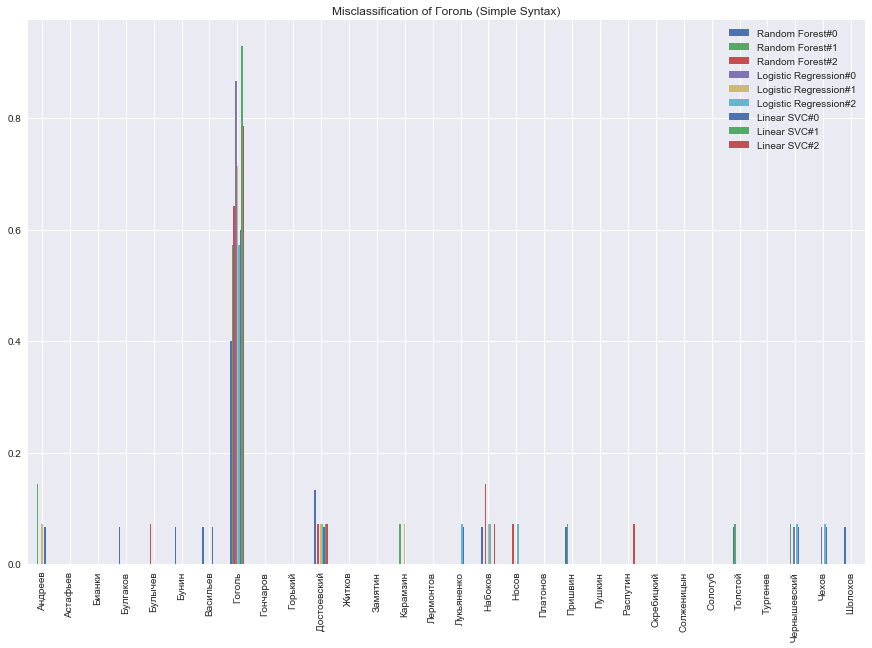

<Figure size 432x288 with 0 Axes>

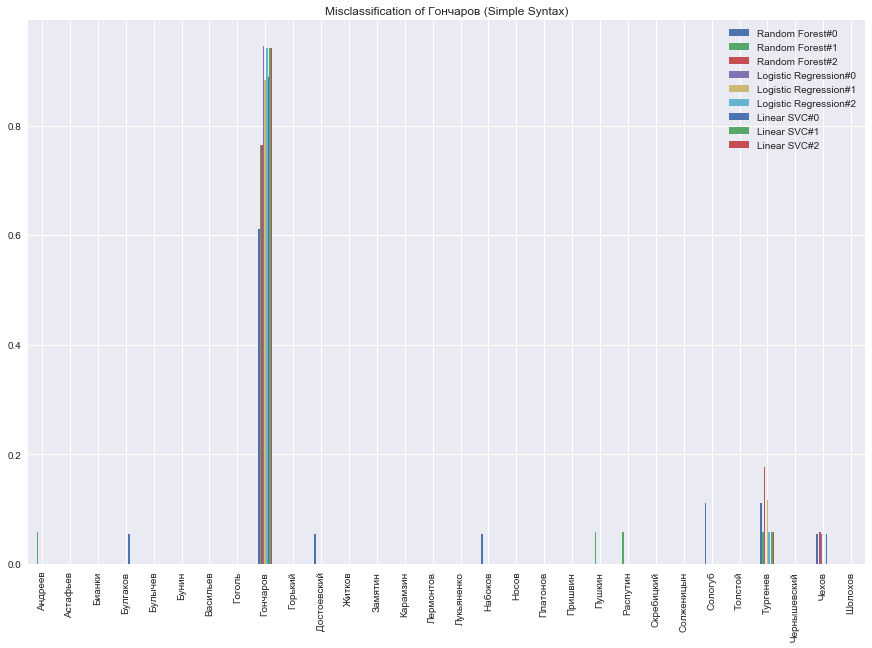

<Figure size 432x288 with 0 Axes>

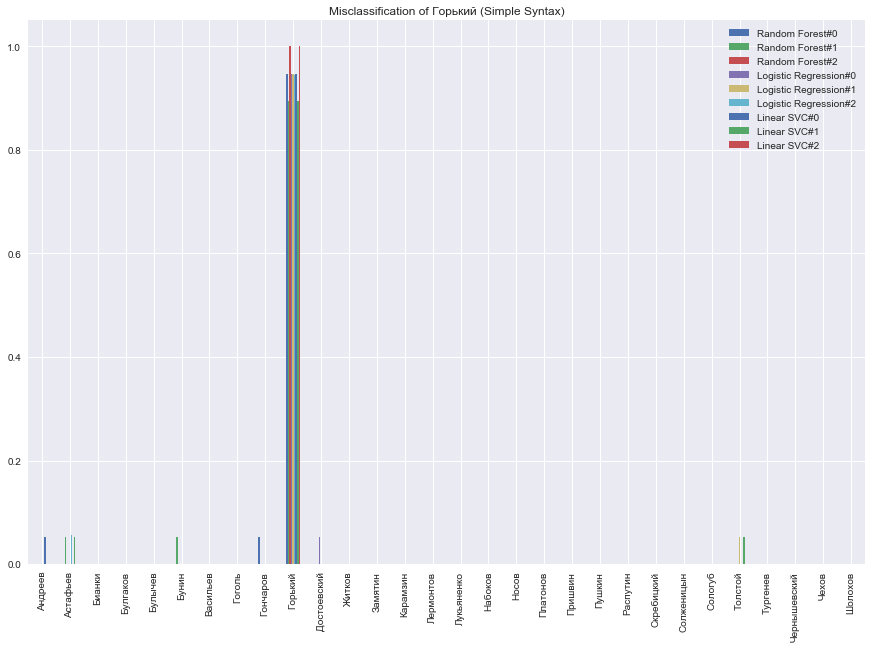

<Figure size 432x288 with 0 Axes>

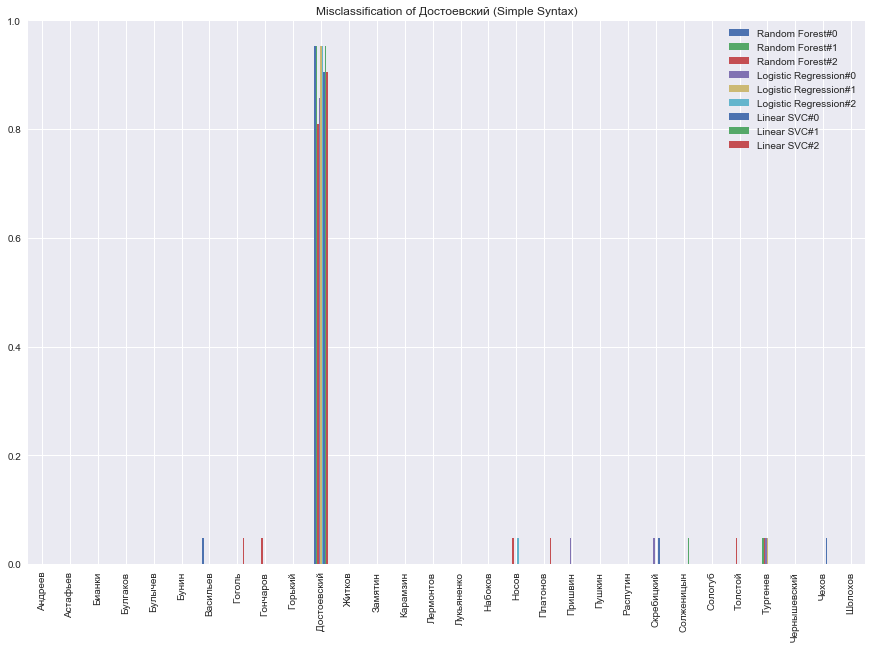

<Figure size 432x288 with 0 Axes>

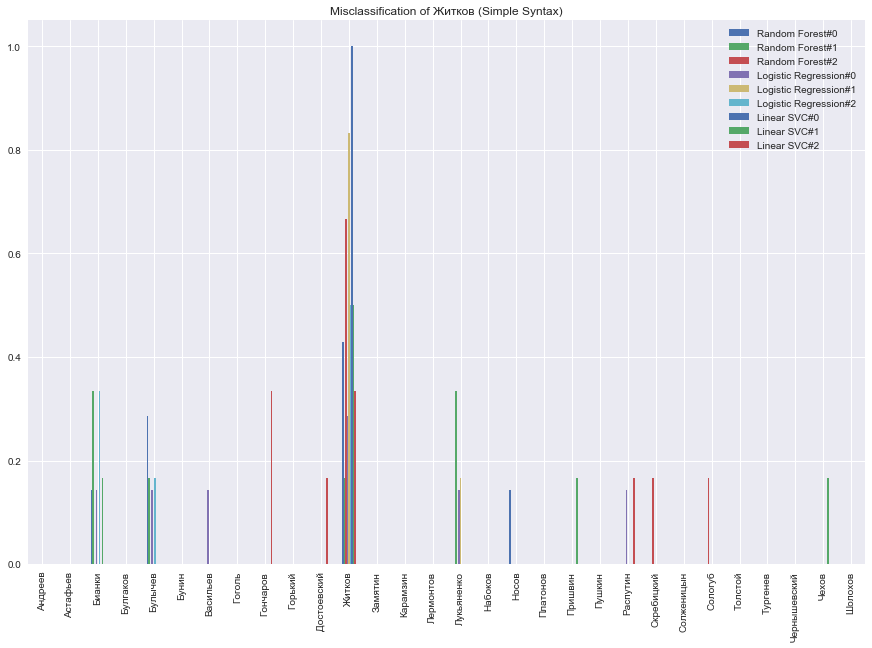

<Figure size 432x288 with 0 Axes>

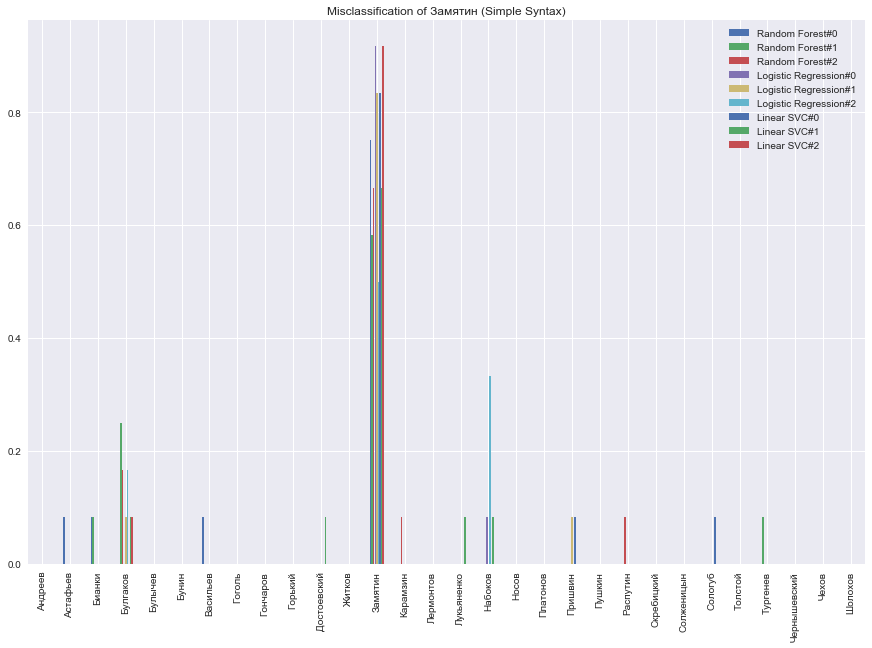

<Figure size 432x288 with 0 Axes>

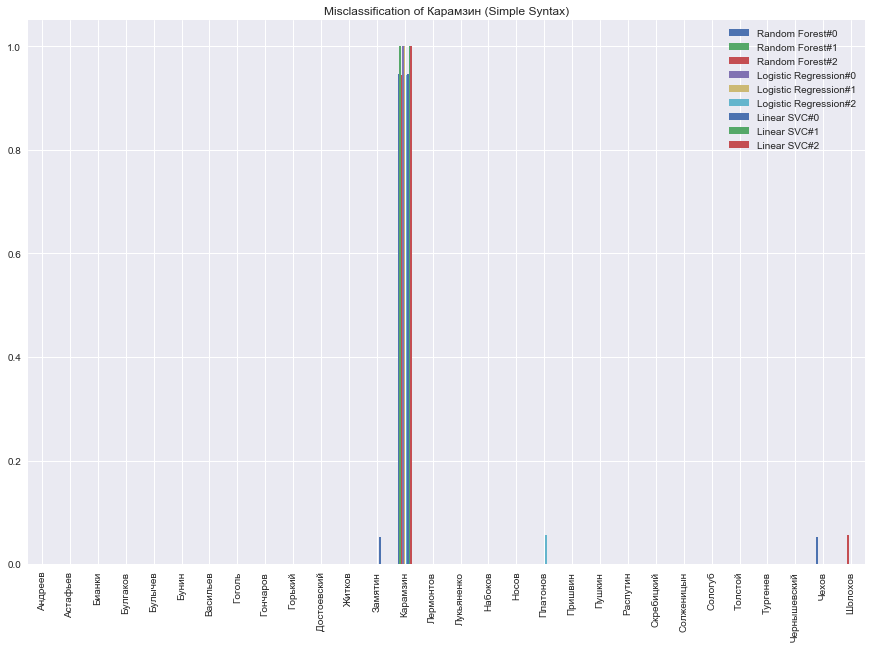

<Figure size 432x288 with 0 Axes>

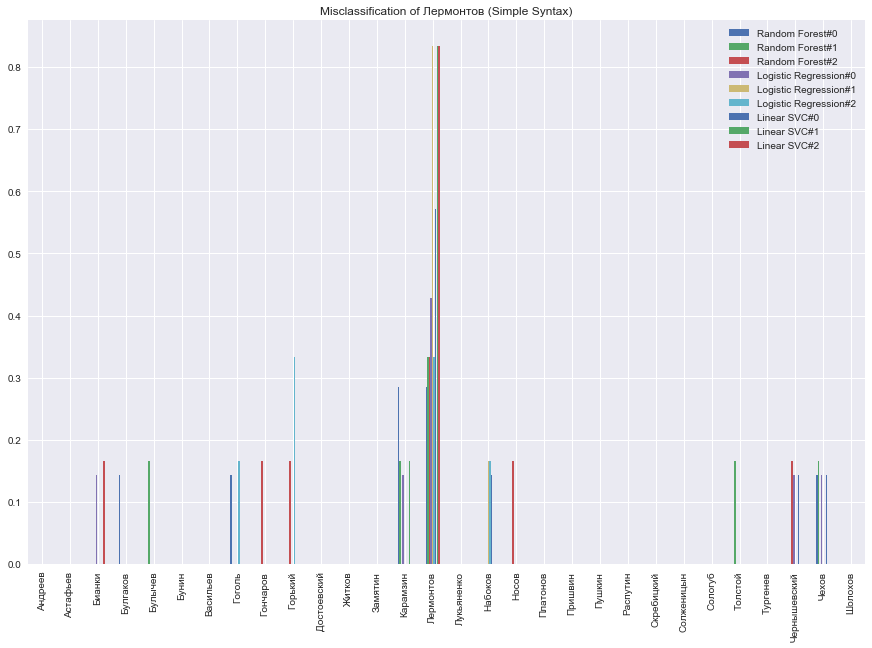

<Figure size 432x288 with 0 Axes>

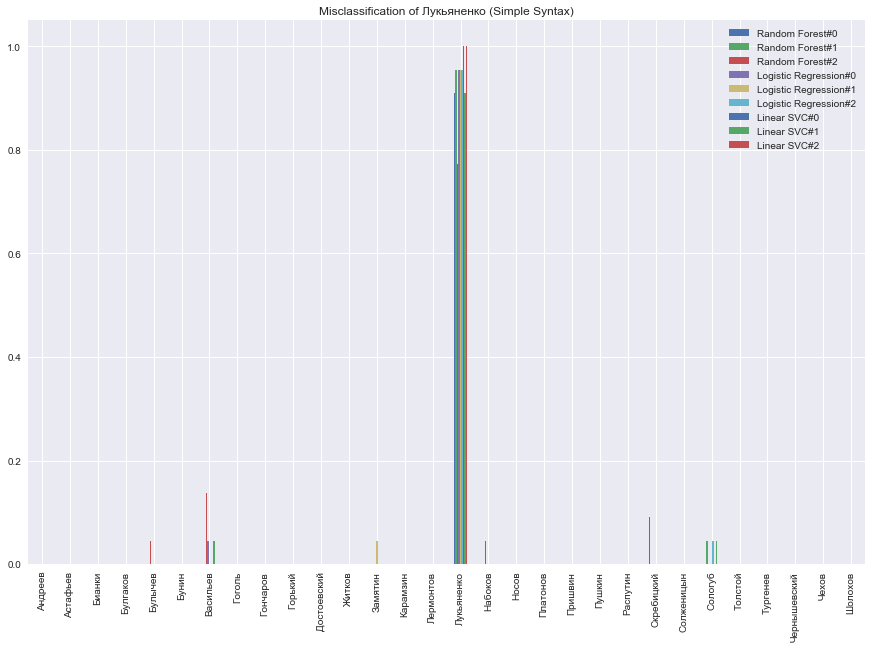

<Figure size 432x288 with 0 Axes>

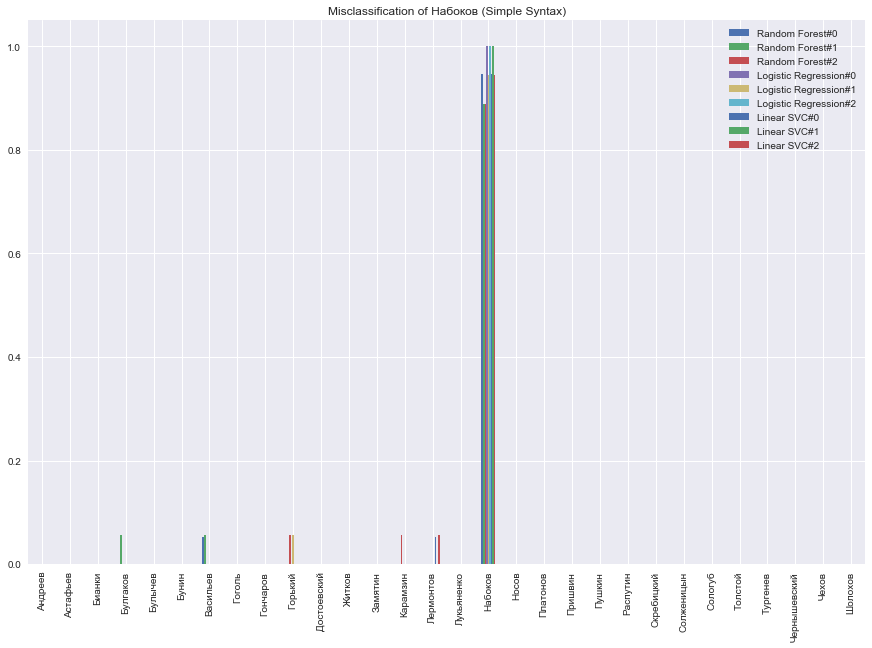

<Figure size 432x288 with 0 Axes>

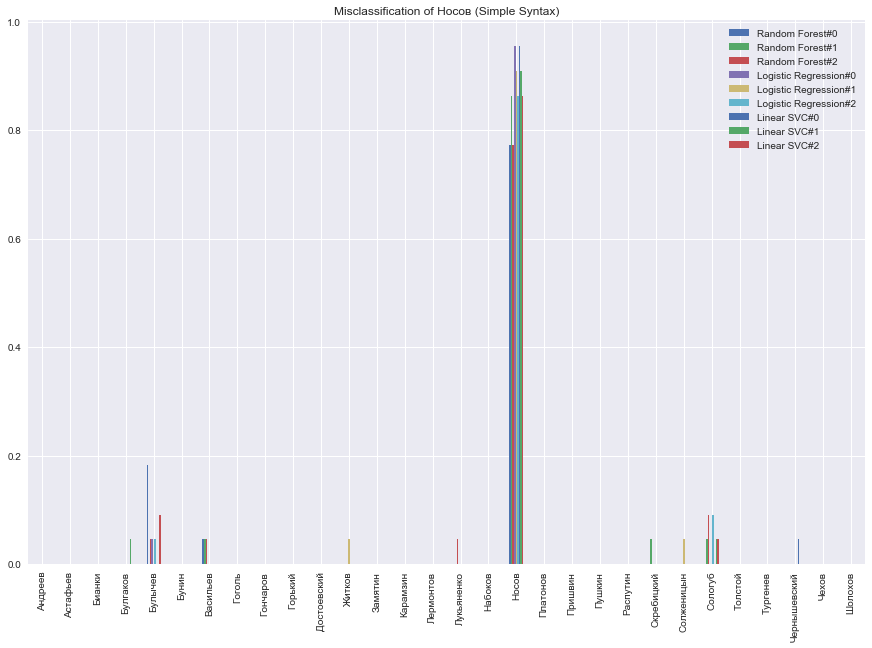

<Figure size 432x288 with 0 Axes>

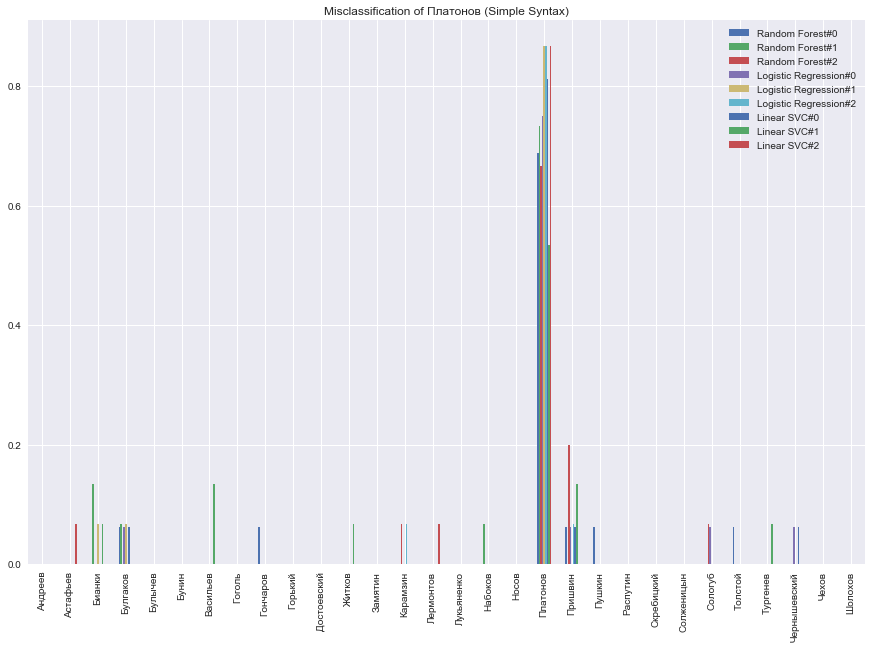

<Figure size 432x288 with 0 Axes>

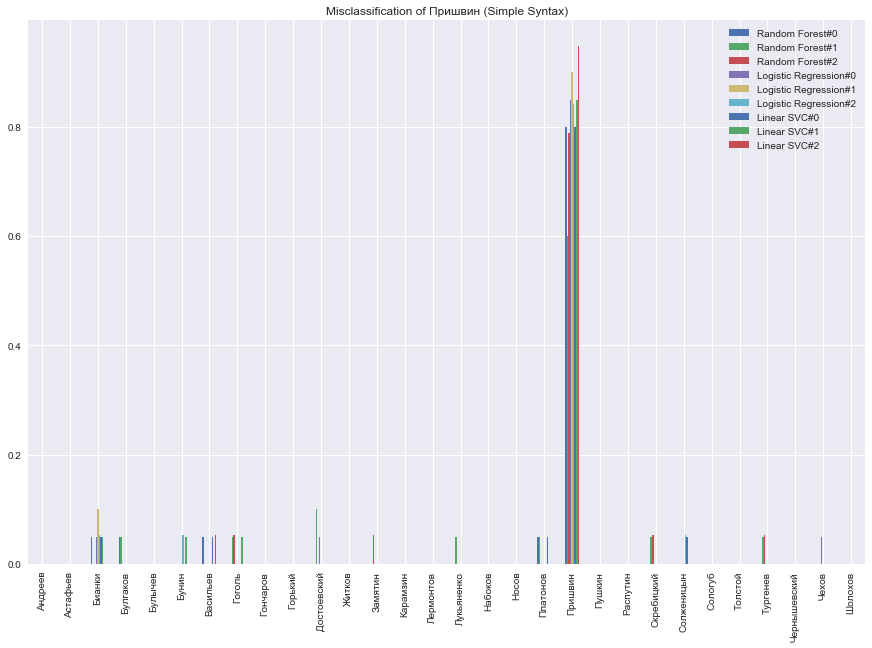

<Figure size 432x288 with 0 Axes>

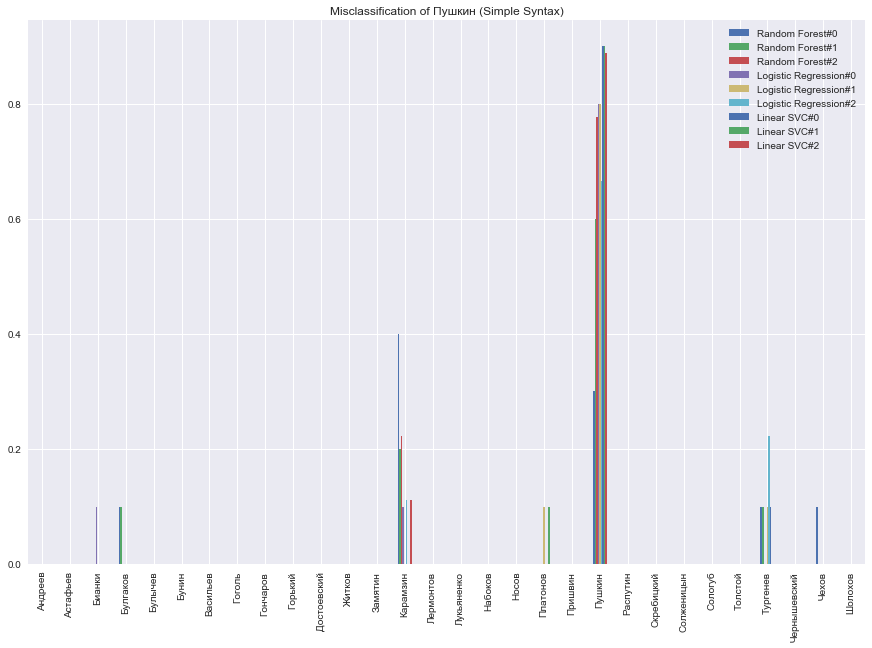

<Figure size 432x288 with 0 Axes>

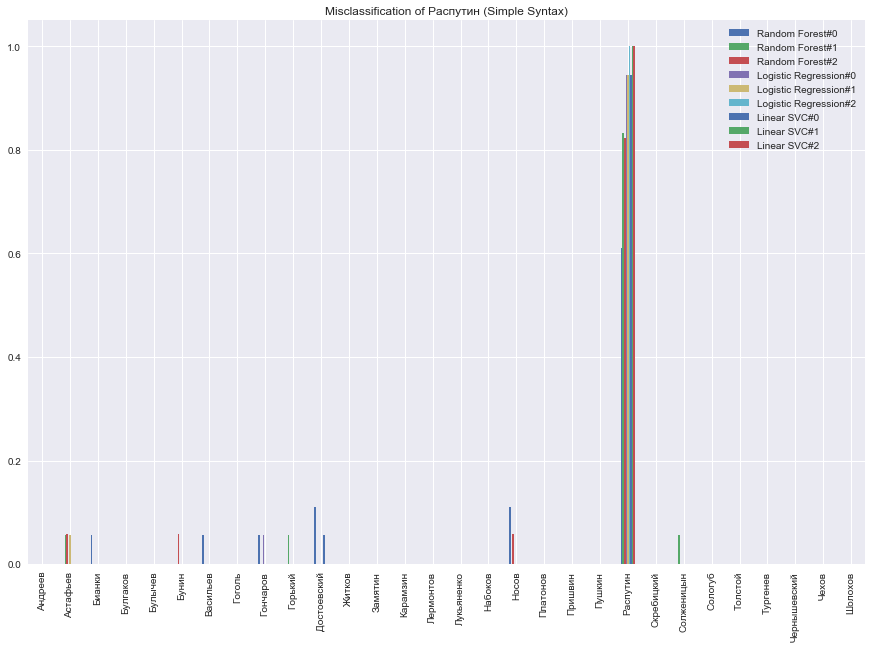

<Figure size 432x288 with 0 Axes>

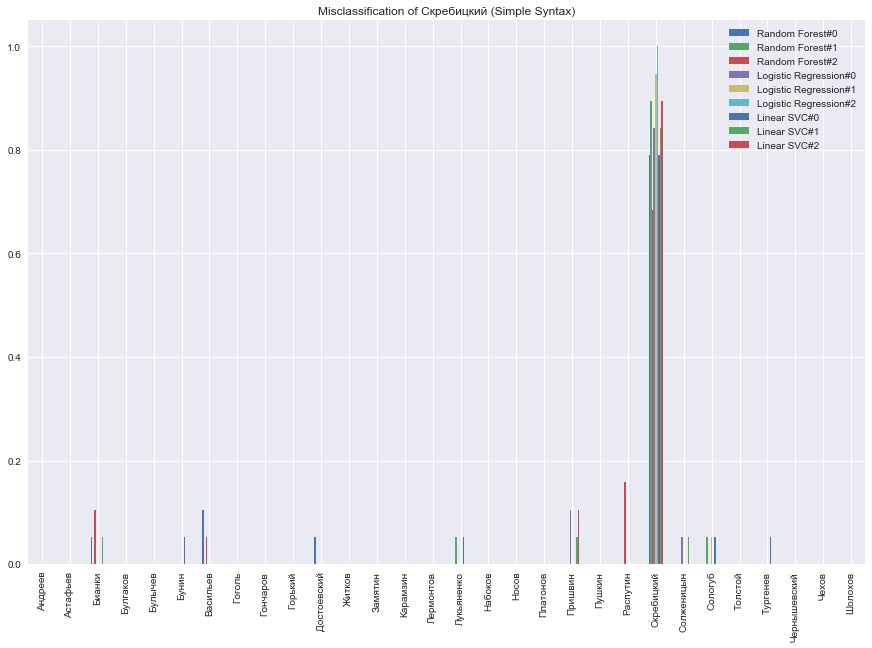

<Figure size 432x288 with 0 Axes>

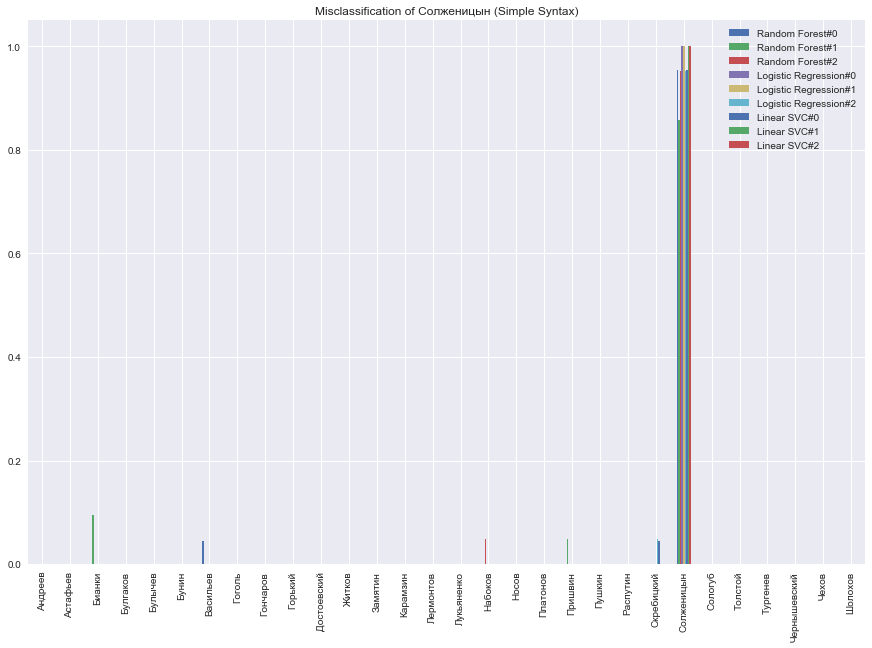

<Figure size 432x288 with 0 Axes>

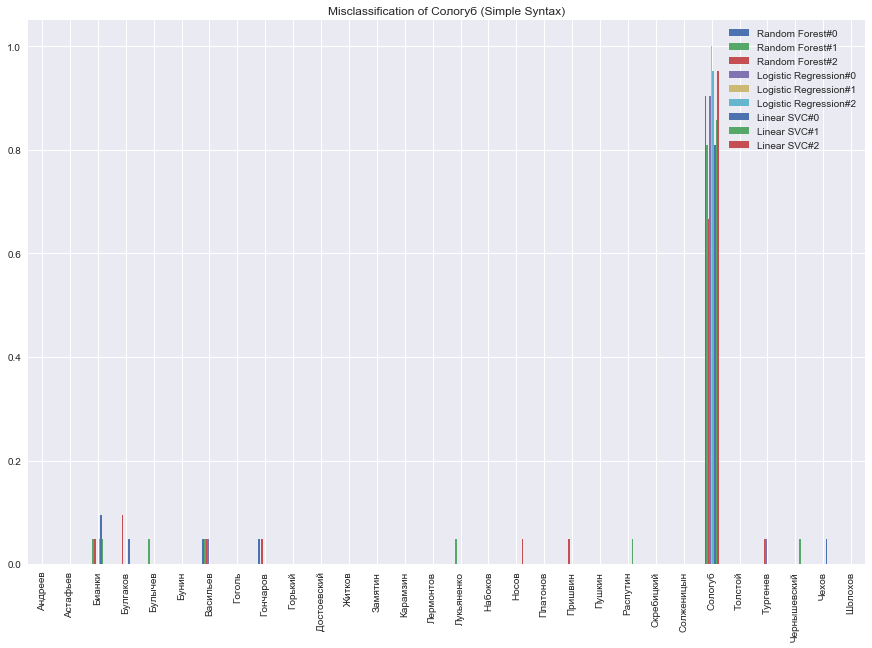

<Figure size 432x288 with 0 Axes>

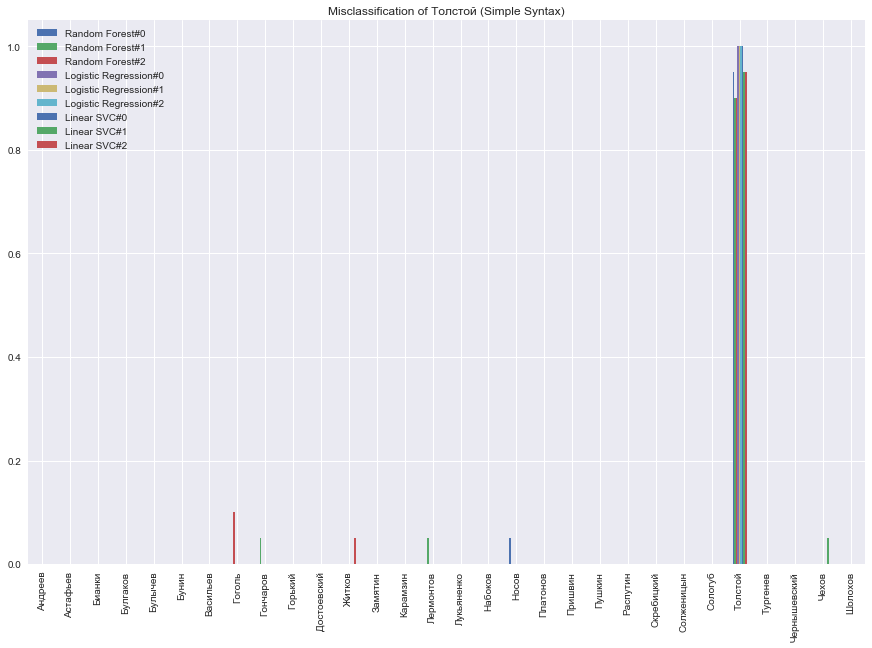

<Figure size 432x288 with 0 Axes>

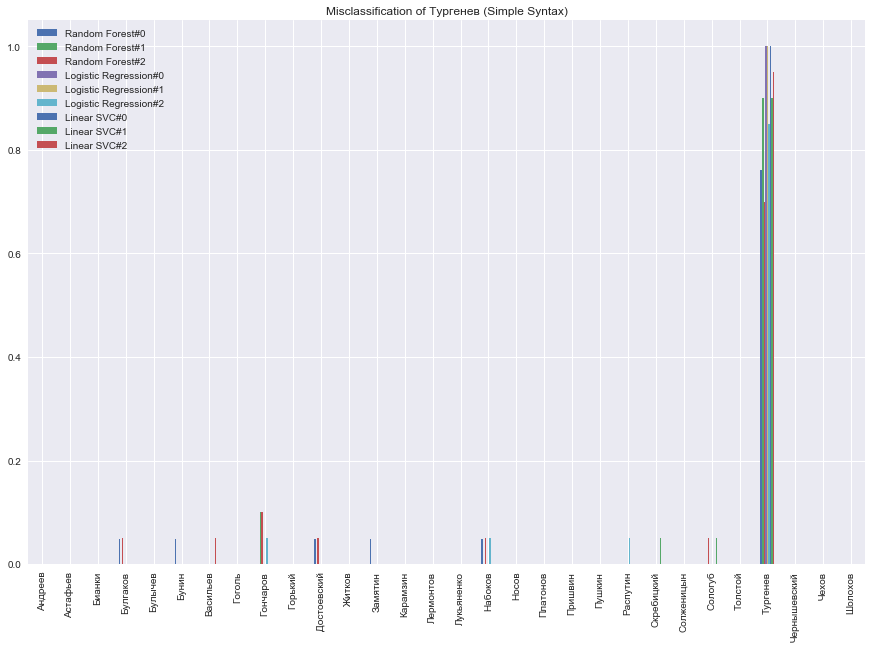

<Figure size 432x288 with 0 Axes>

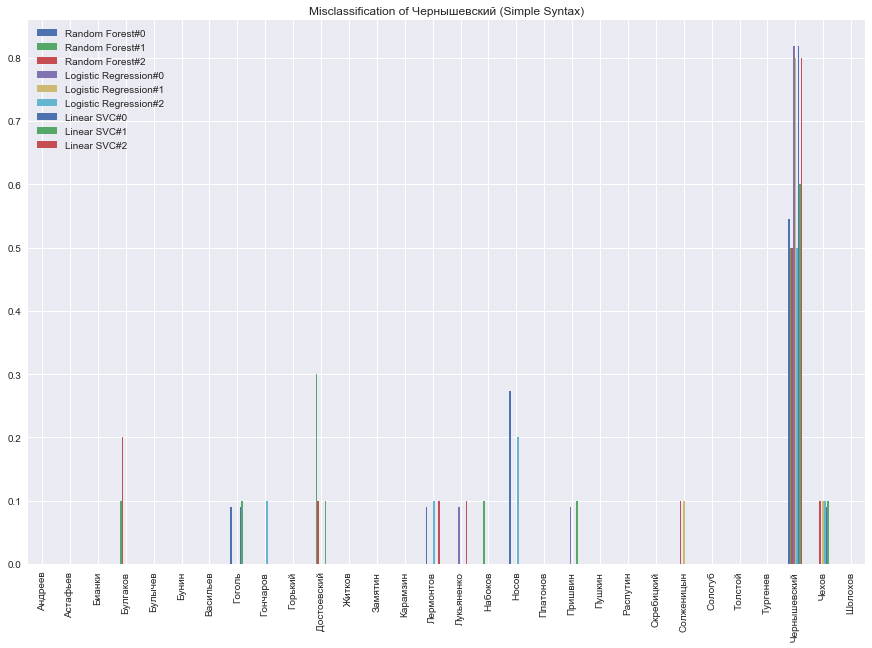

<Figure size 432x288 with 0 Axes>

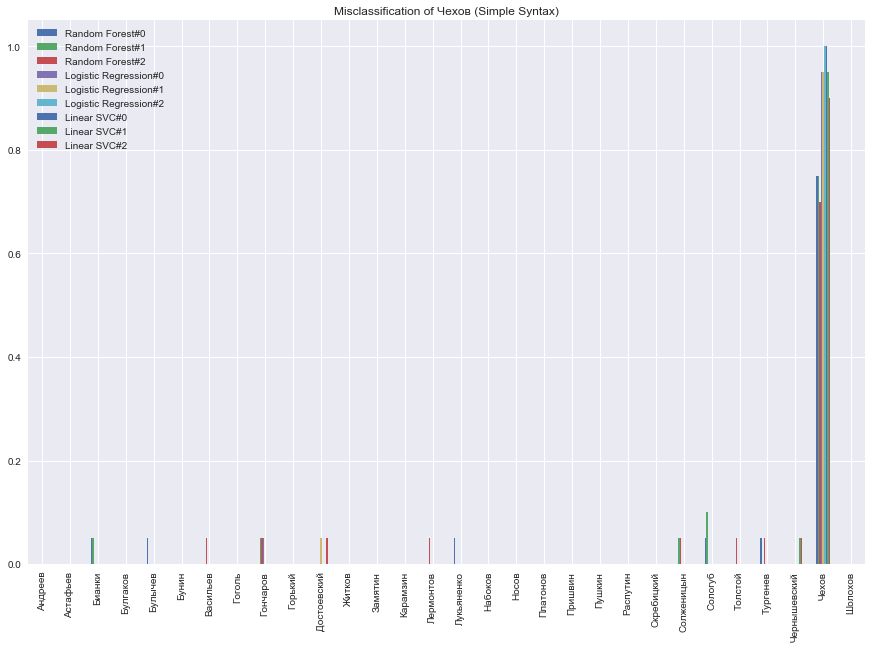

<Figure size 432x288 with 0 Axes>

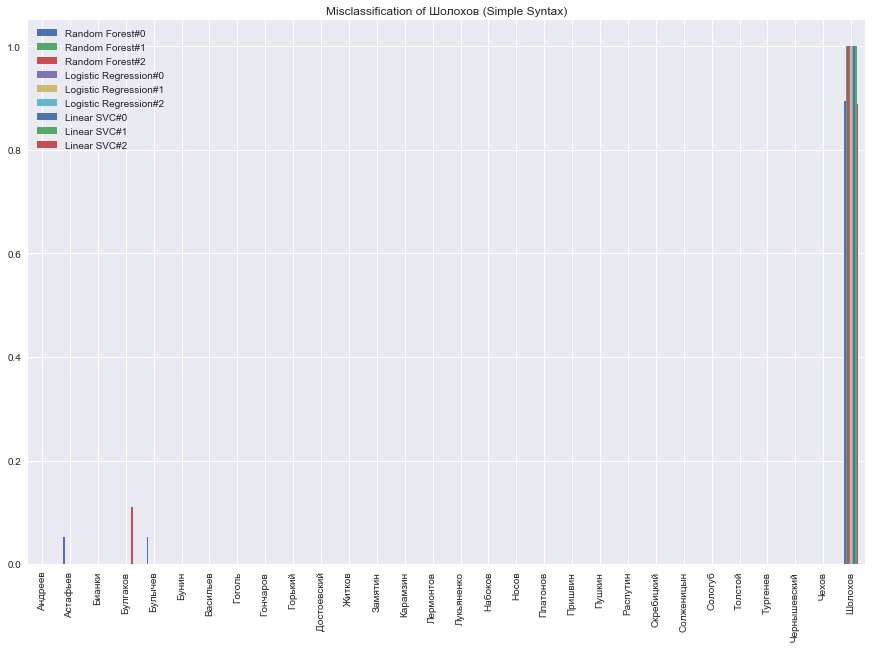

In [488]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [489]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [490]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

# Синтаксис - сложные компоненты

In [491]:
currentPart = 'Complex Syntax'

complexSyntaxDF = pd.read_csv('OutData/SyntaxComplex.csv')
print('Shape: {}'.format(complexSyntaxDF.shape))
complexSyntaxDF.head()

Shape: (1506, 30)


,AdjTurnover,AgreementPB,AppealConstruction,ComplicatedByApplication,ComplicatedByHomogeneous,ContiguityPB,ControlPB,CoordinationPB,DefinetelyPersonal,Genitive,...,advphr,comphr,nomphr,participle,simlphr,syntaxNonFreePhrases,verbalAdverb,verbphr,Author,Novel
0,0.170648,0.121314,0.006826,0.013652,0.273038,0.067186,0.144693,0.092039,0.046075,0.005119,...,0.015586,0.240101,0.193766,0.054608,0.759899,0.003791,0.054608,0.147220,Андреев,Ангелочек
1,0.240838,0.150464,0.018325,0.044503,0.272251,0.069659,0.149536,0.071517,0.018325,0.005236,...,0.016718,0.248916,0.207121,0.089005,0.751084,0.006502,0.073298,0.125387,Андреев,Баргамот и Гараська
2,0.292079,0.119542,0.004950,0.024752,0.323432,0.071878,0.119924,0.087512,0.036304,0.008251,...,0.022688,0.247855,0.189323,0.057756,0.752145,0.003051,0.097360,0.134604,Андреев,Бездна
3,0.182099,0.124312,0.018519,0.067901,0.354938,0.080033,0.140539,0.089659,0.006173,0.006173,...,0.017877,0.231573,0.188119,0.033951,0.768427,0.011001,0.086420,0.136689,Андреев,Большой шлем
4,0.252315,0.107022,0.009259,0.030093,0.319444,0.061342,0.146437,0.080397,0.043981,0.000000,...,0.020099,0.241190,0.189246,0.037037,0.758810,0.006526,0.104167,0.140433,Андреев,В подвале


In [492]:
X = complexSyntaxDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = complexSyntaxDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = complexSyntaxDF.Author.values

countOfAuthors = len(complexSyntaxDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors


##### Hopkins stats and clustering metrics

In [493]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8802579833525891
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.15667416368848505
	AMI: 0.3416341926199284


### Classification with 3 Folds Cross-Validation


Current model: Random Forest
Accuracy  	mean: 0.67329
Precision 	mean: 0.67060
Recall    	mean: 0.67329
f1        	mean: 0.65885


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

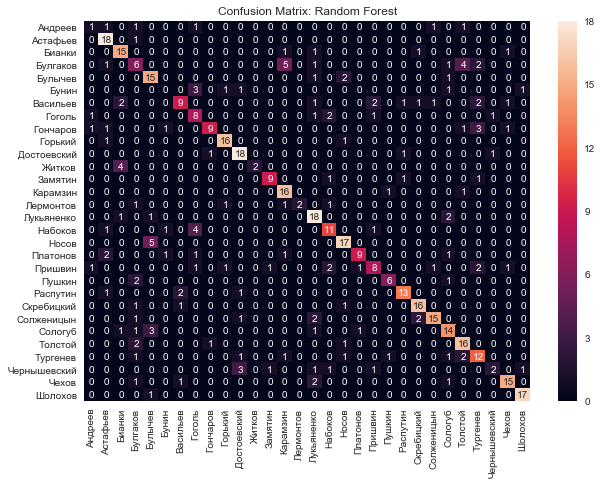

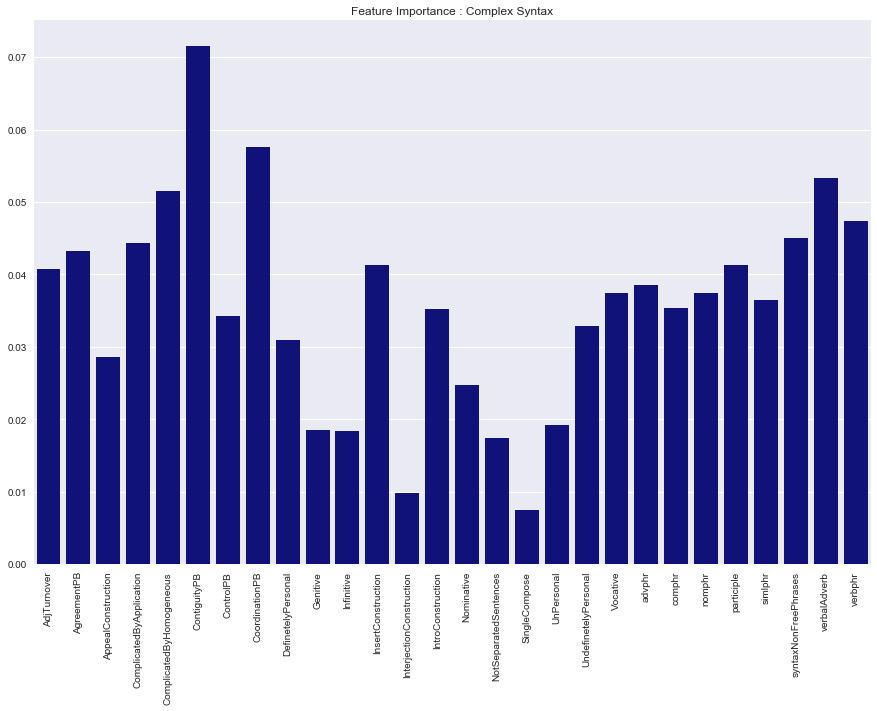

Current model: Logistic Regression
Accuracy  	mean: 0.78357
Precision 	mean: 0.78395
Recall    	mean: 0.78357
f1        	mean: 0.77230


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

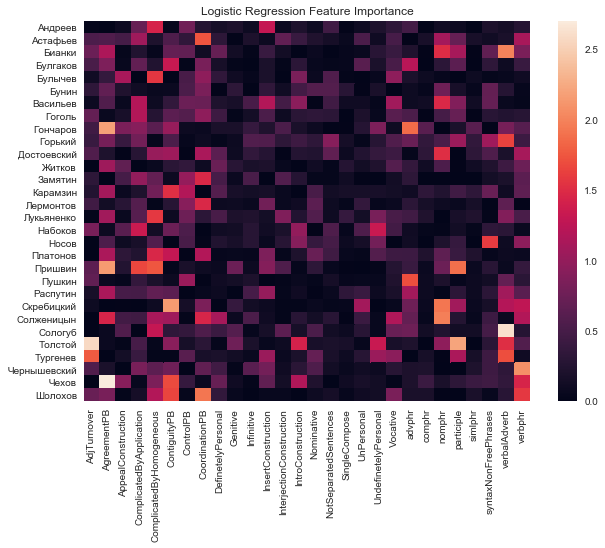

Current model: Linear SVC
Accuracy  	mean: 0.78211
Precision 	mean: 0.77953
Recall    	mean: 0.78211
f1        	mean: 0.77367


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

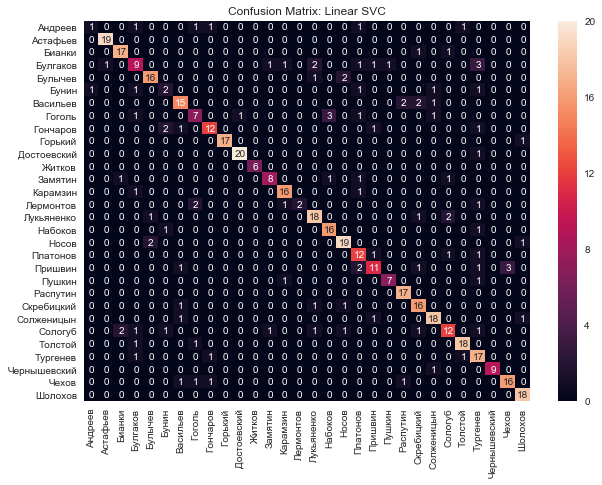

In [494]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)




<Figure size 432x288 with 0 Axes>

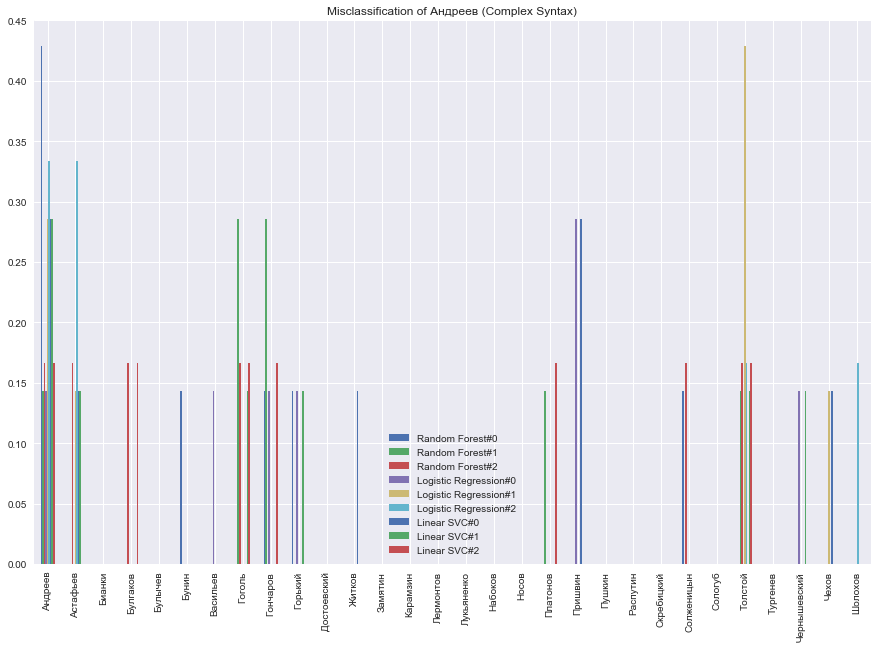

<Figure size 432x288 with 0 Axes>

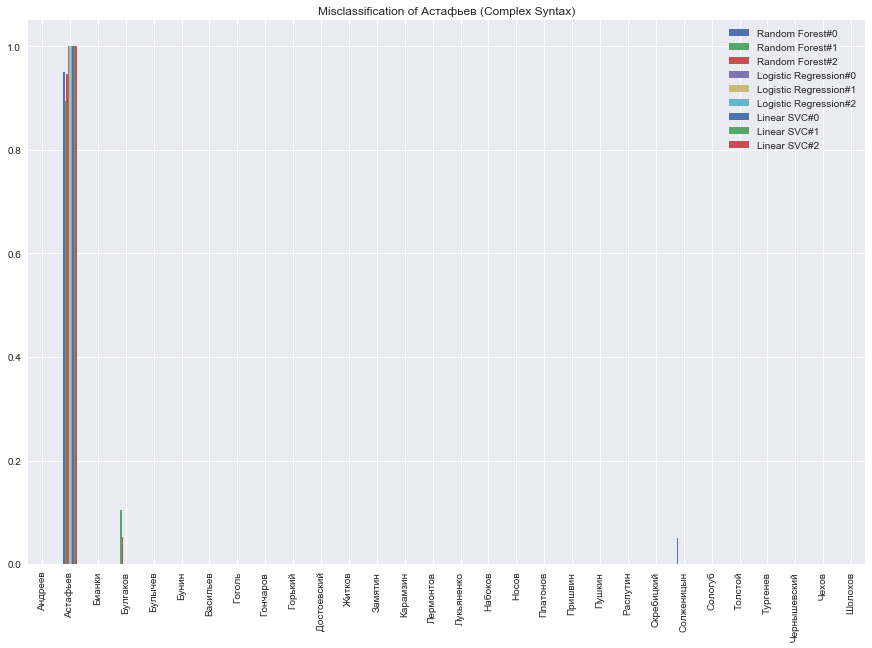

<Figure size 432x288 with 0 Axes>

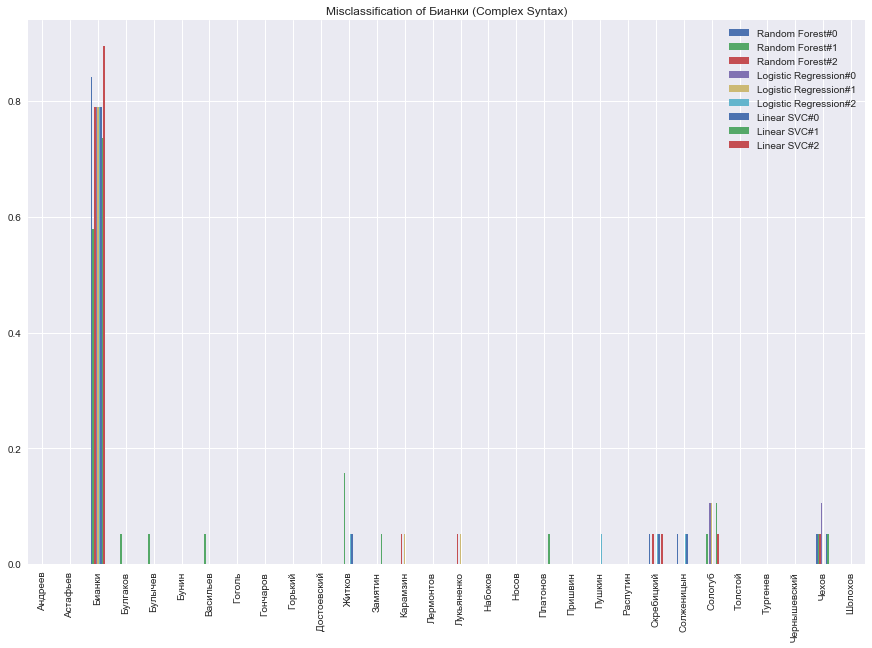

<Figure size 432x288 with 0 Axes>

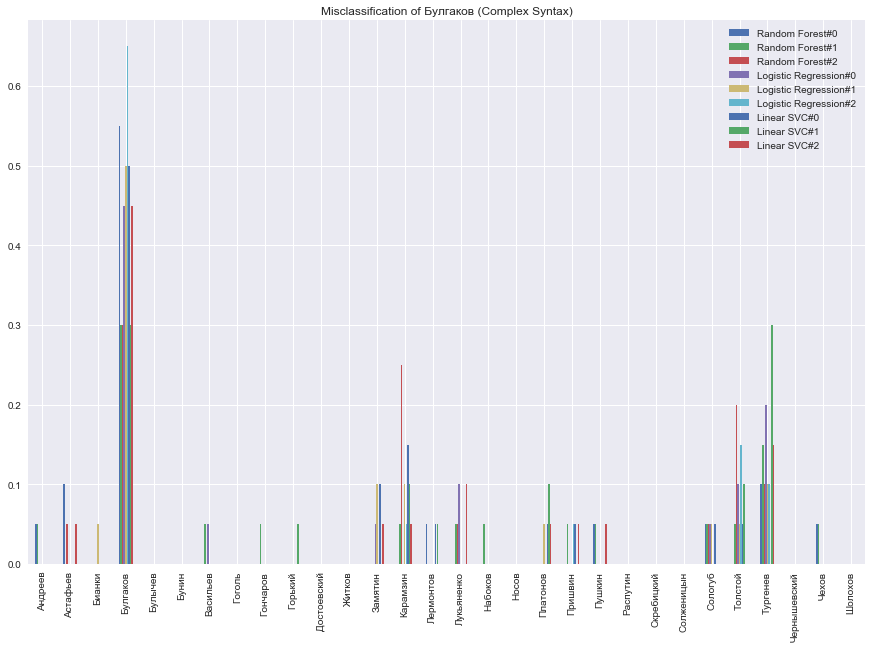

<Figure size 432x288 with 0 Axes>

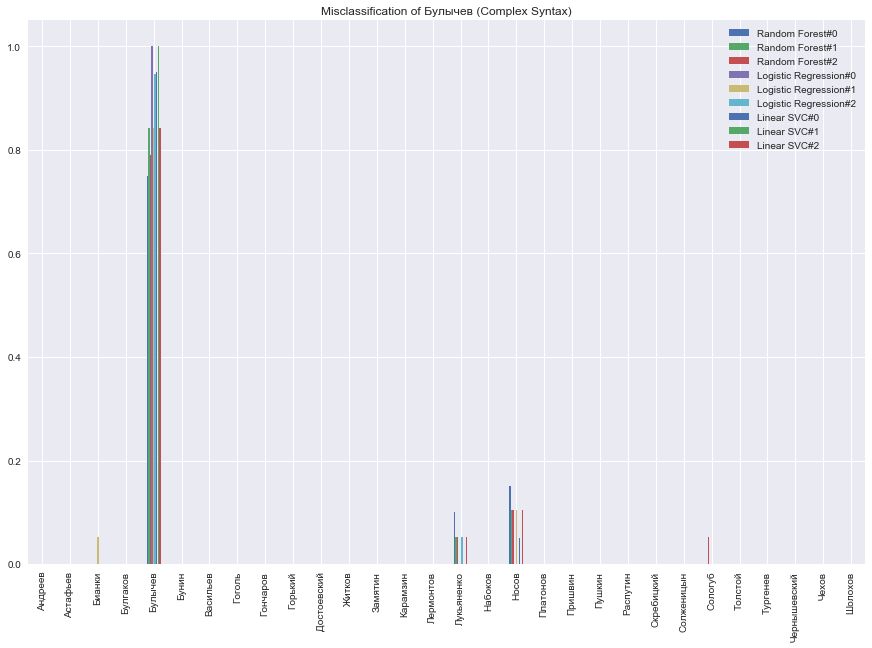

<Figure size 432x288 with 0 Axes>

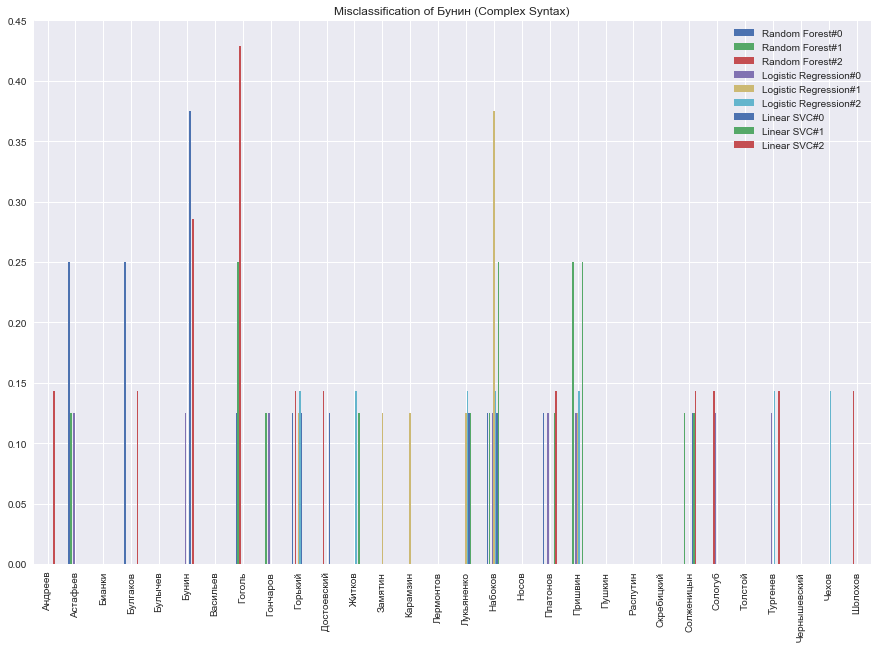

<Figure size 432x288 with 0 Axes>

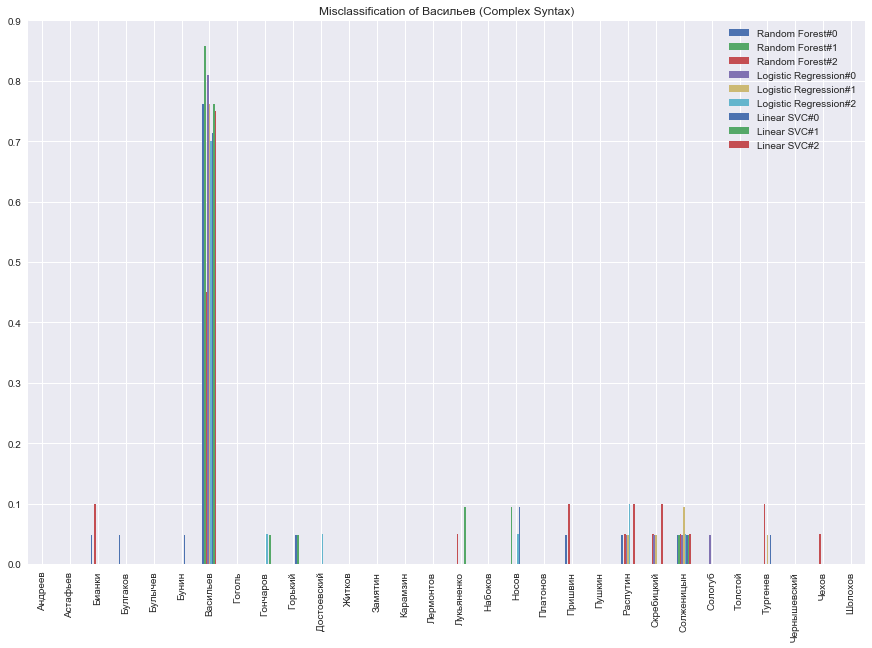

<Figure size 432x288 with 0 Axes>

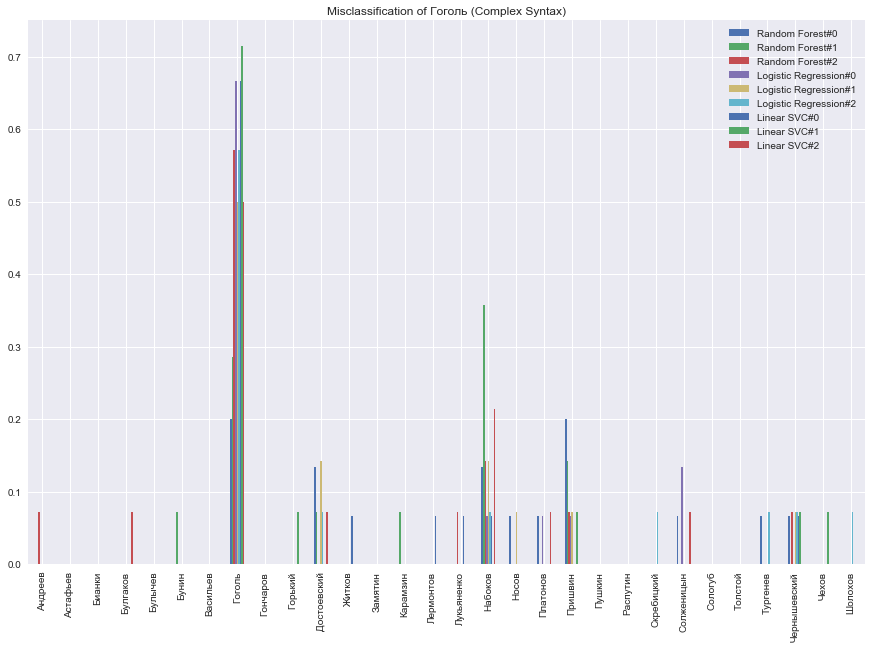

<Figure size 432x288 with 0 Axes>

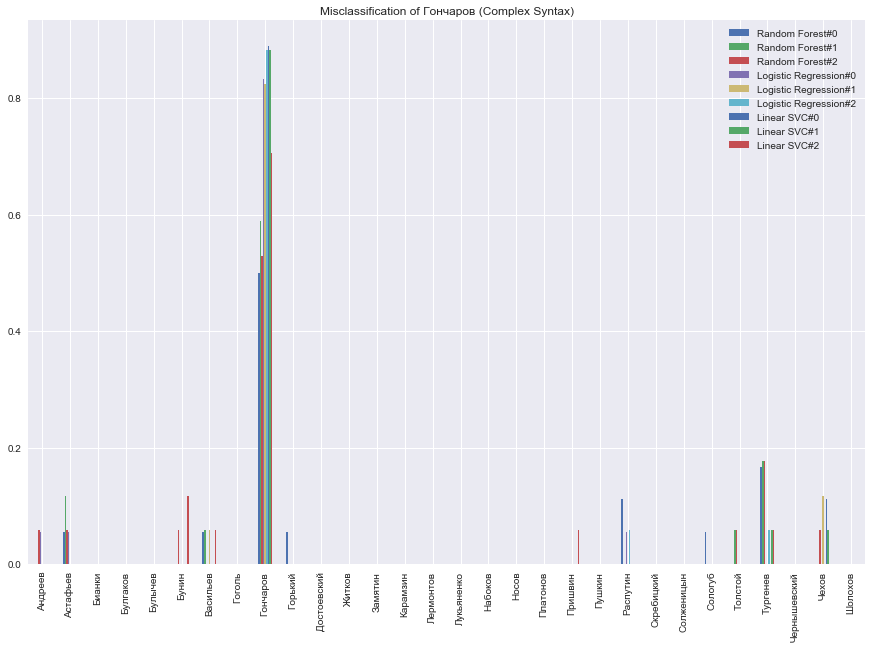

<Figure size 432x288 with 0 Axes>

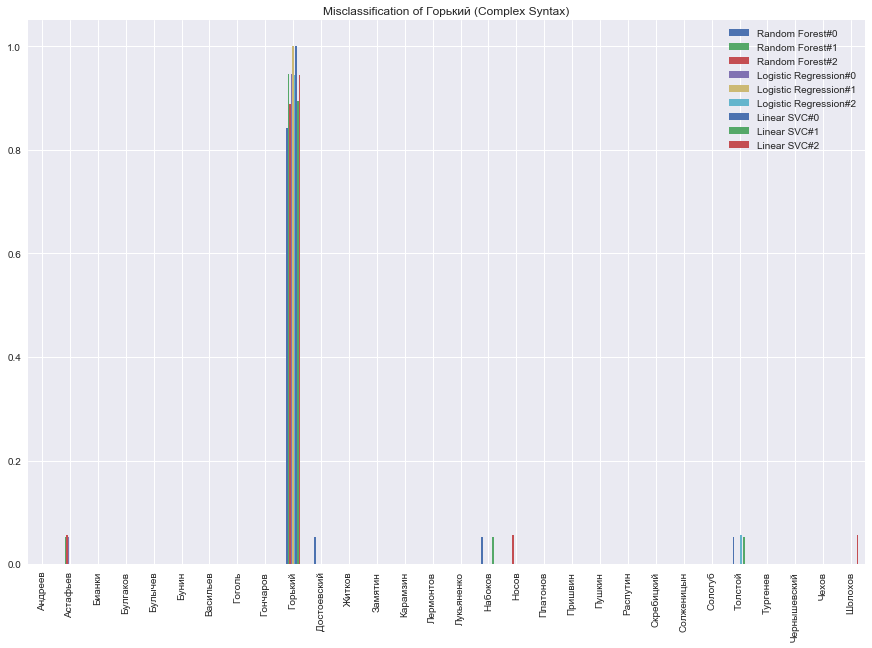

<Figure size 432x288 with 0 Axes>

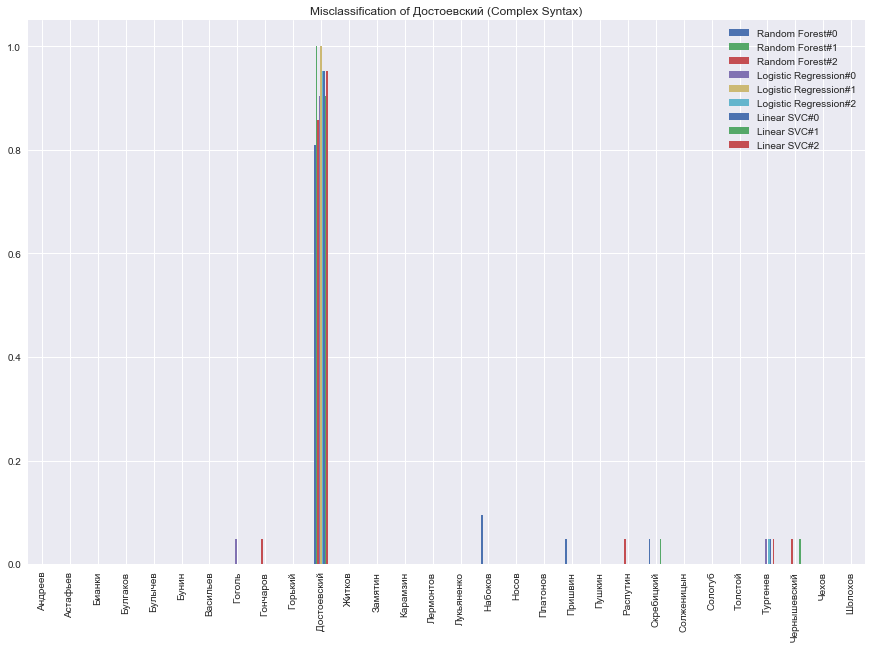

<Figure size 432x288 with 0 Axes>

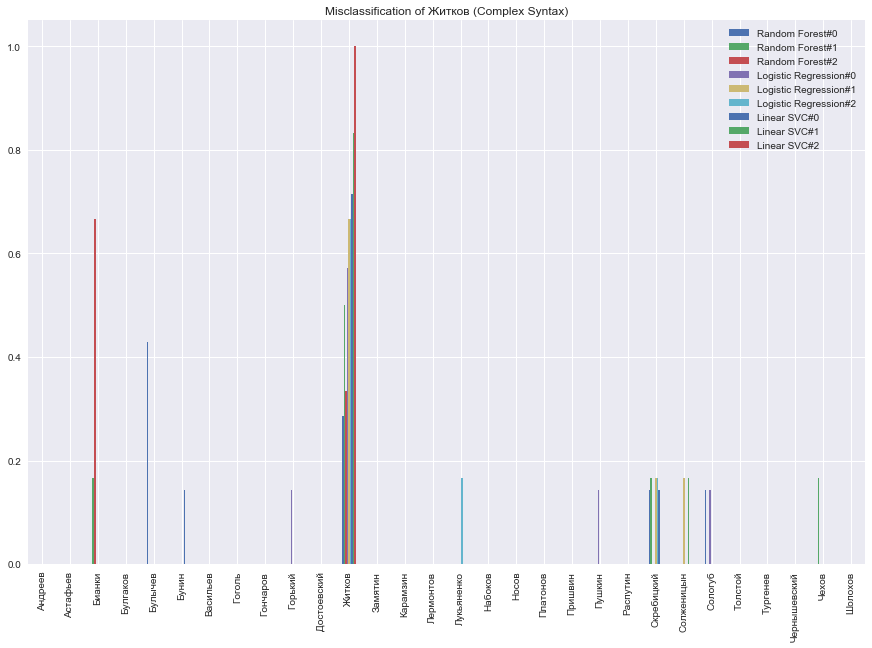

<Figure size 432x288 with 0 Axes>

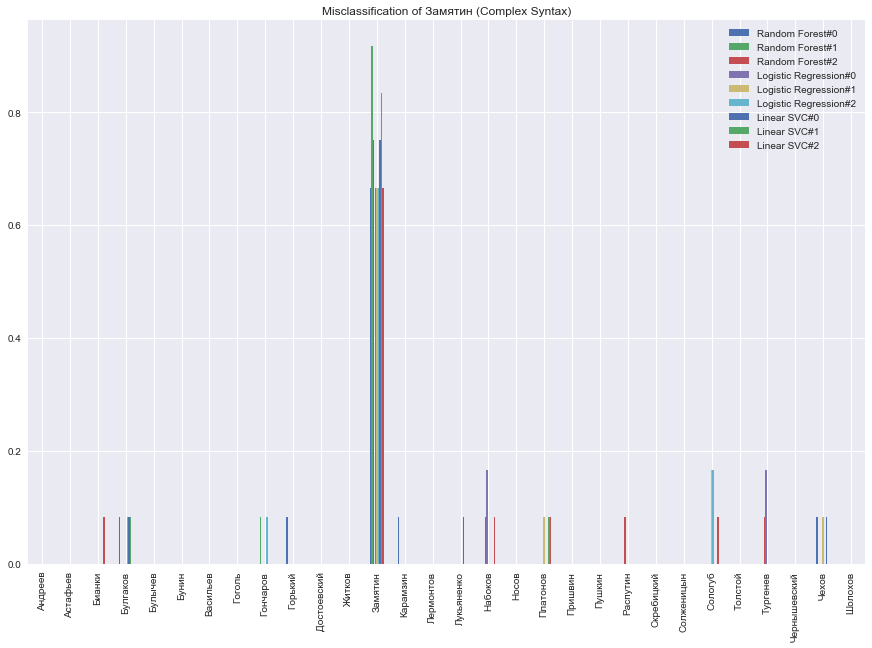

<Figure size 432x288 with 0 Axes>

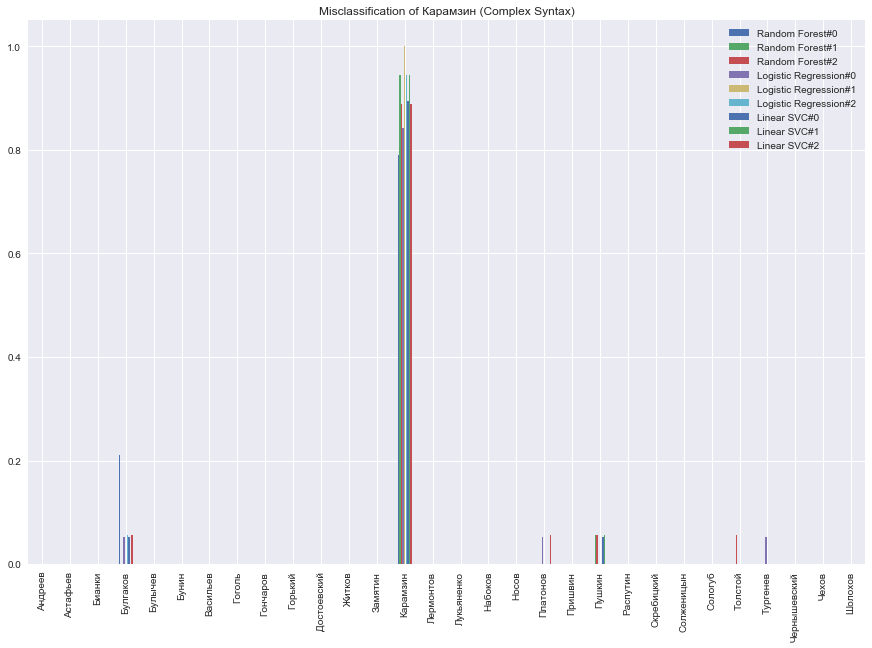

<Figure size 432x288 with 0 Axes>

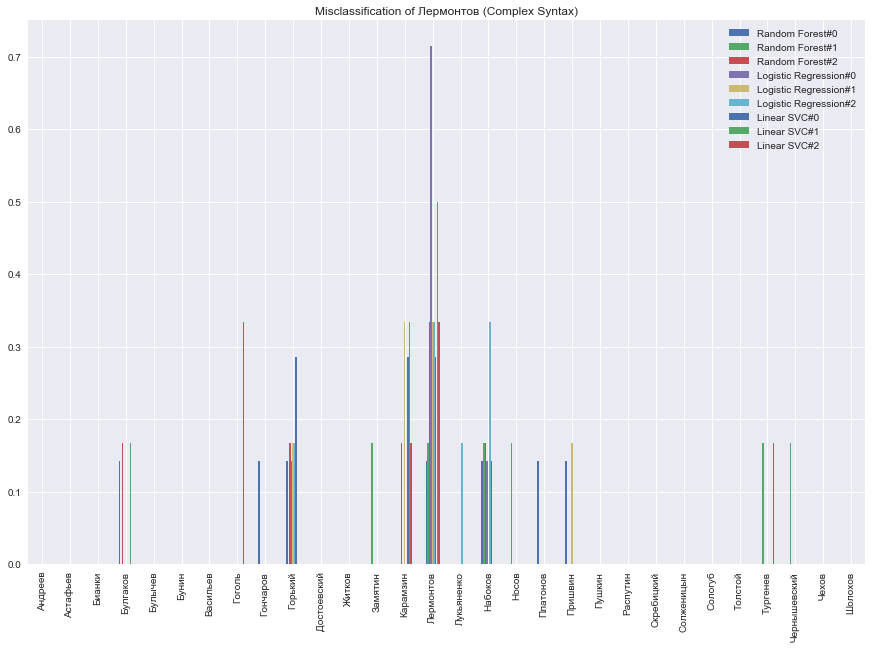

<Figure size 432x288 with 0 Axes>

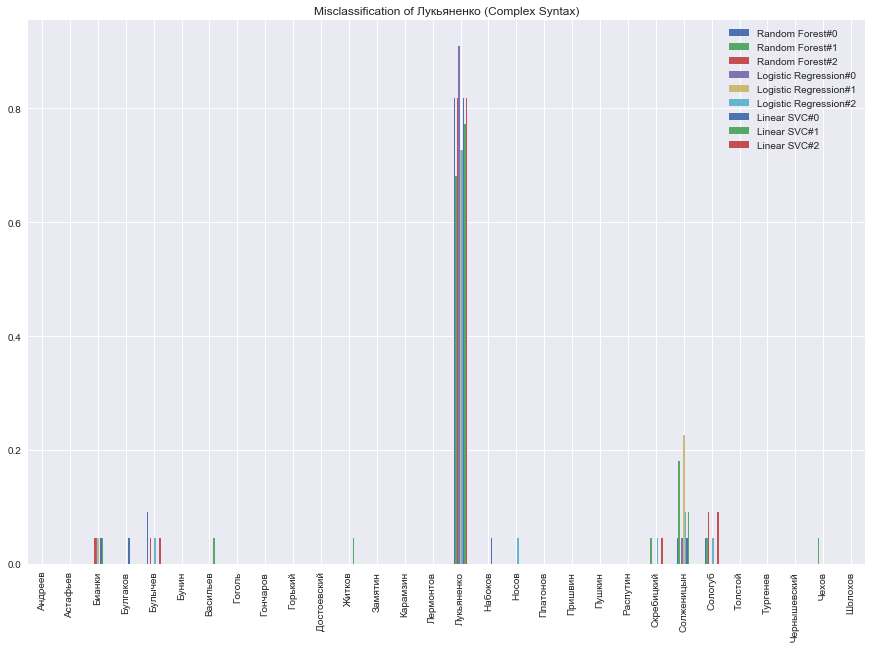

<Figure size 432x288 with 0 Axes>

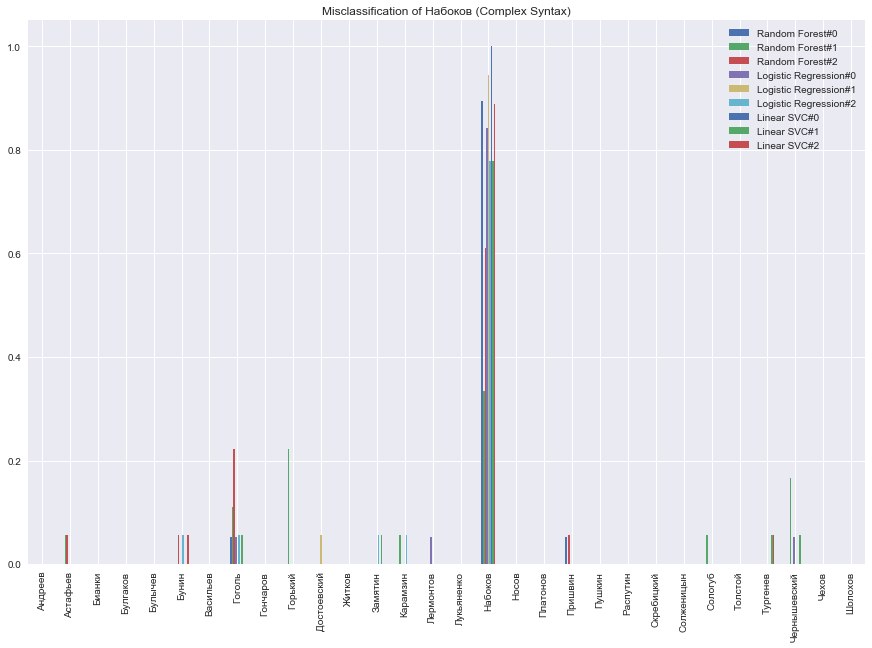

<Figure size 432x288 with 0 Axes>

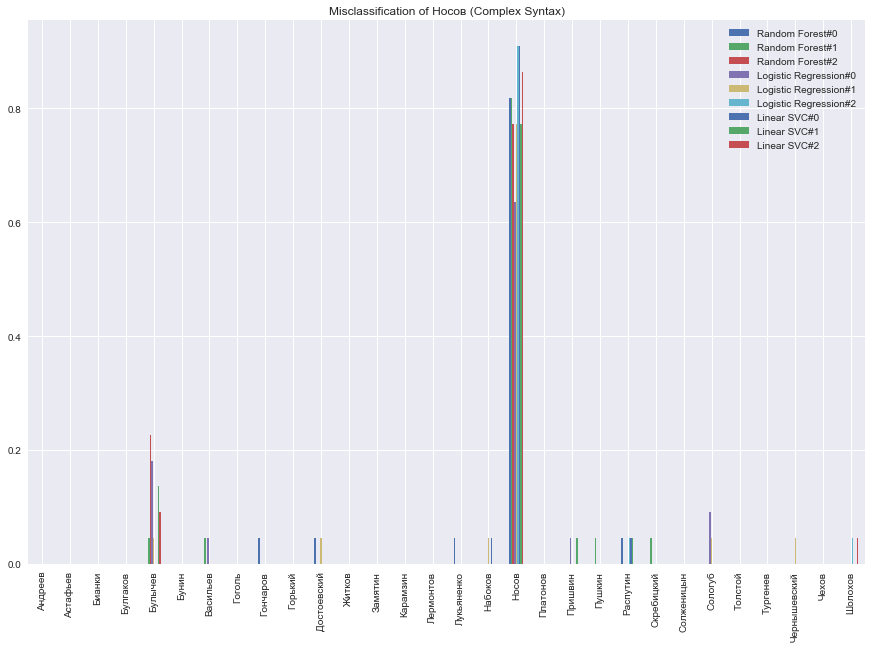

<Figure size 432x288 with 0 Axes>

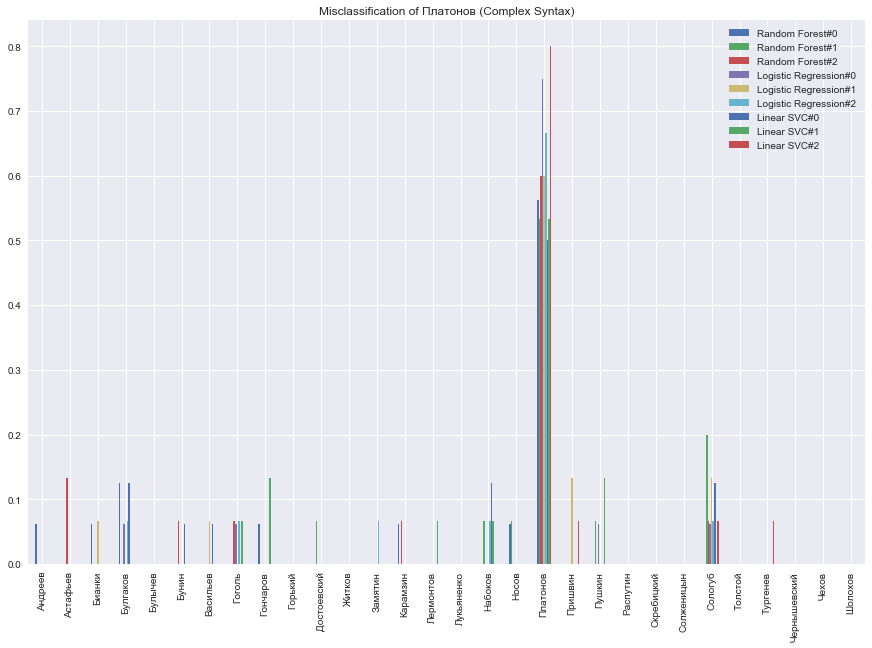

<Figure size 432x288 with 0 Axes>

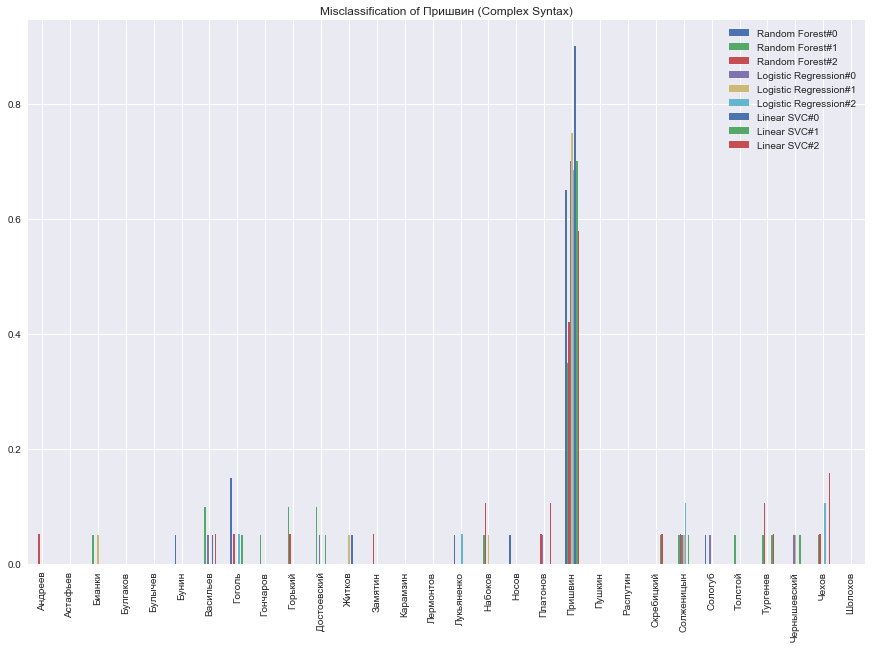

<Figure size 432x288 with 0 Axes>

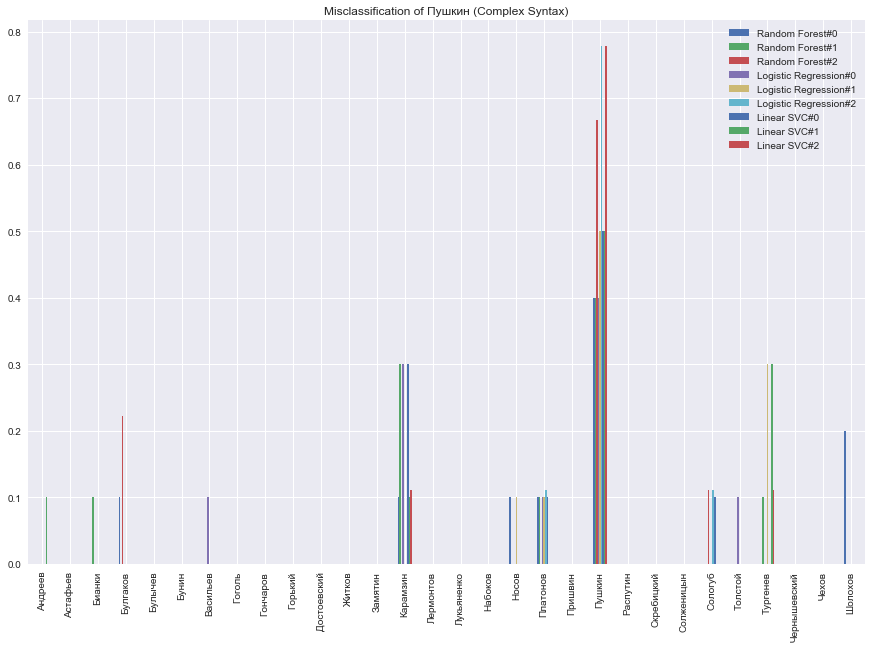

<Figure size 432x288 with 0 Axes>

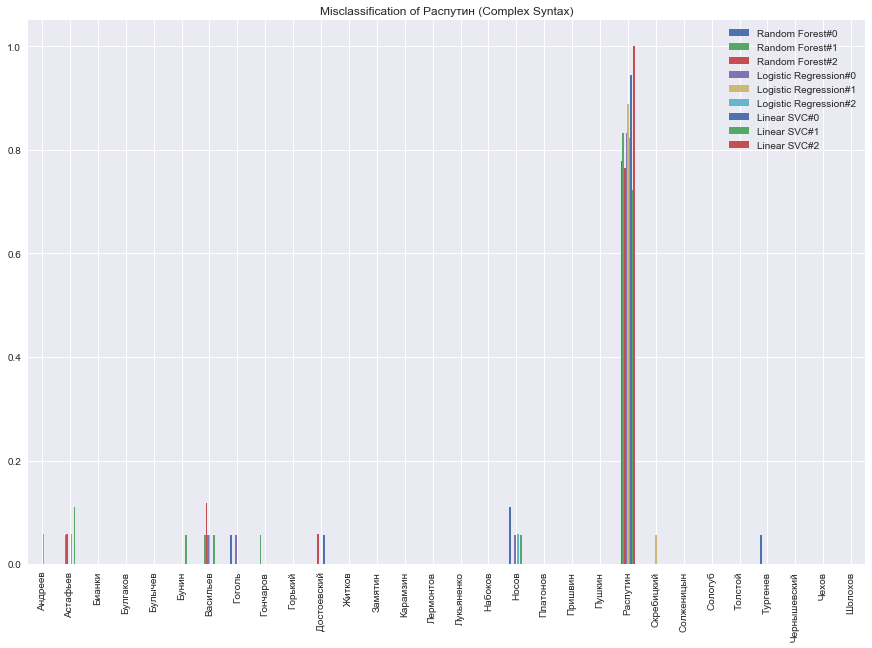

<Figure size 432x288 with 0 Axes>

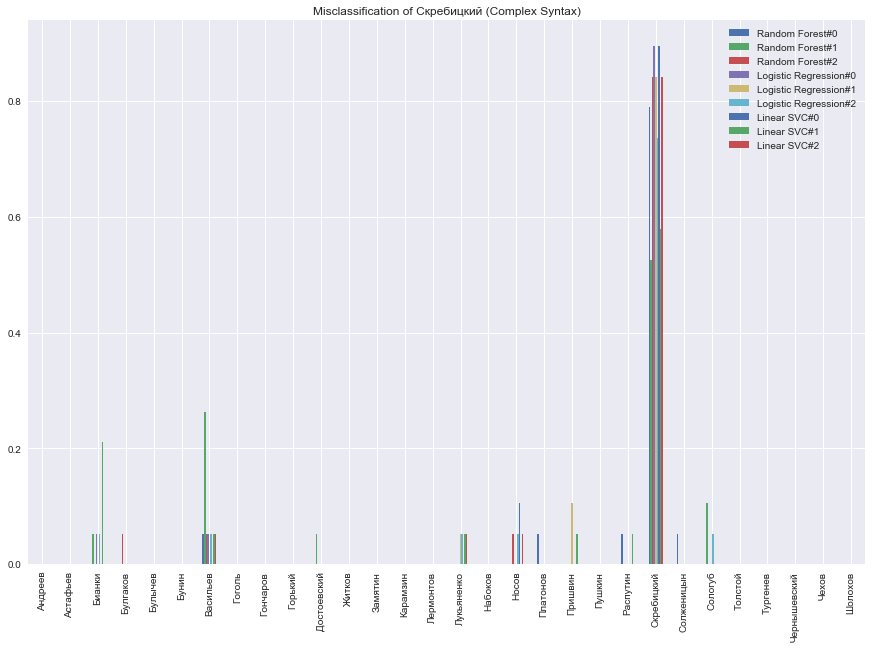

<Figure size 432x288 with 0 Axes>

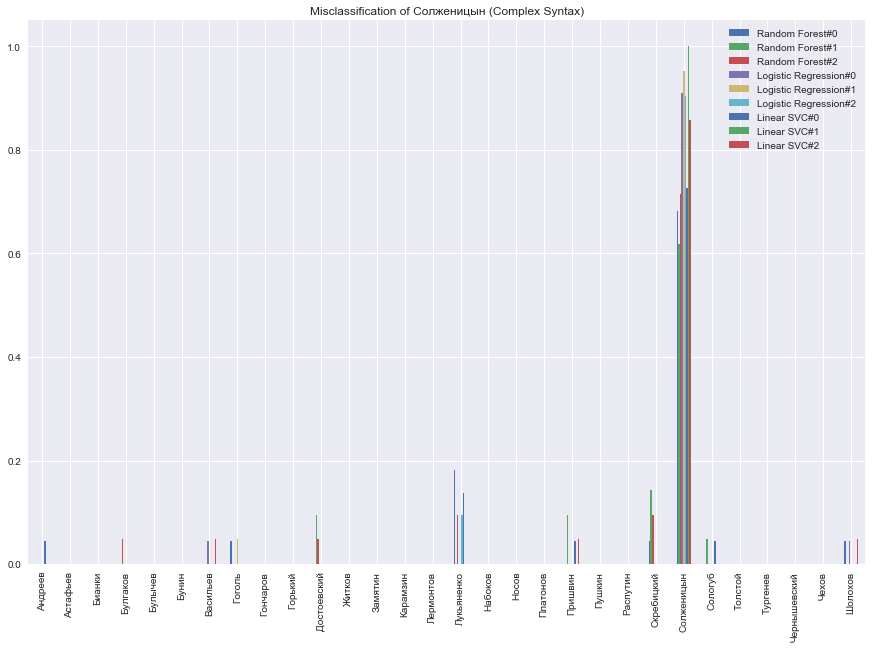

<Figure size 432x288 with 0 Axes>

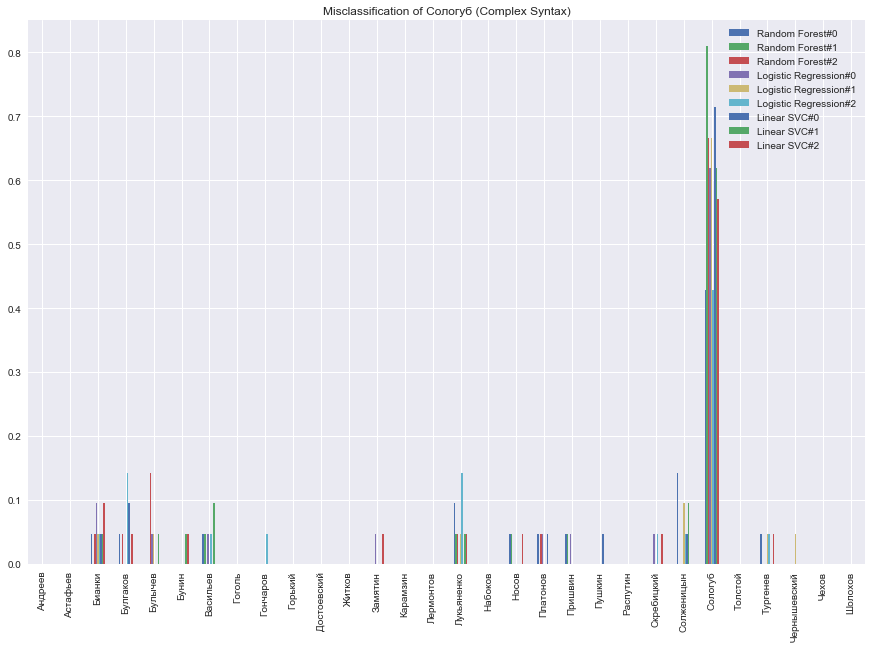

<Figure size 432x288 with 0 Axes>

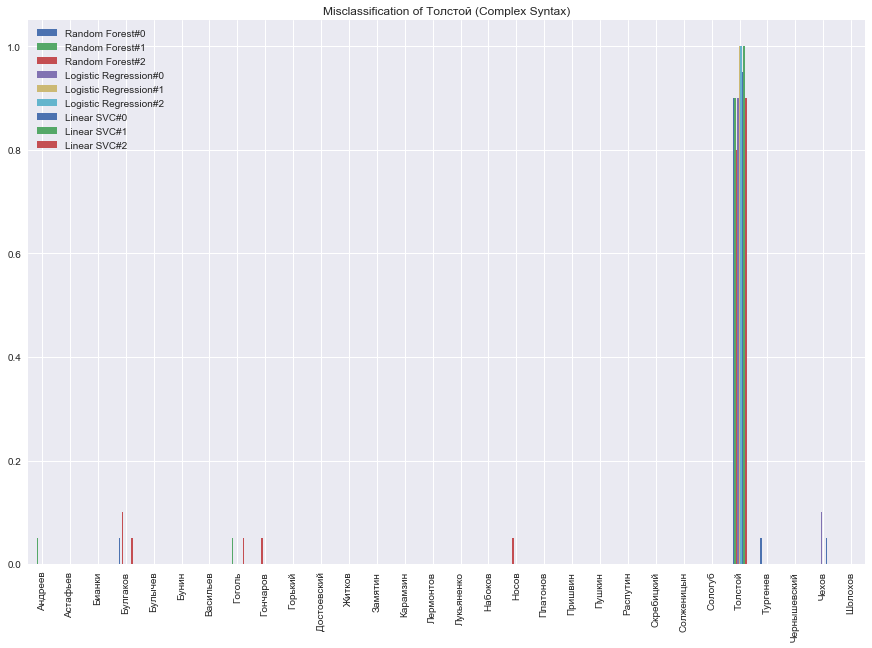

<Figure size 432x288 with 0 Axes>

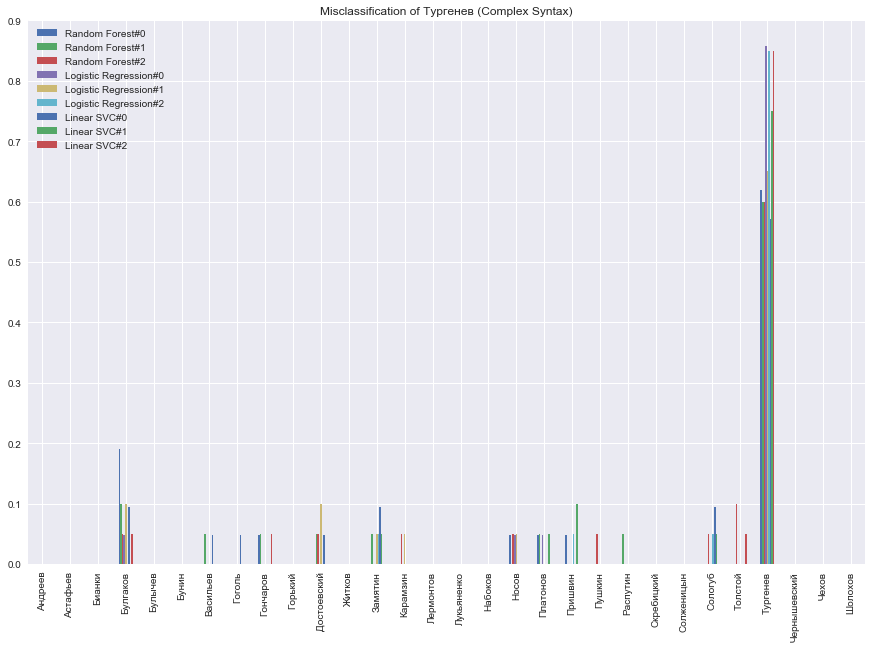

<Figure size 432x288 with 0 Axes>

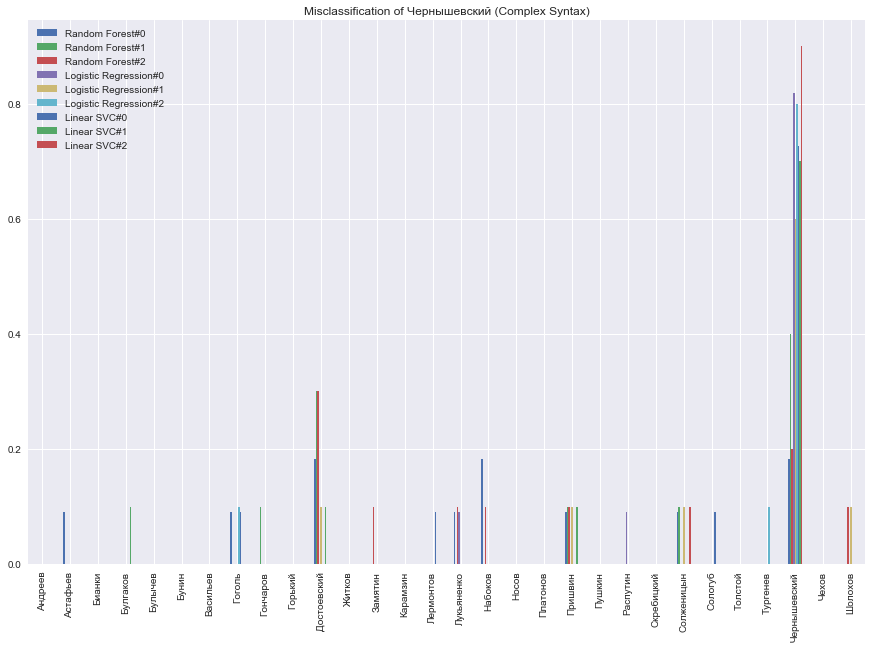

<Figure size 432x288 with 0 Axes>

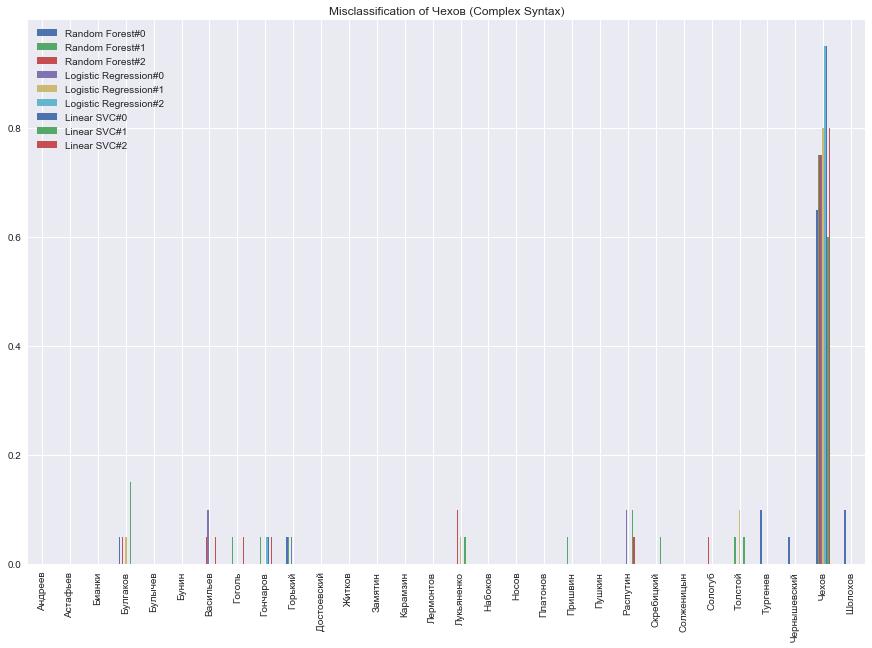

<Figure size 432x288 with 0 Axes>

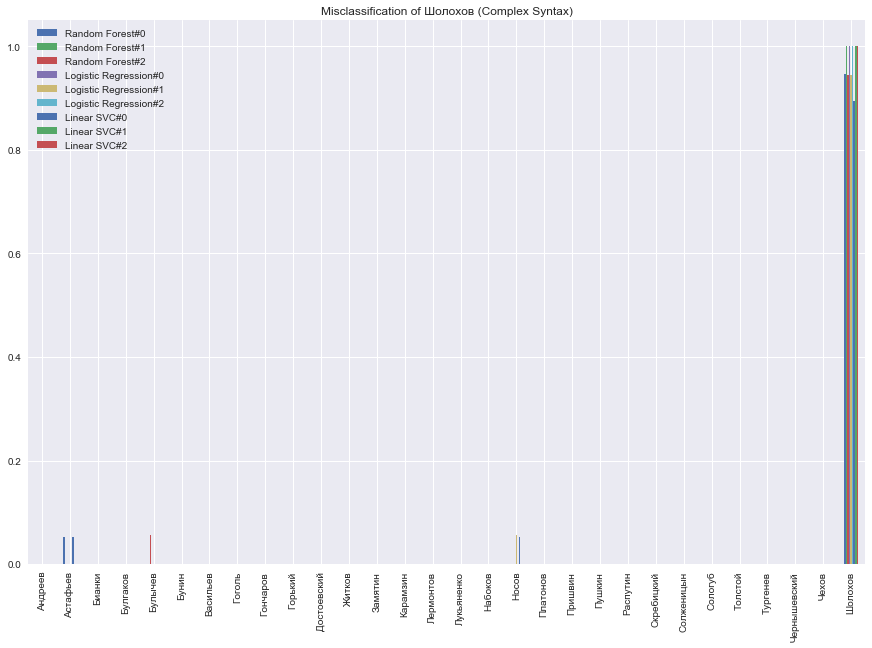

In [495]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [496]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [497]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

# Bigram Treelets

In [498]:
currentPart = 'Bigram Treelets'

BigramTreeletDF = pd.read_csv('OutData/BigramTreelet.csv')
print('Shape: {}'.format(BigramTreeletDF.shape))
BigramTreeletDF.head()

Shape: (1506, 5858)


,"('', '', '')","('', '', 'SPACE')","('', 'ROOT', '')","('', 'acl', '')","('', 'acl', 'ADJ')","('', 'acl', 'ADV')","('', 'acl', 'AUX')","('', 'acl', 'NOUN')","('', 'acl', 'NUM')","('', 'acl', 'PRON')",...,"('X', 'punct', 'PART')","('X', 'punct', 'PRON')","('X', 'punct', 'PROPN')","('X', 'punct', 'PUNCT')","('X', 'punct', 'SCONJ')","('X', 'punct', 'VERB')","('X', 'punct', 'X')","('X', 'xcomp', 'VERB')",Author,Novel
0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Андреев,Ангелочек
1,0.000910,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000606,0.0,0.0,0.0,0.0,Андреев,Баргамот и Гараська
2,0.004295,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Андреев,Бездна
3,0.002980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Андреев,Большой шлем
4,0.003840,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,Андреев,В подвале


In [499]:
X = BigramTreeletDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = BigramTreeletDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = BigramTreeletDF.Author.values

countOfAuthors = len(BigramTreeletDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors


##### Hopkins stats and clustering metrics

In [361]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8676801272024124
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.33287716220029306
	AMI: 0.5221919911371768


Current model: Random Forest
Accuracy  	mean: 0.74184
Precision 	mean: 0.75890
Recall    	mean: 0.74184
f1        	mean: 0.72705
Current model: Logistic Regression
Accuracy  	mean: 0.86989
Precision 	mean: 0.86232
Recall    	mean: 0.86989
f1        	mean: 0.85654
Current model: Linear SVC
Accuracy  	mean: 0.88843
Precision 	mean: 0.88852
Recall    	mean: 0.88843
f1        	mean: 0.87930


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

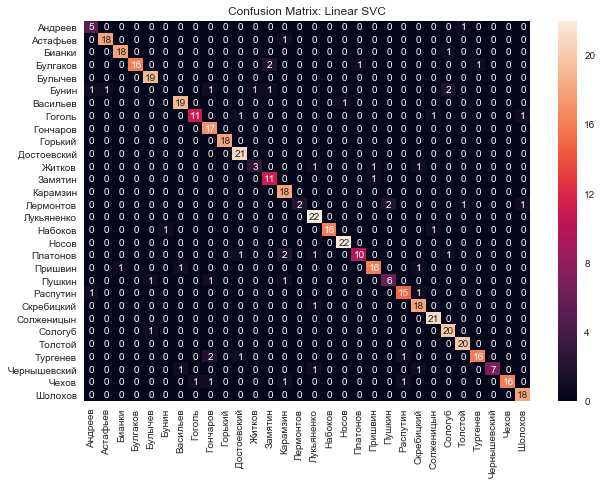

In [500]:
# classification_experiment(X, Y, list_of_models,
#                          currentPart, statStructure,
#                          name_of_features = name_of_features,
#                          count_of_folds = COUNT_OF_FOLDS,
#                          feature_importance_available = False,
#                          folder_with_results = directory,
#                          scaling = True)

predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = False,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)




<Figure size 432x288 with 0 Axes>

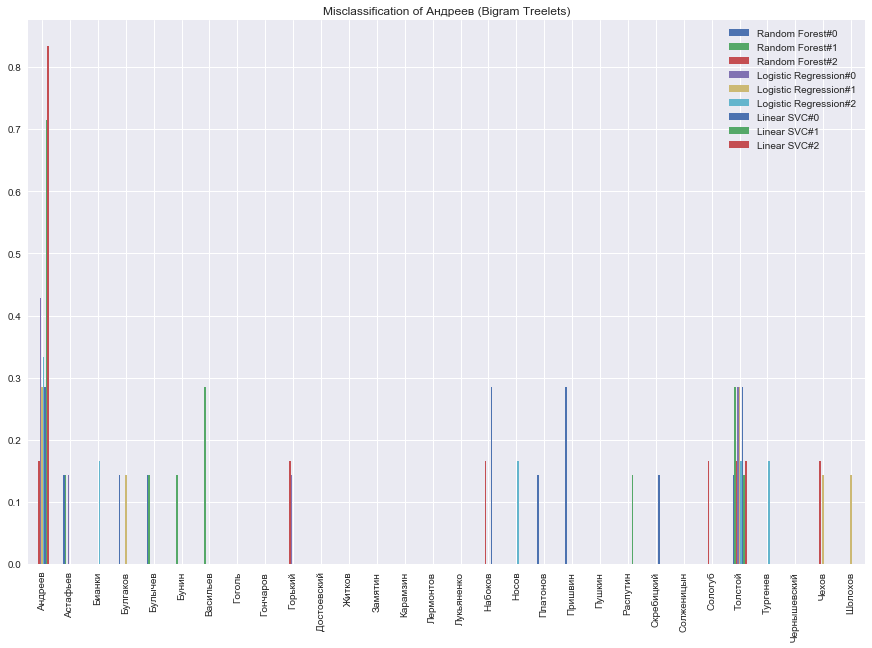

<Figure size 432x288 with 0 Axes>

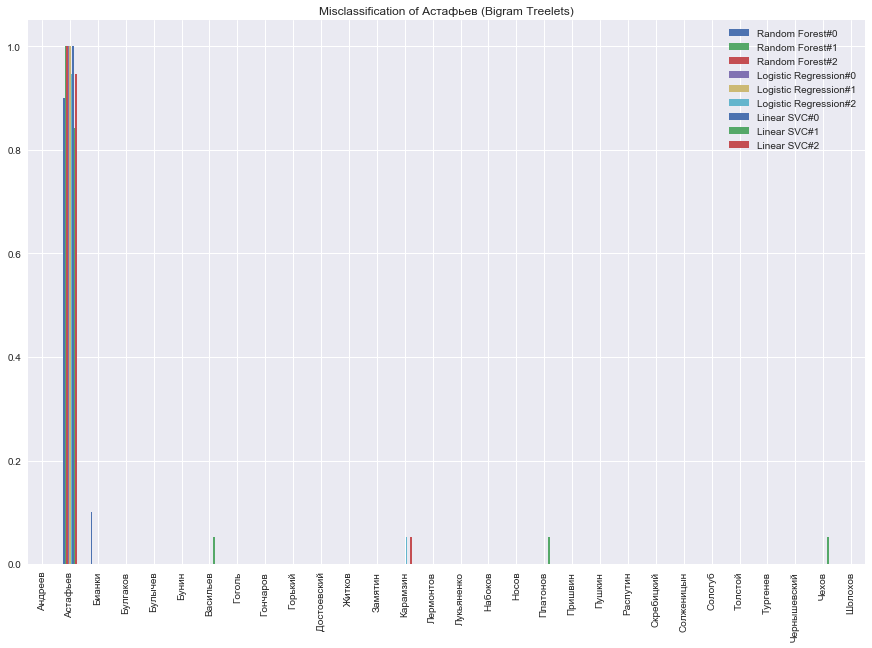

<Figure size 432x288 with 0 Axes>

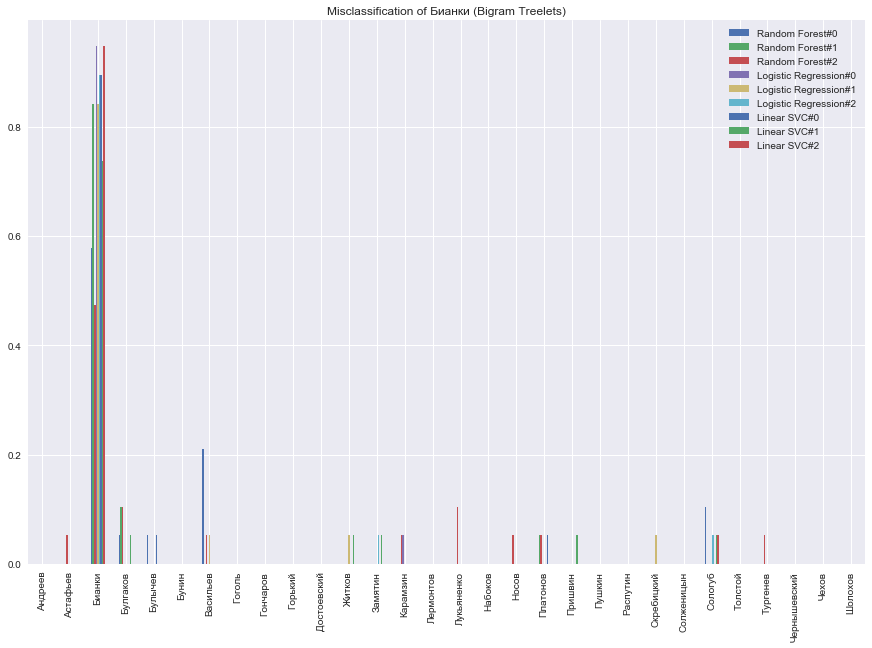

<Figure size 432x288 with 0 Axes>

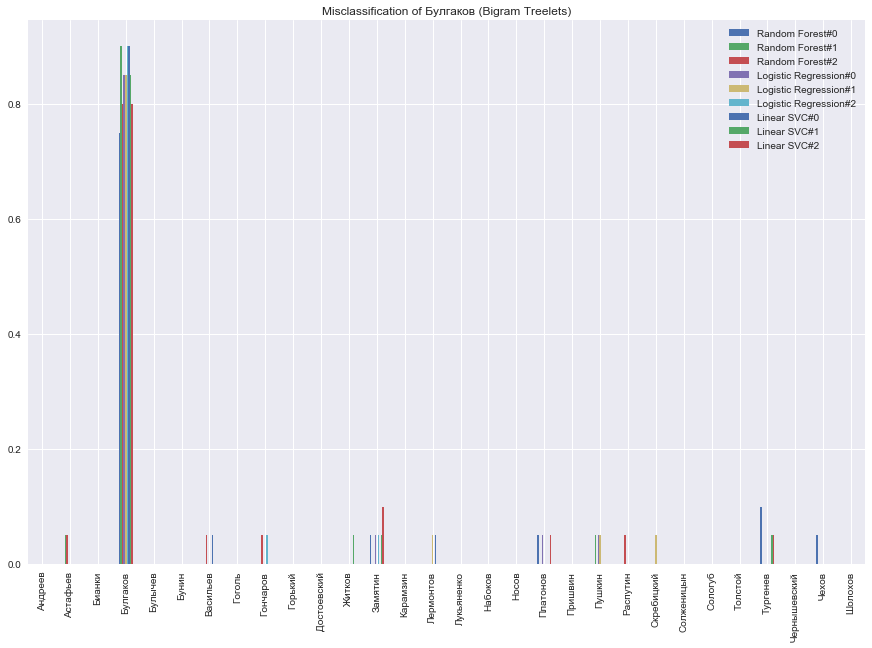

<Figure size 432x288 with 0 Axes>

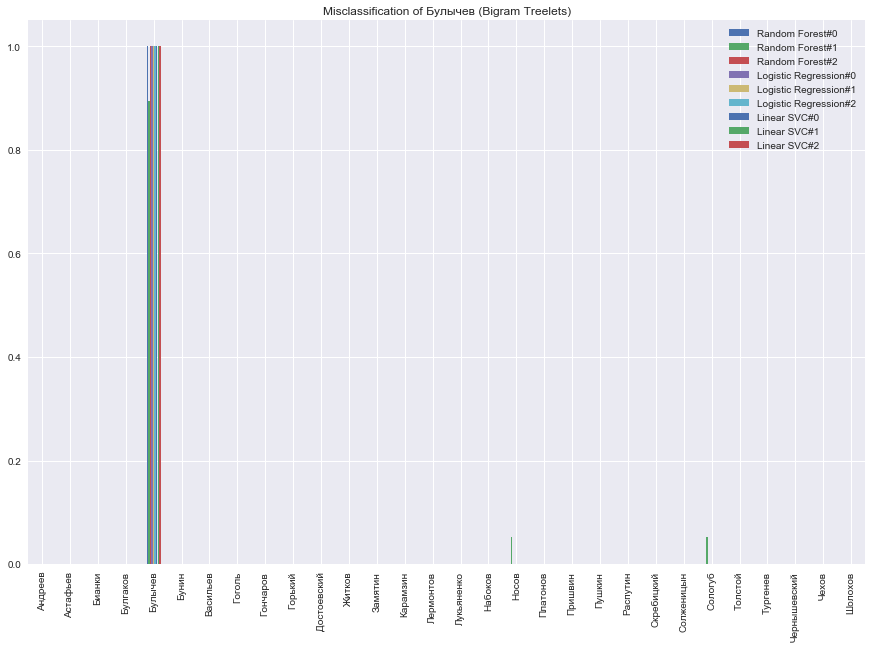

<Figure size 432x288 with 0 Axes>

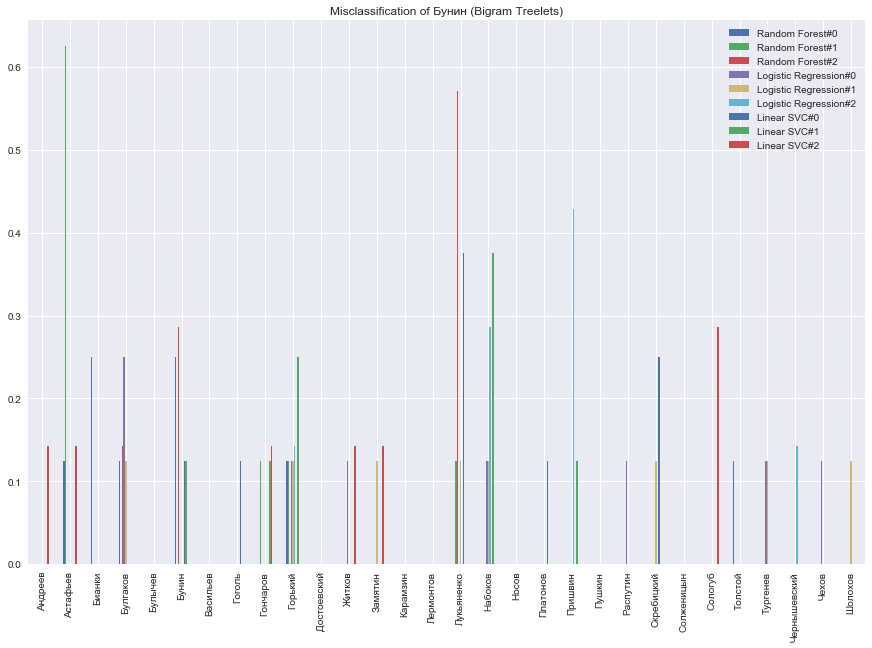

<Figure size 432x288 with 0 Axes>

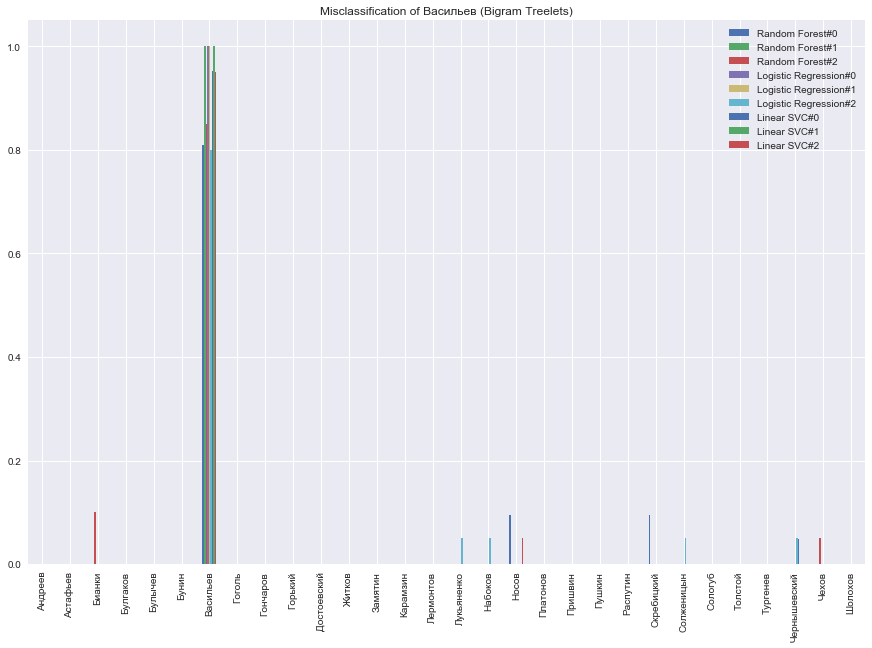

<Figure size 432x288 with 0 Axes>

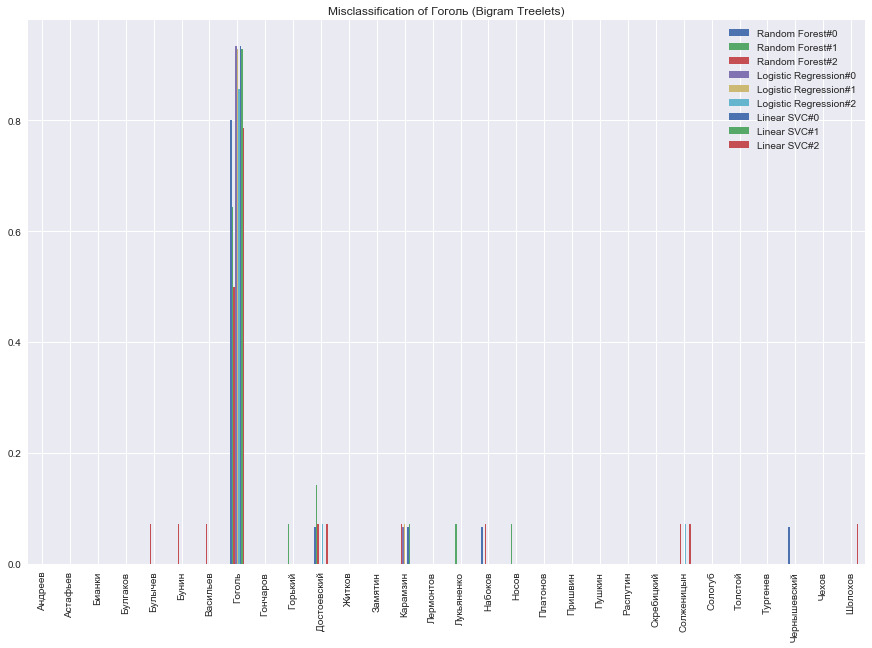

<Figure size 432x288 with 0 Axes>

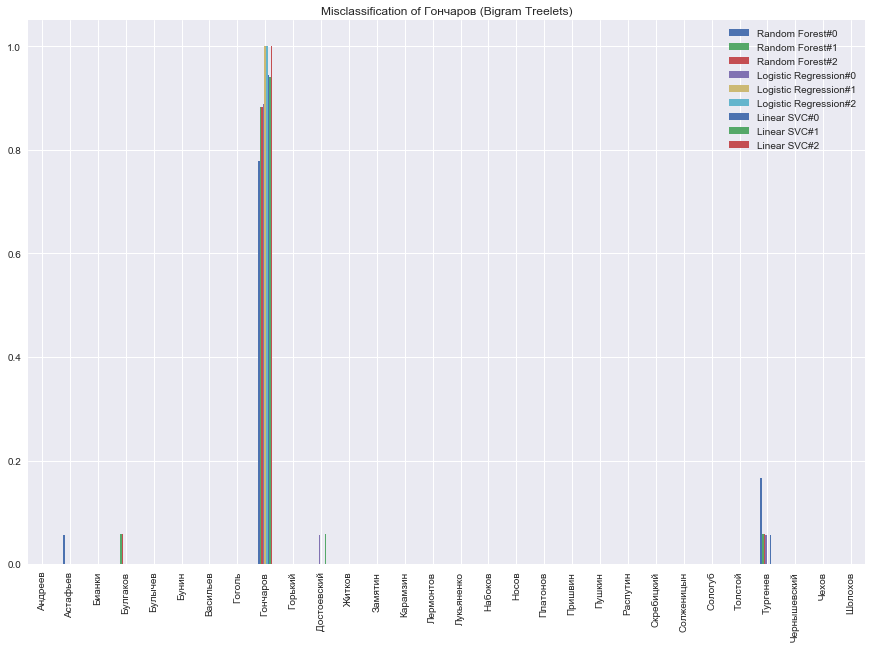

<Figure size 432x288 with 0 Axes>

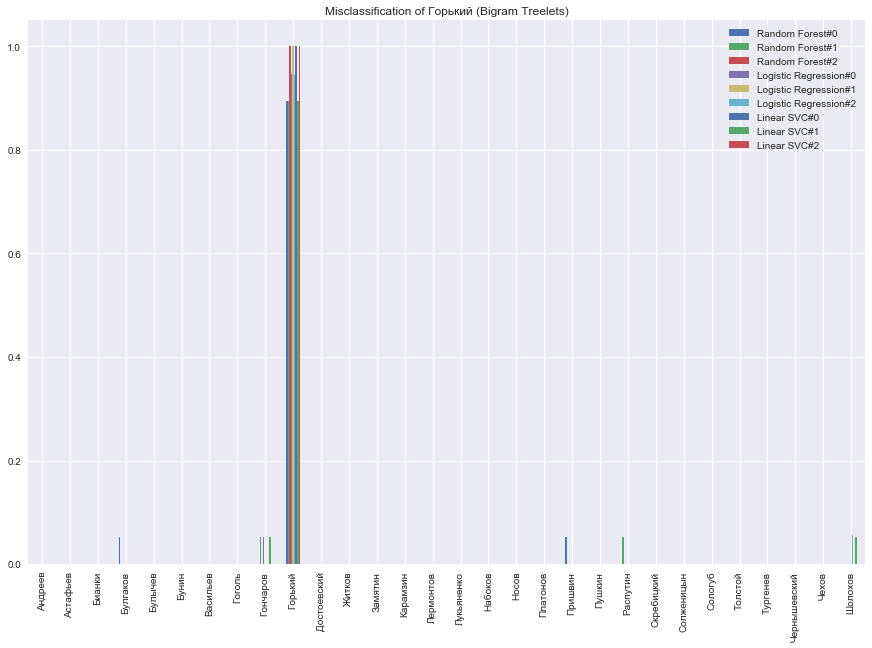

<Figure size 432x288 with 0 Axes>

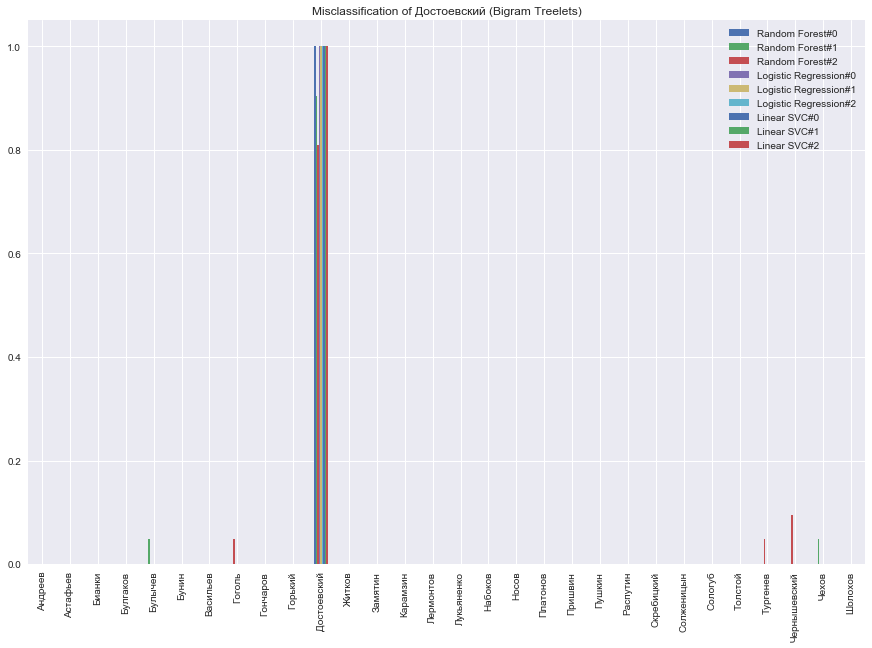

<Figure size 432x288 with 0 Axes>

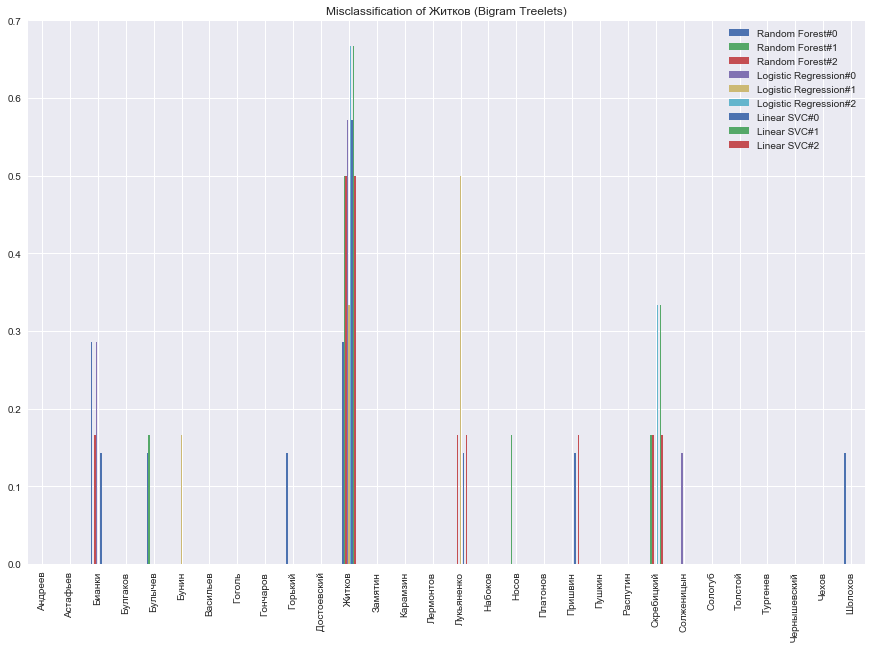

<Figure size 432x288 with 0 Axes>

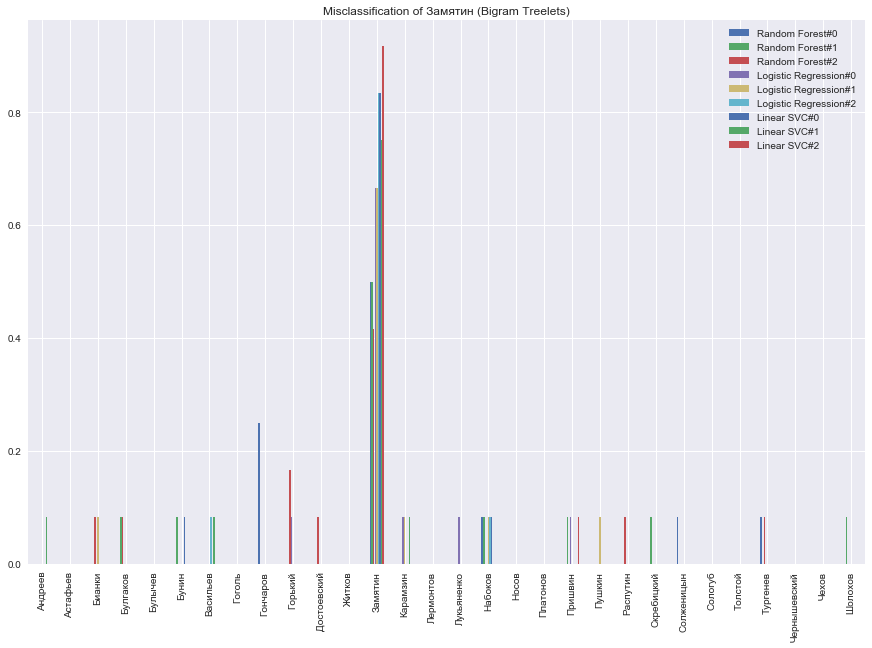

<Figure size 432x288 with 0 Axes>

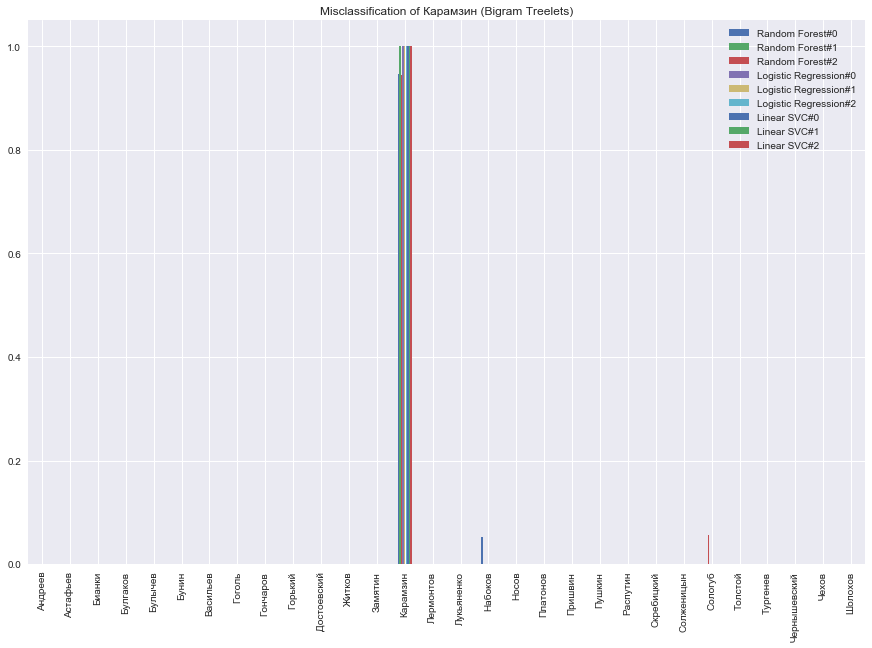

<Figure size 432x288 with 0 Axes>

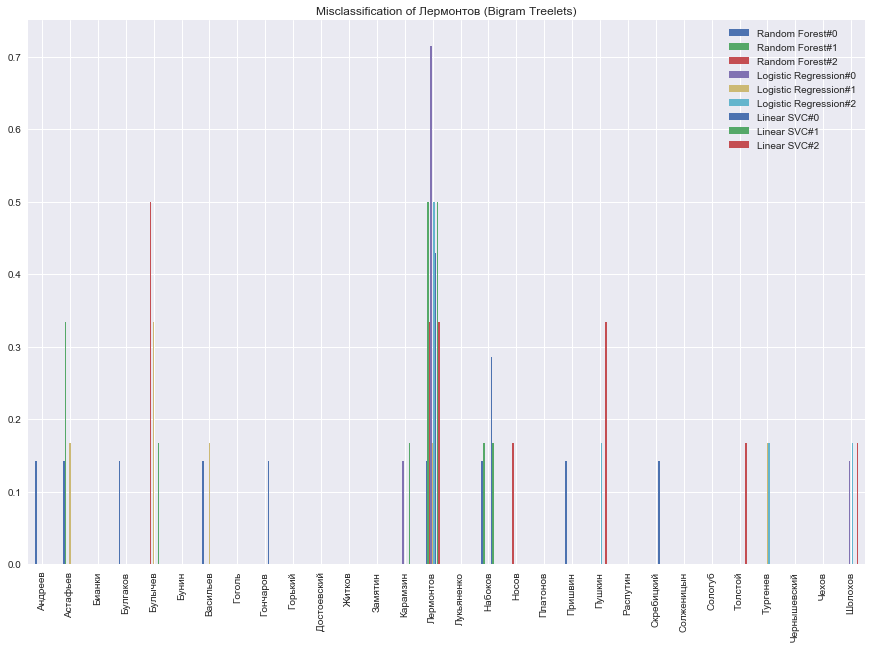

<Figure size 432x288 with 0 Axes>

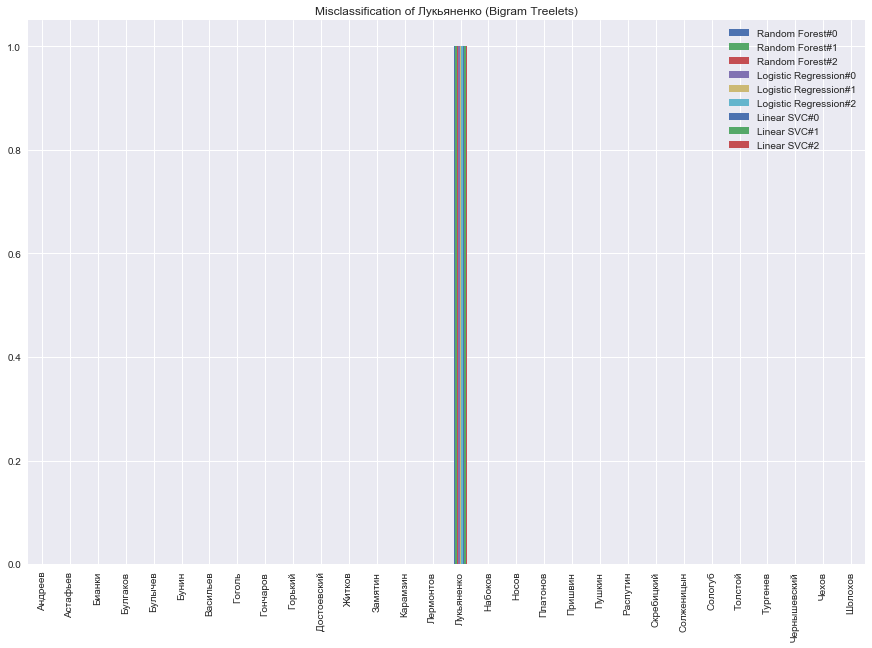

<Figure size 432x288 with 0 Axes>

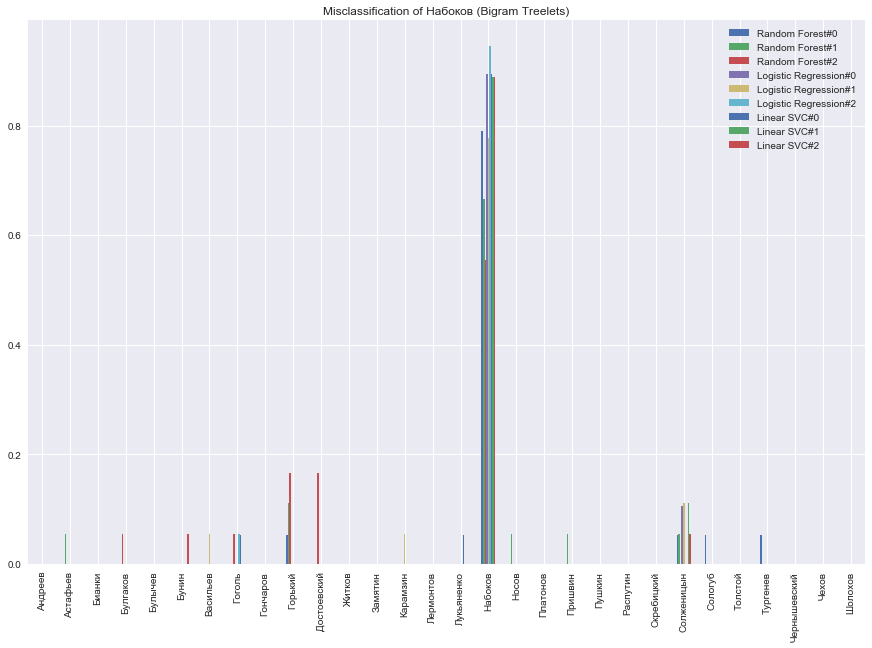

<Figure size 432x288 with 0 Axes>

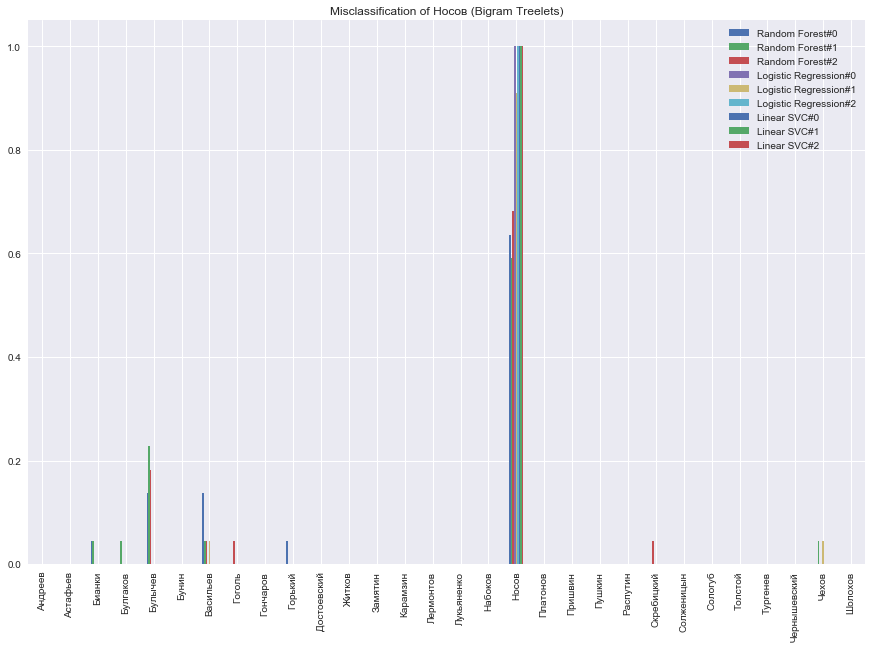

<Figure size 432x288 with 0 Axes>

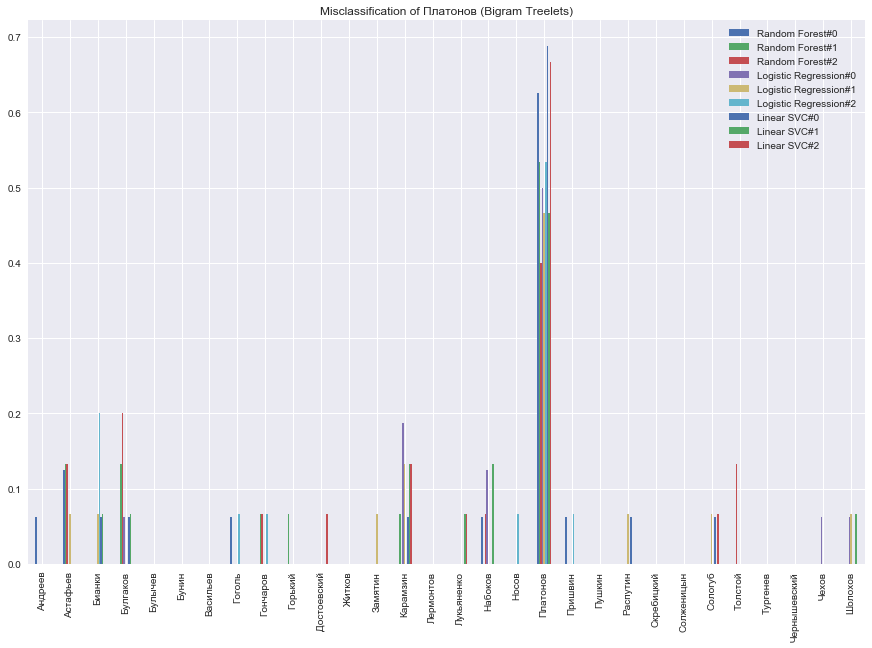

<Figure size 432x288 with 0 Axes>

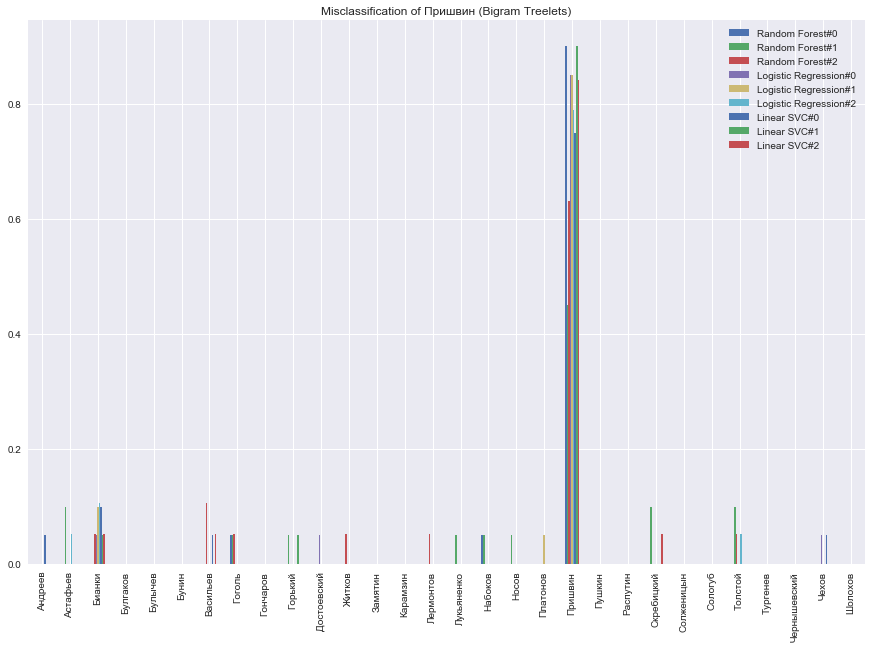

<Figure size 432x288 with 0 Axes>

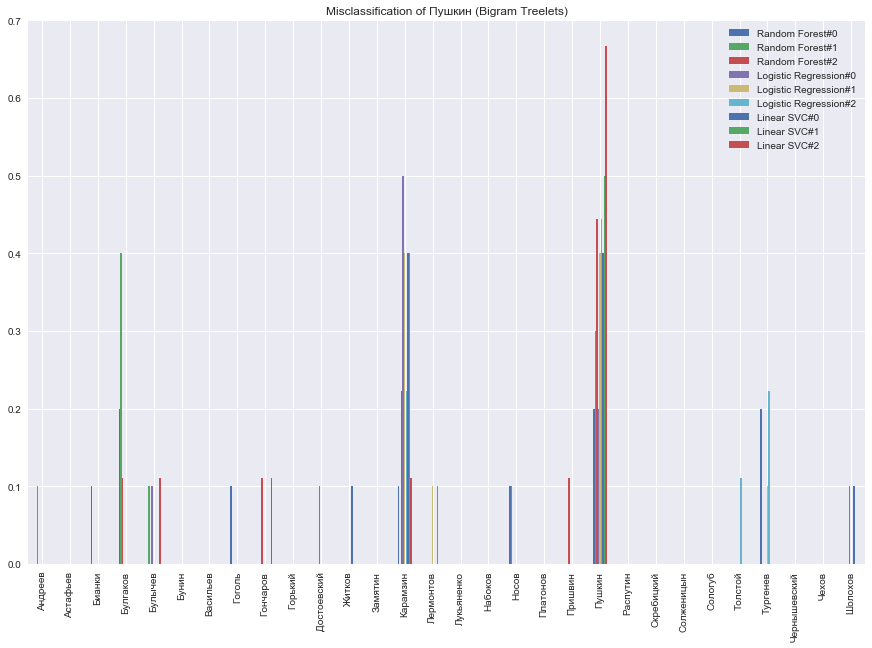

<Figure size 432x288 with 0 Axes>

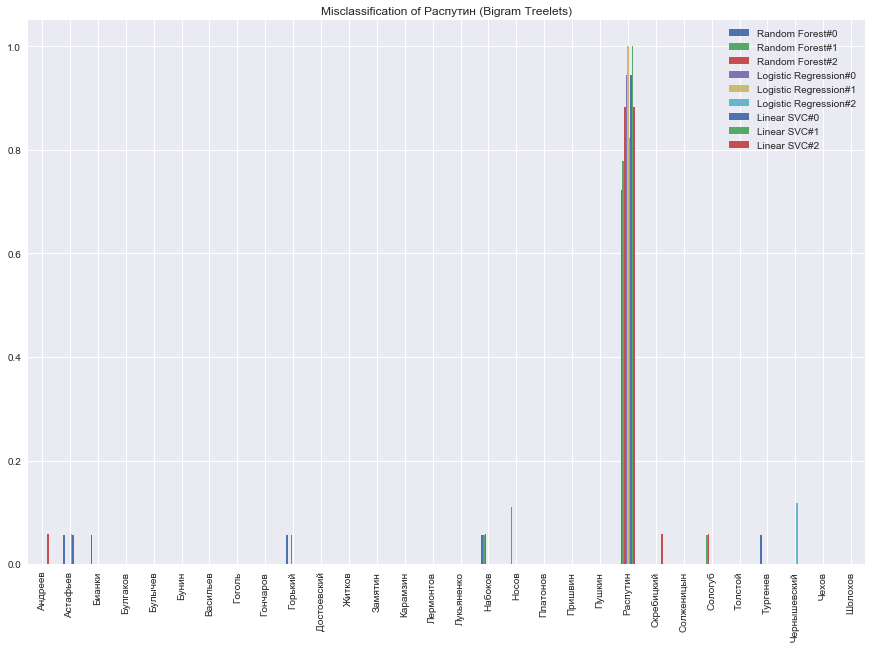

<Figure size 432x288 with 0 Axes>

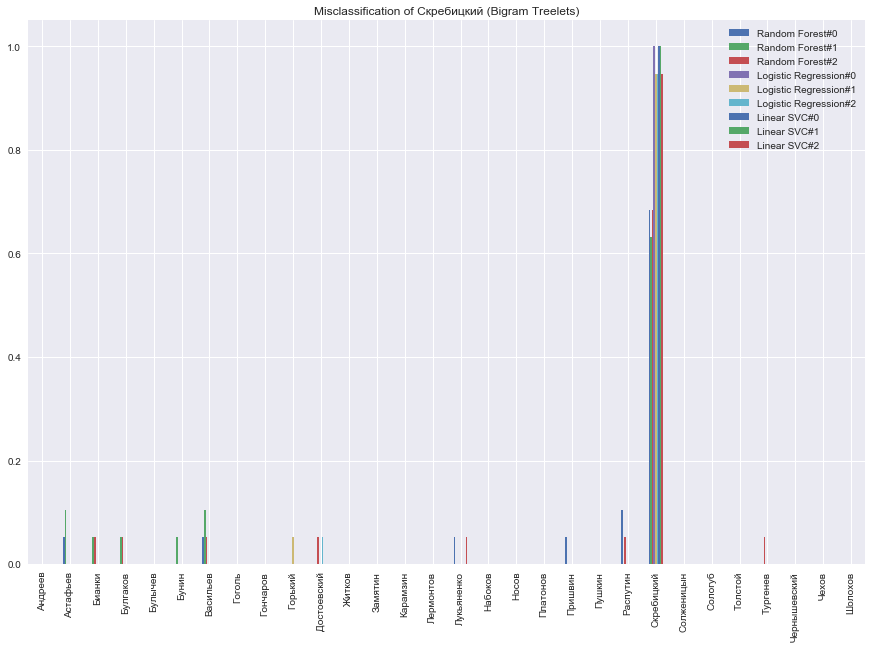

<Figure size 432x288 with 0 Axes>

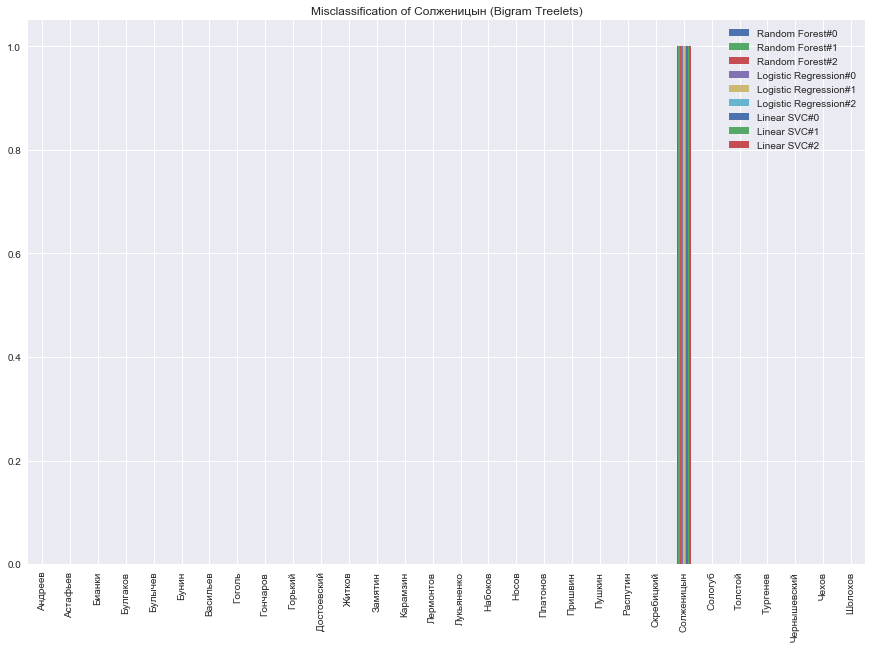

<Figure size 432x288 with 0 Axes>

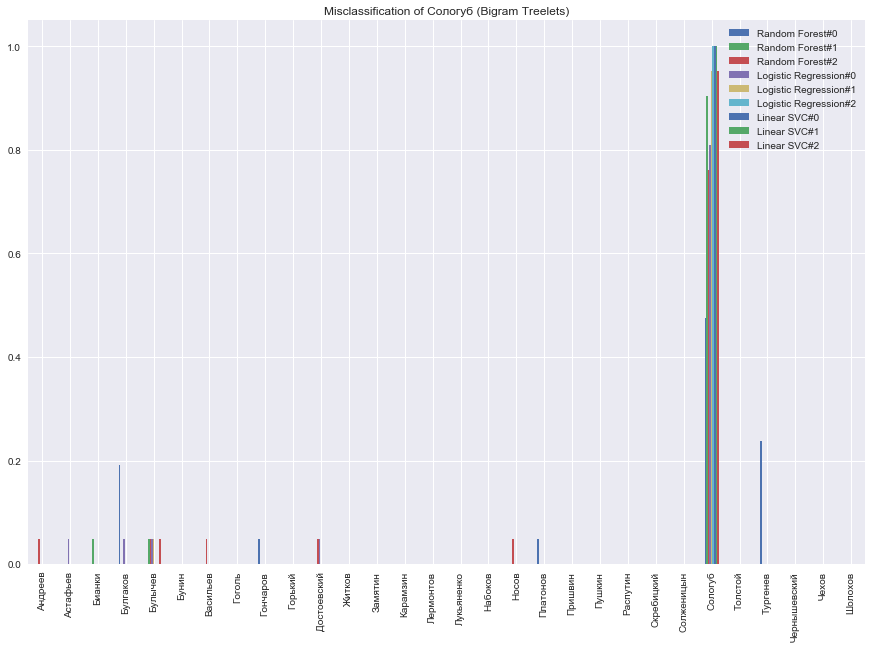

<Figure size 432x288 with 0 Axes>

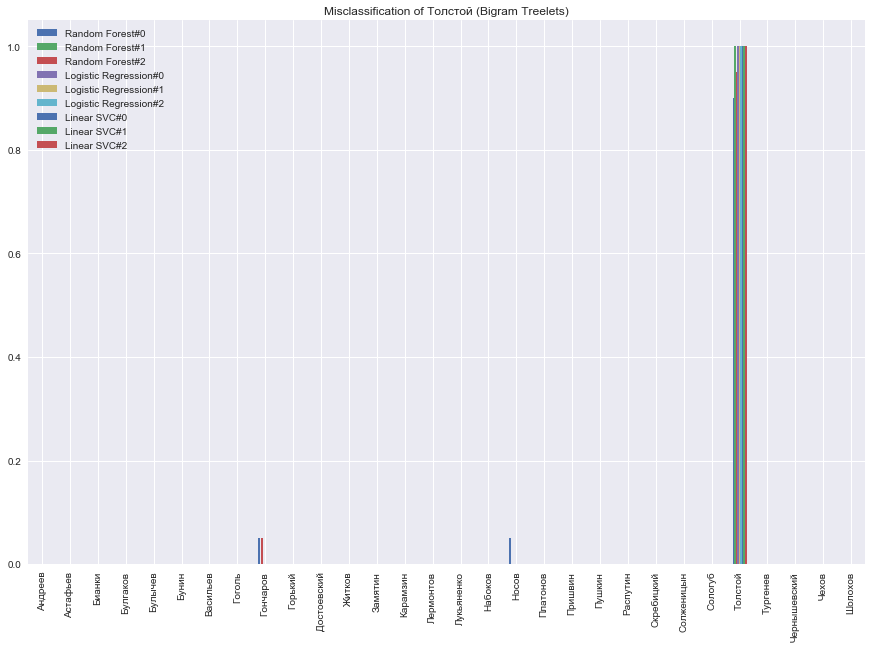

<Figure size 432x288 with 0 Axes>

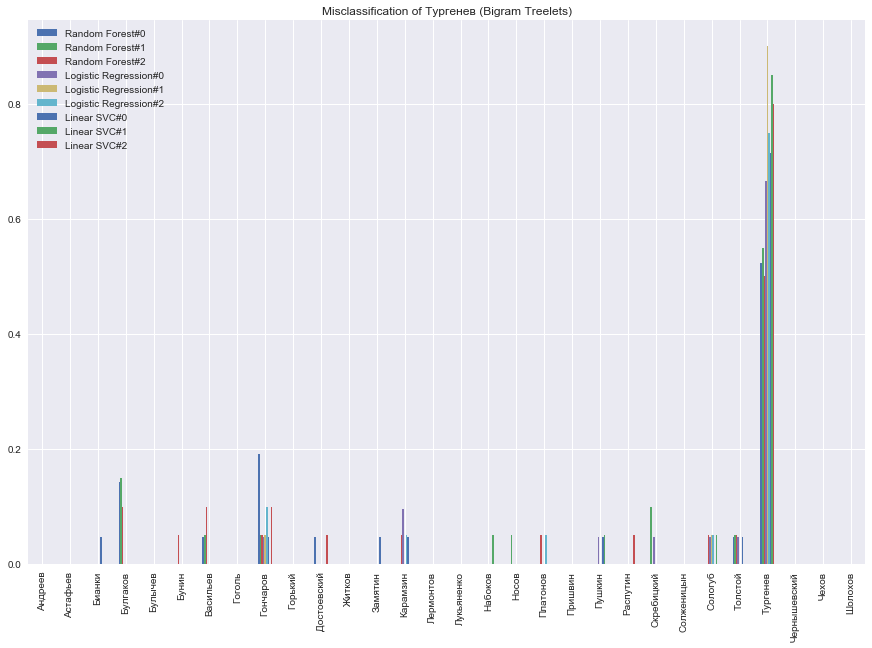

<Figure size 432x288 with 0 Axes>

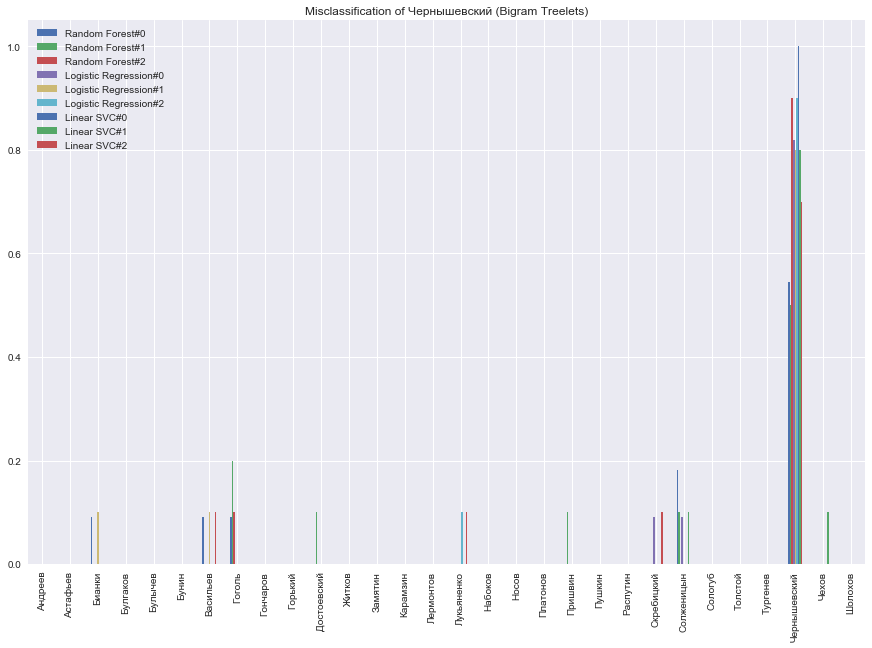

<Figure size 432x288 with 0 Axes>

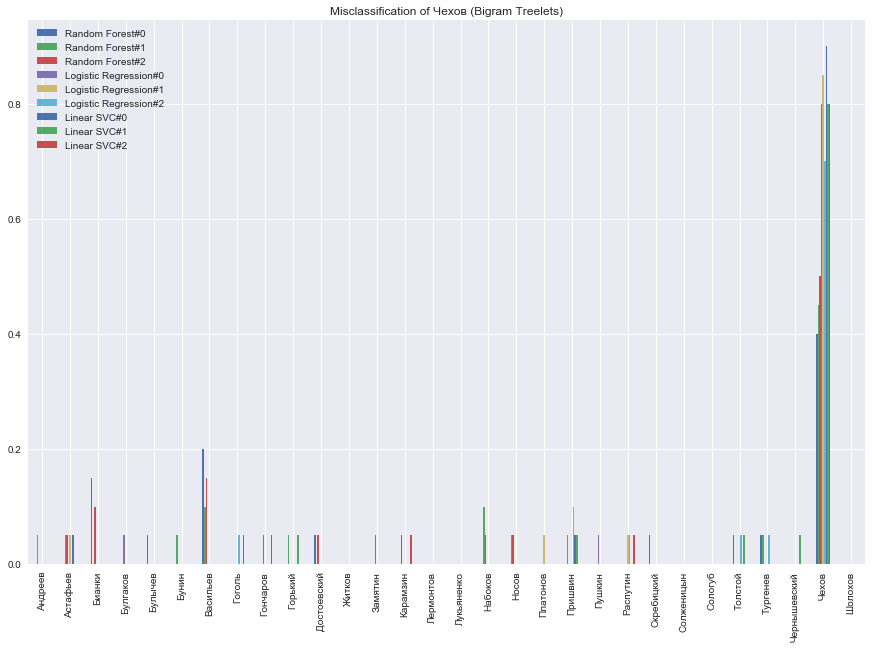

<Figure size 432x288 with 0 Axes>

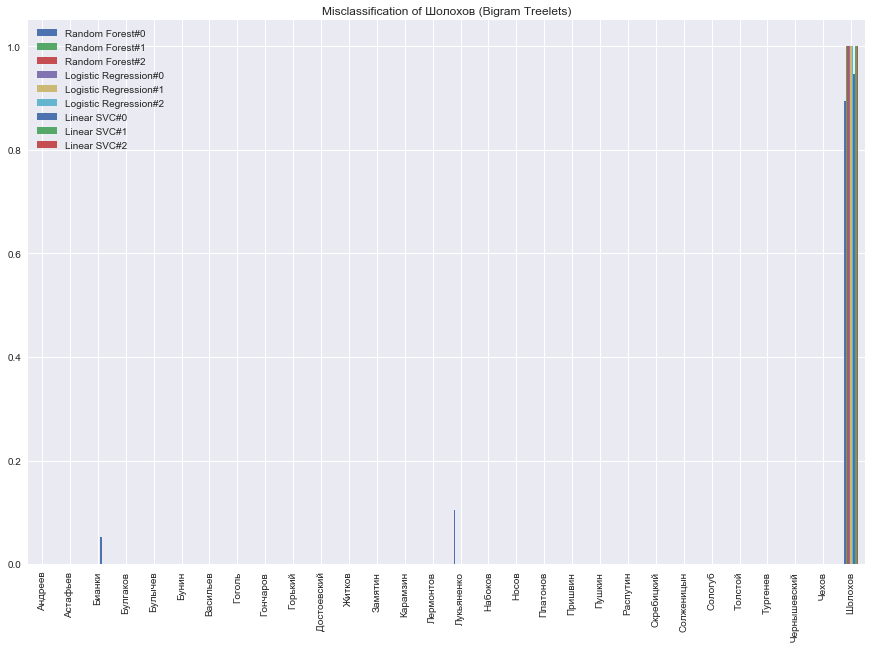

In [501]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [502]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

# Trigram Treelets


In [133]:
# It's really memory overhead procedure, so, we should free as much memory as we can
import gc
gc.collect()

75485

In [134]:
currentPart = 'Trigram Treelets'
TrigramTreeletDF = pd.read_csv('OutData/TrigramTreelet.csv')
print('Shape: {}'.format(TrigramTreeletDF.shape))
TrigramTreeletDF.head()

Shape: (1506, 190510)


,"(1, '', '', '', 'acl', 'NOUN')","(1, '', '', '', 'acl', 'VERB')","(1, '', '', '', 'acl', 'X')","(1, '', '', '', 'acl:relcl', 'ADJ')","(1, '', '', '', 'acl:relcl', 'ADV')","(1, '', '', '', 'advcl', 'ADJ')","(1, '', '', '', 'advcl', 'ADV')","(1, '', '', '', 'advcl', 'DET')","(1, '', '', '', 'advcl', 'NOUN')","(1, '', '', '', 'advcl', 'PRON')",...,"(2, 'X', 'parataxis', 'X', 'nmod', 'NOUN')","(2, 'X', 'parataxis', 'X', 'nsubj', 'PRON')","(2, 'X', 'parataxis', 'X', 'obj', 'VERB')","(2, 'X', 'parataxis', 'X', 'parataxis', 'VERB')","(2, 'X', 'xcomp', 'INTJ', 'conj', 'ADJ')","(2, 'X', 'xcomp', 'VERB', 'conj', 'VERB')","(2, 'X', 'xcomp', 'VERB', 'obl', 'NOUN')","(2, 'X', 'xcomp', 'VERB', 'parataxis', 'VERB')",Author,Novel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Ангелочек
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Баргамот и Гараська
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Бездна
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Большой шлем
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,В подвале


In [135]:
X = TrigramTreeletDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = TrigramTreeletDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = TrigramTreeletDF.Author.values

countOfAuthors = len(TrigramTreeletDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors


In [136]:
TrigramTreeletDF.head()

,"(1, '', '', '', 'acl', 'NOUN')","(1, '', '', '', 'acl', 'VERB')","(1, '', '', '', 'acl', 'X')","(1, '', '', '', 'acl:relcl', 'ADJ')","(1, '', '', '', 'acl:relcl', 'ADV')","(1, '', '', '', 'advcl', 'ADJ')","(1, '', '', '', 'advcl', 'ADV')","(1, '', '', '', 'advcl', 'DET')","(1, '', '', '', 'advcl', 'NOUN')","(1, '', '', '', 'advcl', 'PRON')",...,"(2, 'X', 'parataxis', 'X', 'nmod', 'NOUN')","(2, 'X', 'parataxis', 'X', 'nsubj', 'PRON')","(2, 'X', 'parataxis', 'X', 'obj', 'VERB')","(2, 'X', 'parataxis', 'X', 'parataxis', 'VERB')","(2, 'X', 'xcomp', 'INTJ', 'conj', 'ADJ')","(2, 'X', 'xcomp', 'VERB', 'conj', 'VERB')","(2, 'X', 'xcomp', 'VERB', 'obl', 'NOUN')","(2, 'X', 'xcomp', 'VERB', 'parataxis', 'VERB')",Author,Novel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Ангелочек
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Баргамот и Гараська
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Бездна
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,Большой шлем
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Андреев,В подвале


##### Hopkins stats and clustering metrics

In [137]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8983734817484303
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.20151828025948162
	AMI: 0.3885650889091198


### 3 Folds Cross-Validation

Current model: Random Forest
Accuracy  	mean: 0.54064
Precision 	mean: 0.52386
Recall    	mean: 0.54064
f1        	mean: 0.51247
Current model: Logistic Regression
Accuracy  	mean: 0.85539
Precision 	mean: 0.89419
Recall    	mean: 0.85539
f1        	mean: 0.85615
Current model: Linear SVC
Accuracy  	mean: 0.80628
Precision 	mean: 0.91450
Recall    	mean: 0.80628
f1        	mean: 0.82135


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

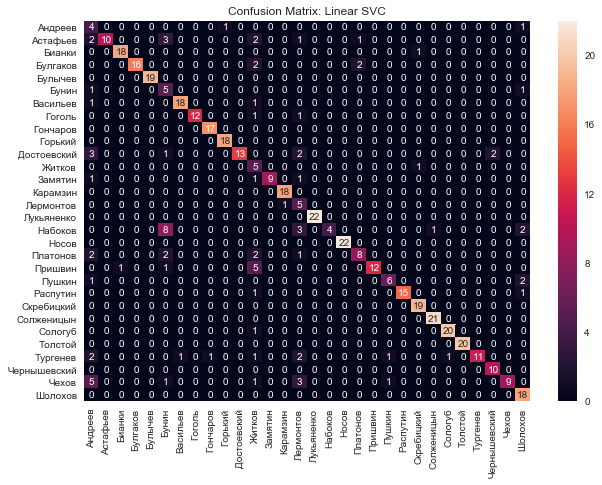

In [138]:
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = False,
                         folder_with_results = directory,
                         scaling = True)

# What if we concat Morpho and Syntax in one frame?

## Start with simple morpho and simple syntax

In [503]:
currentPart = 'Simple Morphology+Syntax'
simpleMorphoDF = pd.read_csv('OutData/MorphoTags.csv')
simpleMorphoDF = simpleMorphoDF.drop(columns=['SPACE', simpleMorphoDF.columns[0]], axis=1)
print('Shape: {}'.format(simpleMorphoDF.shape))

#display(simpleMorphoDF.head())

simpleSyntaxDF = pd.read_csv('OutData/SyntaxDependencies.csv')
simpleSyntaxDF = simpleSyntaxDF.drop(columns=[simpleSyntaxDF.columns[0]], axis=1)
print('Shape: {}'.format(simpleSyntaxDF.shape))

#display(simpleSyntaxDF.head())

mergeDF = pd.concat([simpleMorphoDF.drop(columns=['Author', 'Novel'], axis=1), simpleSyntaxDF ], axis=1)
print('Concatenated : {}'.format(mergeDF.shape))
mergeDF.head()

Shape: (1506, 19)
Shape: (1506, 42)
Concatenated : (1506, 59)


,ADJ,ADP,ADV,AUX,CCONJ,DET,INTJ,NOUN,NUM,PART,...,nummod:gov,obj,obl,orphan,parataxis,punct,vocative,xcomp,Author,Novel
0,0.088371,0.076826,0.054156,0.008186,0.061083,0.014274,0.001469,0.178841,0.005248,0.035055,...,0.002939,0.036314,0.090680,0.000210,0.017842,0.198783,0.0,0.011125,Андреев,Ангелочек
1,0.098241,0.083081,0.053669,0.009400,0.043966,0.020315,0.000303,0.169193,0.004245,0.039418,...,0.000910,0.034263,0.095209,0.001819,0.016980,0.199818,0.0,0.012129,Андреев,Баргамот и Гараська
2,0.103828,0.057330,0.065733,0.011204,0.079365,0.015500,0.001120,0.144911,0.008030,0.028011,...,0.005042,0.031933,0.073950,0.000934,0.010271,0.207656,0.0,0.005229,Андреев,Бездна
3,0.081008,0.076673,0.064752,0.011921,0.068003,0.019236,0.000542,0.160661,0.015443,0.036305,...,0.009212,0.030615,0.090219,0.000271,0.012734,0.162558,0.0,0.009753,Андреев,Большой шлем
4,0.092934,0.072965,0.056068,0.012545,0.078597,0.012289,0.000512,0.151050,0.004352,0.029186,...,0.002560,0.033538,0.090374,0.000512,0.010241,0.191244,0.0,0.008449,Андреев,В подвале


In [504]:
X = mergeDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = mergeDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = mergeDF.Author.values

countOfAuthors = len(mergeDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))
print('Matrix of data: {}'.format(X.shape))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)


We have 30 authors
Matrix of data: (1506, 57)


### Clustering Structure

##### Hopkins statistics

In [367]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8646018605582659
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.28819331040409274
	AMI: 0.4895974236888708


### 3 Folds Cross-Validation

Current model: Random Forest
Accuracy  	mean: 0.79833
Precision 	mean: 0.80619
Recall    	mean: 0.79833
f1        	mean: 0.78845


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

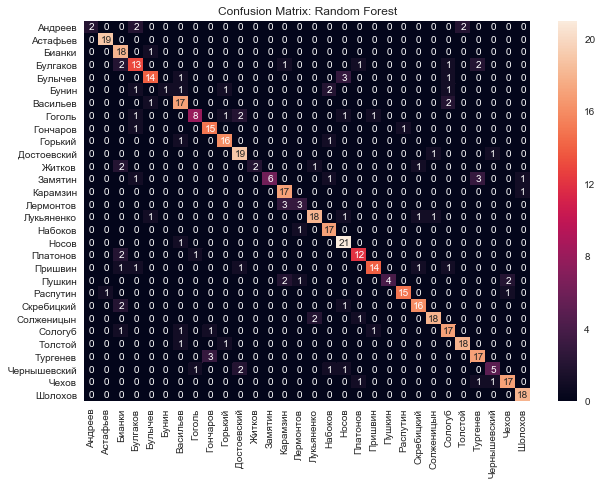

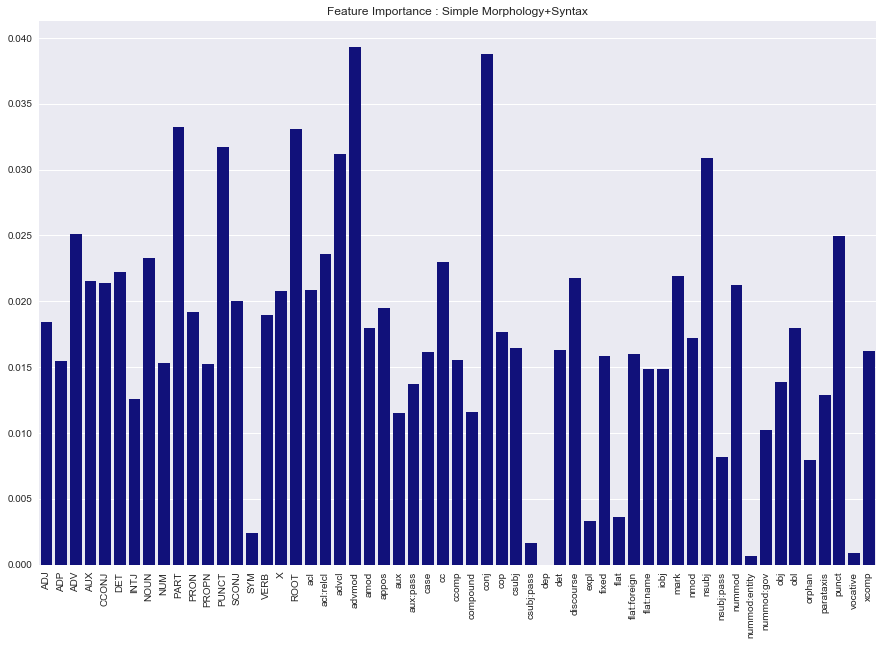

Current model: Logistic Regression
Accuracy  	mean: 0.92378
Precision 	mean: 0.92498
Recall    	mean: 0.92378
f1        	mean: 0.92089


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

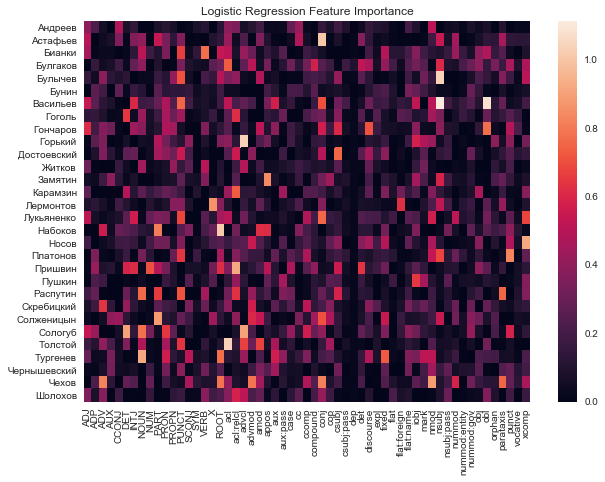

Current model: Linear SVC
Accuracy  	mean: 0.92219
Precision 	mean: 0.92590
Recall    	mean: 0.92219
f1        	mean: 0.92023


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

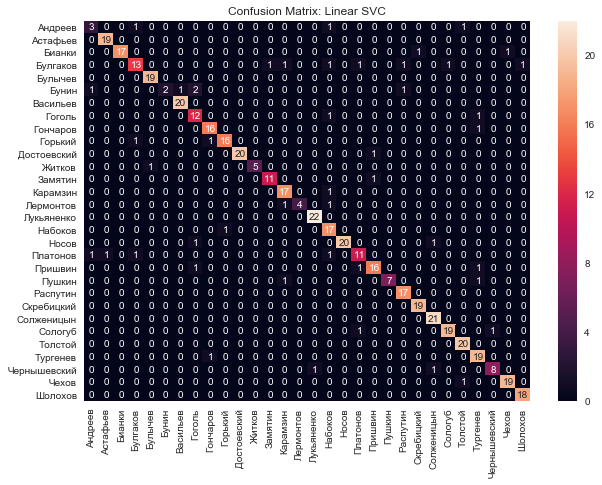

In [505]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

<Figure size 432x288 with 0 Axes>

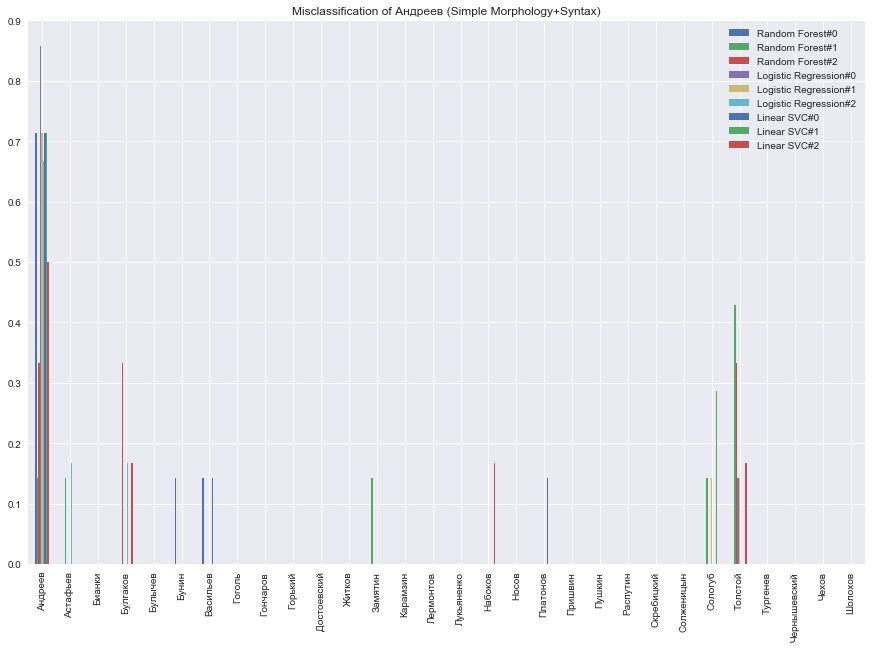

<Figure size 432x288 with 0 Axes>

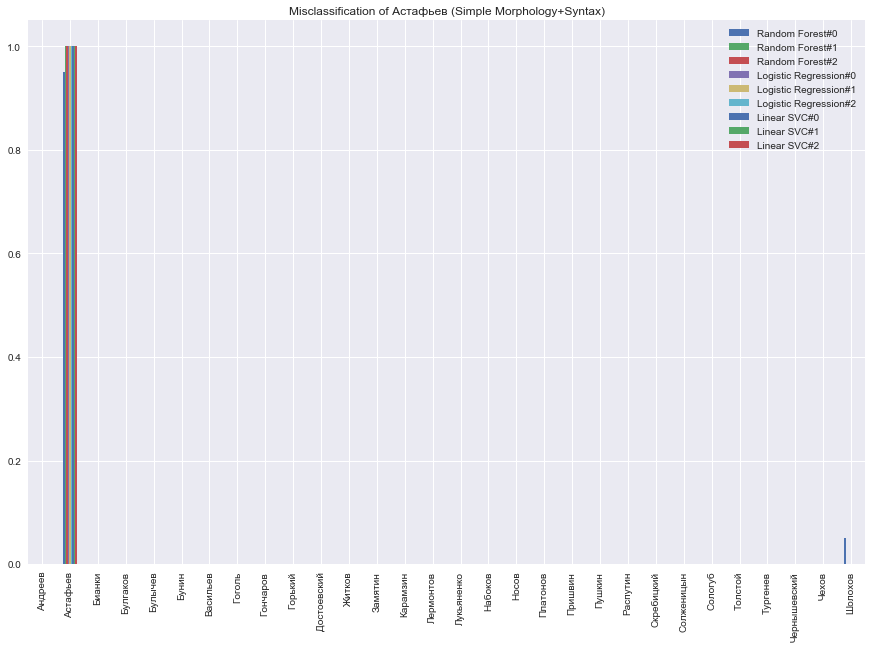

<Figure size 432x288 with 0 Axes>

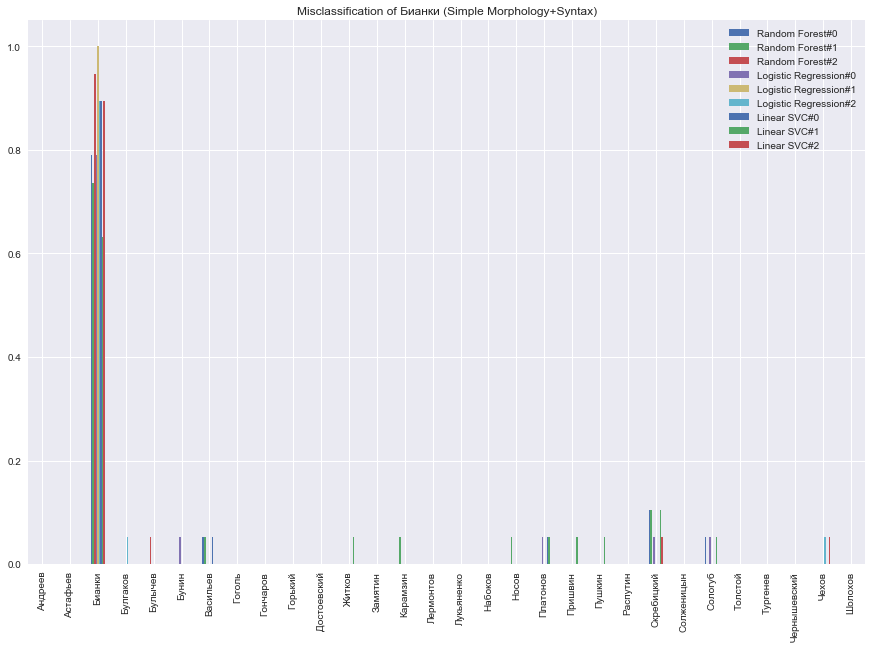

<Figure size 432x288 with 0 Axes>

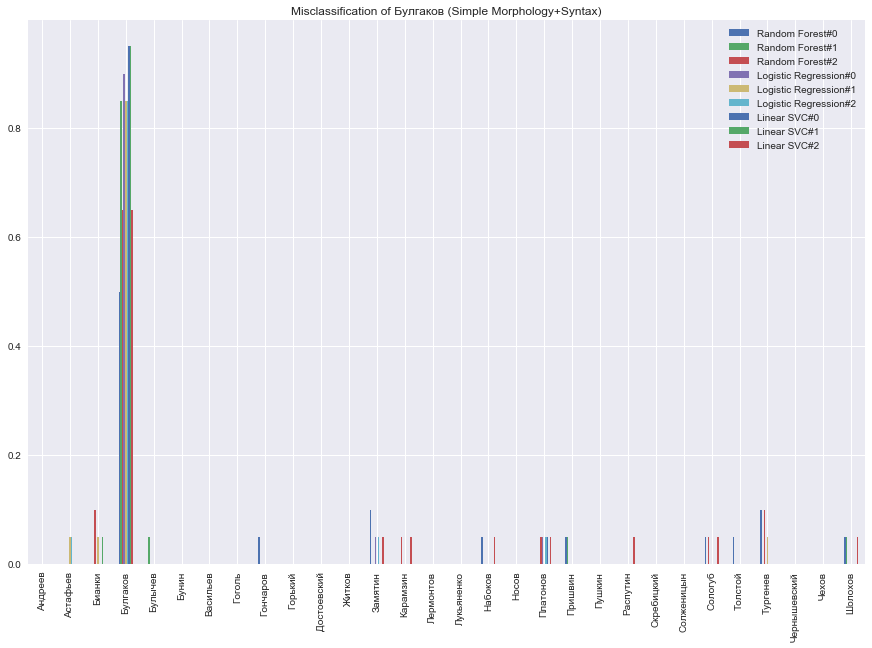

<Figure size 432x288 with 0 Axes>

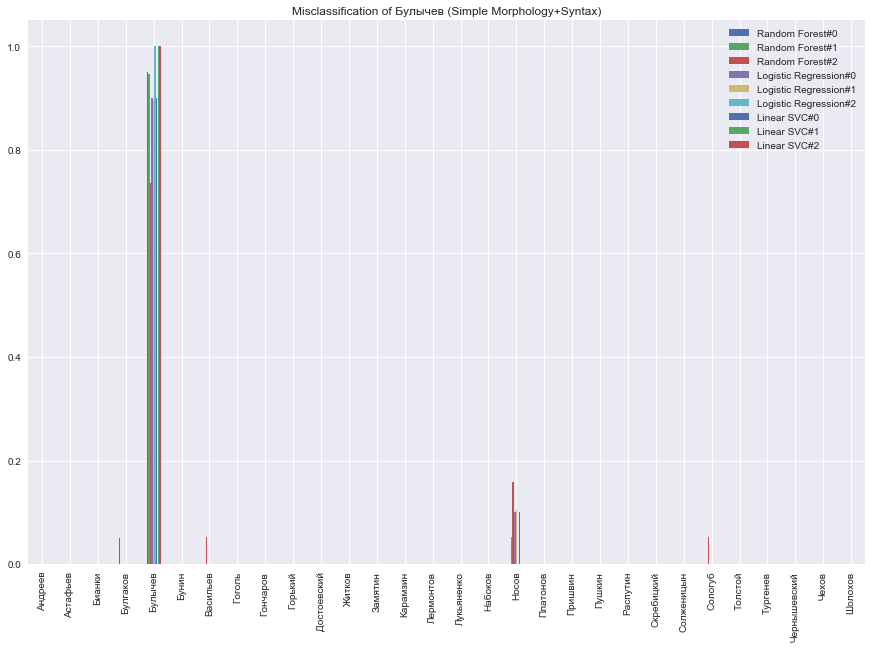

<Figure size 432x288 with 0 Axes>

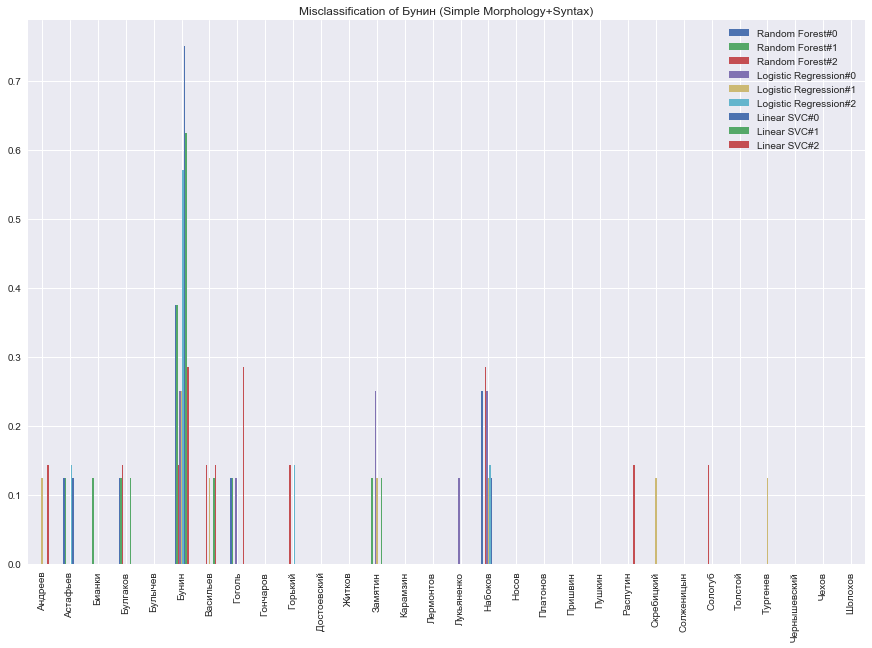

<Figure size 432x288 with 0 Axes>

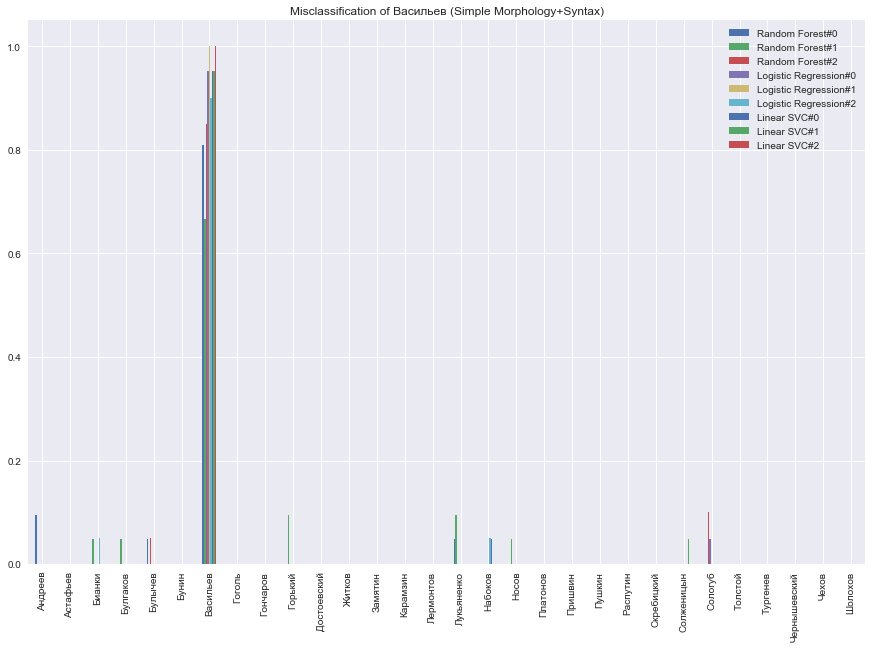

<Figure size 432x288 with 0 Axes>

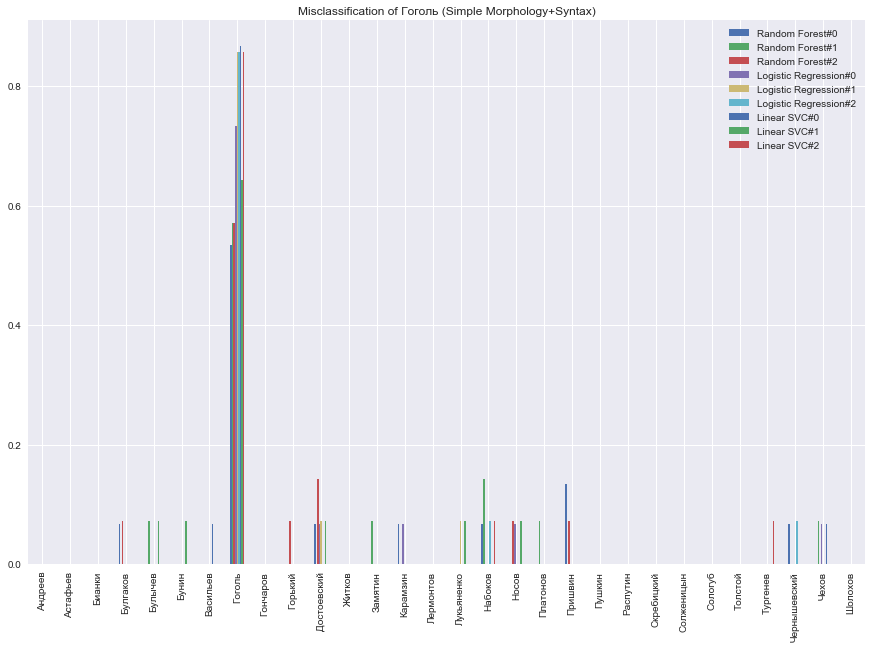

<Figure size 432x288 with 0 Axes>

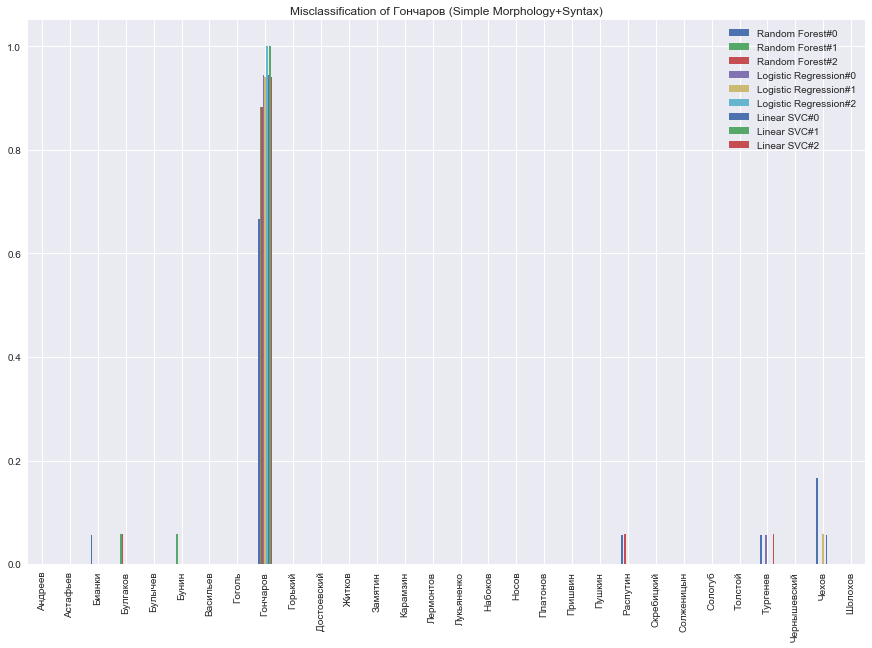

<Figure size 432x288 with 0 Axes>

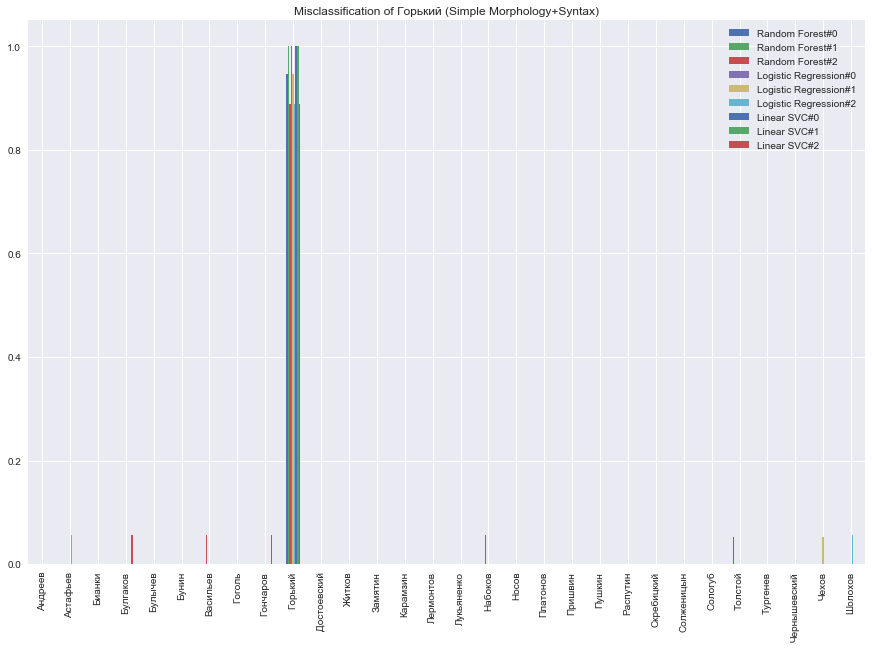

<Figure size 432x288 with 0 Axes>

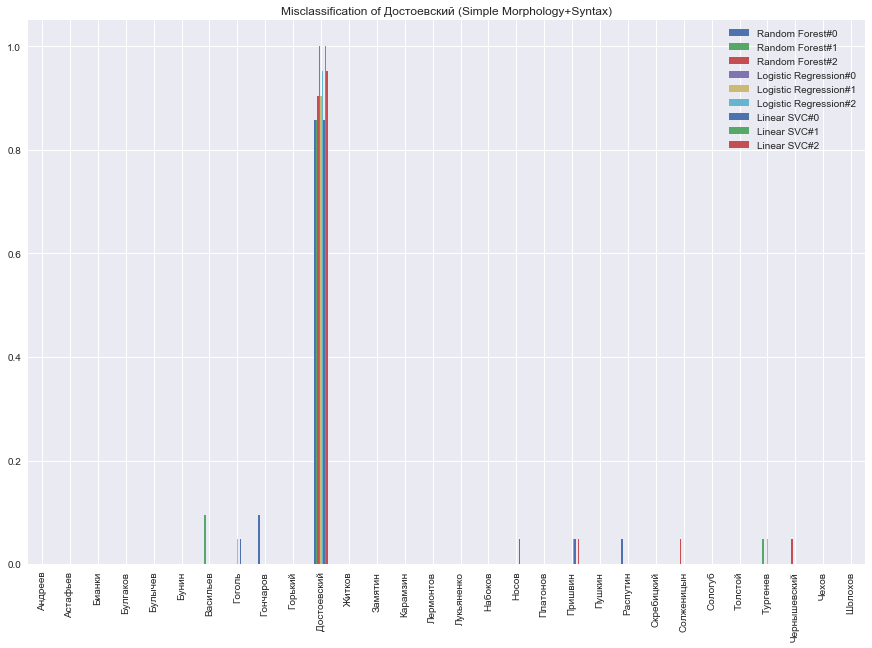

<Figure size 432x288 with 0 Axes>

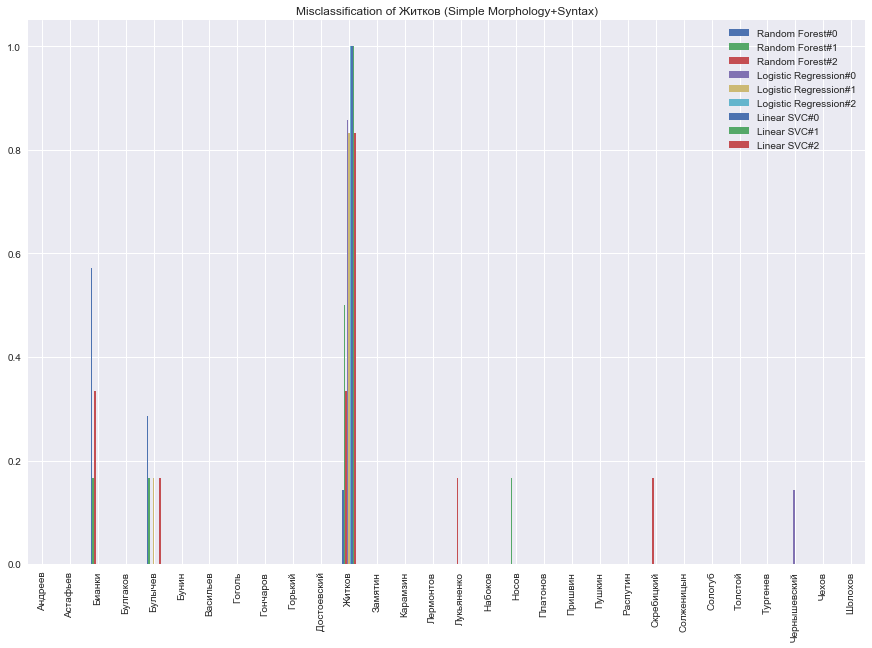

<Figure size 432x288 with 0 Axes>

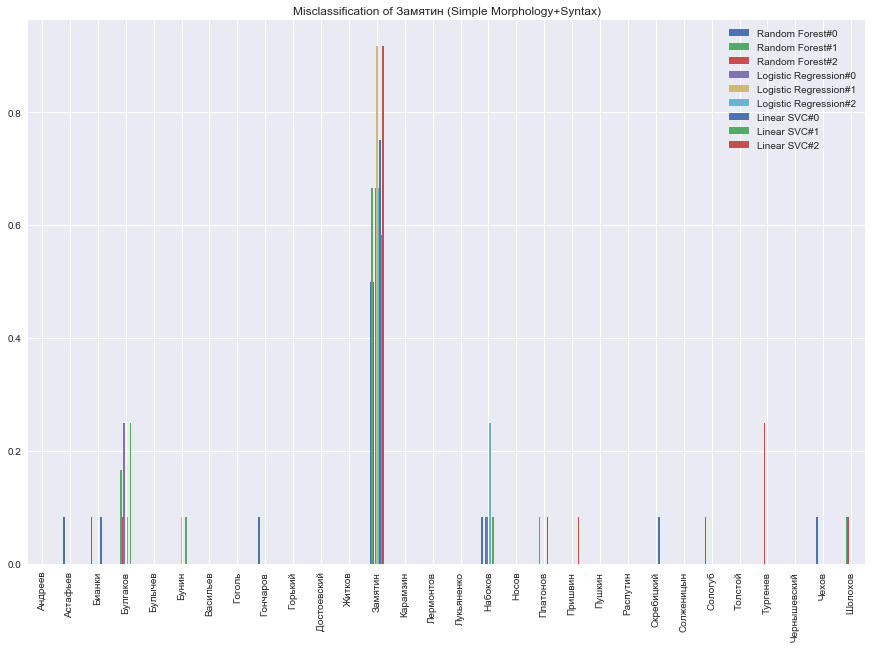

<Figure size 432x288 with 0 Axes>

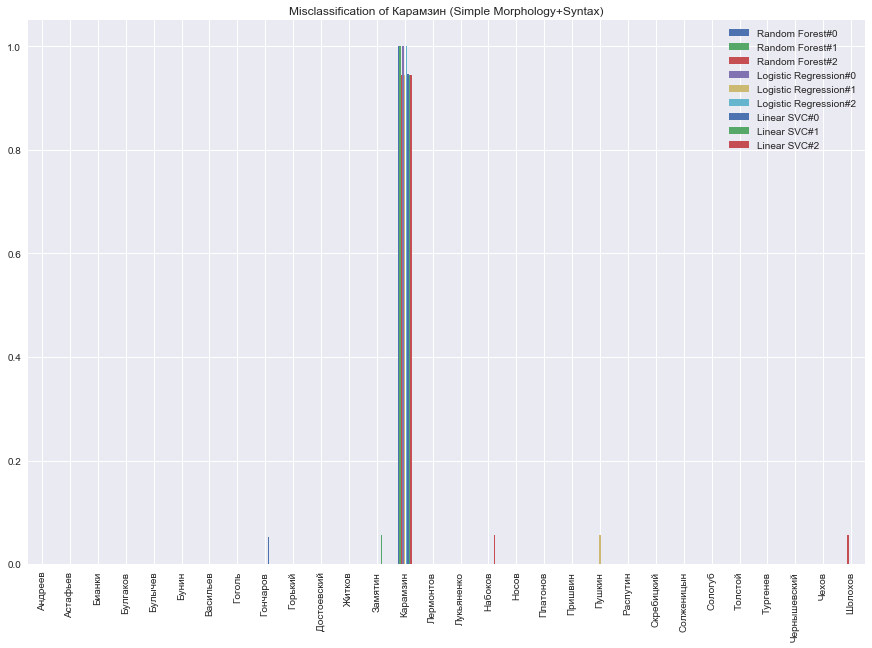

<Figure size 432x288 with 0 Axes>

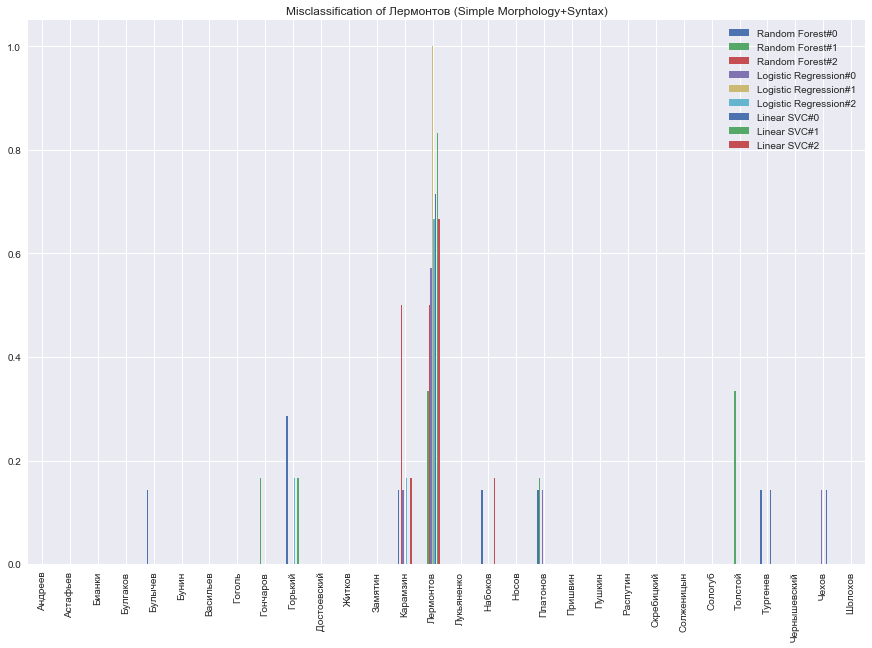

<Figure size 432x288 with 0 Axes>

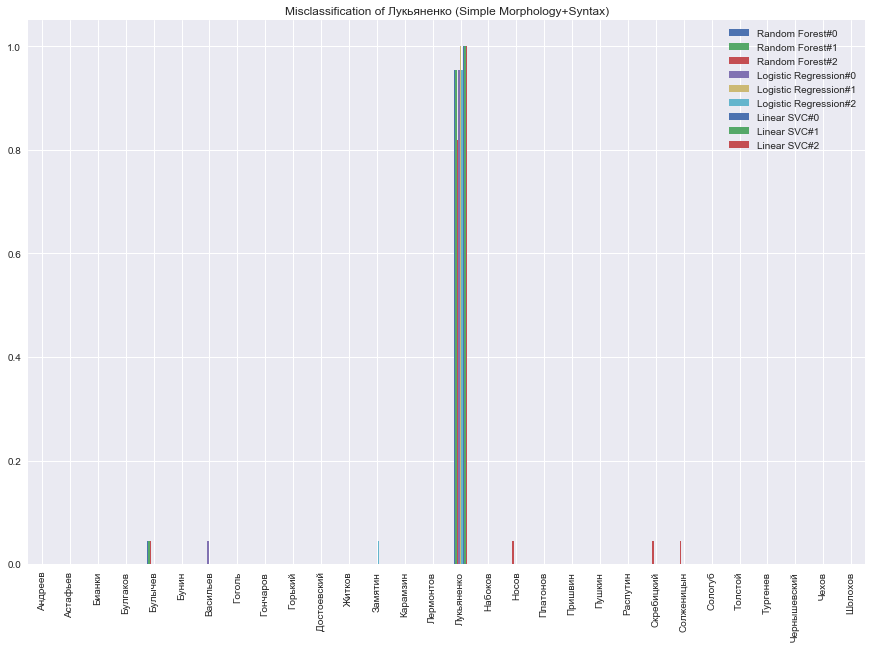

<Figure size 432x288 with 0 Axes>

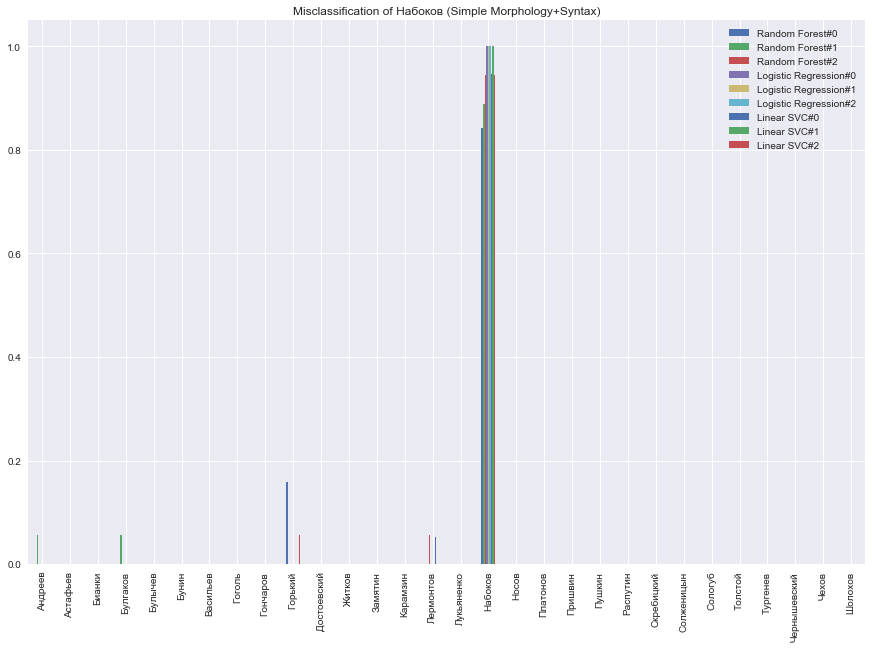

<Figure size 432x288 with 0 Axes>

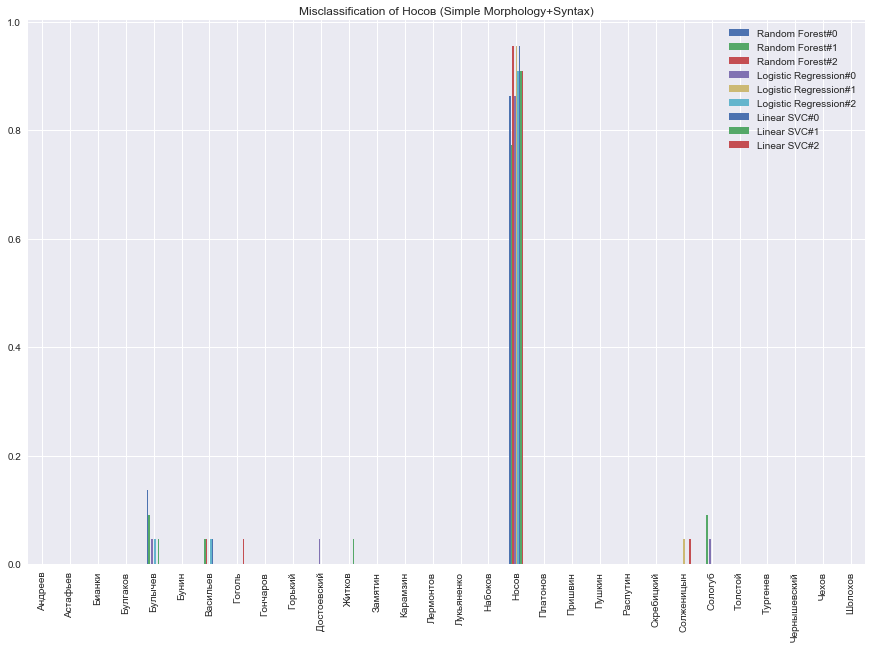

<Figure size 432x288 with 0 Axes>

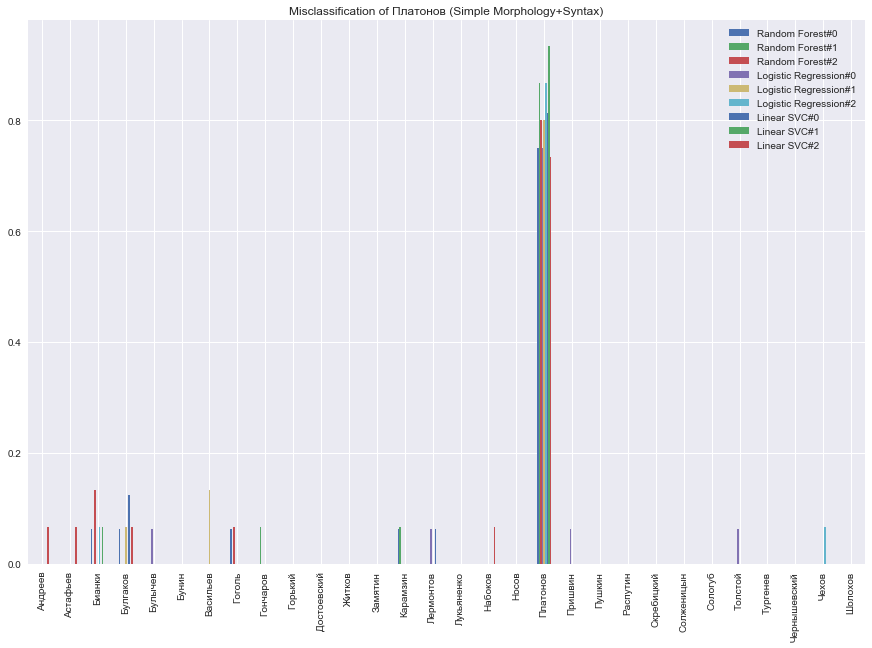

<Figure size 432x288 with 0 Axes>

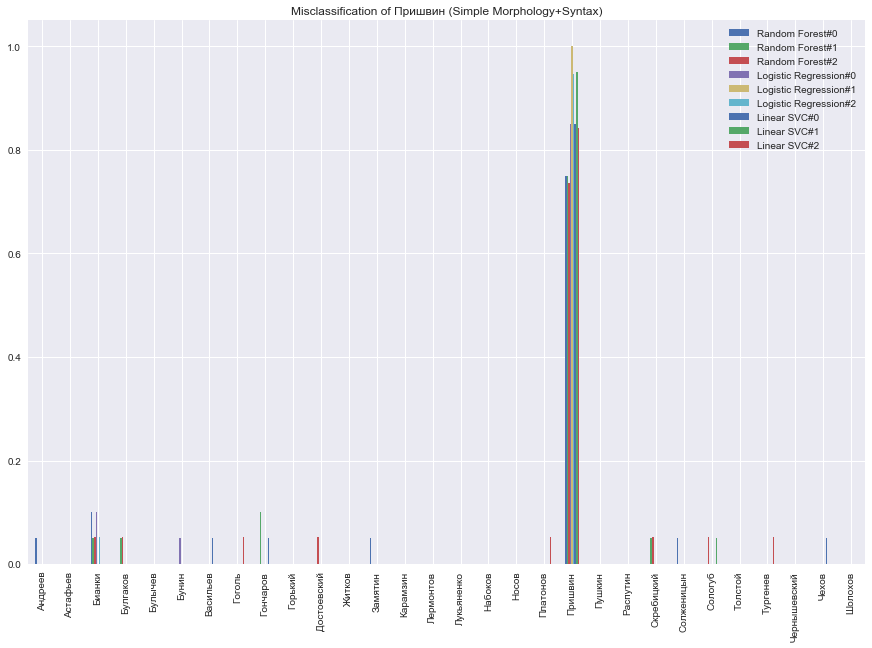

<Figure size 432x288 with 0 Axes>

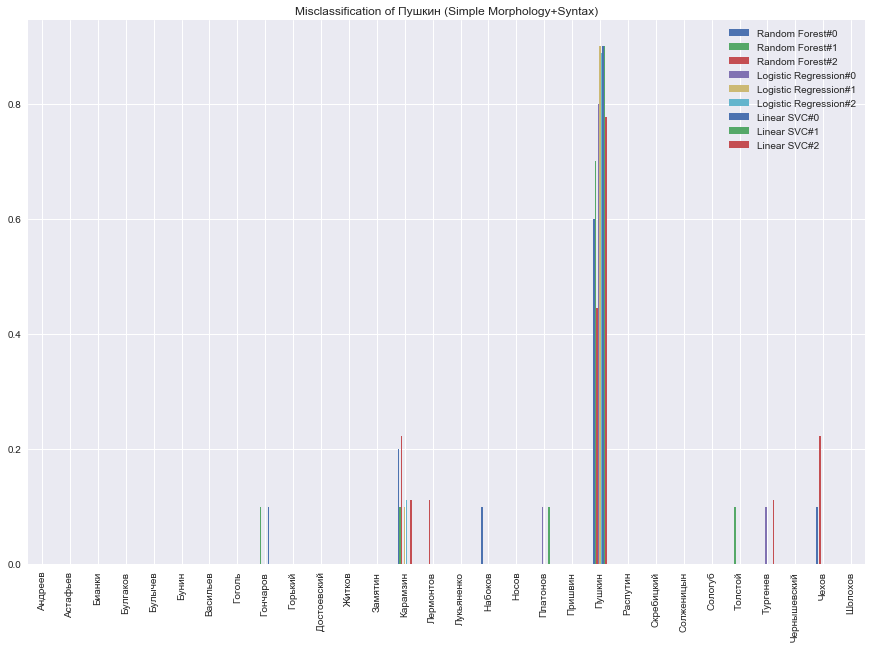

<Figure size 432x288 with 0 Axes>

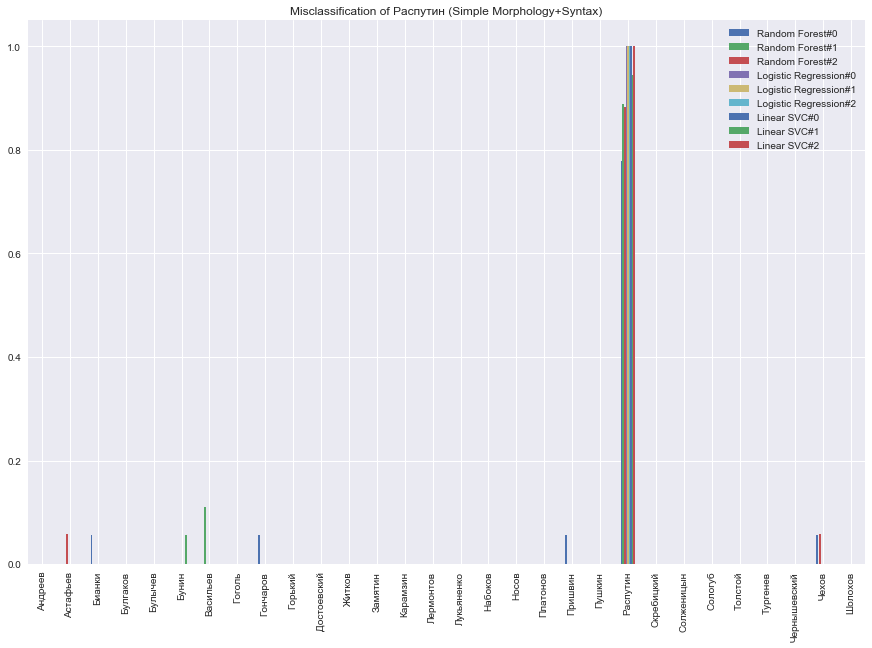

<Figure size 432x288 with 0 Axes>

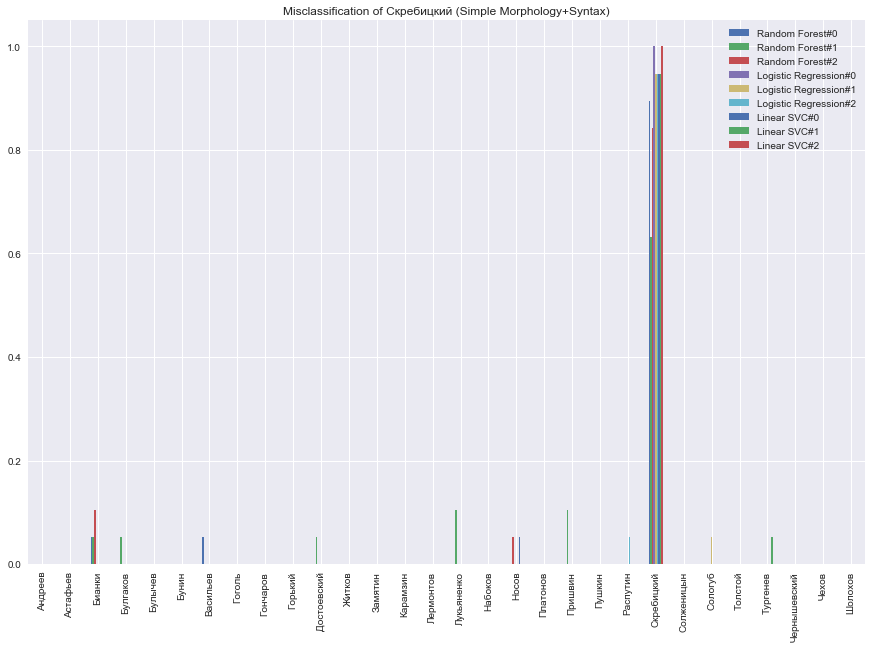

<Figure size 432x288 with 0 Axes>

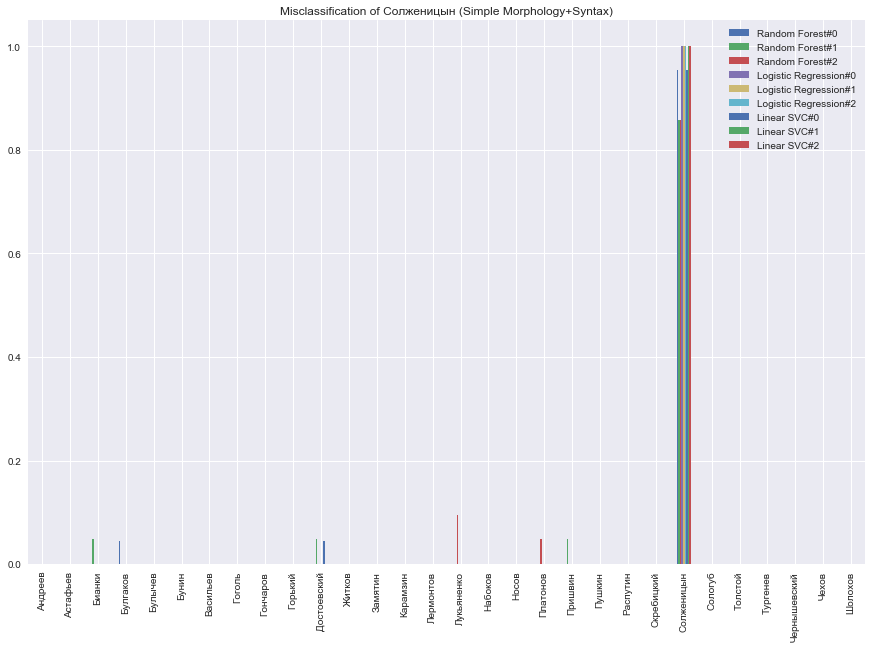

<Figure size 432x288 with 0 Axes>

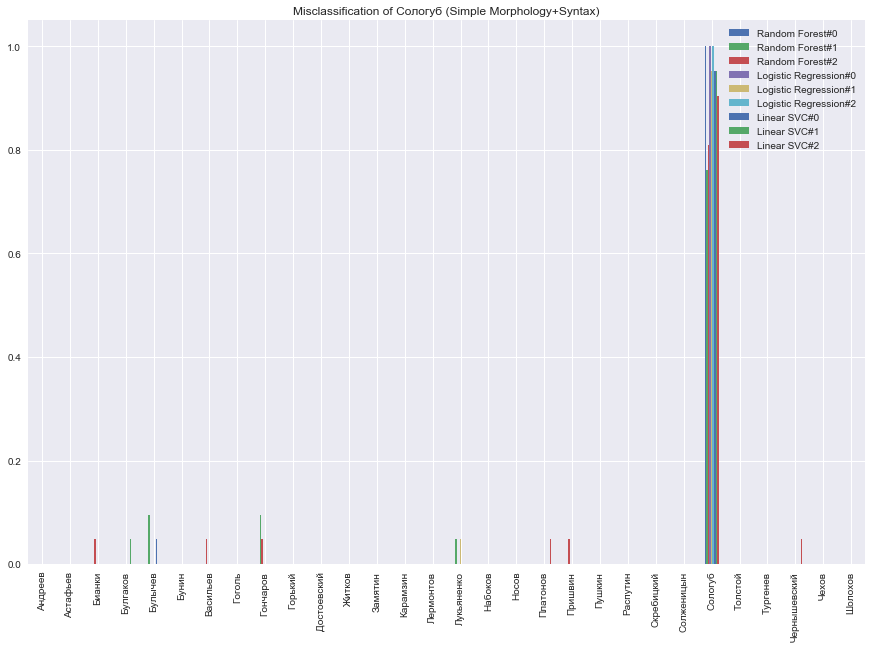

<Figure size 432x288 with 0 Axes>

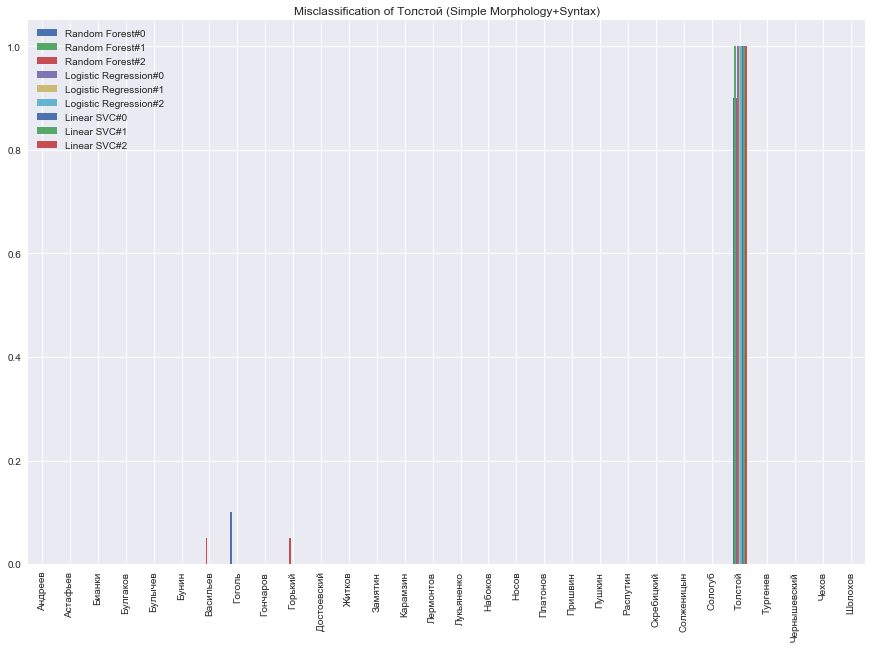

<Figure size 432x288 with 0 Axes>

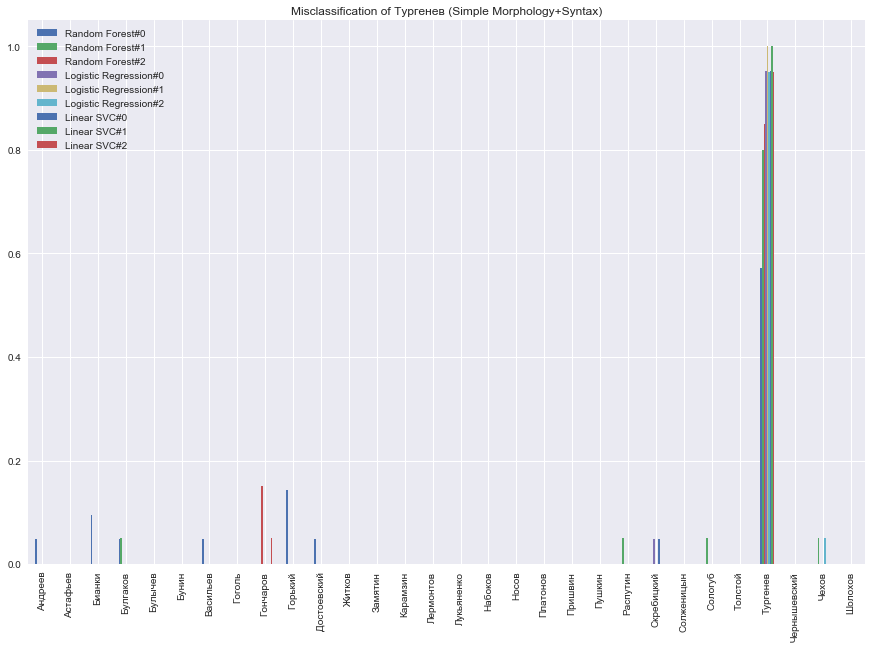

<Figure size 432x288 with 0 Axes>

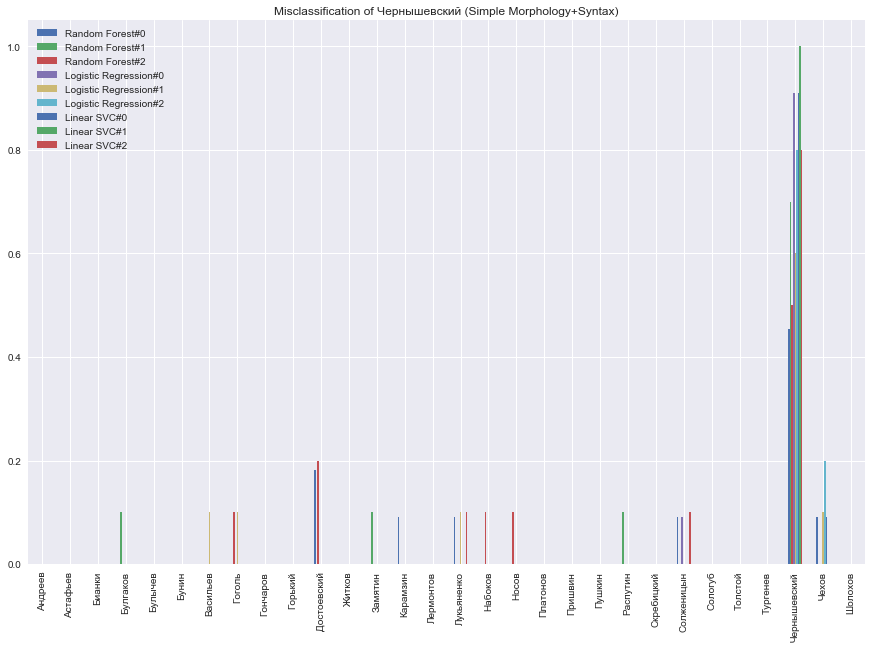

<Figure size 432x288 with 0 Axes>

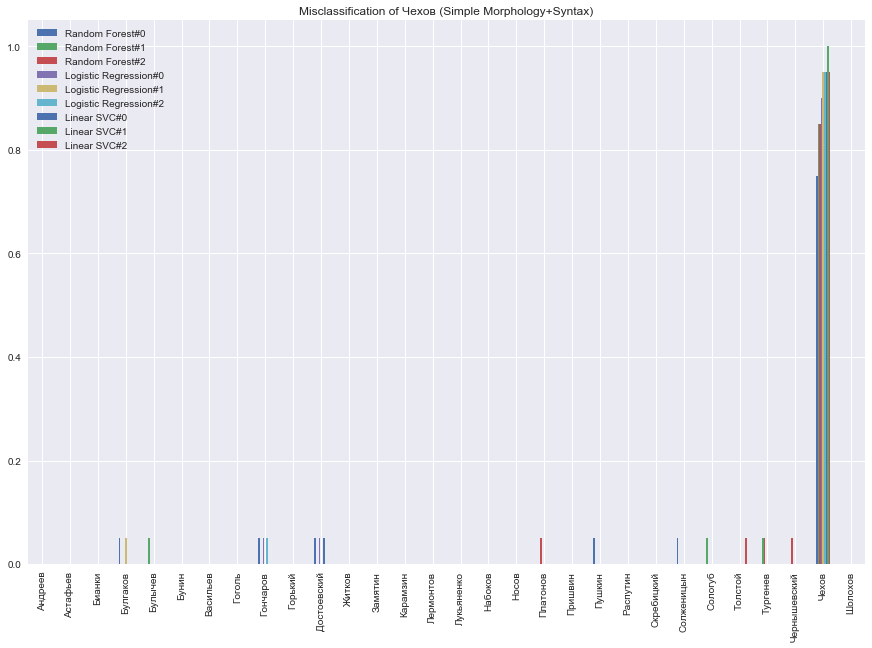

<Figure size 432x288 with 0 Axes>

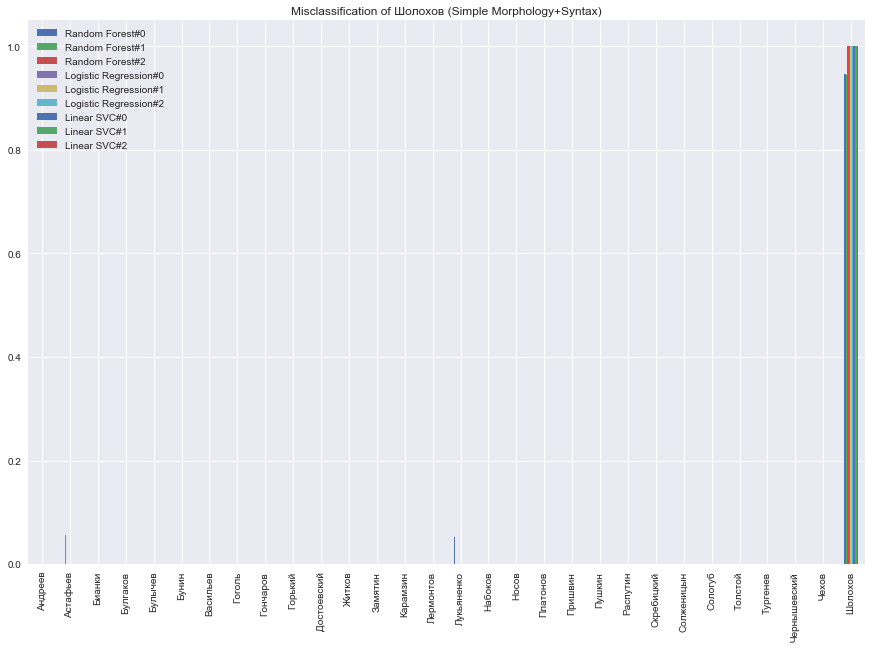

In [506]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [507]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [508]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

## Complex Morphology + Complex Syntax

In [509]:
currentPart = 'Complex Morphology+Syntax'
extendedMorphoDF = pd.read_csv('OutData/ExtendedMorpho.csv')
print('Extended Morpho Shape: {}'.format(extendedMorphoDF.shape))
#display(extendedMorphoDF.head())

complexSyntaxDF = pd.read_csv('OutData/SyntaxComplex.csv')
print('Complex Syntax Shape: {}'.format(complexSyntaxDF.shape))
#display(complexSyntaxDF.head())

mergeDF = pd.concat([extendedMorphoDF.drop(columns=['Author','Novel'],axis=1),complexSyntaxDF ], axis=1)
print('Concatenated : {}'.format(mergeDF.shape))
display(mergeDF.head())

Extended Morpho Shape: (1506, 18)
Complex Syntax Shape: (1506, 30)
Concatenated : (1506, 46)


,Абстрактность,Будущее,Динамичность,Местоименная замена,Настоящее,Обобщенность действия,Описательность,Описательность действия,Пассив,Предметность,...,advphr,comphr,nomphr,participle,simlphr,syntaxNonFreePhrases,verbalAdverb,verbphr,Author,Novel
0,0.160285,0.108844,0.296920,0.313892,0.103741,0.019971,0.493320,0.254926,0.467391,0.337751,...,0.015586,0.240101,0.193766,0.054608,0.759899,0.003791,0.054608,0.147220,Андреев,Ангелочек
1,0.231467,0.110749,0.264293,0.309055,0.188925,0.020599,0.545322,0.313808,0.465517,0.274002,...,0.016718,0.248916,0.207121,0.089005,0.751084,0.006502,0.073298,0.125387,Андреев,Баргамот и Гараська
2,0.177638,0.056667,0.288829,0.401316,0.076667,0.002225,0.655213,0.413959,0.257143,0.305938,...,0.022688,0.247855,0.189323,0.057756,0.752145,0.003051,0.097360,0.134604,Андреев,Бездна
3,0.169300,0.059908,0.261773,0.252717,0.059908,0.018033,0.501906,0.368231,0.636364,0.339797,...,0.017877,0.231573,0.188119,0.033951,0.768427,0.011001,0.086420,0.136689,Андреев,Большой шлем
4,0.195986,0.110132,0.287671,0.381791,0.105727,0.009983,0.558739,0.333876,0.404255,0.310959,...,0.020099,0.241190,0.189246,0.037037,0.758810,0.006526,0.104167,0.140433,Андреев,В подвале


In [510]:
X = mergeDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = mergeDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = mergeDF.Author.values

countOfAuthors = len(mergeDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))
print('Matrix of data: {}'.format(X.shape))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

We have 30 authors
Matrix of data: (1506, 44)


### Clustering structure

In [373]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.853343972425524
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.17502458474352794
	AMI: 0.35744991117265823


### 3 Folds CV

Current model: Random Forest
Accuracy  	mean: 0.73781
Precision 	mean: 0.75143
Recall    	mean: 0.73781
f1        	mean: 0.72773


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

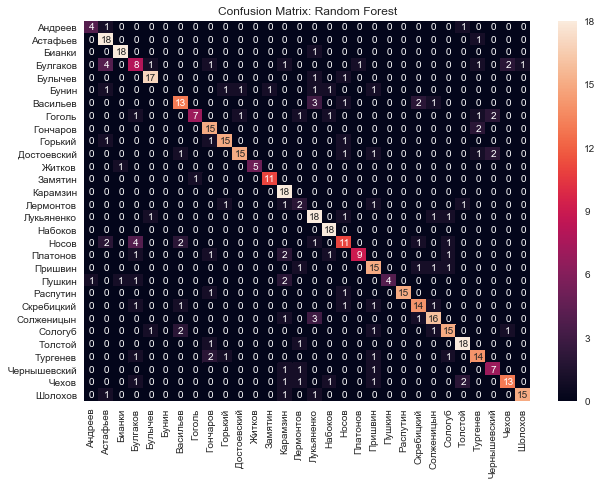

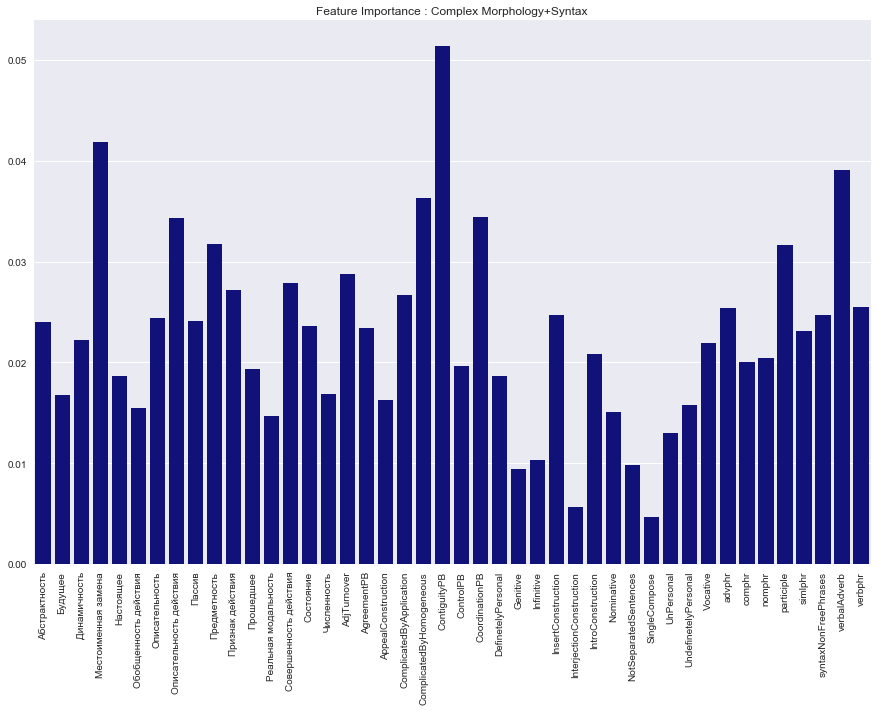

Current model: Logistic Regression
Accuracy  	mean: 0.88198
Precision 	mean: 0.88670
Recall    	mean: 0.88198
f1        	mean: 0.87460


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

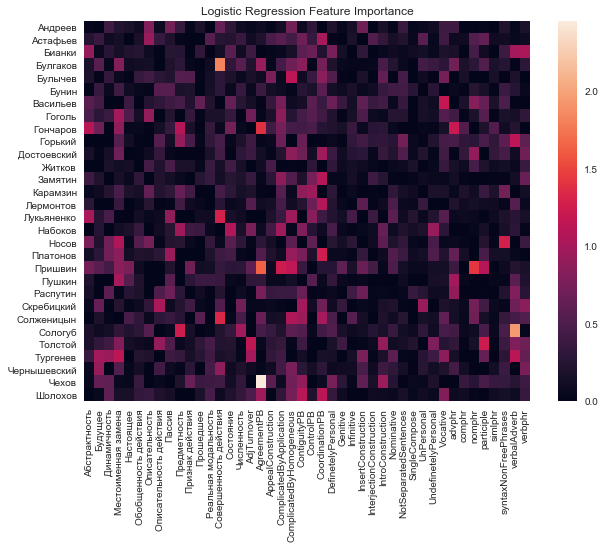

Current model: Linear SVC
Accuracy  	mean: 0.87304
Precision 	mean: 0.87598
Recall    	mean: 0.87304
f1        	mean: 0.87032


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

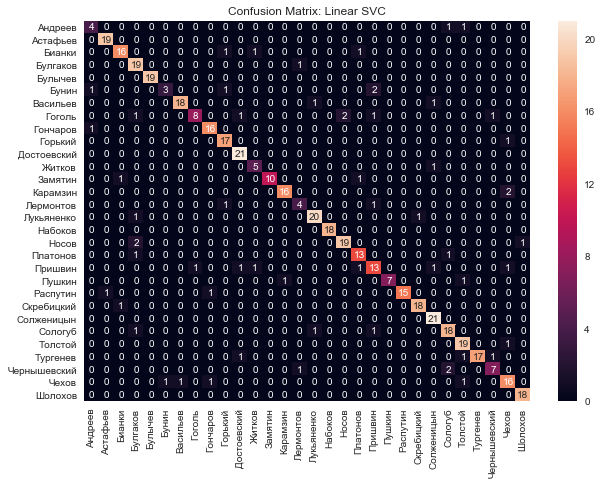

In [511]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

<Figure size 432x288 with 0 Axes>

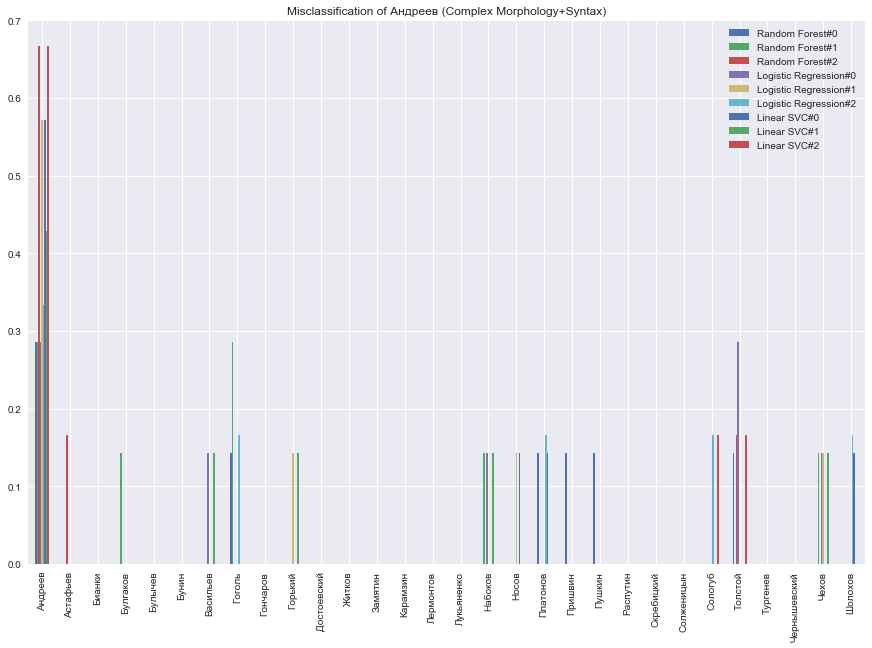

<Figure size 432x288 with 0 Axes>

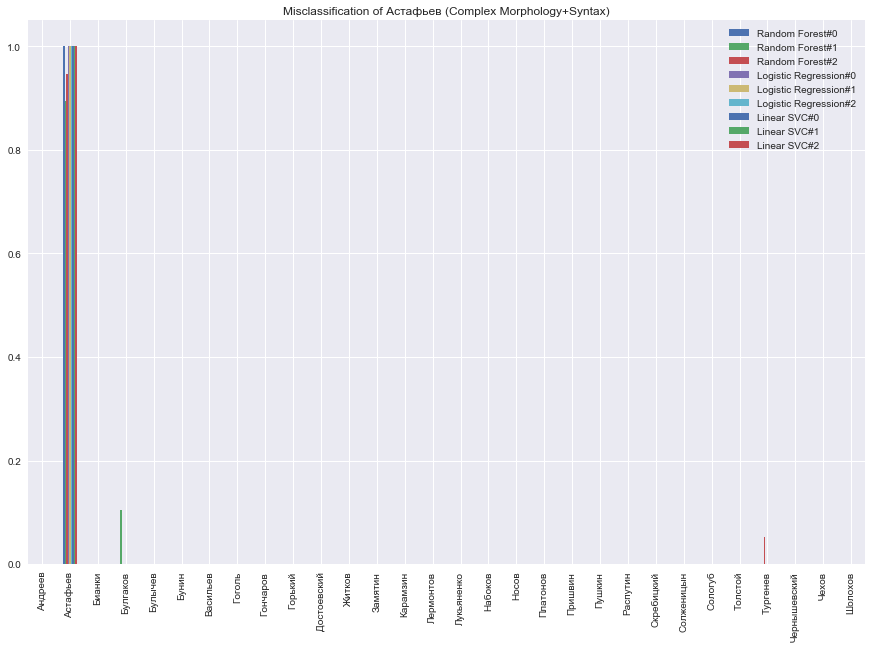

<Figure size 432x288 with 0 Axes>

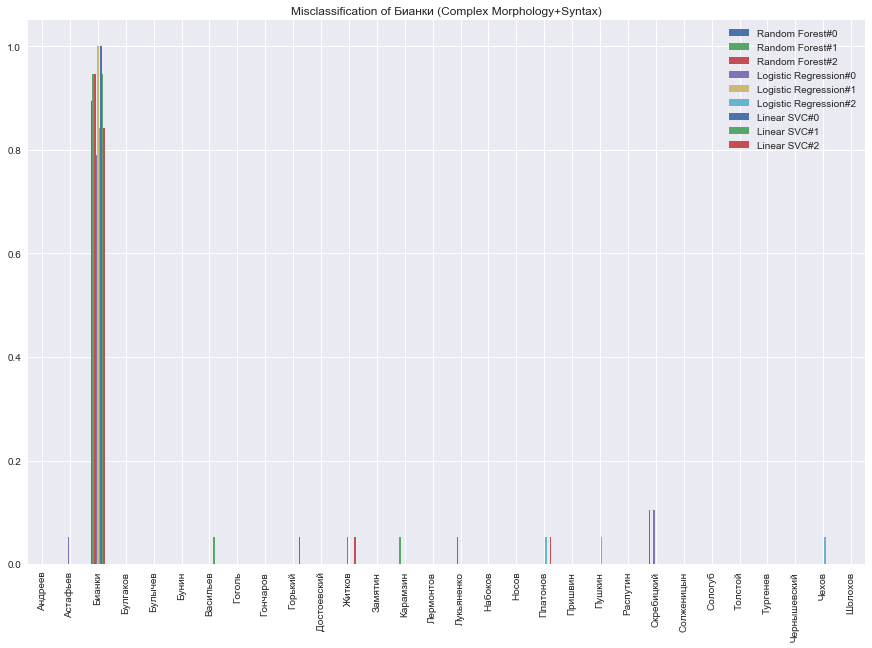

<Figure size 432x288 with 0 Axes>

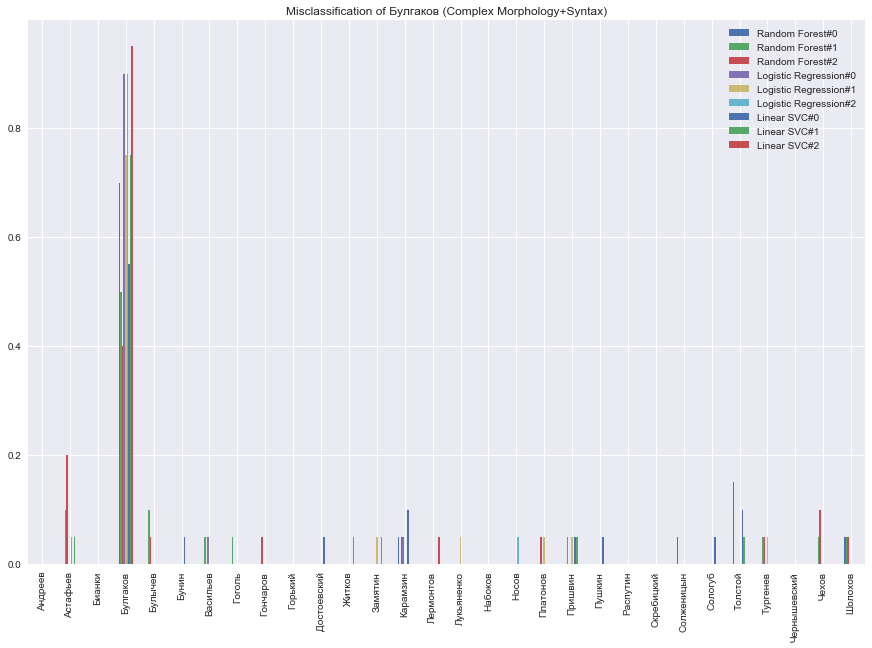

<Figure size 432x288 with 0 Axes>

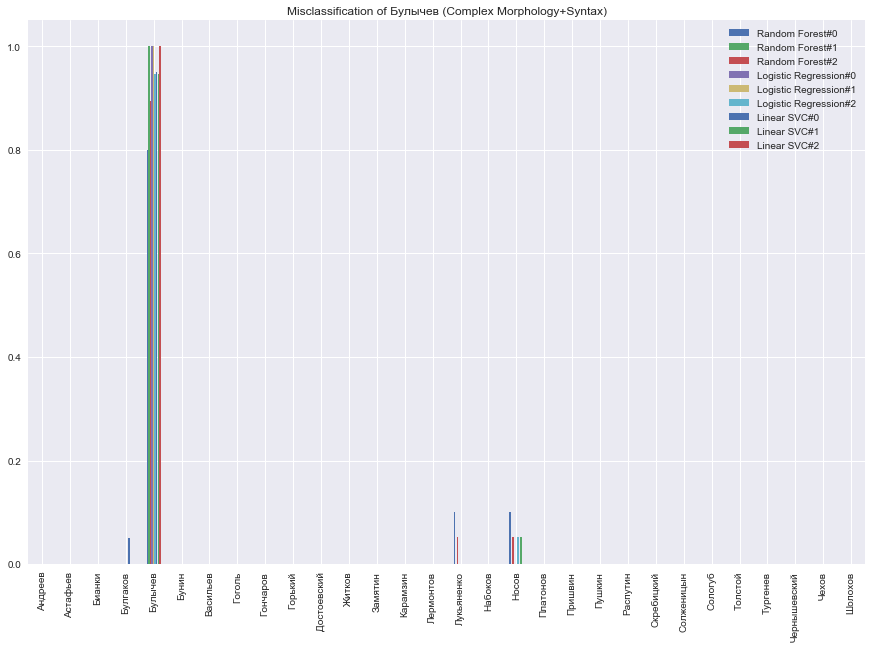

<Figure size 432x288 with 0 Axes>

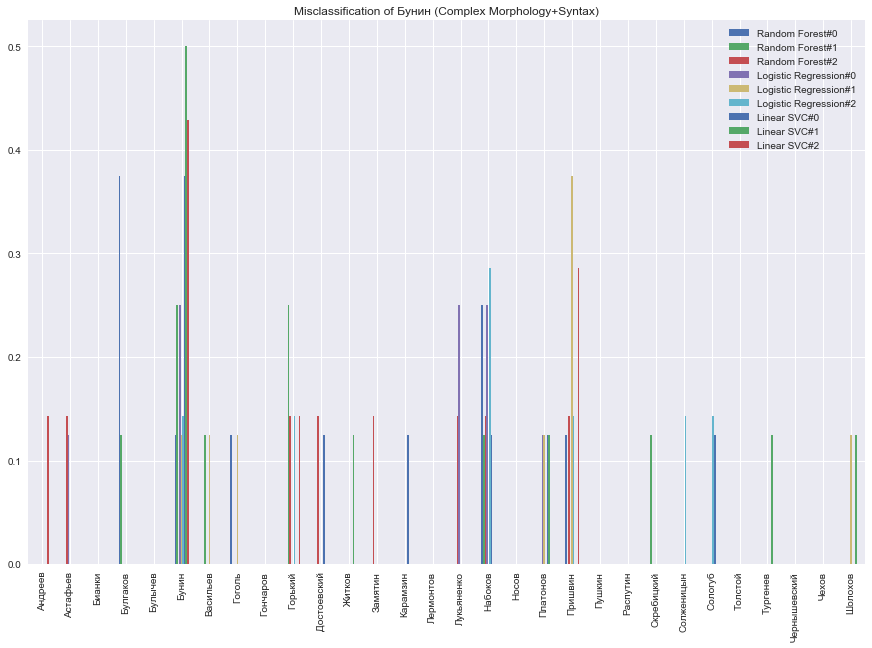

<Figure size 432x288 with 0 Axes>

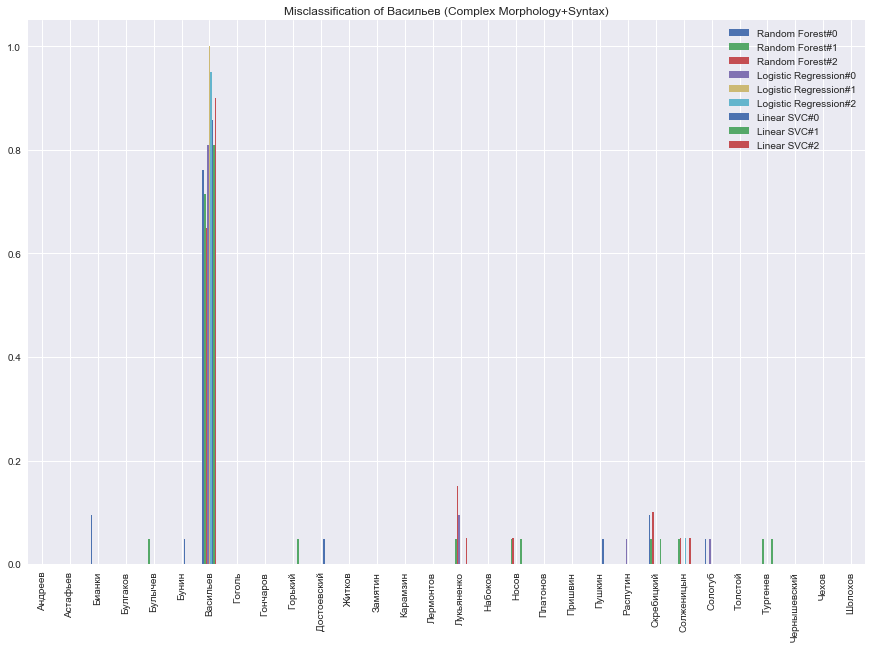

<Figure size 432x288 with 0 Axes>

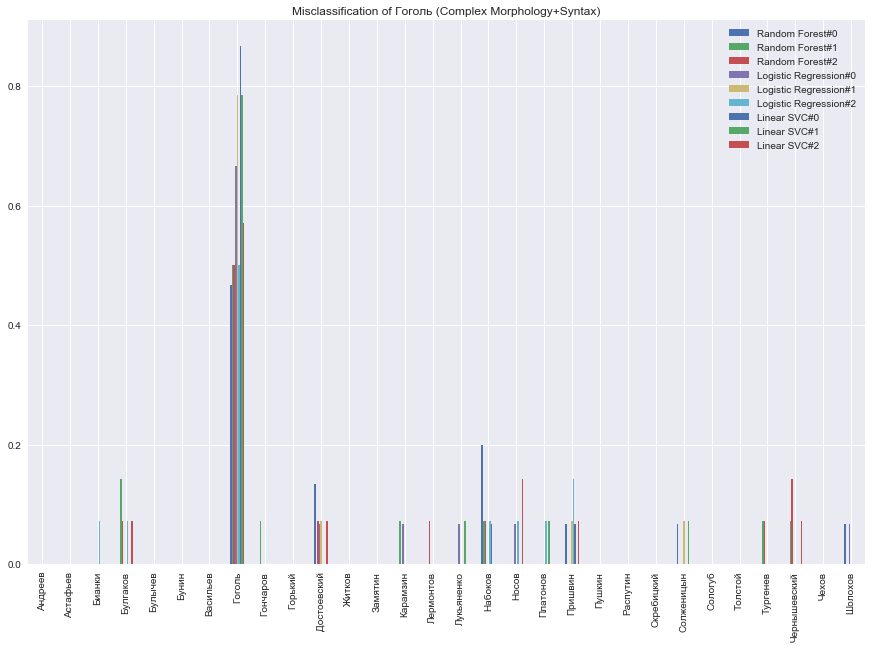

<Figure size 432x288 with 0 Axes>

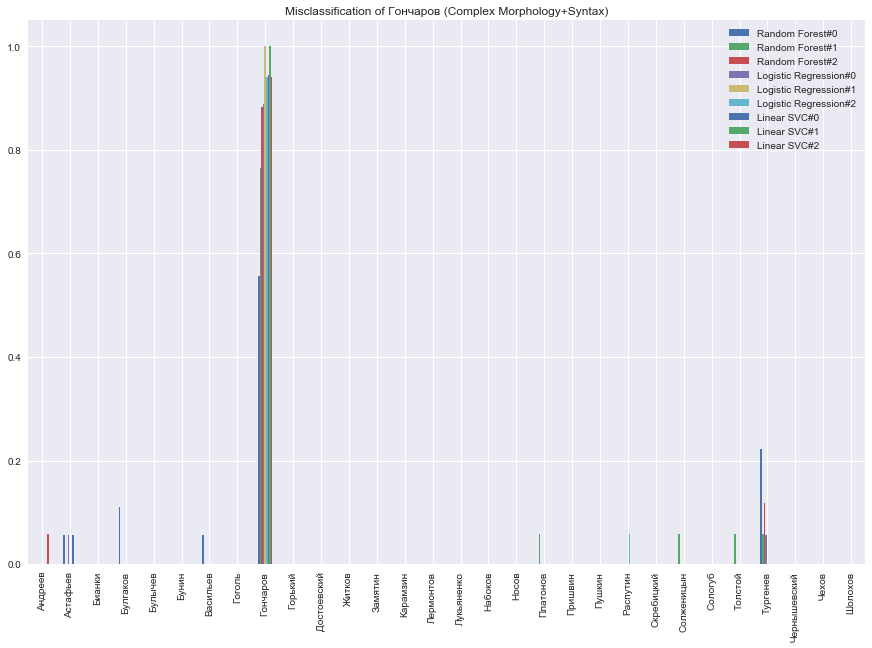

<Figure size 432x288 with 0 Axes>

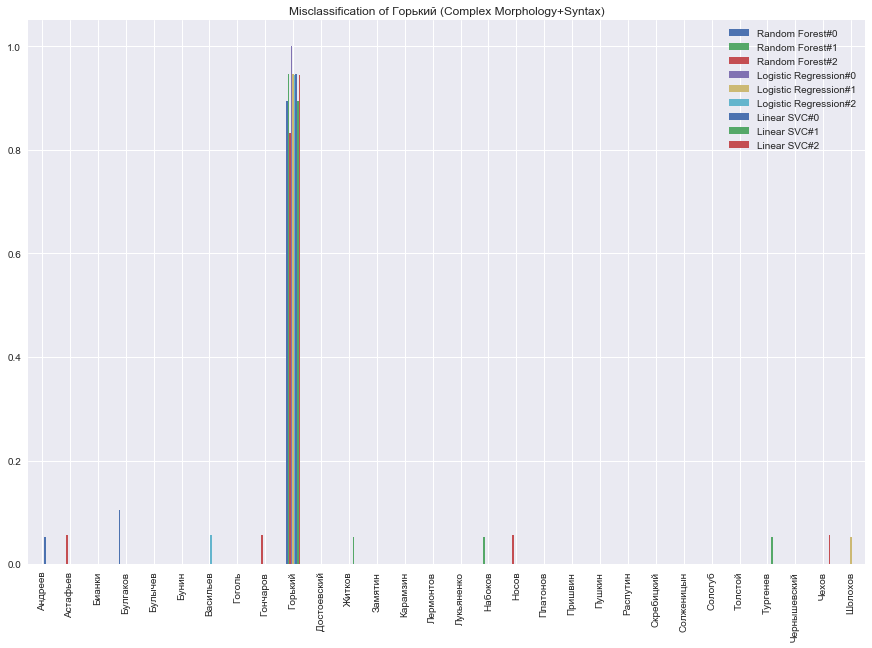

<Figure size 432x288 with 0 Axes>

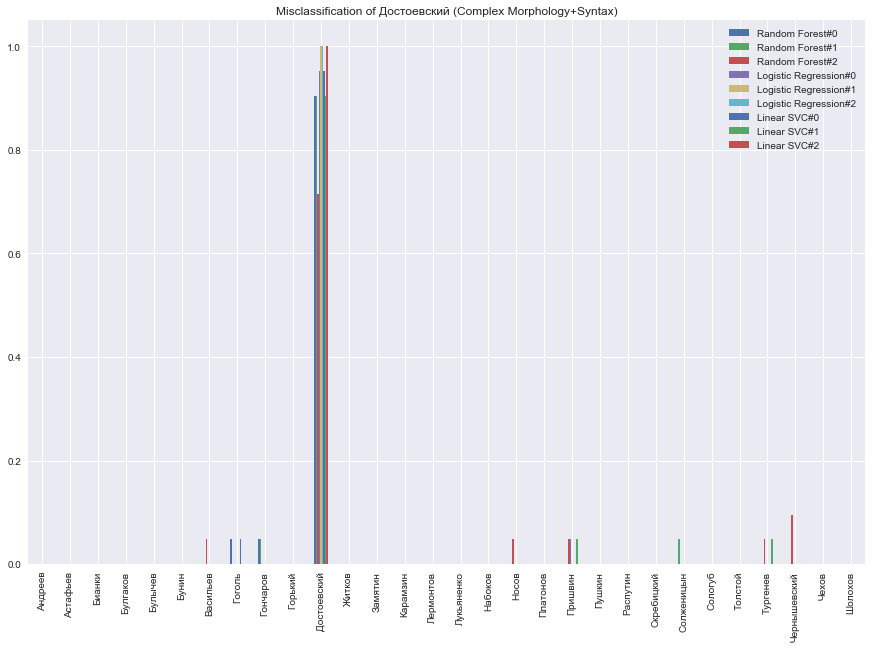

<Figure size 432x288 with 0 Axes>

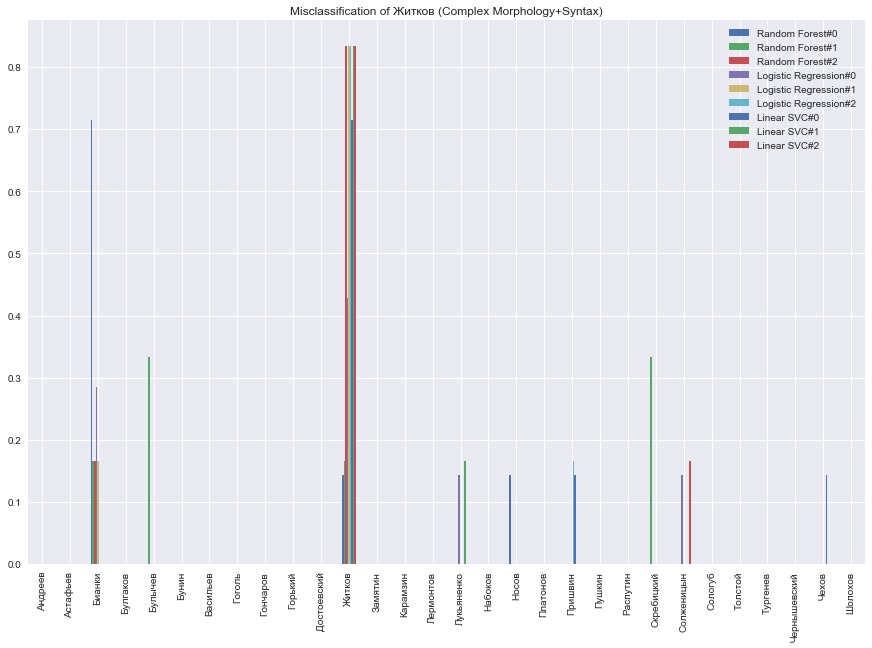

<Figure size 432x288 with 0 Axes>

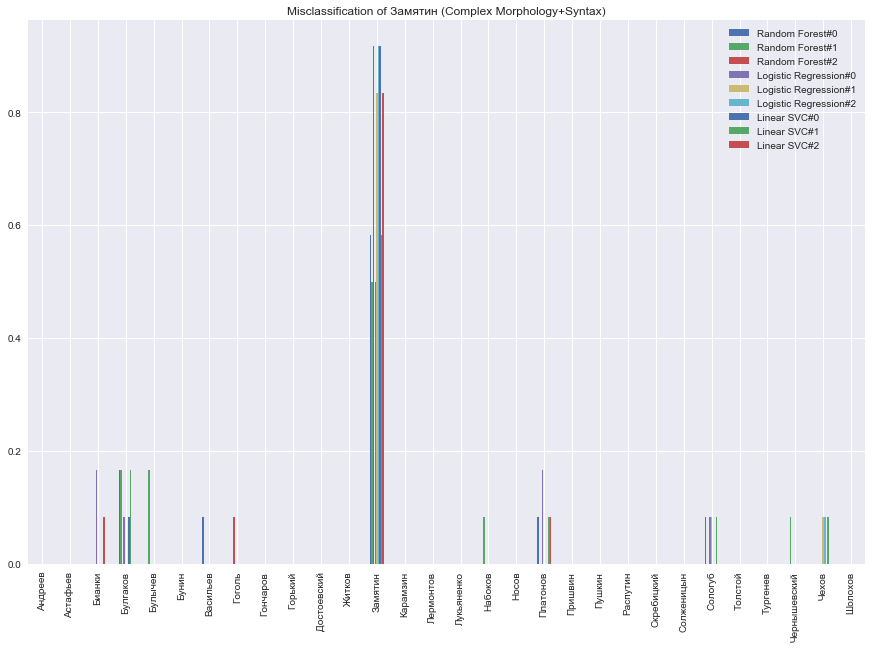

<Figure size 432x288 with 0 Axes>

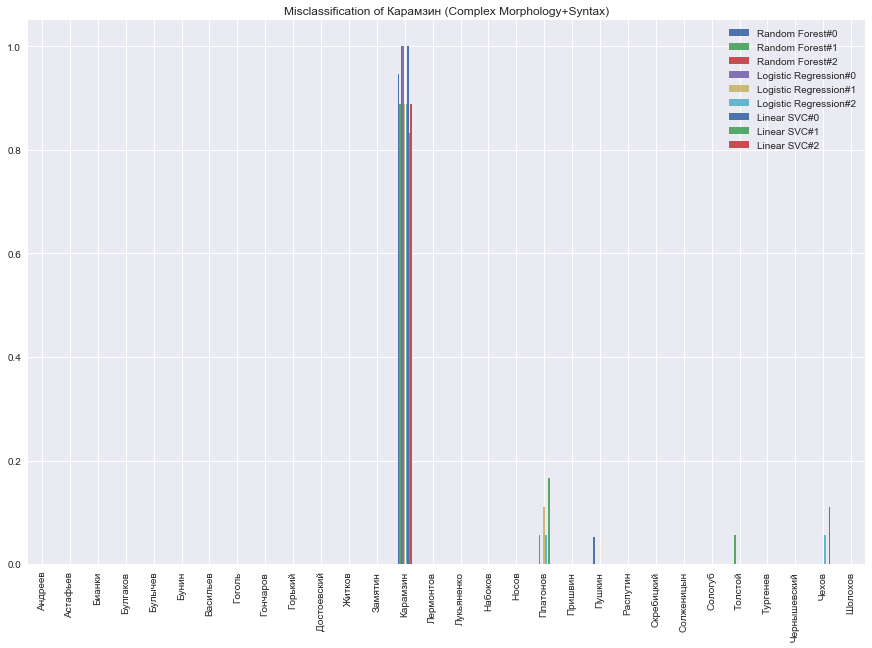

<Figure size 432x288 with 0 Axes>

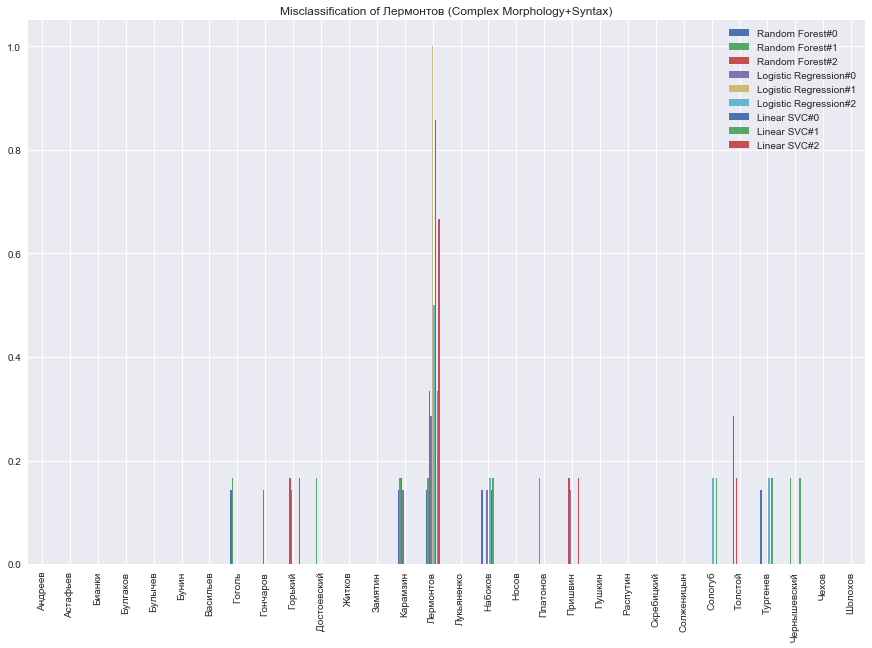

<Figure size 432x288 with 0 Axes>

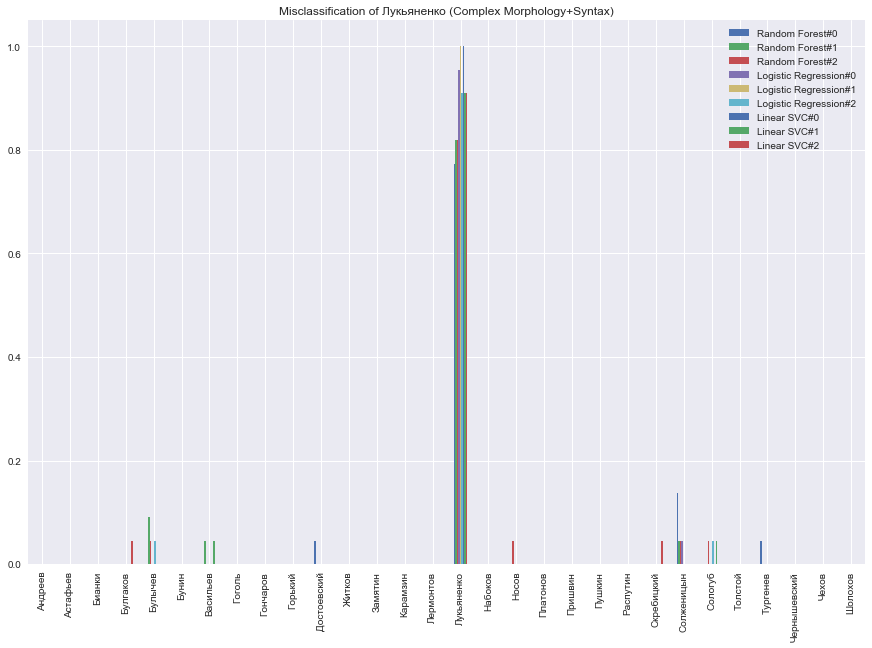

<Figure size 432x288 with 0 Axes>

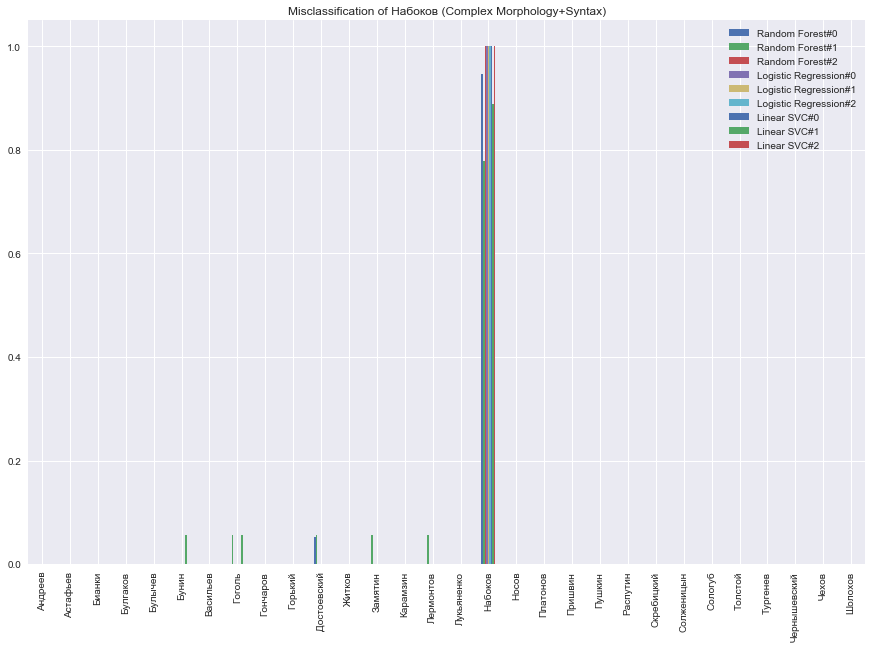

<Figure size 432x288 with 0 Axes>

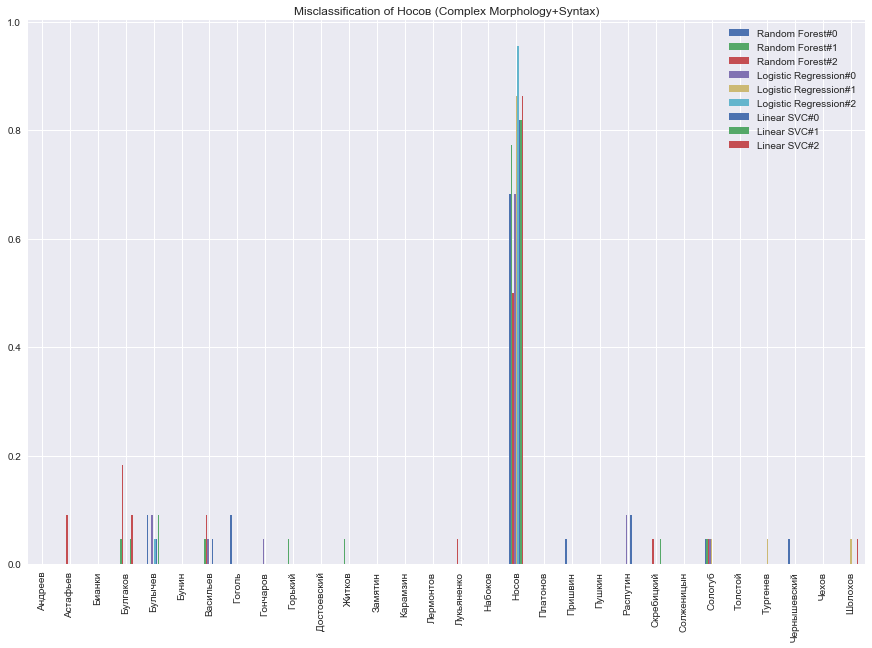

<Figure size 432x288 with 0 Axes>

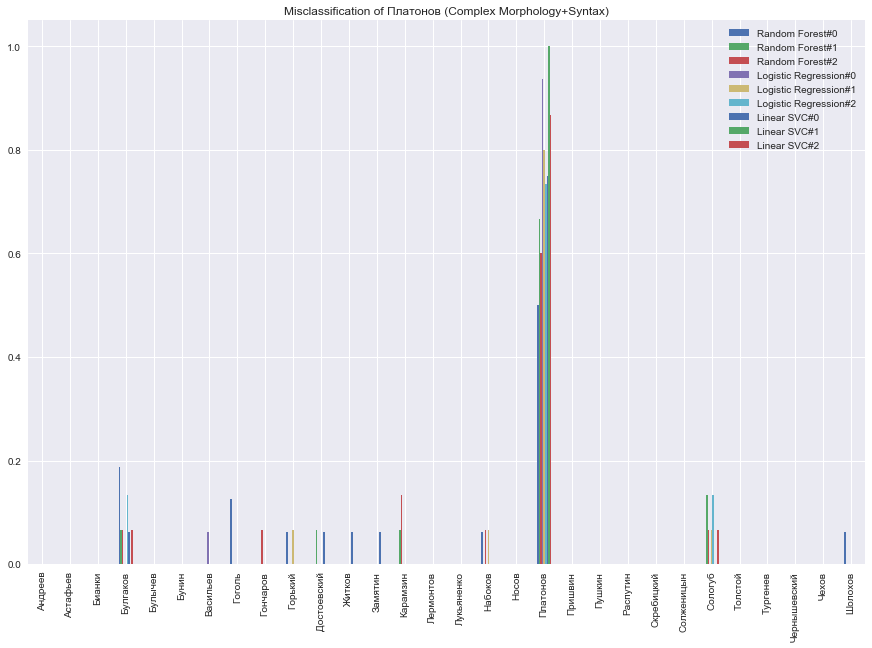

<Figure size 432x288 with 0 Axes>

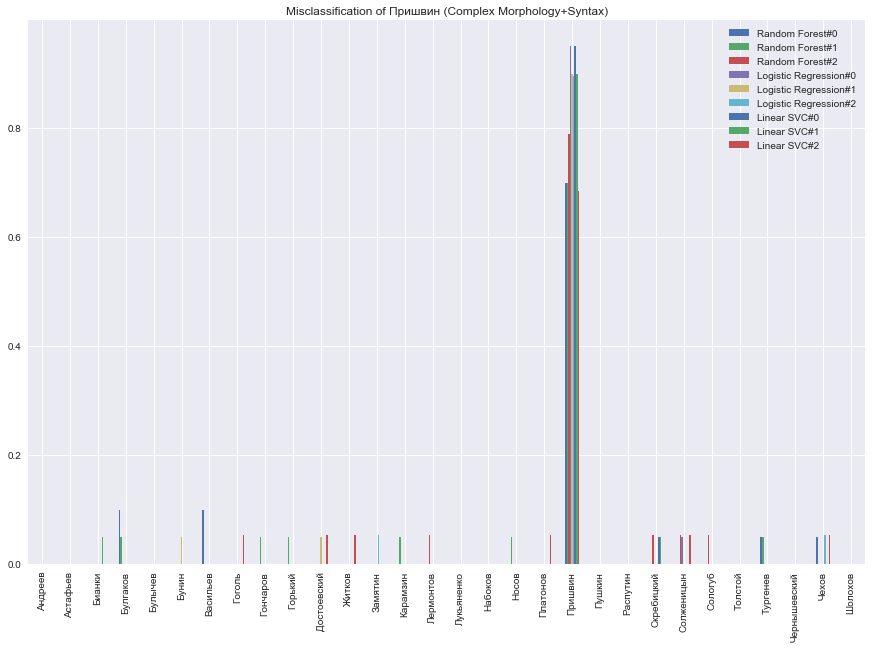

<Figure size 432x288 with 0 Axes>

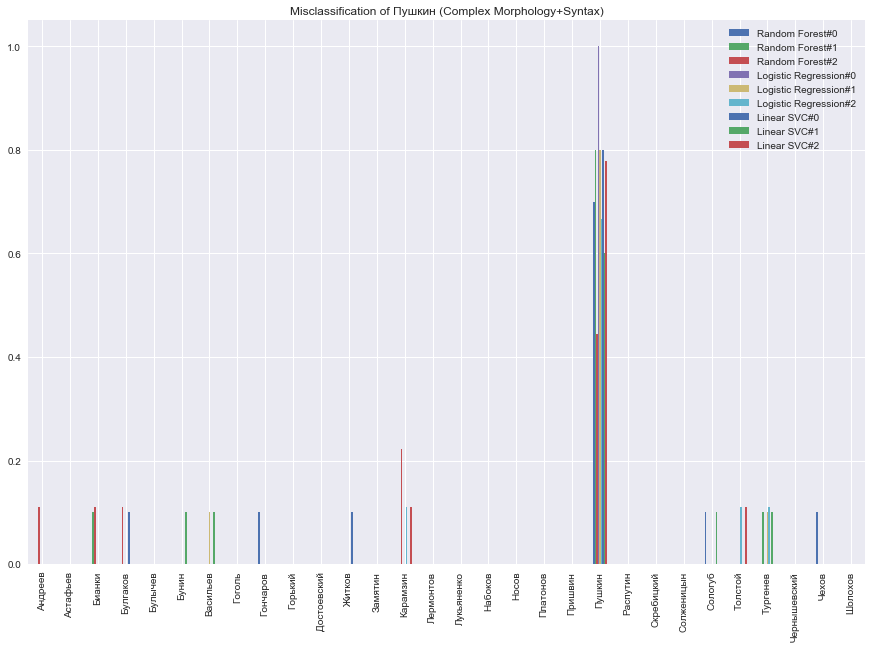

<Figure size 432x288 with 0 Axes>

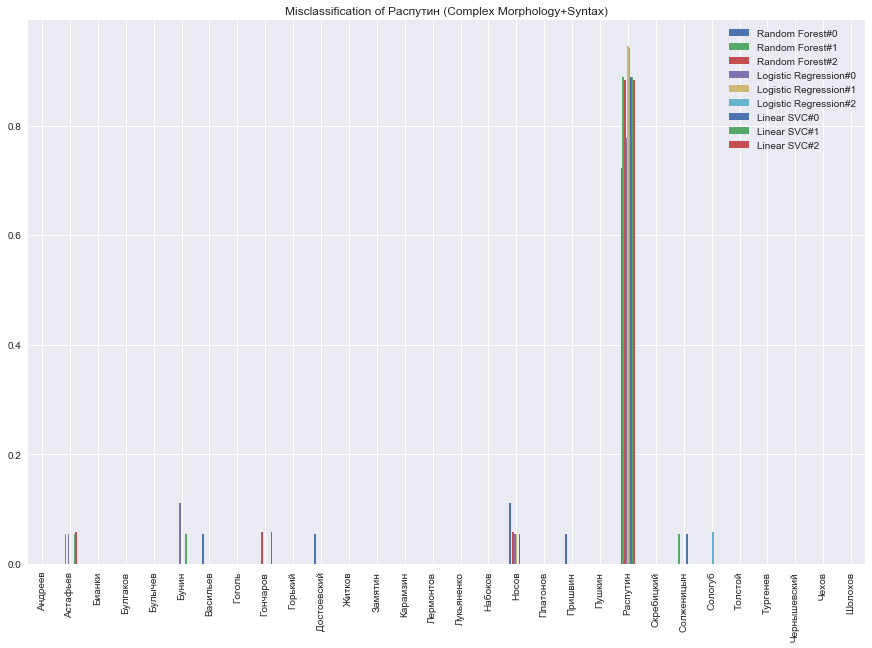

<Figure size 432x288 with 0 Axes>

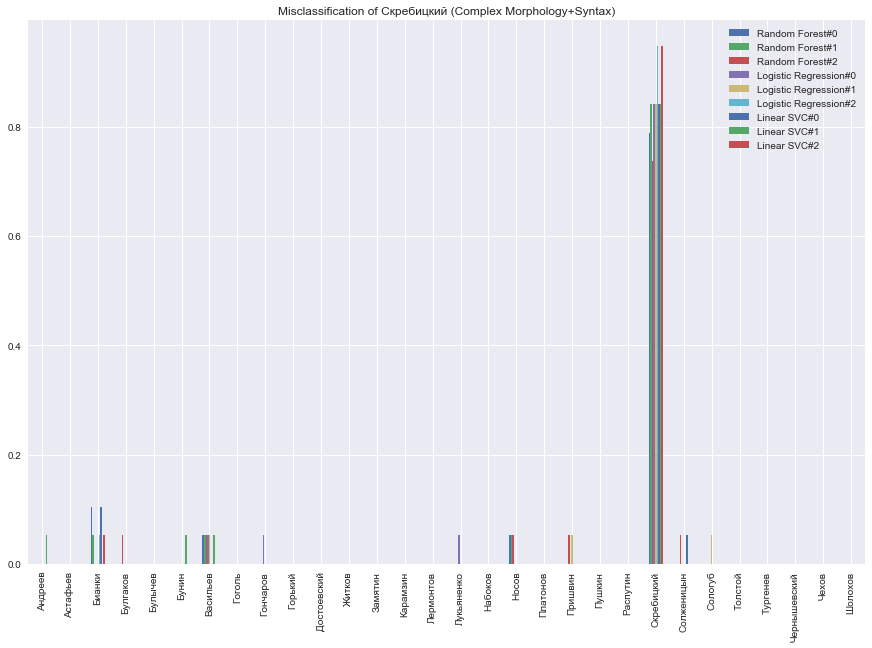

<Figure size 432x288 with 0 Axes>

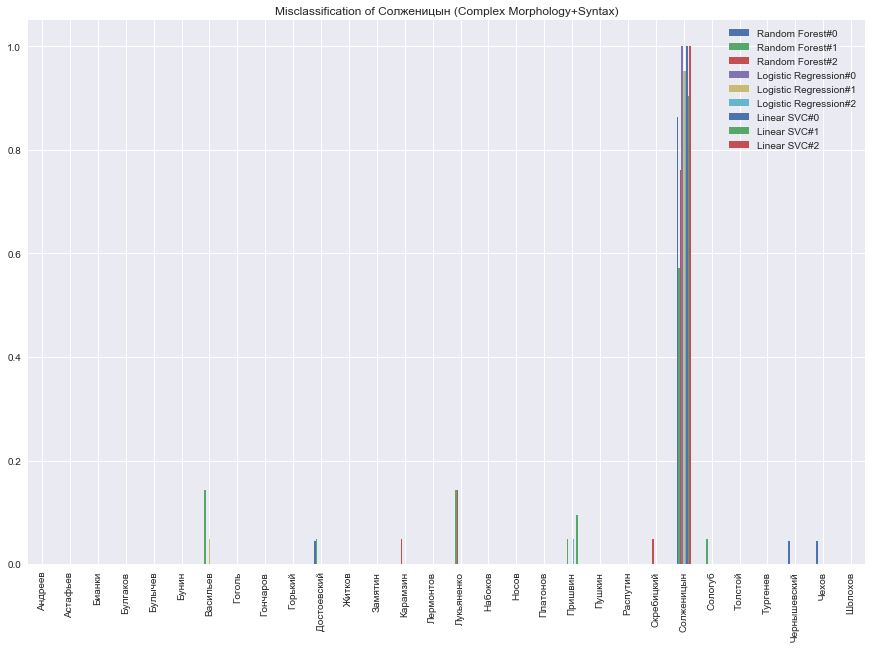

<Figure size 432x288 with 0 Axes>

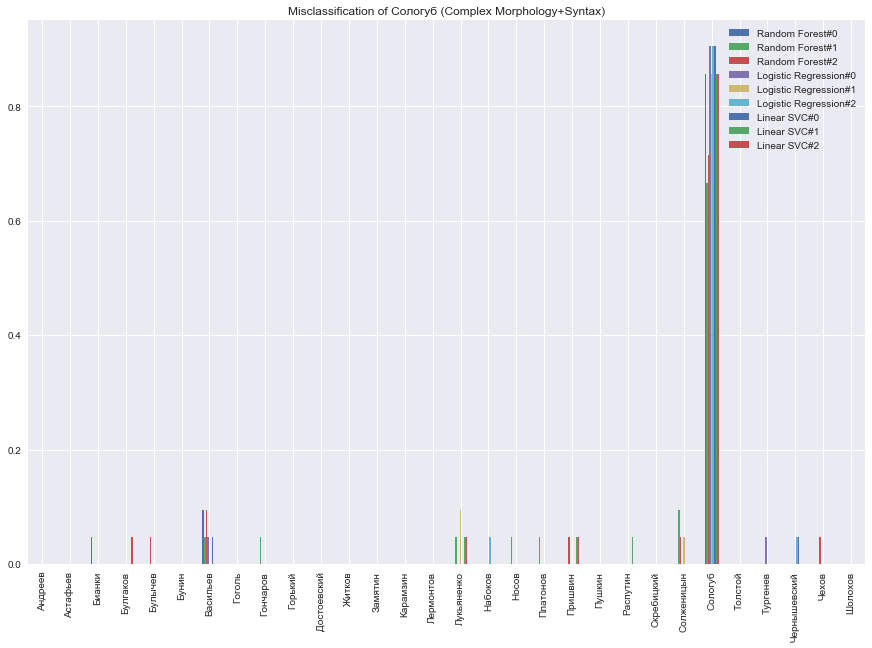

<Figure size 432x288 with 0 Axes>

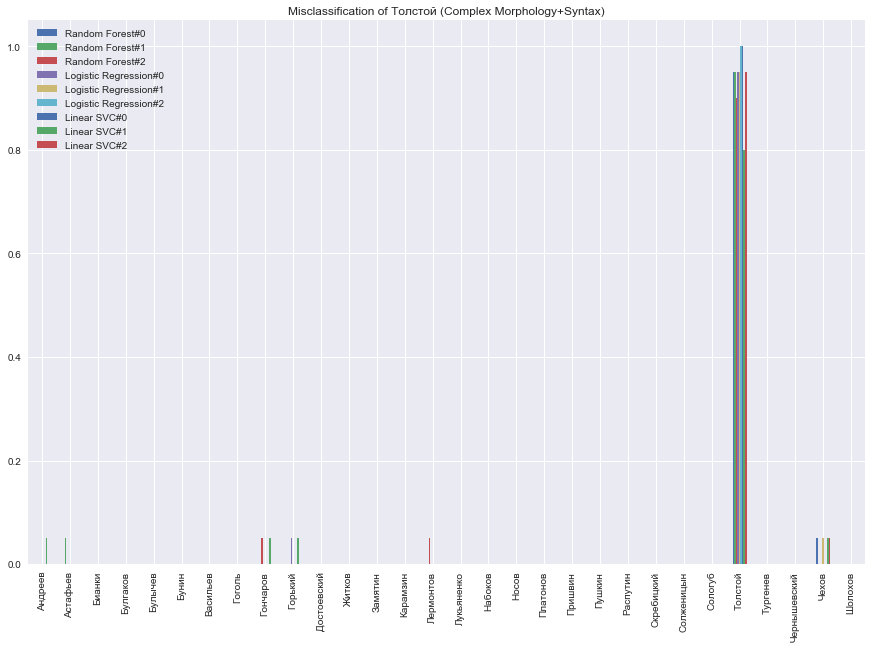

<Figure size 432x288 with 0 Axes>

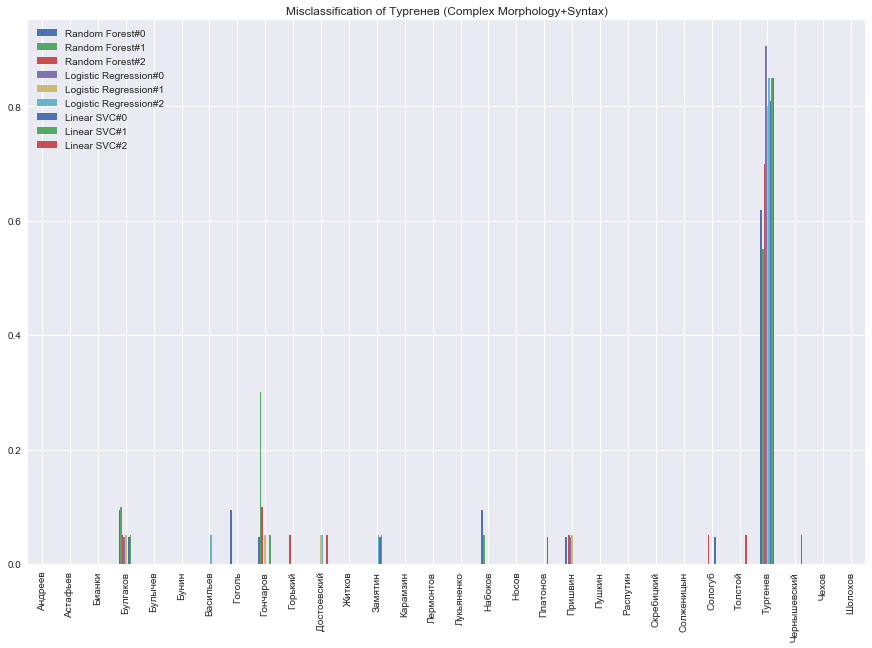

<Figure size 432x288 with 0 Axes>

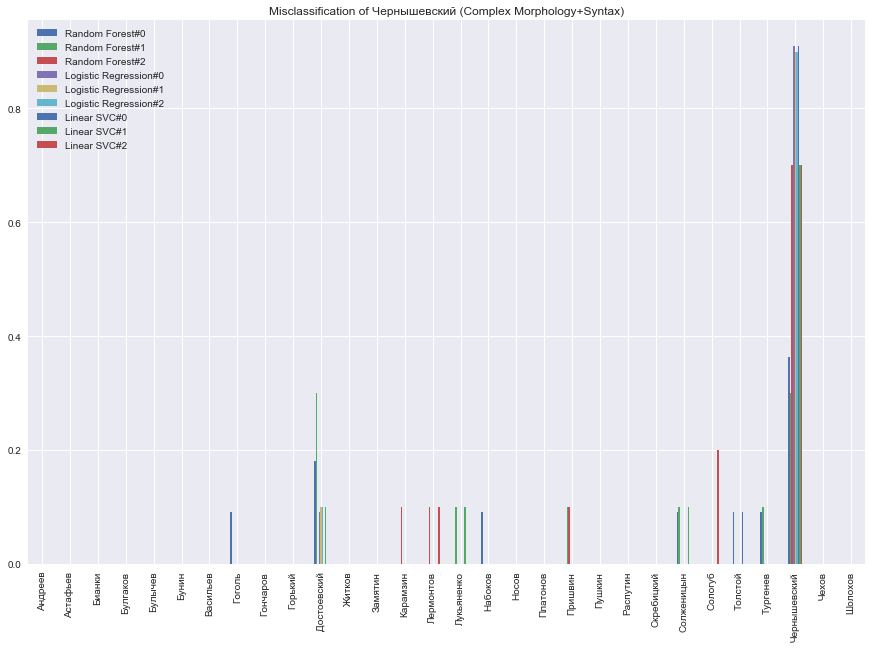

<Figure size 432x288 with 0 Axes>

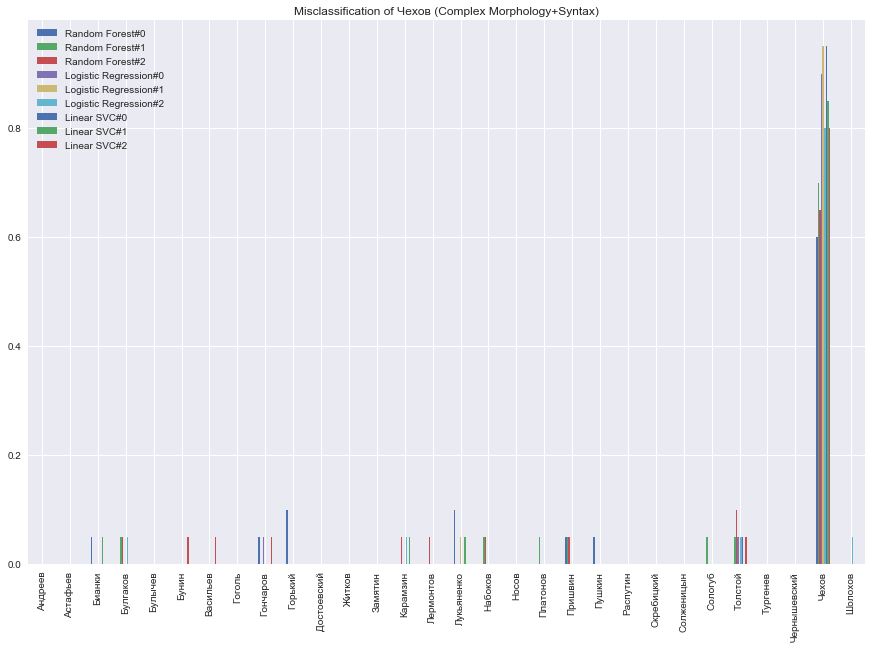

<Figure size 432x288 with 0 Axes>

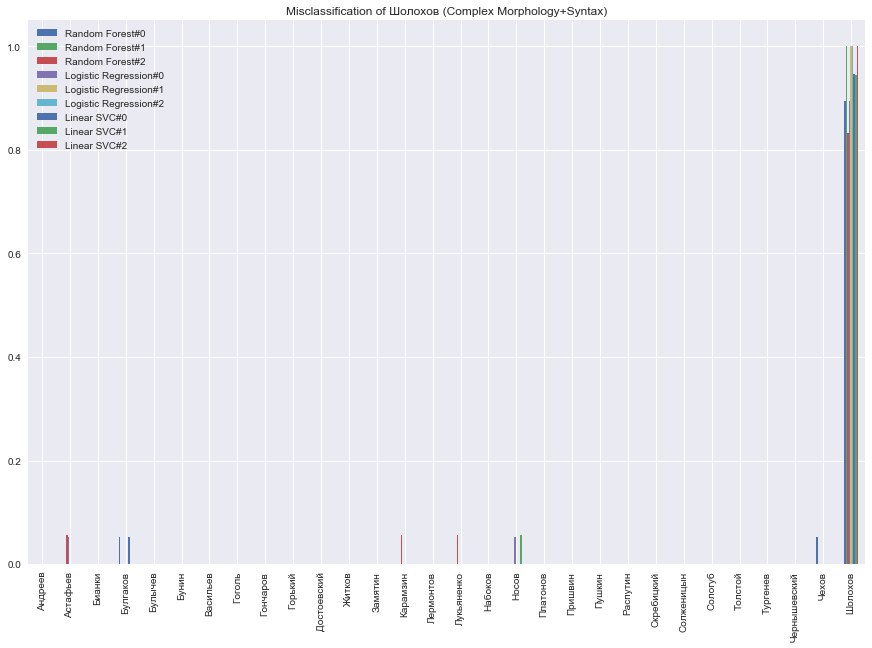

In [512]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [513]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [514]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

# Attempt to upgrade Simple with Complex information

In [515]:
#currentPart = 'Simple+Complex Morphology+Syntax'
currentPart = 'Simple+Complex MorphoSyntax'
simpleMorphoDF = pd.read_csv('OutData/MorphoTags.csv')
simpleMorphoDF = simpleMorphoDF.drop(columns=[ 'SPACE', simpleMorphoDF.columns[0]], axis=1)
print('simpleMorphoDF: {}'.format(simpleMorphoDF.shape))
#display(simpleMorphoDF.head())

simpleSyntaxDF = pd.read_csv('OutData/SyntaxDependencies.csv')
simpleSyntaxDF = simpleSyntaxDF.drop(columns=[simpleSyntaxDF.columns[0], 'Author', 'Novel'], axis=1)
print('simpleSyntaxDF: {}'.format(simpleSyntaxDF.shape))
#display(simpleSyntaxDF.head())

mergeDFSimple = pd.concat([simpleMorphoDF.drop(columns=['Author', 'Novel'],axis=1),simpleSyntaxDF ], axis=1)
print('mergeDFSimple : {}'.format(mergeDF.shape))
#display(mergeDFSimple.head())

extendedMorphoDF = pd.read_csv('OutData/ExtendedMorpho.csv')
print('extendedMorphoDF: {}'.format(extendedMorphoDF.shape))
#display(extendedMorphoDF.head())

complexSyntaxDF = pd.read_csv('OutData/SyntaxComplex.csv')
print('complexSyntaxDF: {}'.format(complexSyntaxDF.shape))
#display(complexSyntaxDF.head())

mergeDFComplex = pd.concat([extendedMorphoDF.drop(columns=['Author', 'Novel'],axis=1),complexSyntaxDF ], axis=1)
print('mergeDFComplex : {}'.format(mergeDF.shape))
#display(mergeDFComplex.head())

mergeDF = pd.concat([mergeDFSimple, mergeDFComplex], axis=1)
print('Shape total merge: {}'.format(mergeDF.shape))
X = mergeDF.drop(columns=['Author', 'Novel'], axis=1).values
name_of_features = mergeDF.drop(columns=['Author', 'Novel'], axis=1).columns
label_list_by_authors = mergeDF.Author.values

countOfAuthors = len(mergeDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))
print('Matrix of data: {}'.format(X.shape))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)

simpleMorphoDF: (1506, 19)
simpleSyntaxDF: (1506, 40)
mergeDFSimple : (1506, 46)
extendedMorphoDF: (1506, 18)
complexSyntaxDF: (1506, 30)
mergeDFComplex : (1506, 46)
Shape total merge: (1506, 103)
We have 30 authors
Matrix of data: (1506, 101)


In [378]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.8521369587214324
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.18357539376111767
	AMI: 0.3733488265586275


# CV-3

Current model: Random Forest
Accuracy  	mean: 0.81731
Precision 	mean: 0.82618
Recall    	mean: 0.81731
f1        	mean: 0.81045


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

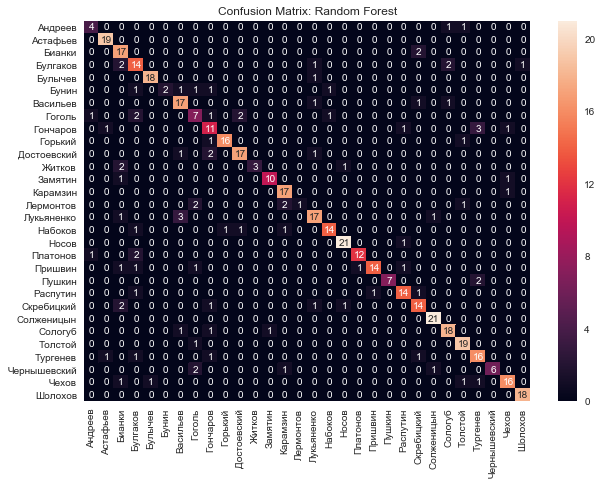

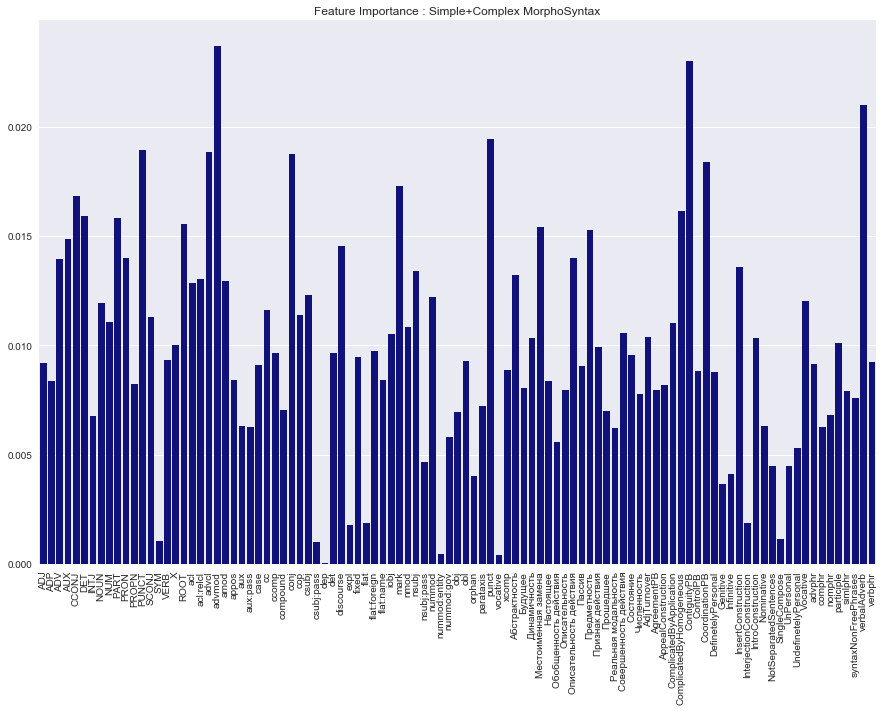

Current model: Logistic Regression
Accuracy  	mean: 0.93765
Precision 	mean: 0.93747
Recall    	mean: 0.93765
f1        	mean: 0.93312


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

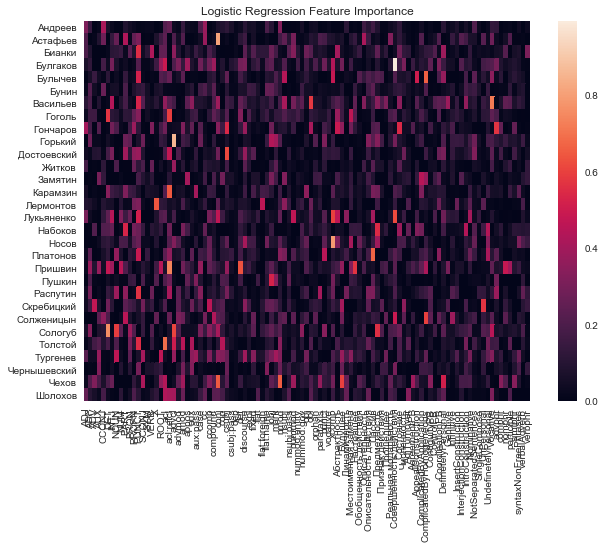

Current model: Linear SVC
Accuracy  	mean: 0.93577
Precision 	mean: 0.93931
Recall    	mean: 0.93577
f1        	mean: 0.93370


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

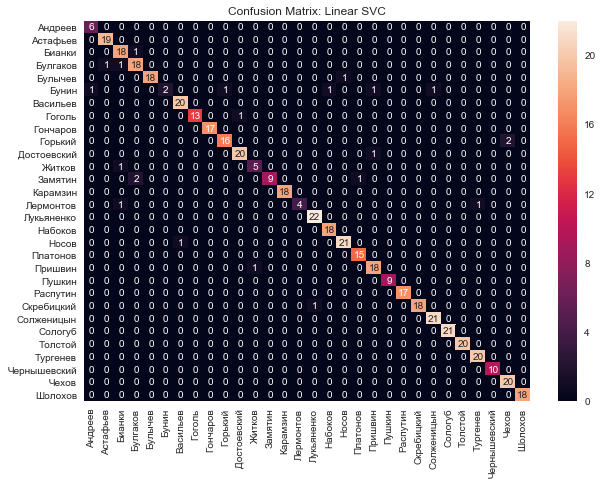

In [516]:

predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = True,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)


<Figure size 432x288 with 0 Axes>

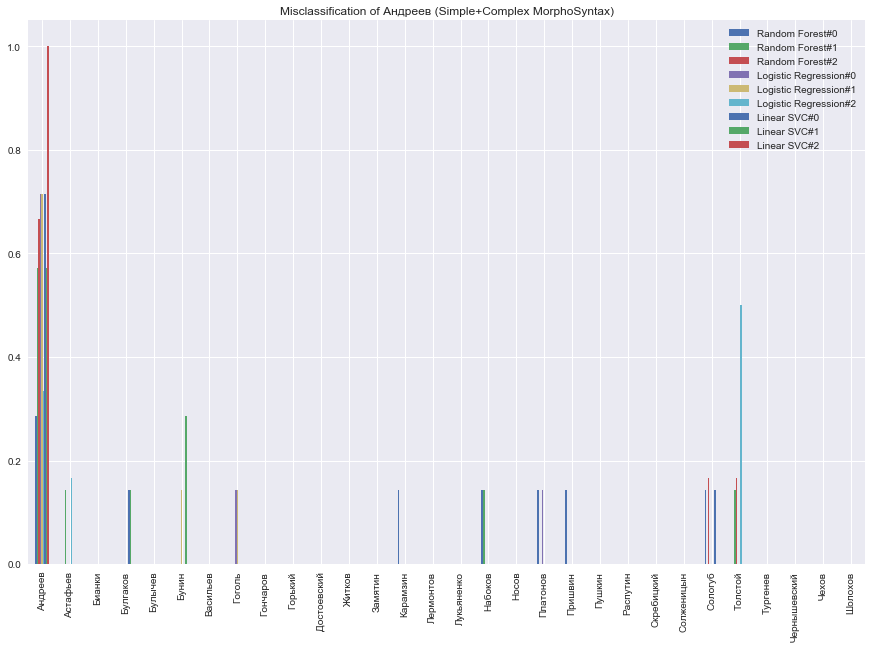

<Figure size 432x288 with 0 Axes>

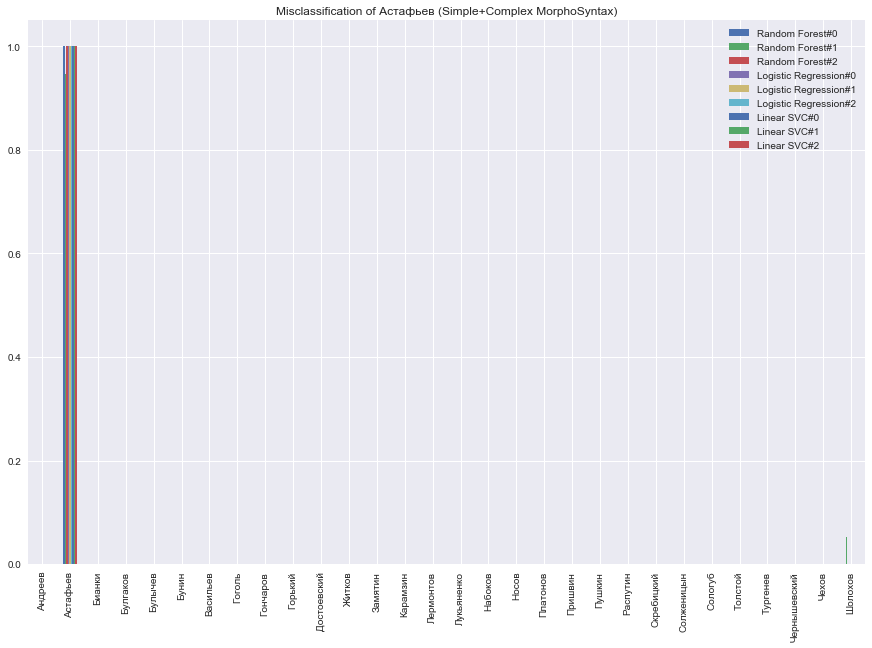

<Figure size 432x288 with 0 Axes>

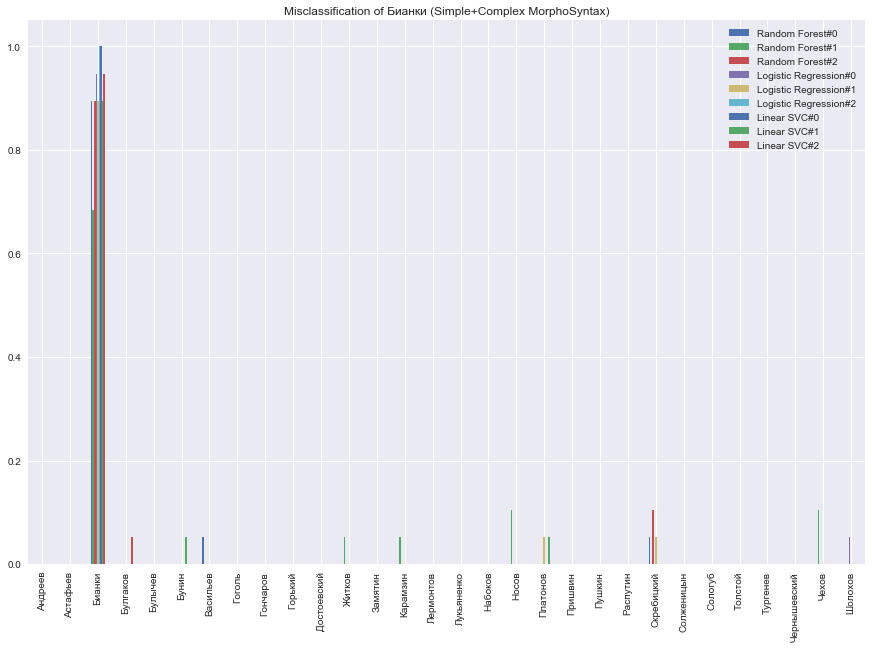

<Figure size 432x288 with 0 Axes>

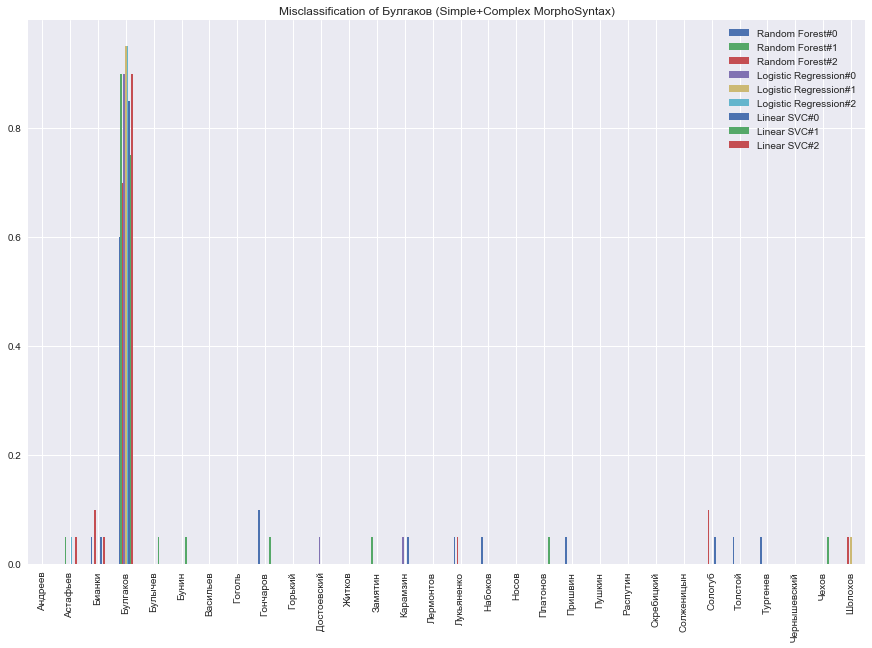

<Figure size 432x288 with 0 Axes>

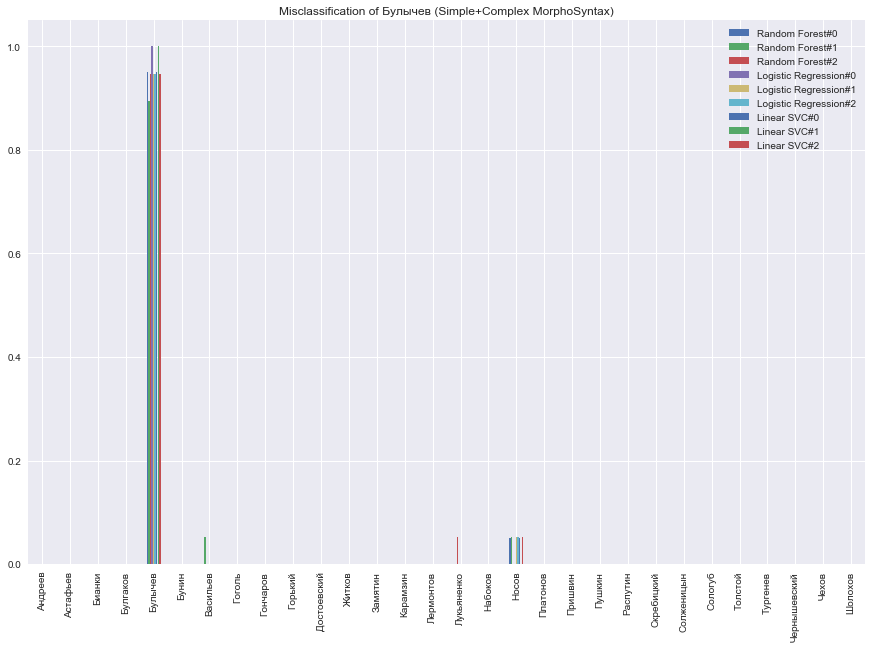

<Figure size 432x288 with 0 Axes>

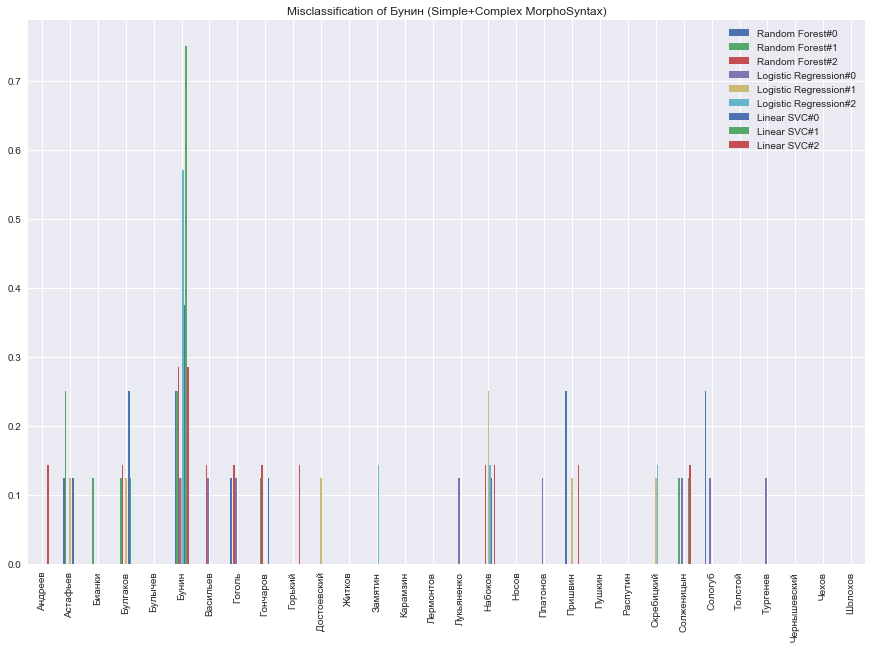

<Figure size 432x288 with 0 Axes>

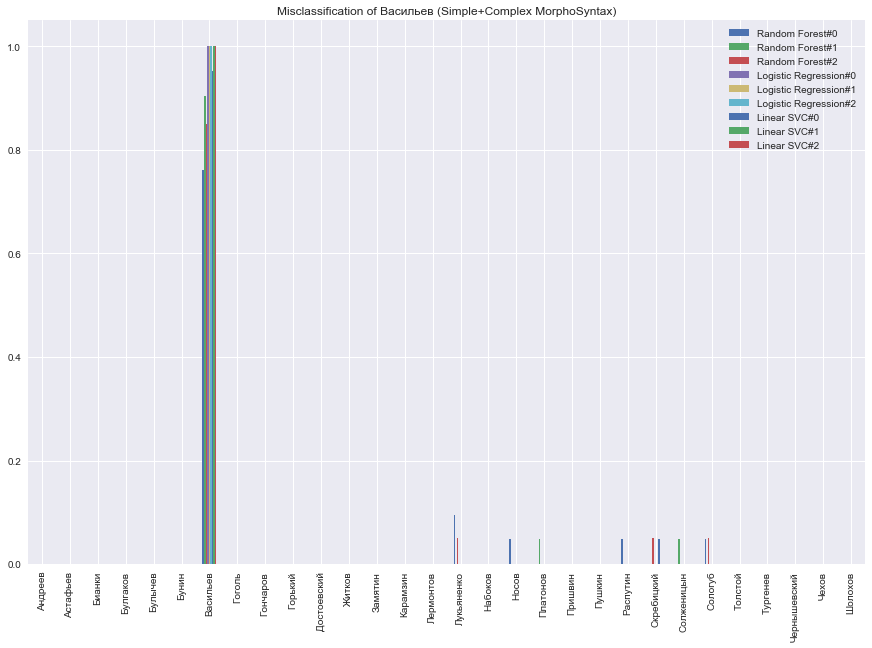

<Figure size 432x288 with 0 Axes>

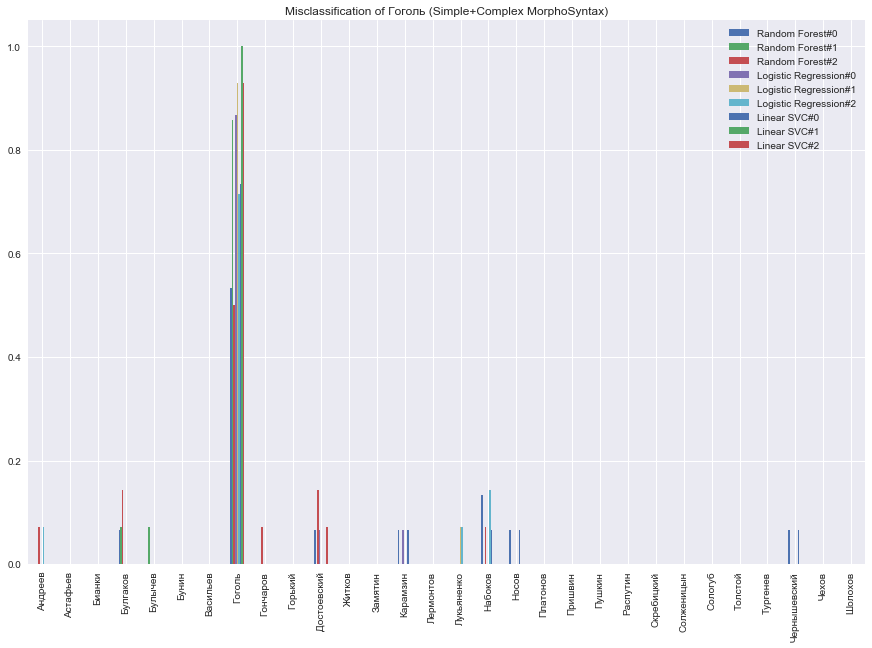

<Figure size 432x288 with 0 Axes>

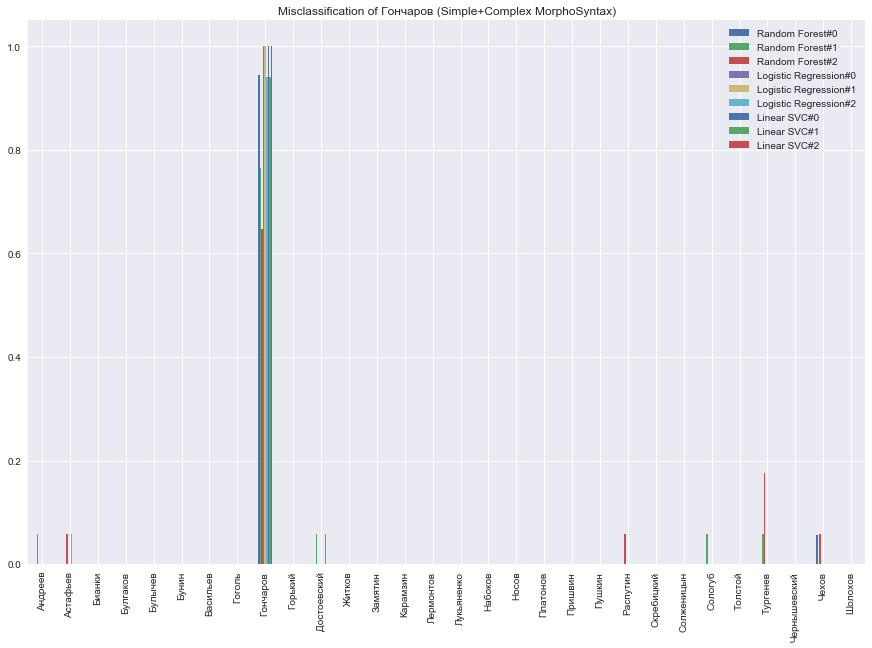

<Figure size 432x288 with 0 Axes>

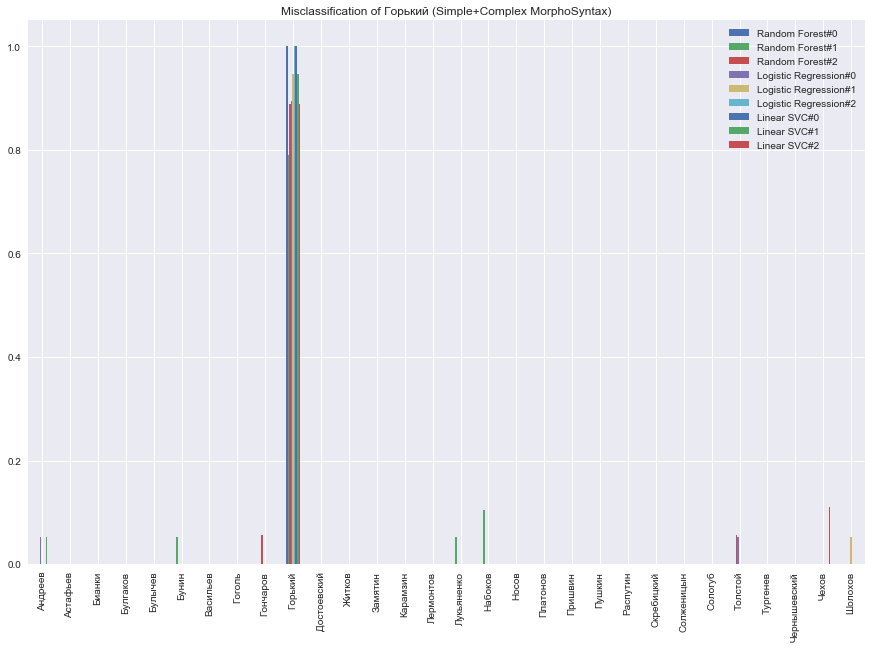

<Figure size 432x288 with 0 Axes>

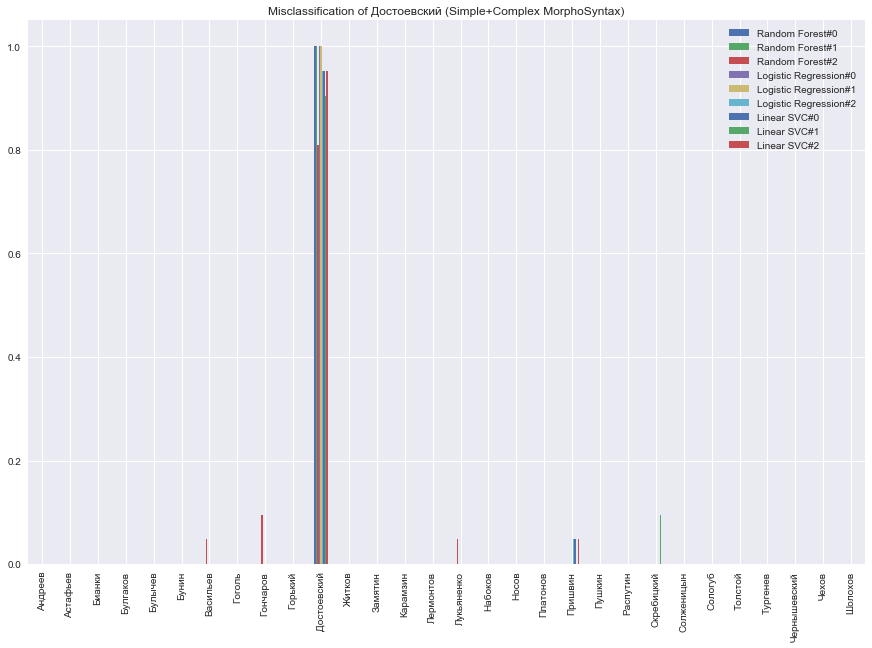

<Figure size 432x288 with 0 Axes>

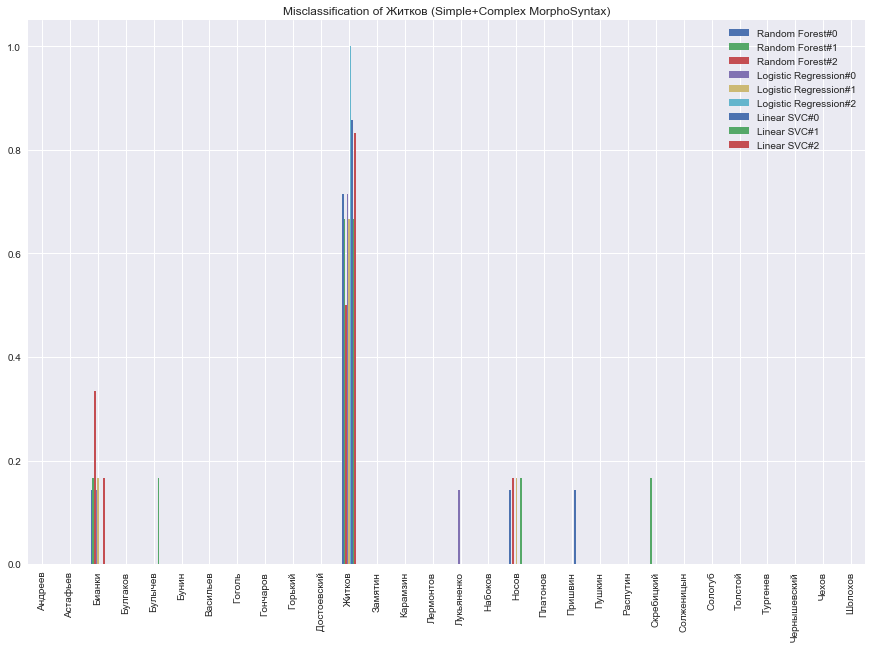

<Figure size 432x288 with 0 Axes>

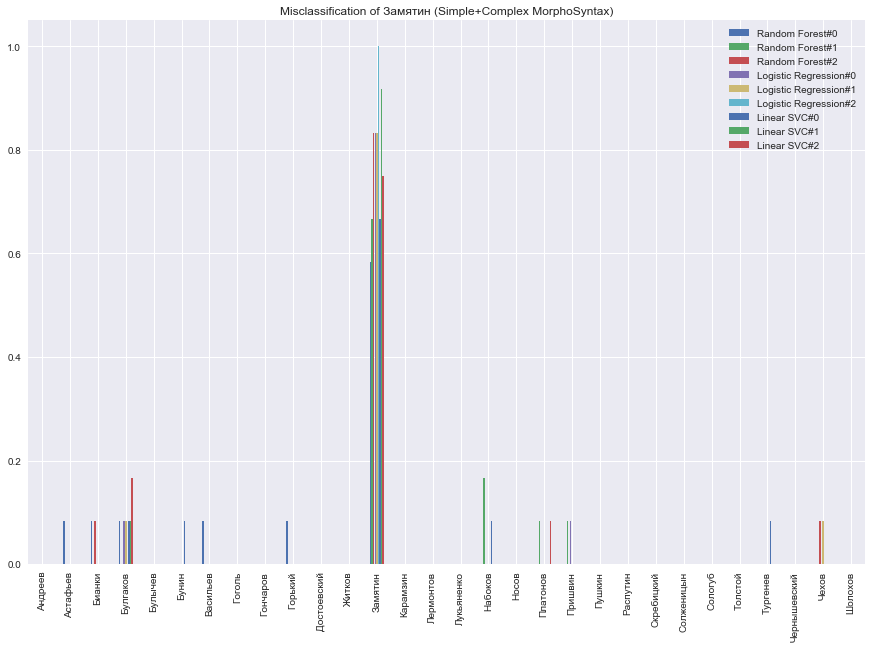

<Figure size 432x288 with 0 Axes>

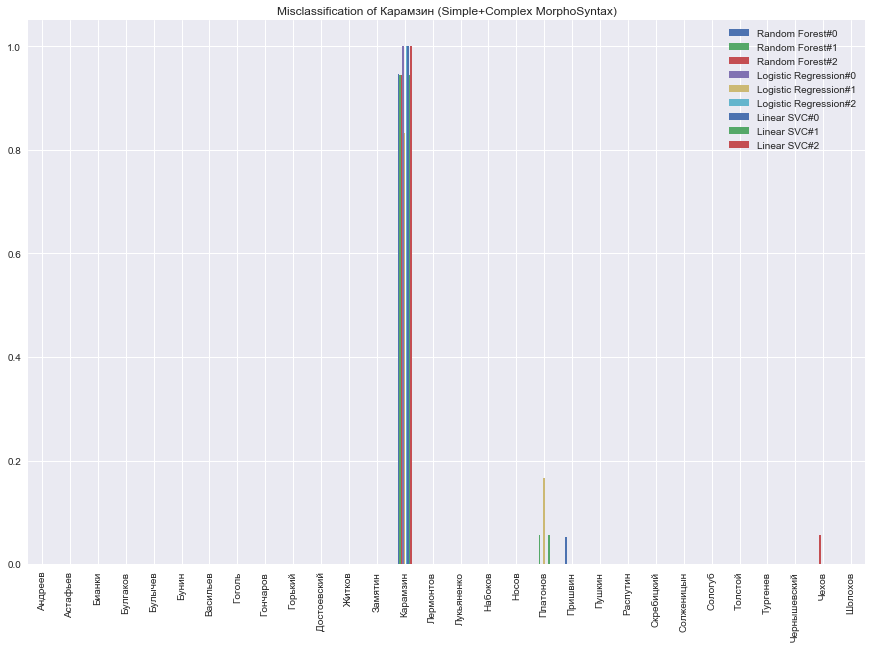

<Figure size 432x288 with 0 Axes>

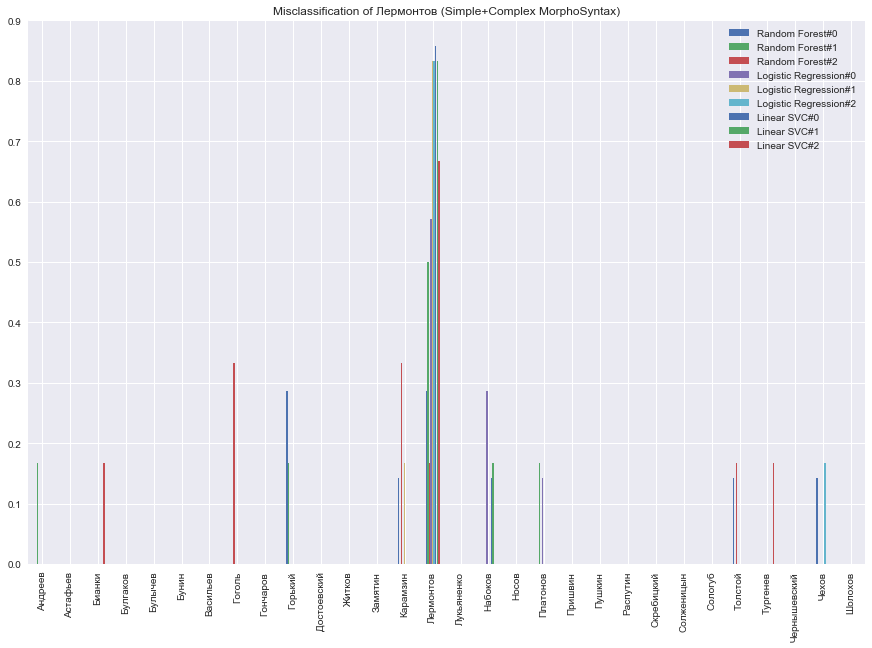

<Figure size 432x288 with 0 Axes>

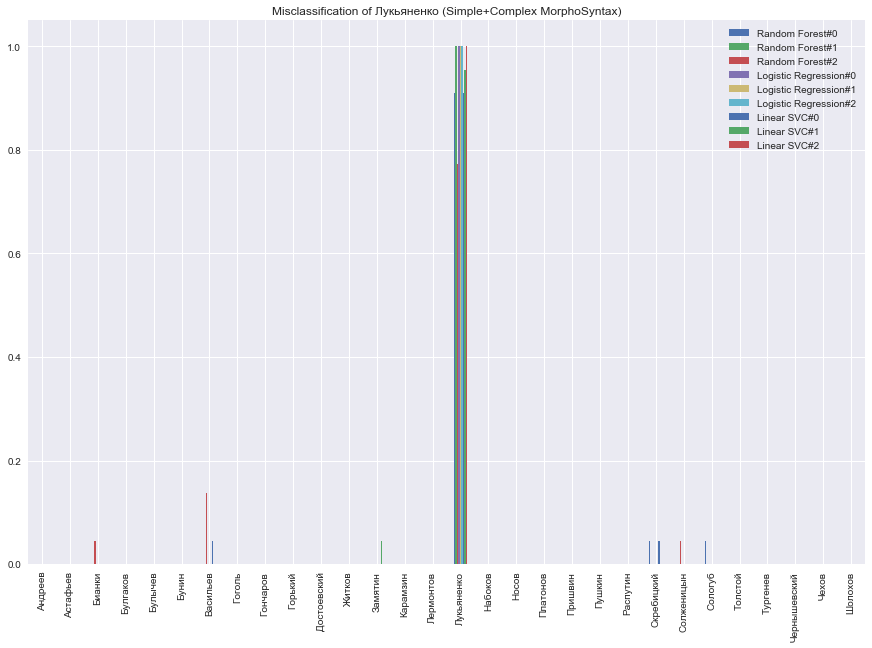

<Figure size 432x288 with 0 Axes>

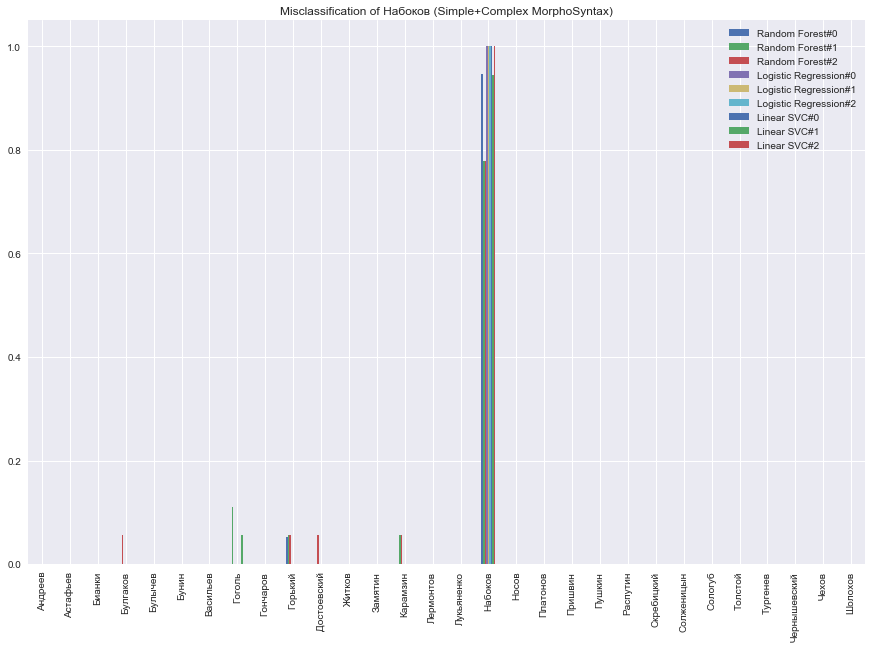

<Figure size 432x288 with 0 Axes>

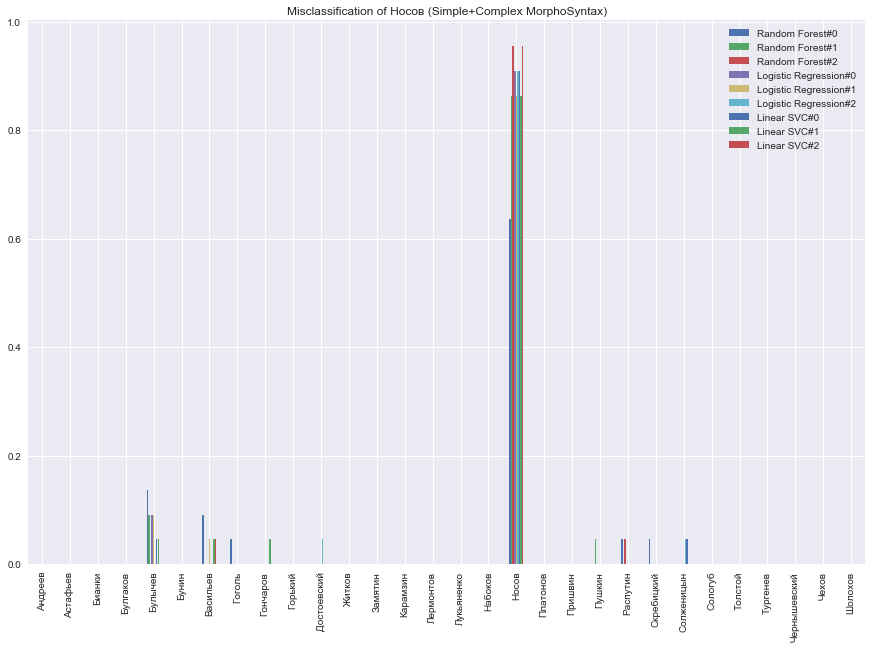

<Figure size 432x288 with 0 Axes>

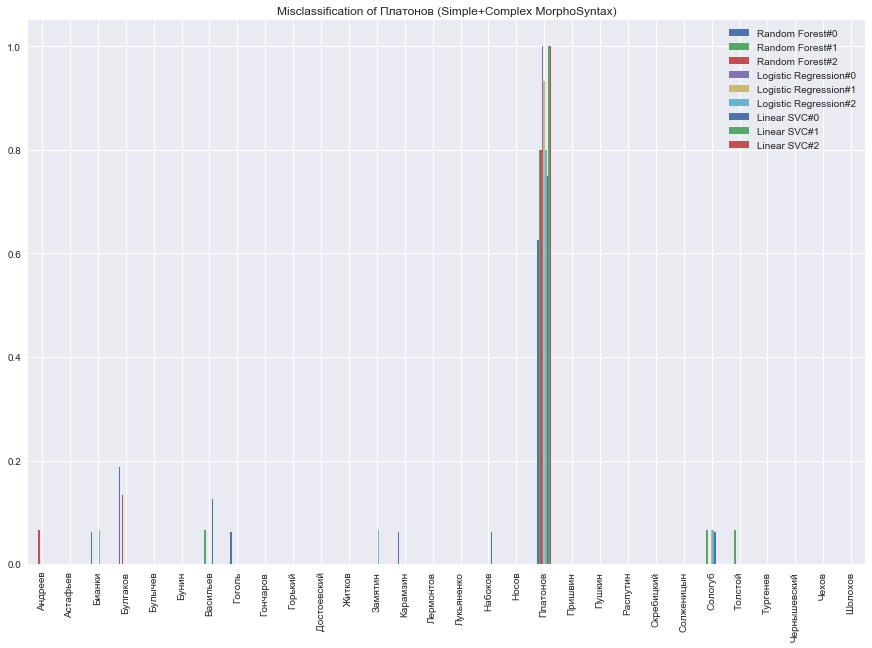

<Figure size 432x288 with 0 Axes>

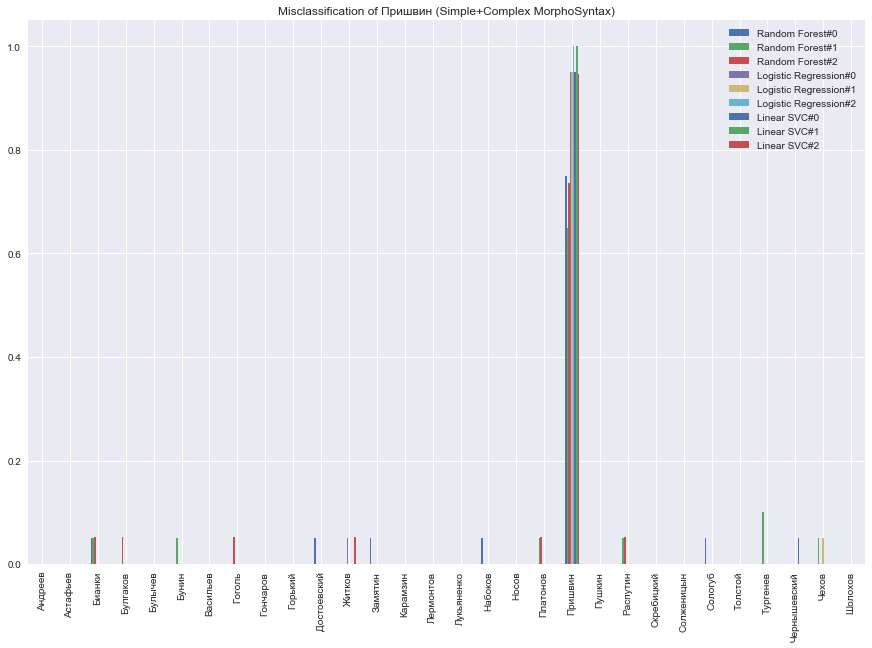

<Figure size 432x288 with 0 Axes>

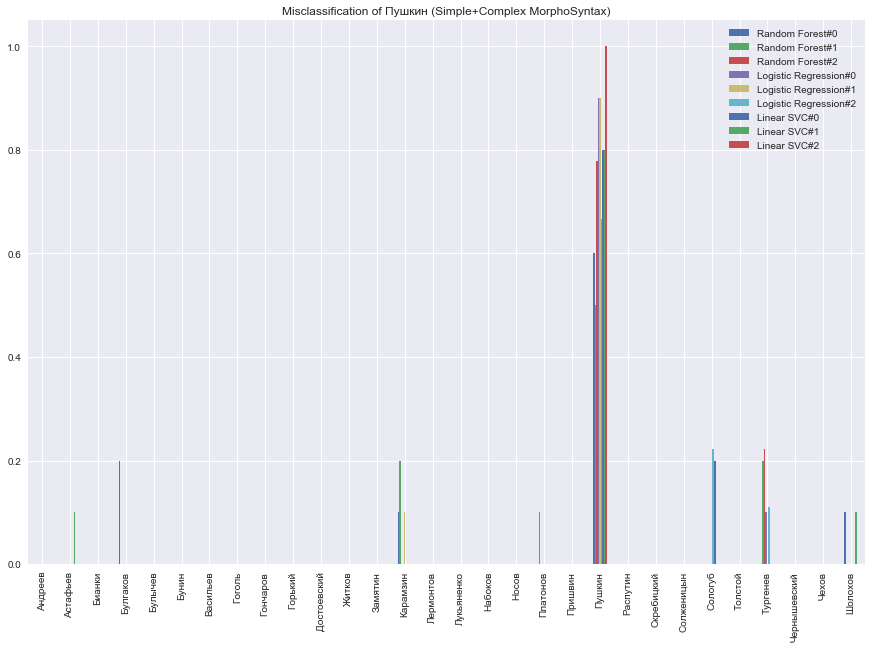

<Figure size 432x288 with 0 Axes>

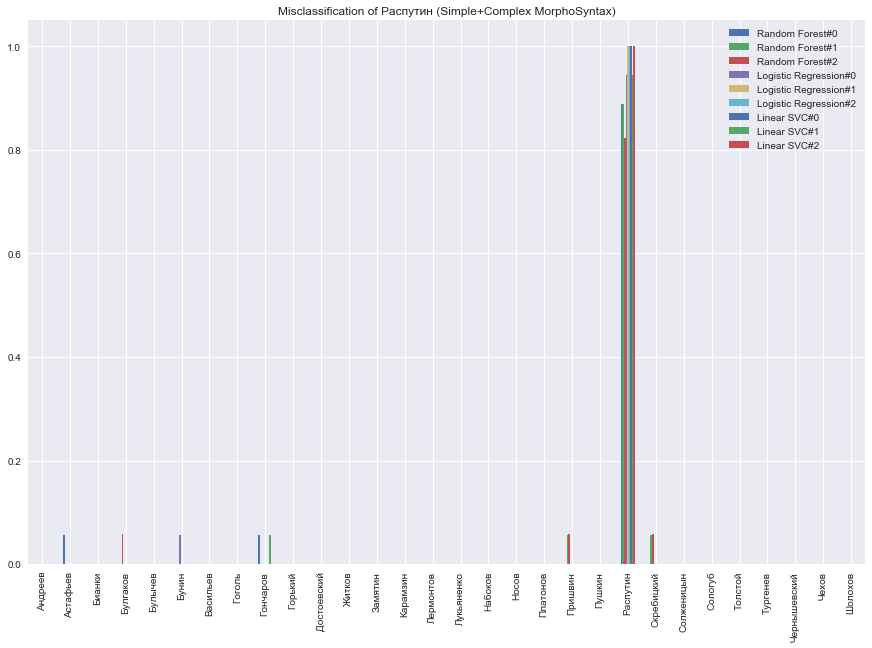

<Figure size 432x288 with 0 Axes>

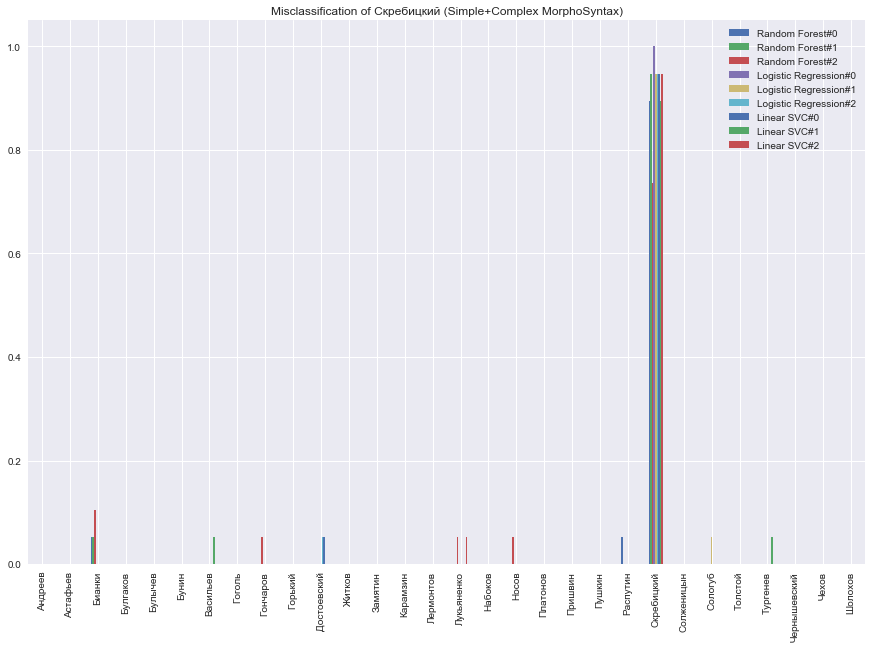

<Figure size 432x288 with 0 Axes>

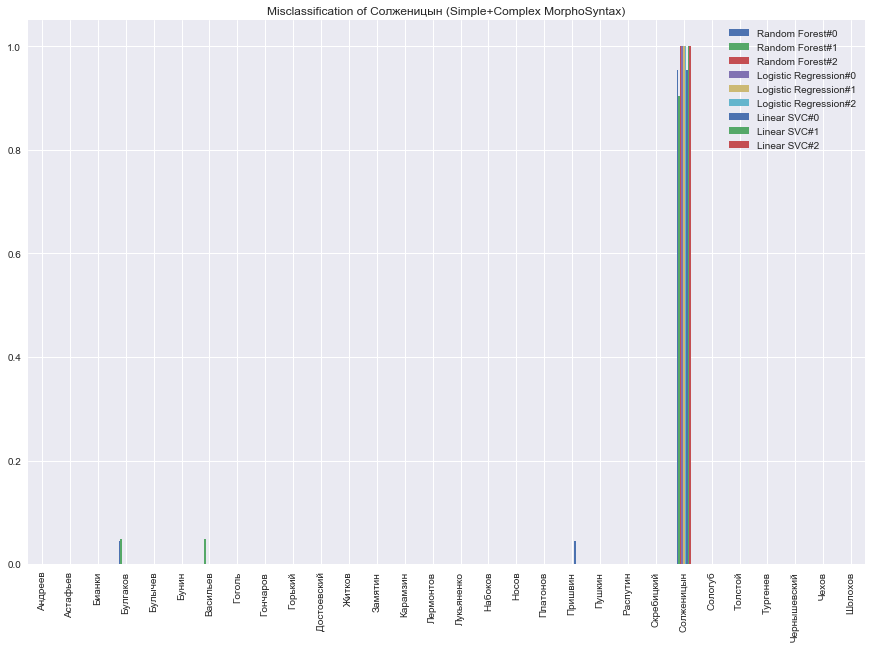

<Figure size 432x288 with 0 Axes>

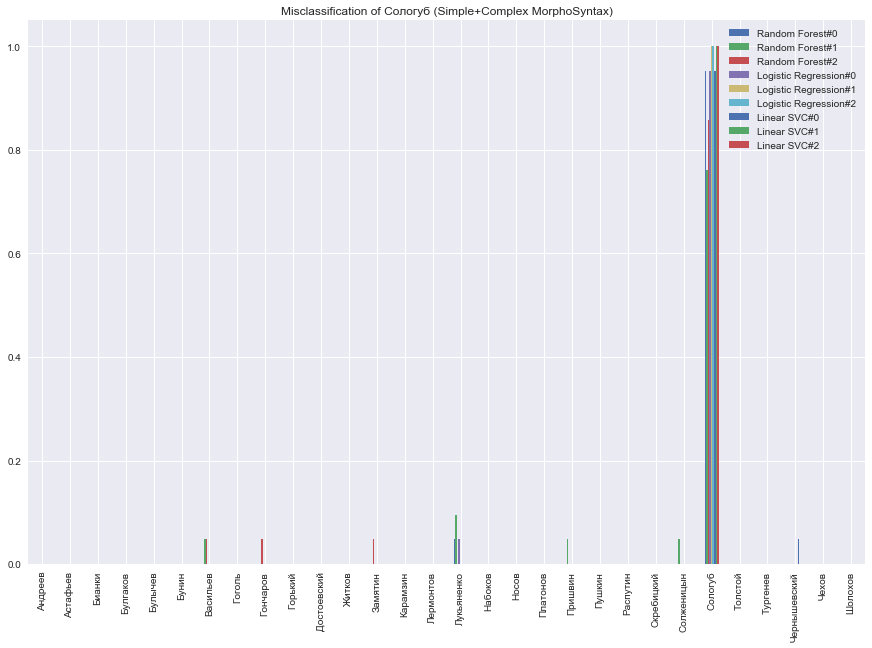

<Figure size 432x288 with 0 Axes>

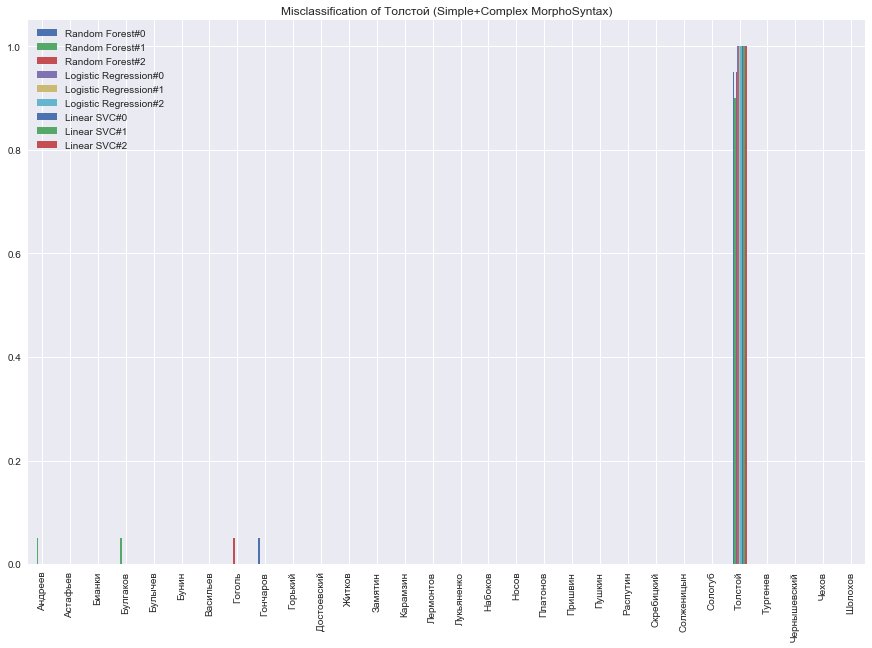

<Figure size 432x288 with 0 Axes>

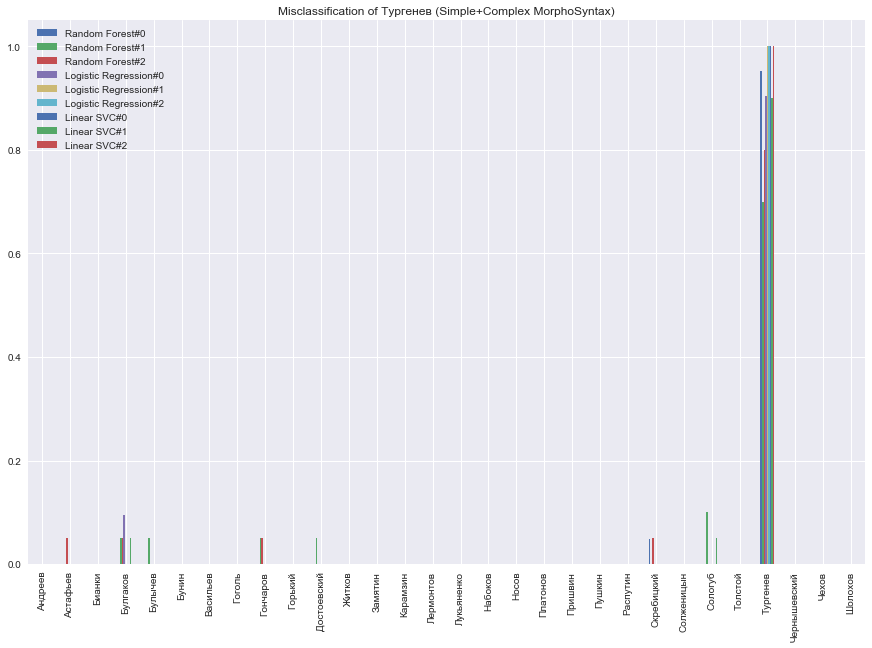

<Figure size 432x288 with 0 Axes>

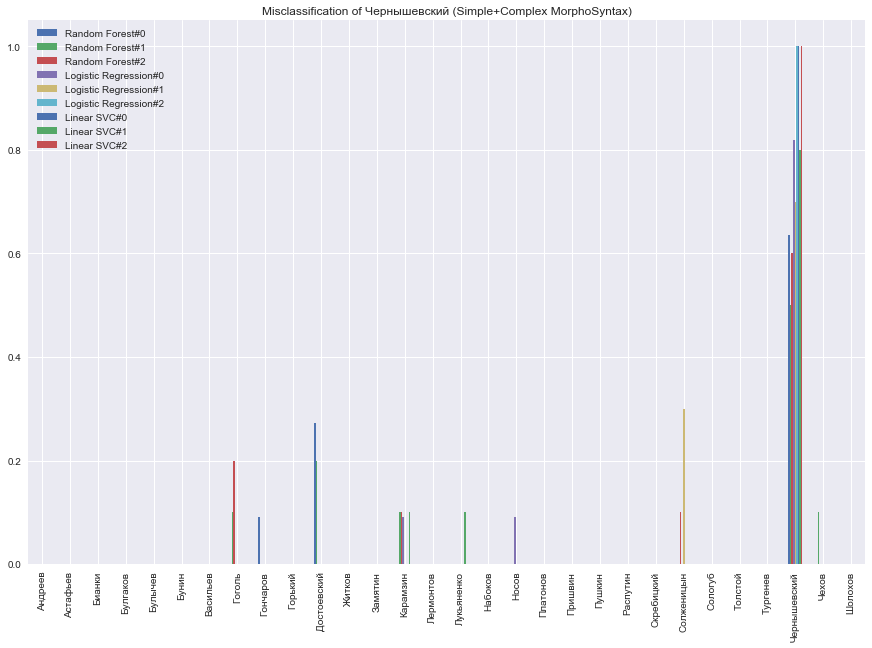

<Figure size 432x288 with 0 Axes>

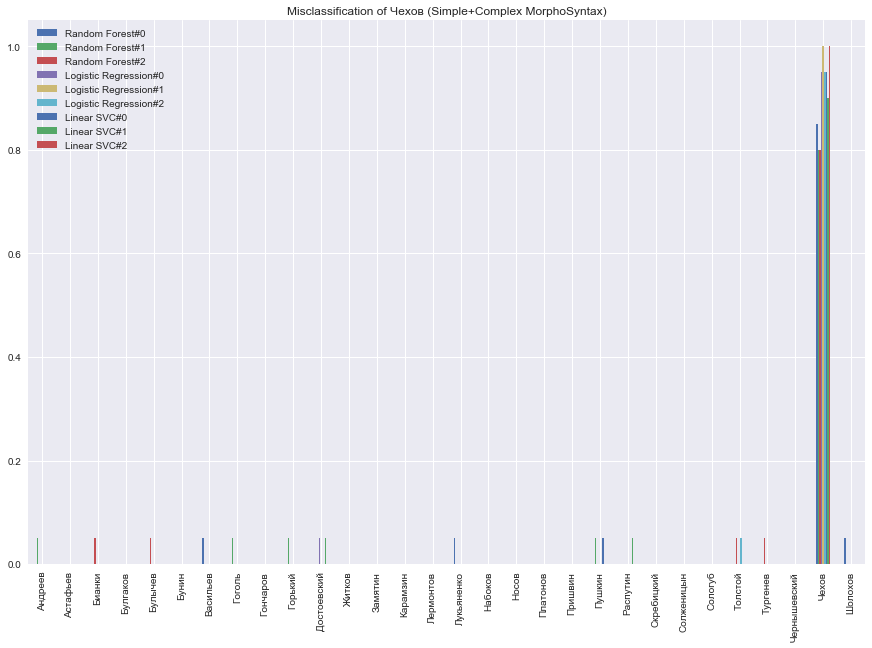

<Figure size 432x288 with 0 Axes>

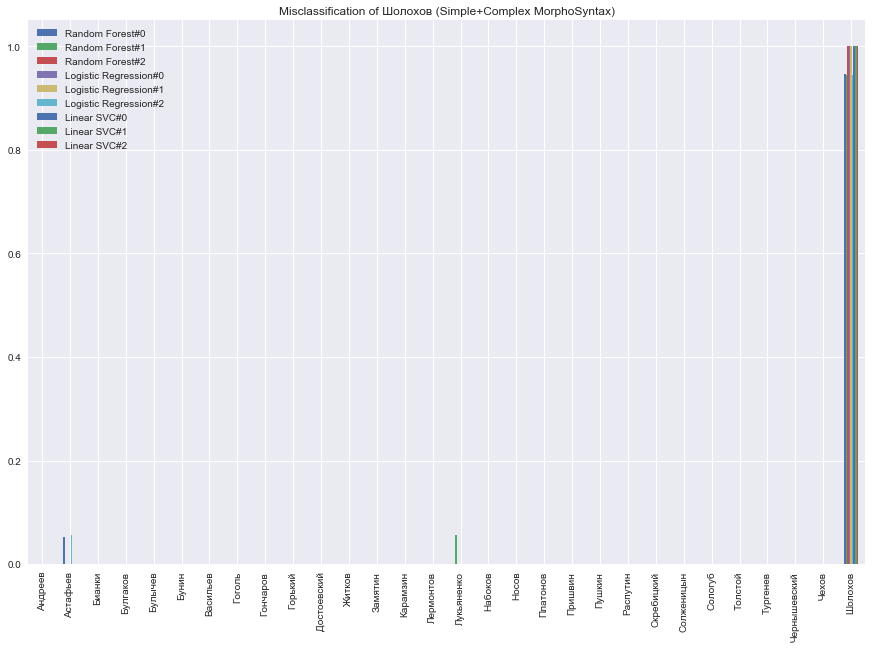

In [517]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [518]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [519]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

# Overall statistics

In ```statStructure``` we collect huge statistics, so now we build some figures for illustration of a process.

In [520]:
statStructure

defaultdict(dict,
            {'Simple Morphology': {'Hopkins': 0.8633797229860601,
              'ARS': 0.21942268908758722,
              'AMI': 0.3989127428438392,
              'Random Forest': {'Accuracy': 0.7018525530263191,
               'Precision': 0.7086654474011214,
               'Recall': 0.7018525530263191,
               'f1': 0.6921590438373871},
              'Logistic Regression': {'Accuracy': 0.7860585401600312,
               'Precision': 0.7919828125629196,
               'Recall': 0.7860585401600312,
               'f1': 0.774952149097541},
              'Linear SVC': {'Accuracy': 0.7907630702479285,
               'Precision': 0.7955411546852239,
               'Recall': 0.7907630702479285,
               'f1': 0.7847614356547045}},
             'Complex Morphology': {'Hopkins': 0.8203129690108217,
              'ARS': 0.12547472071982196,
              'AMI': 0.3121247626931725,
              'Random Forest': {'Accuracy': 0.5724144679179731,
               'Pre

In [208]:
import pickle
pickle.dump(statStructure, open('statstructure0104.pkl', 'wb'))

In [209]:
statStructure = pickle.load(open('statstructure.pkl', 'rb'))

In [521]:
Index = ['Simple Morphology', 'Complex Morphology', 'Simple Syntax', 'Complex Syntax',
         'Bigram Treelets', 
         'Trigram Treelets', 
         'Simple Morphology+Syntax',  'Complex Morphology+Syntax', 'Simple+Complex Morphology+Syntax'
        ]

colData = defaultdict(list)
algorithmsList = set()

metricsTypes = ['Accuracy', 'Precision', 'Recall', 'f1']
metricsDict = defaultdict(lambda : defaultdict(dict))


In [522]:
algorithmsList = set()
for method in Index:
    for characteristic in statStructure[method]:
        #if characteristic == 'Hopkins':
        #    continue
        if not isinstance(statStructure[method][characteristic], dict):
            colData[characteristic].append(statStructure[method][characteristic])
        else:
            algorithmName = characteristic
            algorithmsList.add(algorithmName)
            
            for metric in statStructure[method][algorithmName]:
                metricsDict[method][metric][algorithmName] = statStructure[method][algorithmName][metric]

In [523]:
algorithmsList = sorted(algorithmsList)
algorithmsList

['Linear SVC', 'Logistic Regression', 'Random Forest']

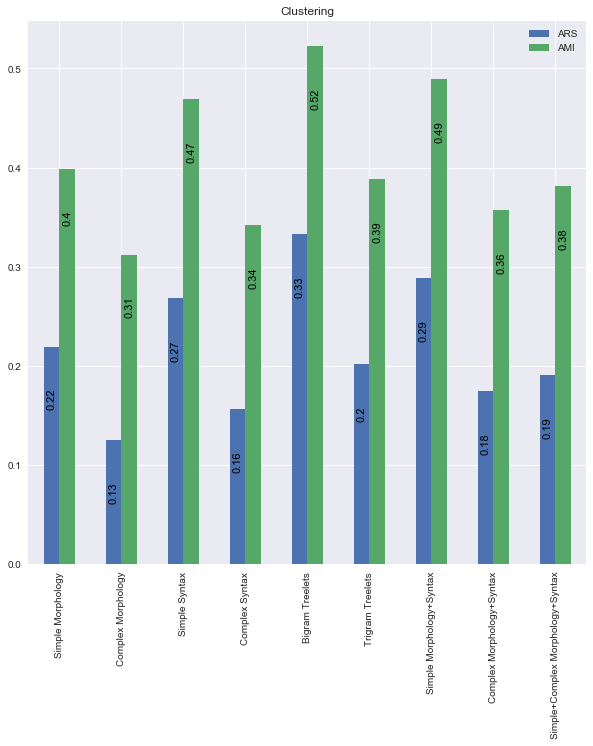

<Figure size 432x288 with 0 Axes>

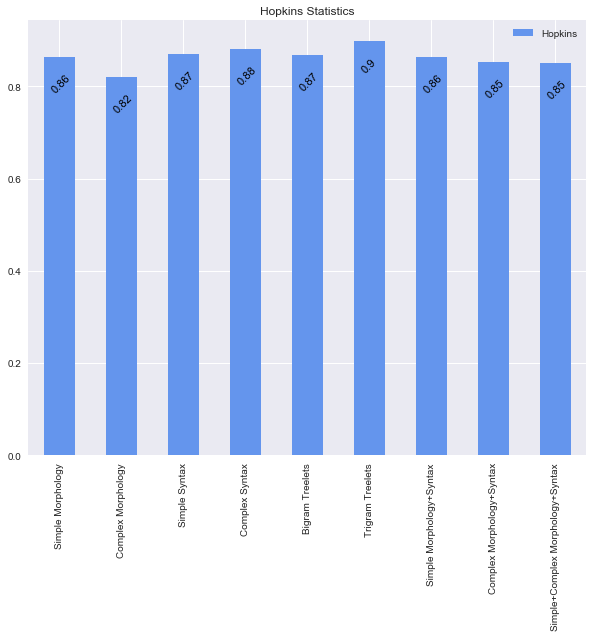

<Figure size 432x288 with 0 Axes>

In [524]:
               
resStat = pd.DataFrame(colData, index = Index)
#algorithmsList = sorted(algorithmsList)
ax = resStat[['ARS', 'AMI']].plot.bar(rot=90, figsize=(10,10))
ax.set_alpha(0.8)
ax.set_title('Clustering')
#ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
for i in ax.patches:
    # get_x pulls left or right; get_height pushes up or down
    ax.text(i.get_x()+0.05, i.get_height() - 0.05, \
            str(round((i.get_height()), 2)), fontsize=11, color='black',
            rotation=90)
plt.savefig(os.path.join(directory, 'Clustering_Result',  'Clustering_General_Metrics(1).png'), bbox_inches="tight")
plt.show()
plt.clf()

ax = resStat[['Hopkins']].plot.bar(rot=90, color='cornflowerblue', figsize=(10,8))
ax.set_alpha(0.8)
ax.set_title('Hopkins Statistics')
#ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
for i in ax.patches:
    # get_x pulls left or right; get_height pushes up or down
    ax.text(i.get_x()+0.1, i.get_height() - 0.05, \
            str(round((i.get_height()), 2)), fontsize=11, color='black',
            rotation=45)
plt.savefig(os.path.join(directory, 'Clustering_Result',  'Clustering_General_Structure(1).png'), bbox_inches="tight")
plt.show()
plt.clf()


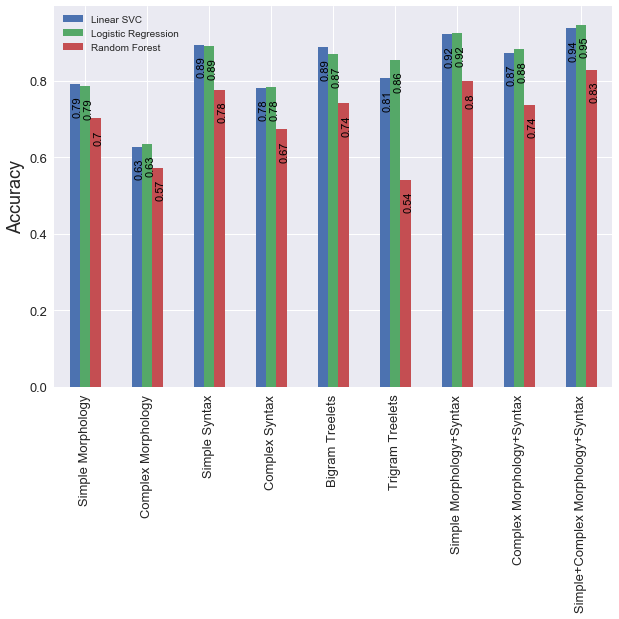

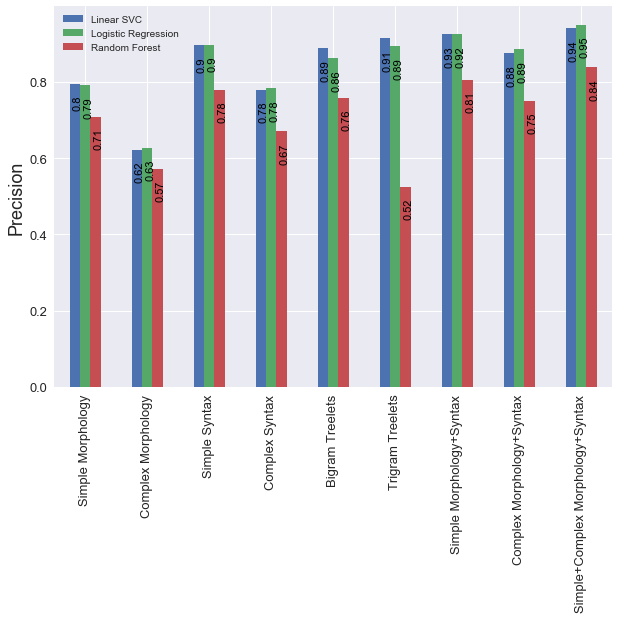

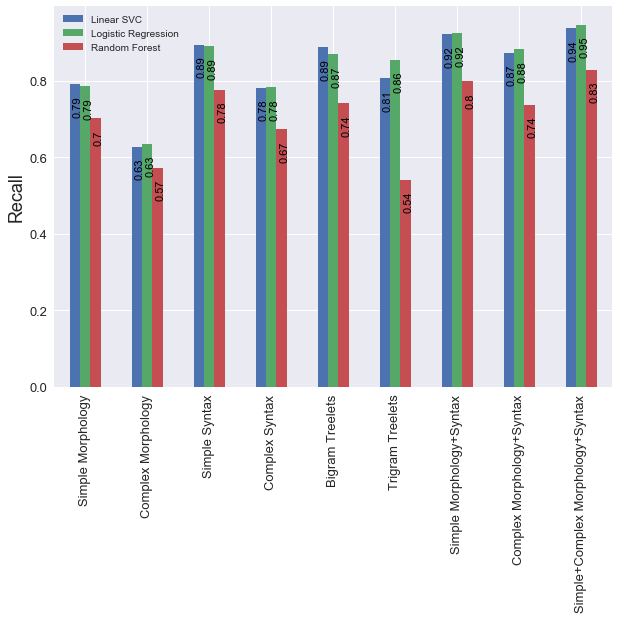

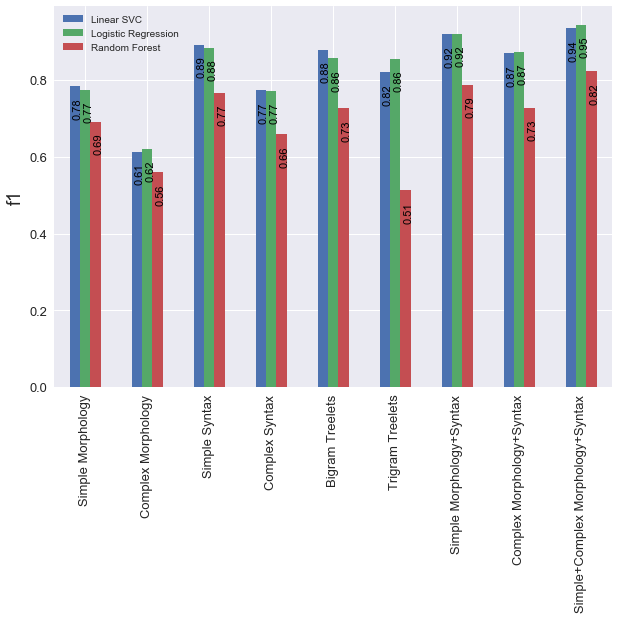

In [525]:
specificMetrics = {} # Будем строить график для каждой отдельной метрики
Index = list(metricsDict.keys())

for metric in metricsTypes:
    currentDict4DF = defaultdict(list)
    for algorithmName in algorithmsList:
        for task in Index:
            currentDict4DF[algorithmName].append(metricsDict[task][metric][algorithmName])
    specificMetrics[metric] = pd.DataFrame(currentDict4DF, index=Index)
    #specificMetrics[metric].plot.bar(rot=90, title = metric)
    ax = specificMetrics[metric].plot(kind='bar', figsize=(10,7),
                                        #color="coral",
                                      fontsize=13);
    ax.set_alpha(0.8)
    ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
    for i in ax.patches:
        # get_x pulls left or right; get_height pushes up or down
        ax.text(i.get_x()+.05, i.get_height() - 0.05, \
                str(round((i.get_height()), 2)), fontsize=11, color='black',
                    rotation=90)
    plt.savefig(os.path.join(directory,'Classification_Result', '{}_General (1).png'.format(metric)), bbox_inches="tight")
# По оси x будет категориальная переменная с типом задачи



# Doc2Vec Experiments

In [526]:
currentPart = 'Doc2Vec'
doc2vec_DF = pd.read_csv('doc2vec/doc2vec_data_size_150_window_5.csv', header=None)
display(doc2vec_DF.head())
classes_DF = pd.read_csv('classes_data.csv', sep=';')
display(classes_DF.head())

X = doc2vec_DF.values
classes_vec = classes_DF.Author.values
print('Shape of main doc2vec matrix: {}'.format(X.shape))
print('Count of classes: {}, unique classes: {}'.format(len(classes_vec), len(set(classes_vec))))

le = LabelEncoder()
Y = le.fit_transform(classes_vec)

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
0,1.970478,4.425774,-0.623387,0.417681,0.224241,0.675430,-0.796898,-0.103277,-0.995389,-2.400639,...,1.211050,-0.847074,-2.464999,0.030262,0.752300,0.820496,0.889081,1.910282,0.503641,1.169375
1,-1.312903,1.615037,-0.194682,1.727578,-0.750125,1.482113,-0.638617,-0.774602,-0.358341,-1.762422,...,0.039161,0.075397,0.417619,-1.575416,-2.211654,-1.539515,-1.101187,0.228359,2.275114,0.867483
2,1.267353,-0.814186,0.344395,0.443103,0.256955,0.064735,0.755107,-1.248271,-0.928960,1.536016,...,-1.395799,-0.489152,0.940437,-1.816560,3.108378,-0.768003,-1.295633,1.041449,4.258466,1.780340
3,0.383711,1.448769,0.589203,-0.480347,-0.830928,-2.561944,-0.018685,0.060901,2.422919,-1.105805,...,-0.417758,1.343833,-2.069847,2.050269,-1.224786,-0.406865,0.847084,-0.044716,1.114425,1.601983
4,0.318710,1.917016,1.354131,-0.114377,0.938417,0.034917,2.507203,0.477359,0.573701,-0.587098,...,-0.772890,1.305246,-1.640238,-0.996402,-0.224539,-0.542972,0.352433,1.014481,2.593861,-0.947300


,Author,Novel
0,Андреев,Ангелочек
1,Андреев,Баргамот и Гараська
2,Андреев,Бездна
3,Андреев,Большой шлем
4,Андреев,В подвале


Shape of main doc2vec matrix: (1506, 150)
Count of classes: 1506, unique classes: 30


### Clustering structure in doc2vec

In [389]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.7536919538115976
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.5849166855464746
	AMI: 0.7480277034071815


Current model: Random Forest
Accuracy  	mean: 0.80140
Precision 	mean: 0.80477
Recall    	mean: 0.80140
f1        	mean: 0.78772
Current model: Logistic Regression
Accuracy  	mean: 0.96816
Precision 	mean: 0.97042
Recall    	mean: 0.96816
f1        	mean: 0.96750
Current model: Linear SVC
Accuracy  	mean: 0.97340
Precision 	mean: 0.97444
Recall    	mean: 0.97340
f1        	mean: 0.97303


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

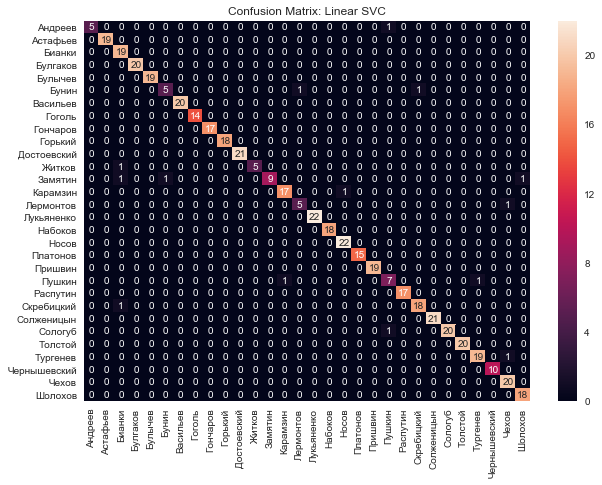

In [527]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = False,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

<Figure size 432x288 with 0 Axes>

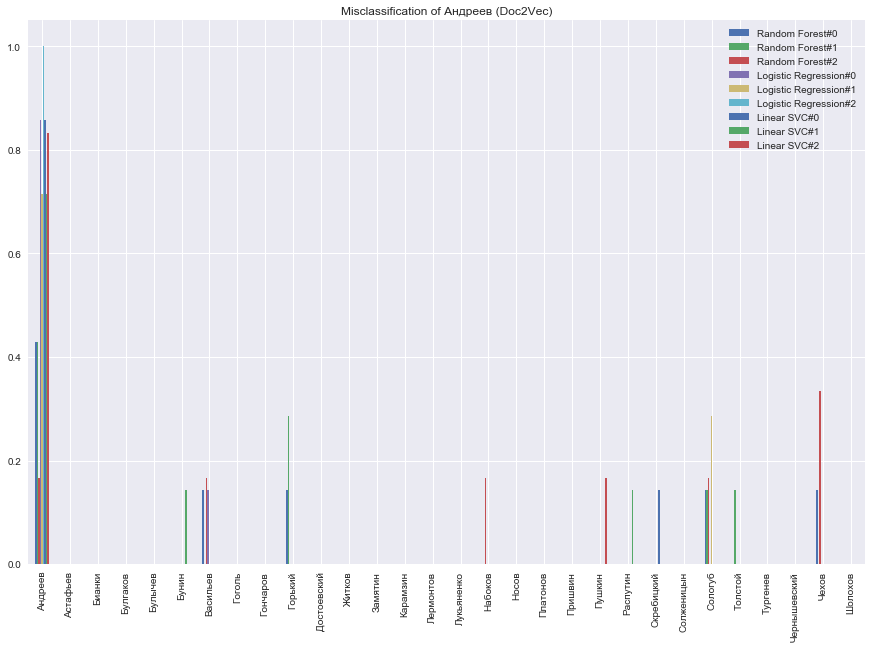

<Figure size 432x288 with 0 Axes>

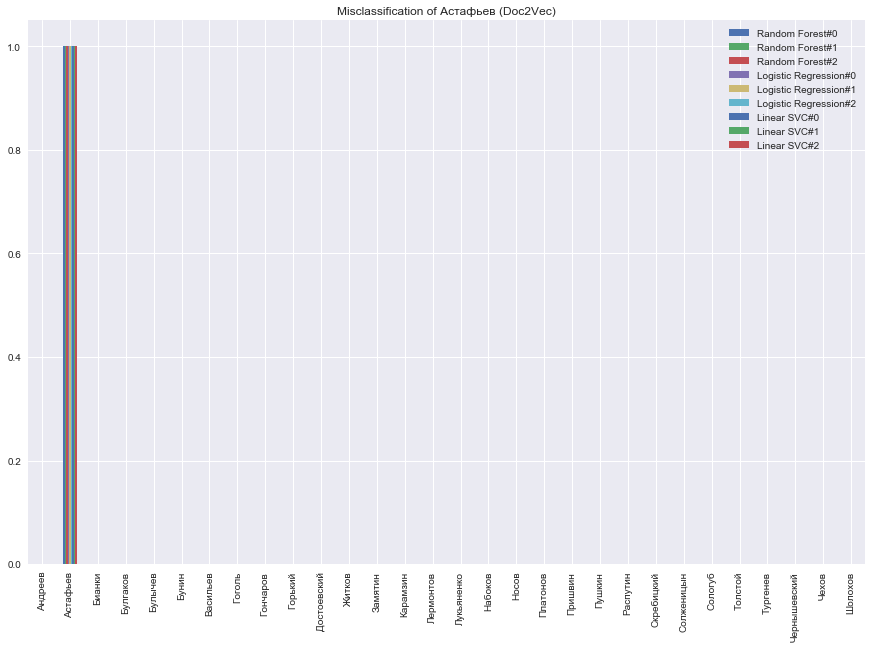

<Figure size 432x288 with 0 Axes>

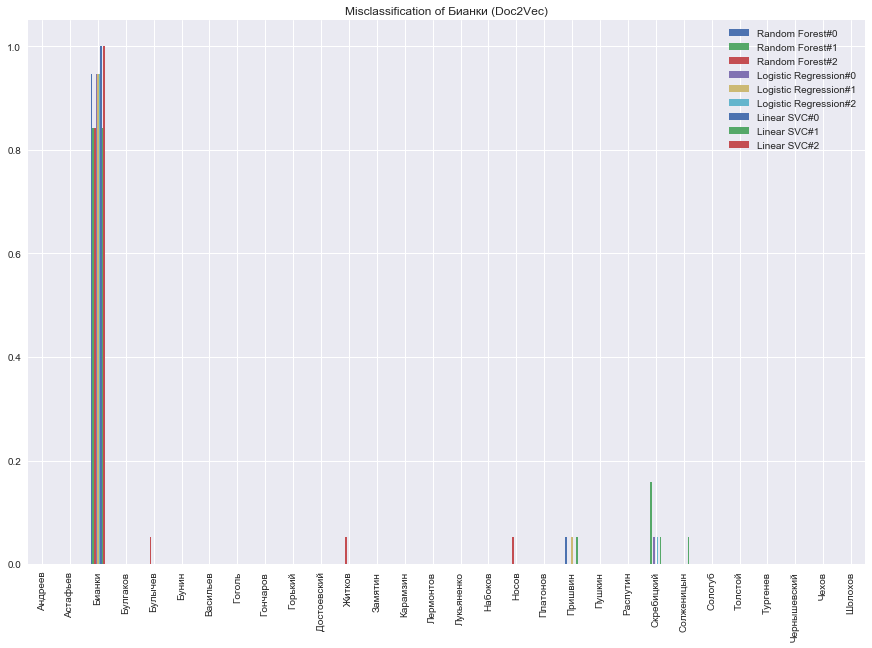

<Figure size 432x288 with 0 Axes>

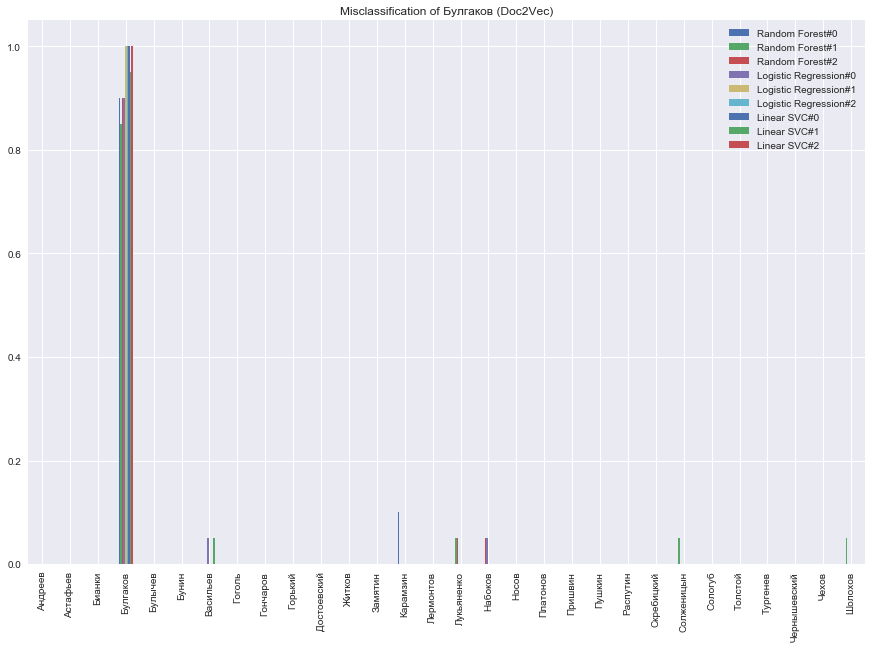

<Figure size 432x288 with 0 Axes>

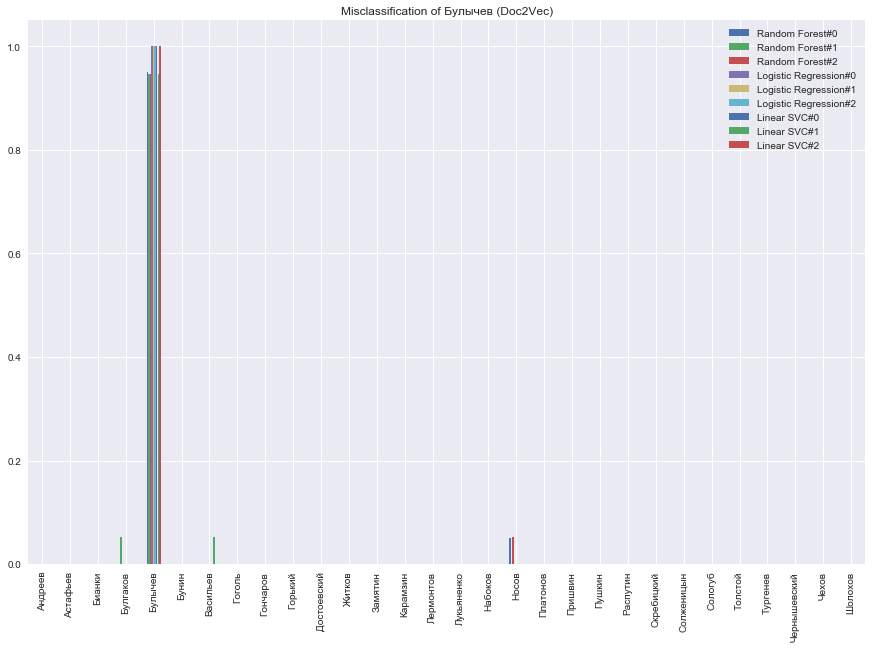

<Figure size 432x288 with 0 Axes>

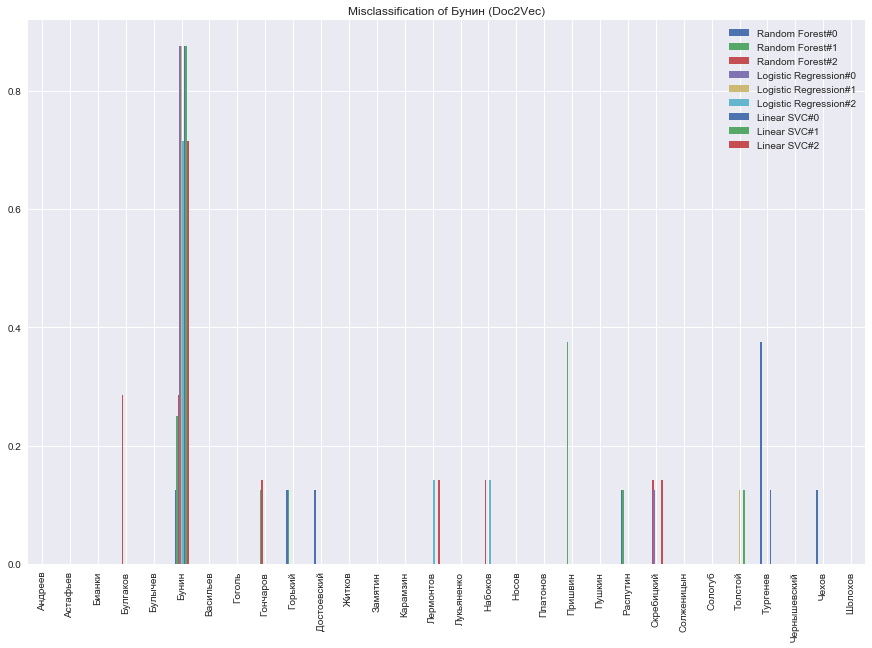

<Figure size 432x288 with 0 Axes>

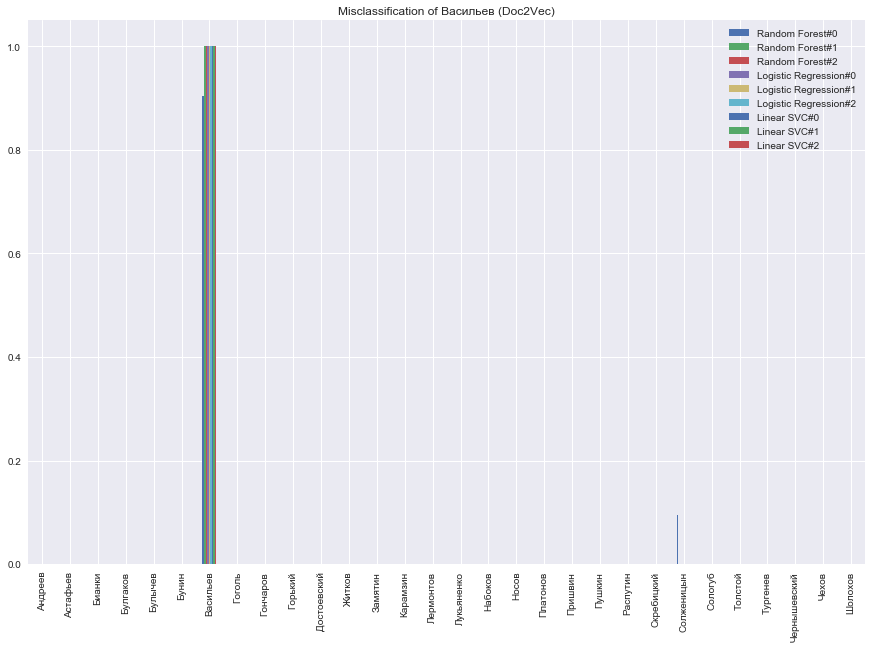

<Figure size 432x288 with 0 Axes>

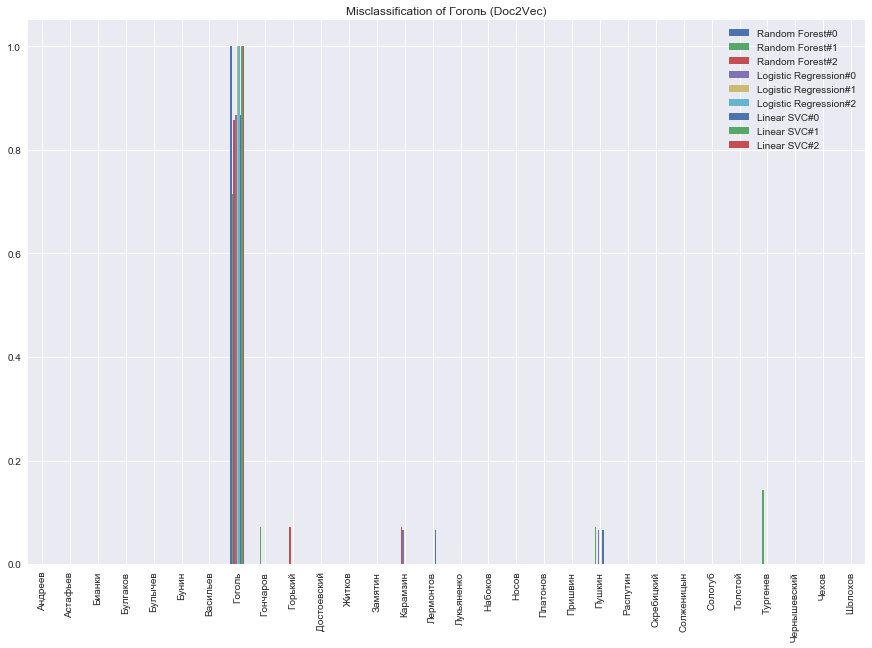

<Figure size 432x288 with 0 Axes>

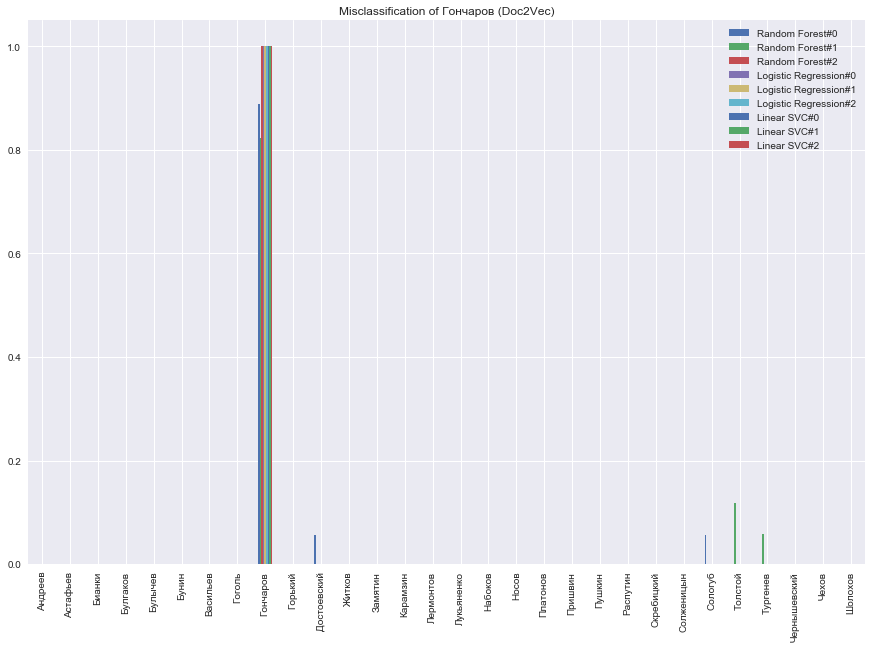

<Figure size 432x288 with 0 Axes>

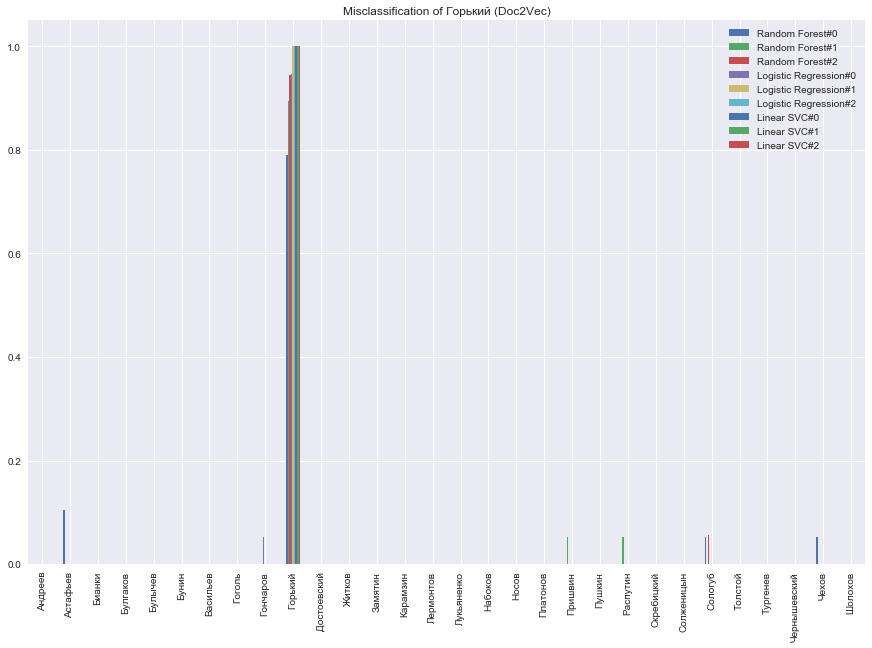

<Figure size 432x288 with 0 Axes>

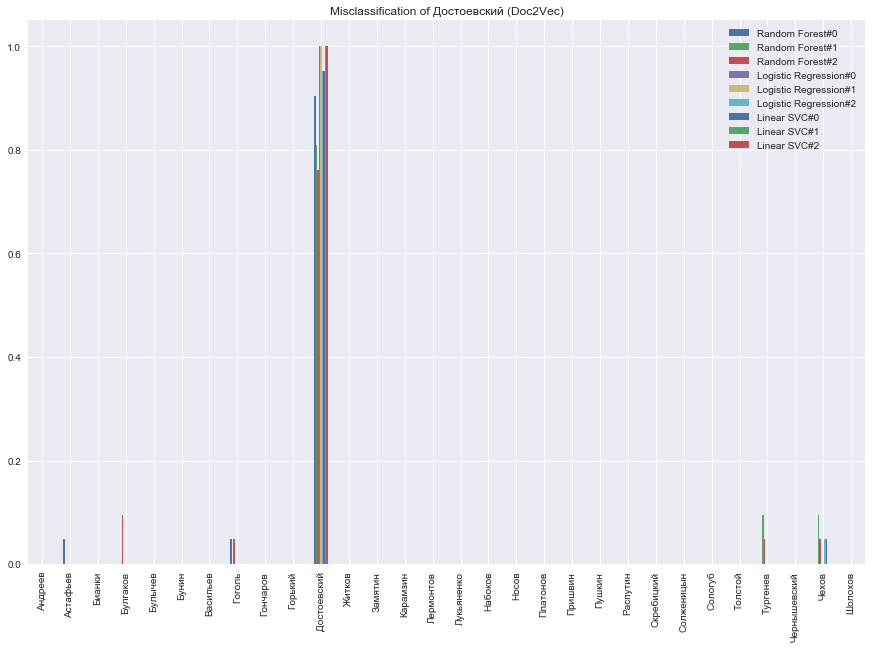

<Figure size 432x288 with 0 Axes>

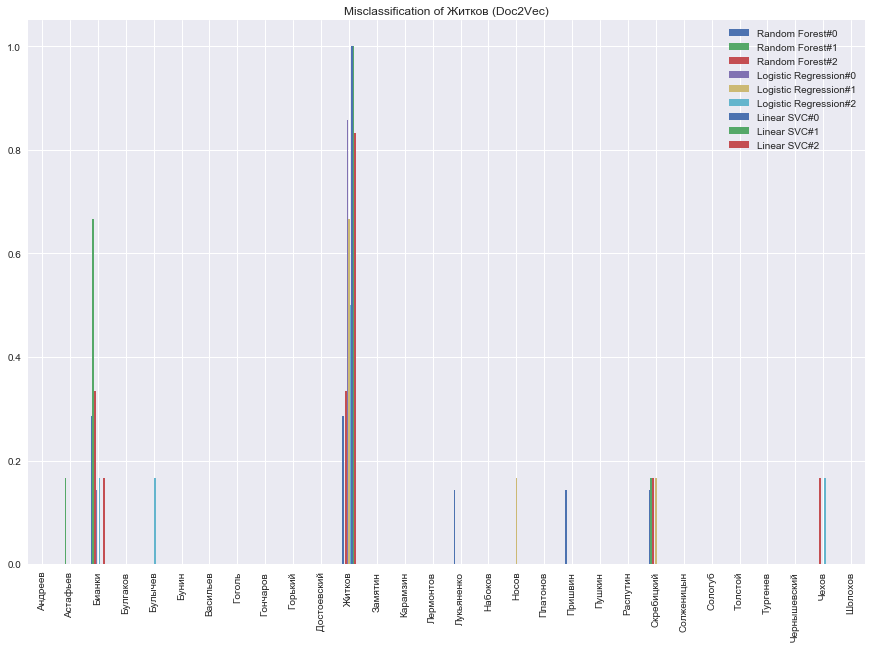

<Figure size 432x288 with 0 Axes>

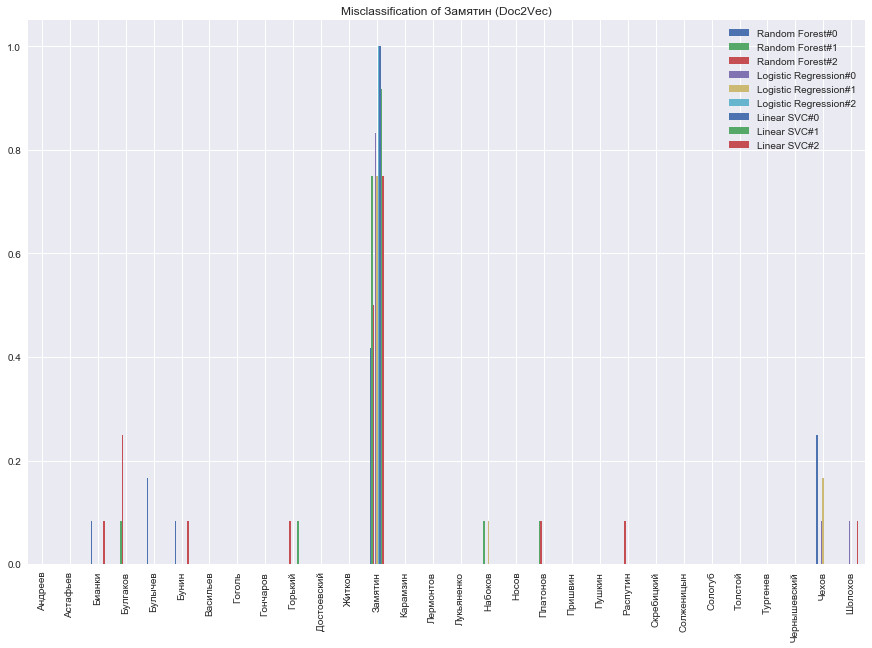

<Figure size 432x288 with 0 Axes>

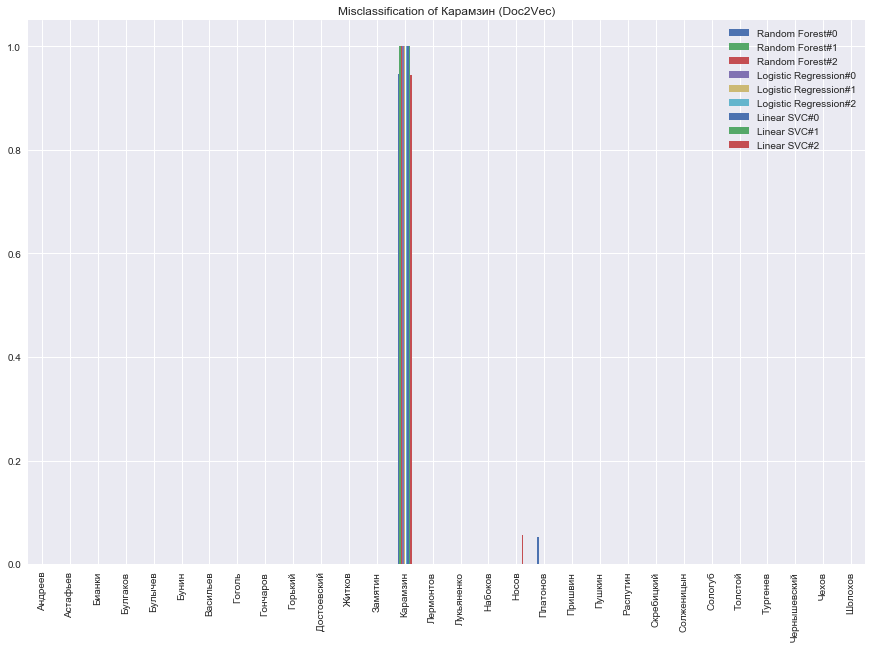

<Figure size 432x288 with 0 Axes>

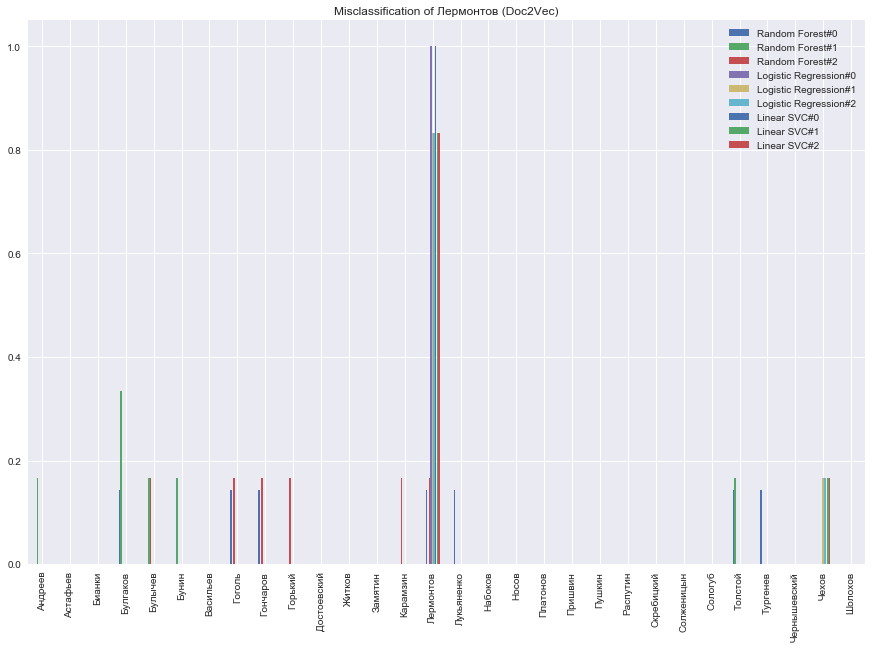

<Figure size 432x288 with 0 Axes>

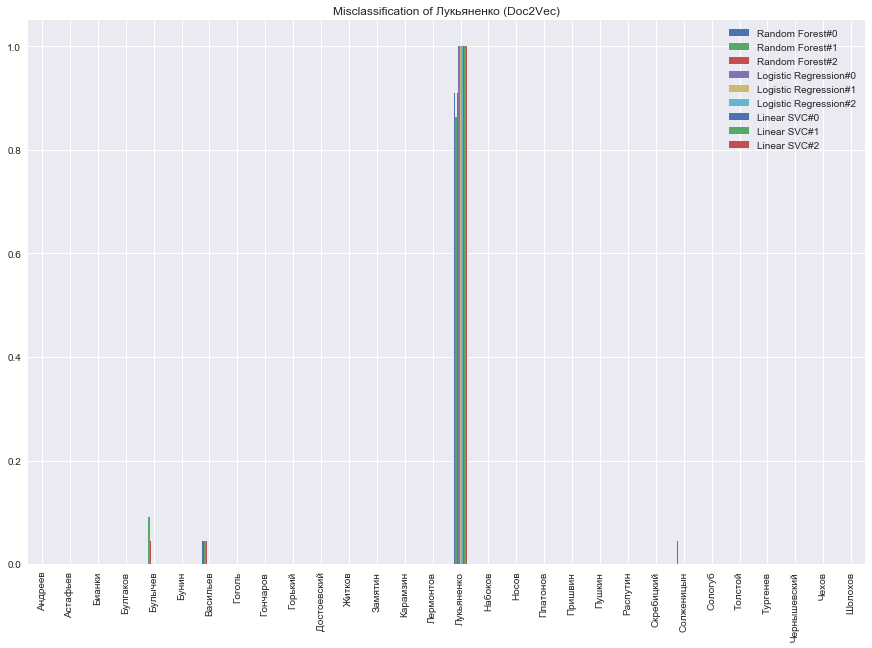

<Figure size 432x288 with 0 Axes>

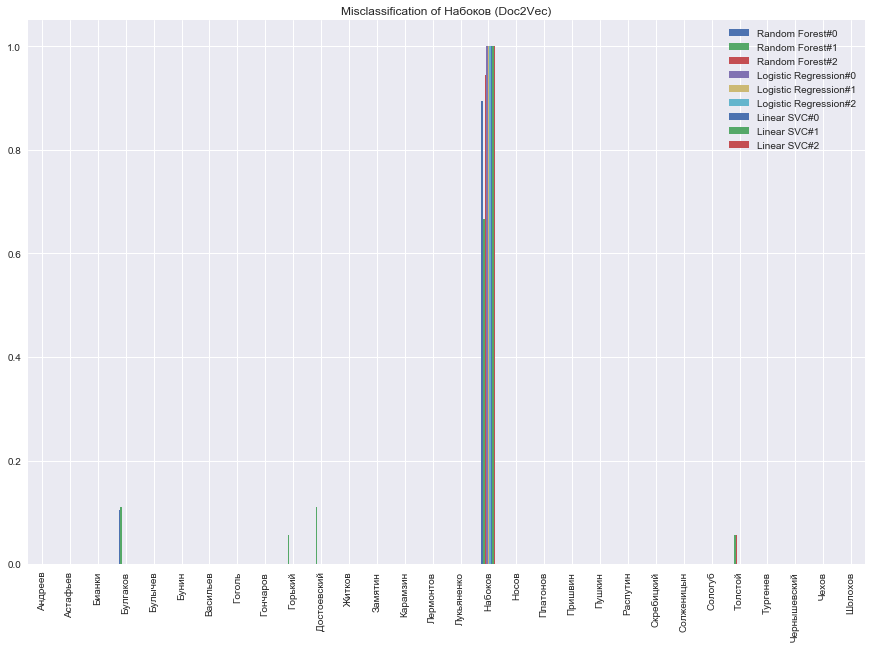

<Figure size 432x288 with 0 Axes>

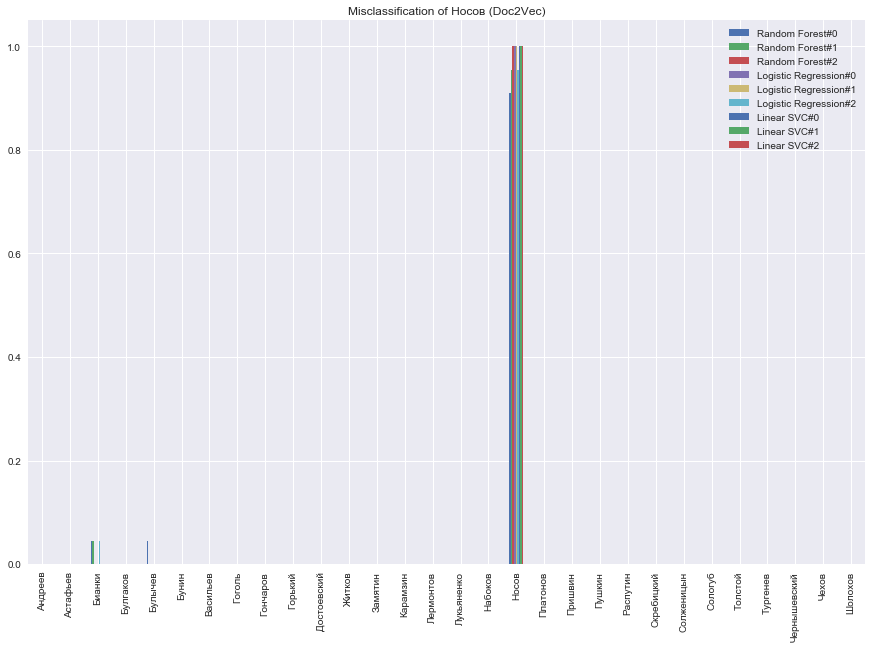

<Figure size 432x288 with 0 Axes>

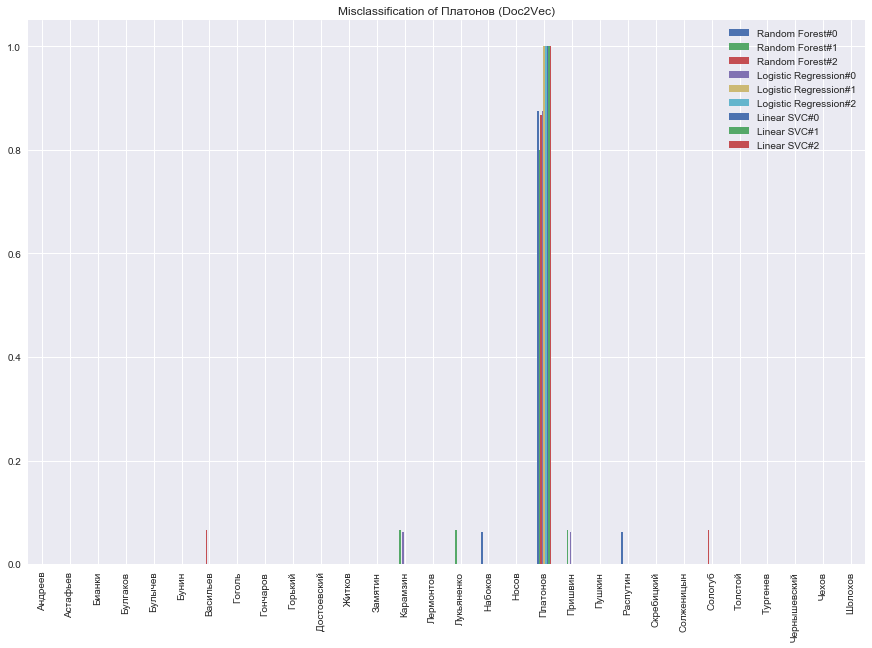

<Figure size 432x288 with 0 Axes>

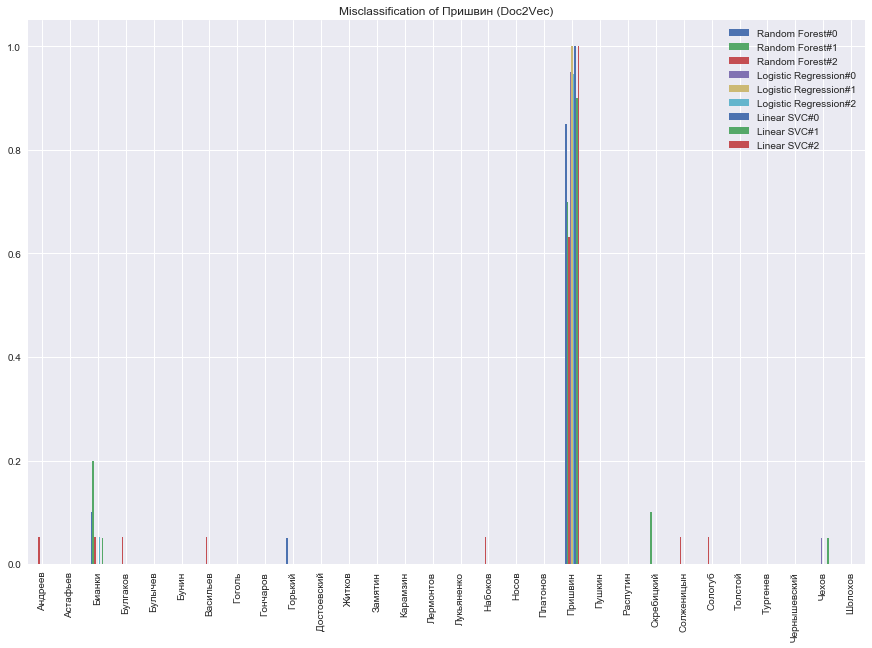

<Figure size 432x288 with 0 Axes>

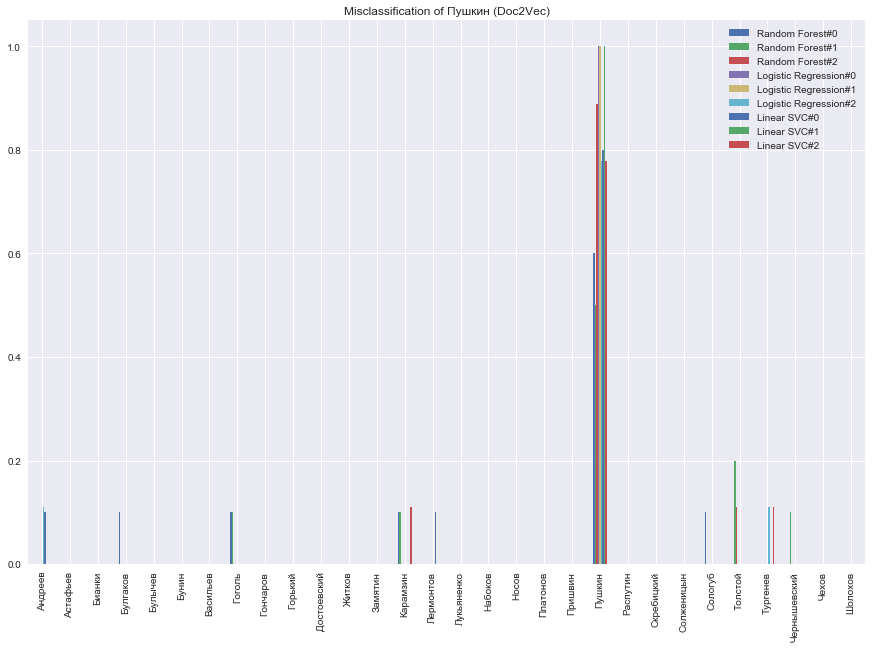

<Figure size 432x288 with 0 Axes>

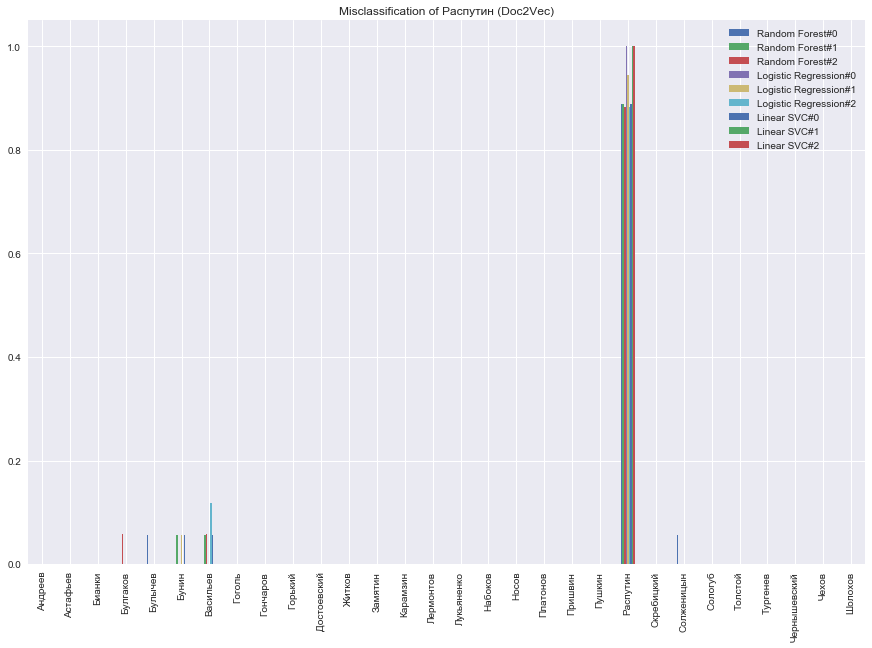

<Figure size 432x288 with 0 Axes>

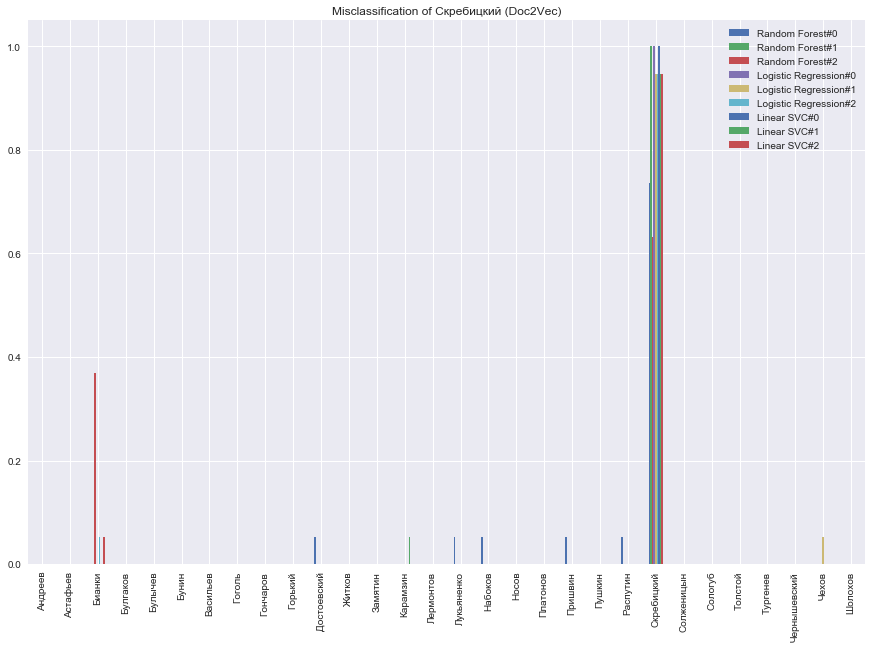

<Figure size 432x288 with 0 Axes>

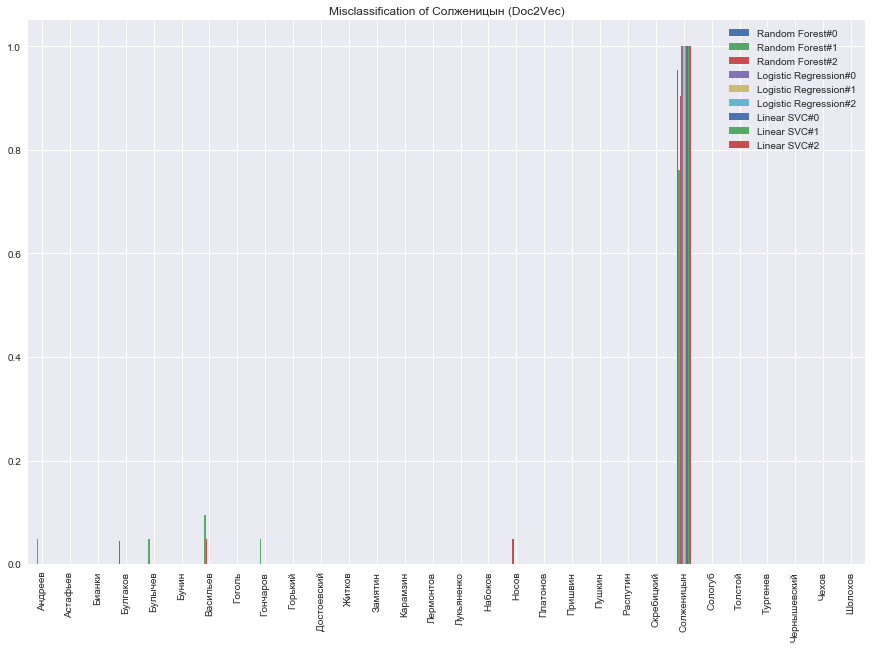

<Figure size 432x288 with 0 Axes>

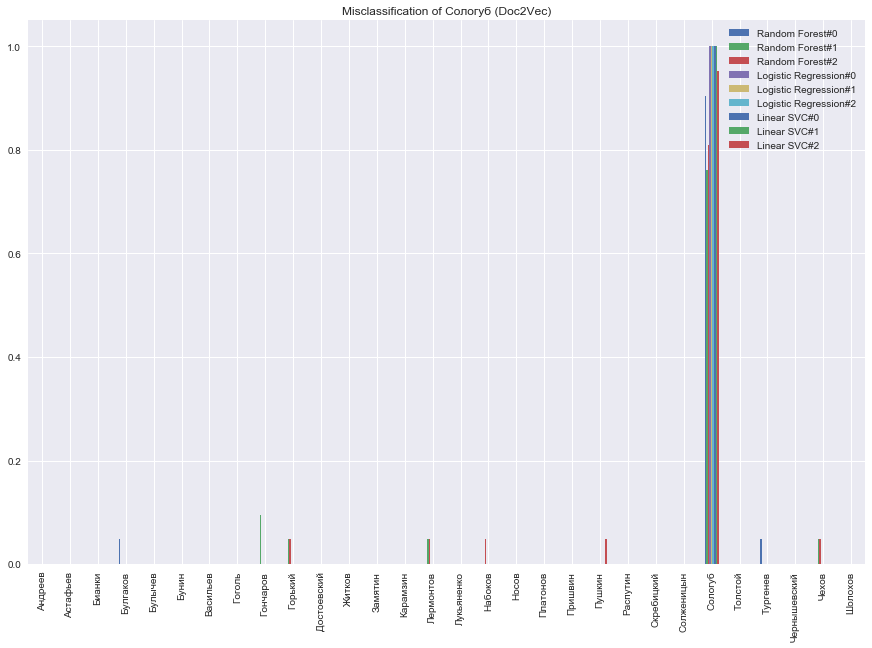

<Figure size 432x288 with 0 Axes>

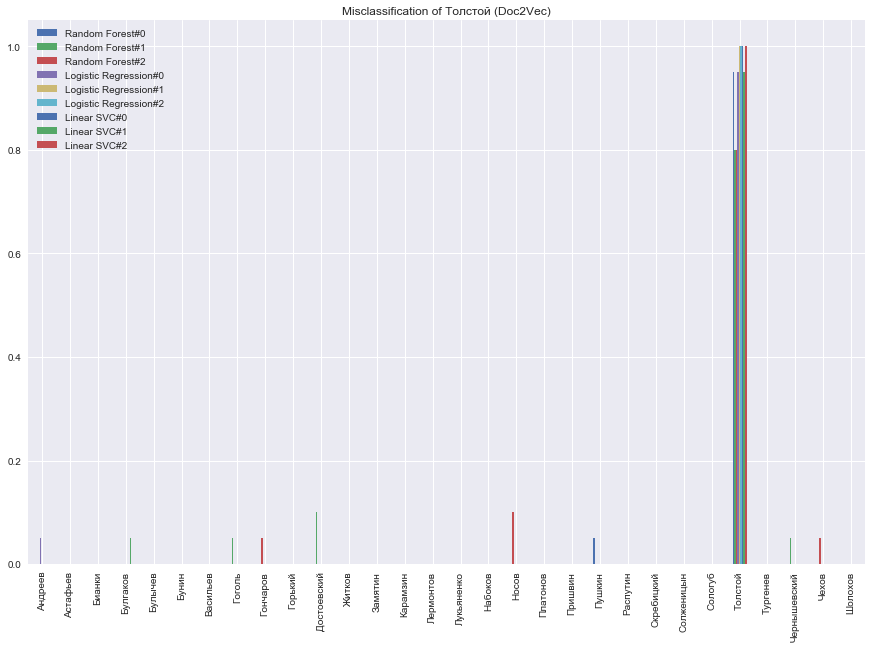

<Figure size 432x288 with 0 Axes>

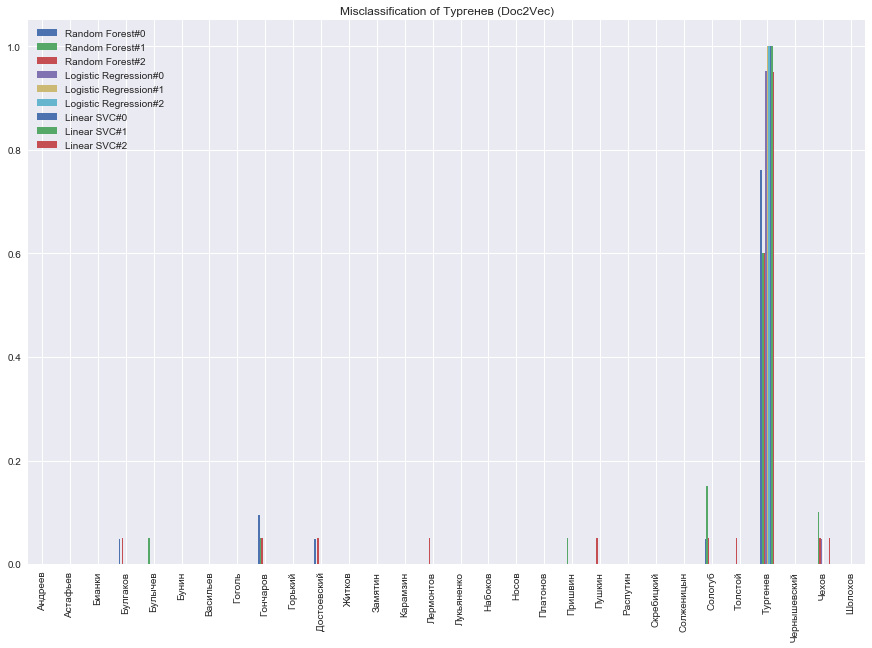

<Figure size 432x288 with 0 Axes>

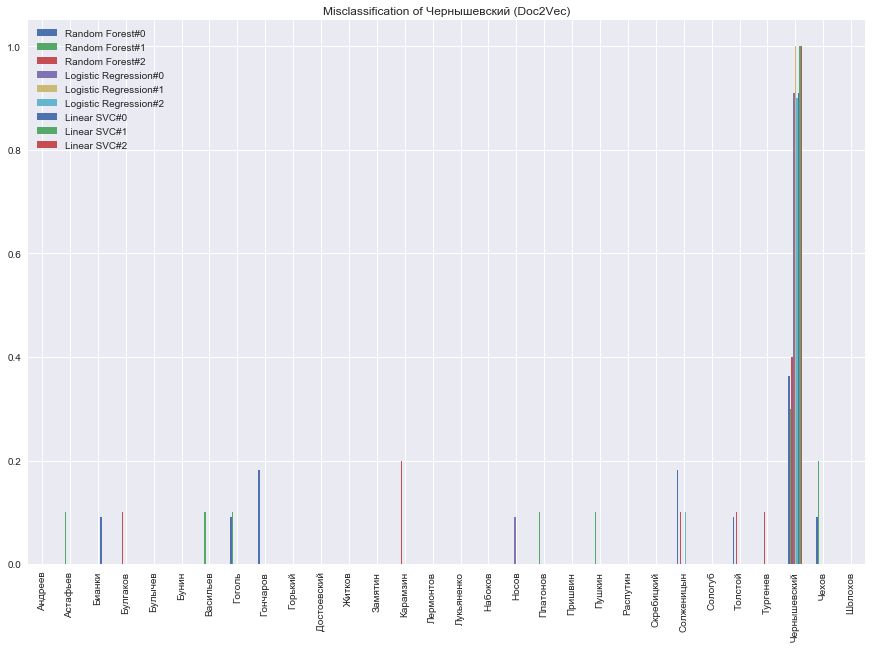

<Figure size 432x288 with 0 Axes>

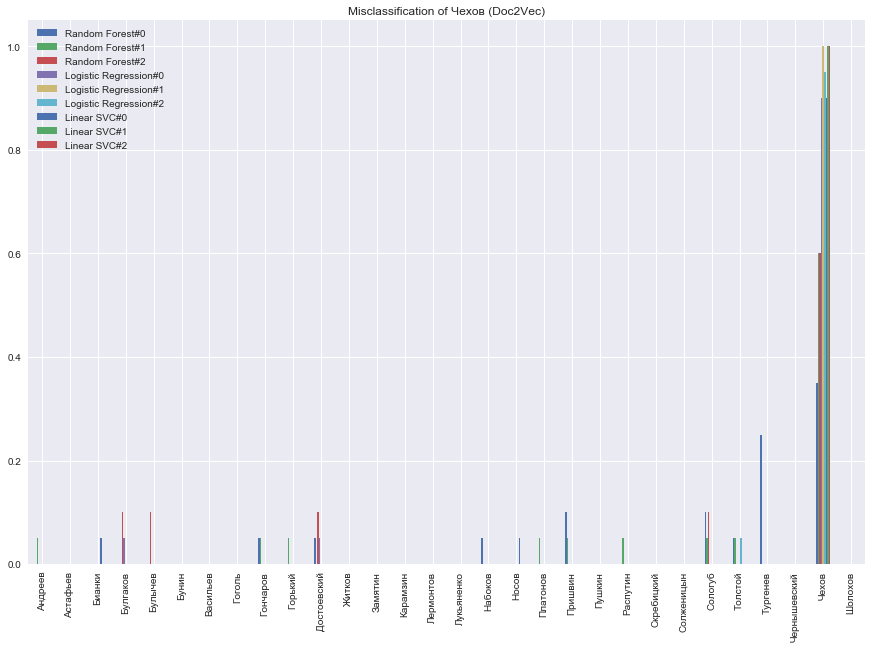

<Figure size 432x288 with 0 Axes>

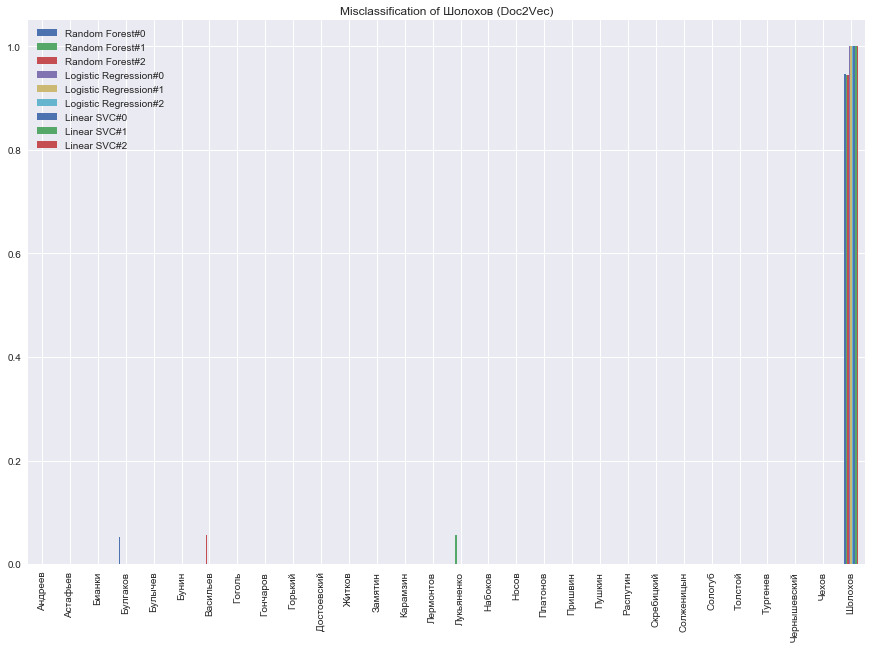

In [528]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [529]:
res_table = []
columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in errorsDictionary:
    t = errorsDictionary[author_name]
    full_not_null = ' '.join([x for x in t[t.all(axis=1)].index.values if x != author_name])
    never_errors = ' '.join([x for x in t[t.sum(axis=1) == 0].index.values if x != author_name])
    many_errors = ' '.join(t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values)
    
    author_detection = ' '.join([x for x in t[t.all(axis=1)].index.values if x == author_name])
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : author_detection,
        'Всегда ошибка' : full_not_null,
        'Всегда без ошибок' : never_errors,
        'Много ошибок' : many_errors
    })
    
df = pd.DataFrame(res_table, columns=columns)
df.to_csv(os.path.join(directory, currentPart, 'error_analysis', 'errors.csv'.format(author_name)),index=False, encoding='ansi')
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter(os.path.join(directory, currentPart, 'error_analysis', 'errors.xlsx'.format(author_name)), 
                        engine='xlsxwriter')
# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(writer, sheet_name='Sheet1', index=False, columns = columns)
sheetname = 'Sheet1'
worksheet = writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

    # Close the Pandas Excel writer and output the Excel file.
writer.save()

In [530]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

In [531]:
Index = ['Simple Morphology', 'Complex Morphology', 'Simple Syntax', 'Complex Syntax',
         'Bigram Treelets', 
         'Trigram Treelets', 
         'Simple Morphology+Syntax',  'Complex Morphology+Syntax', 'Simple+Complex Morphology+Syntax', 'Doc2Vec'
        ]

colData = defaultdict(list)
algorithmsList = set()

metricsTypes = ['Accuracy', 'Precision', 'Recall', 'f1']
metricsDict = defaultdict(lambda : defaultdict(dict))

algorithmsList = set()
for method in Index:
    for characteristic in statStructure[method]:
        #if characteristic == 'Hopkins':
        #    continue
        if not isinstance(statStructure[method][characteristic], dict):
            colData[characteristic].append(statStructure[method][characteristic])
        else:
            algorithmName = characteristic
            algorithmsList.add(algorithmName)
            
            for metric in statStructure[method][algorithmName]:
                metricsDict[method][metric][algorithmName] = statStructure[method][algorithmName][metric]
                

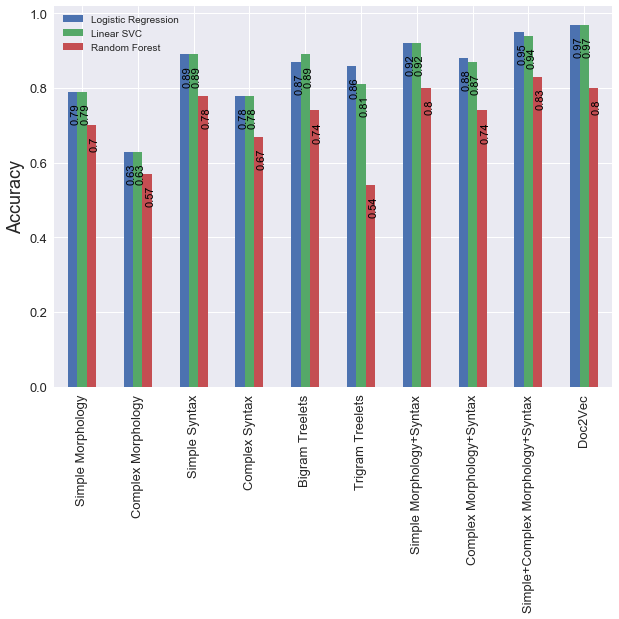

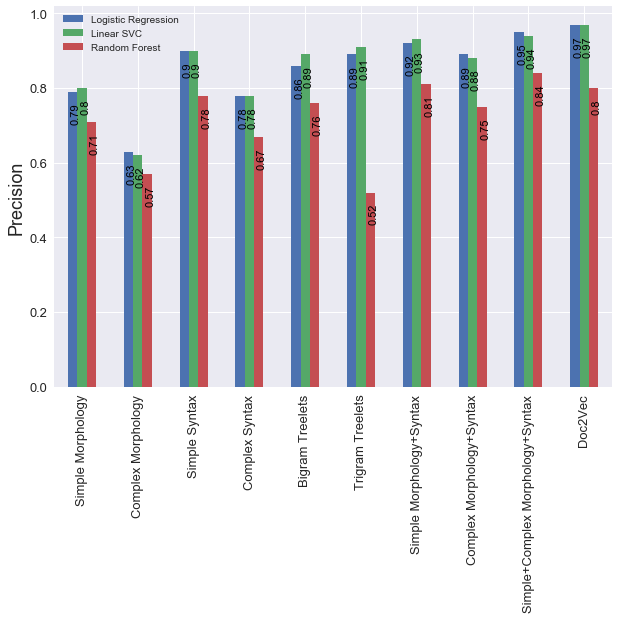

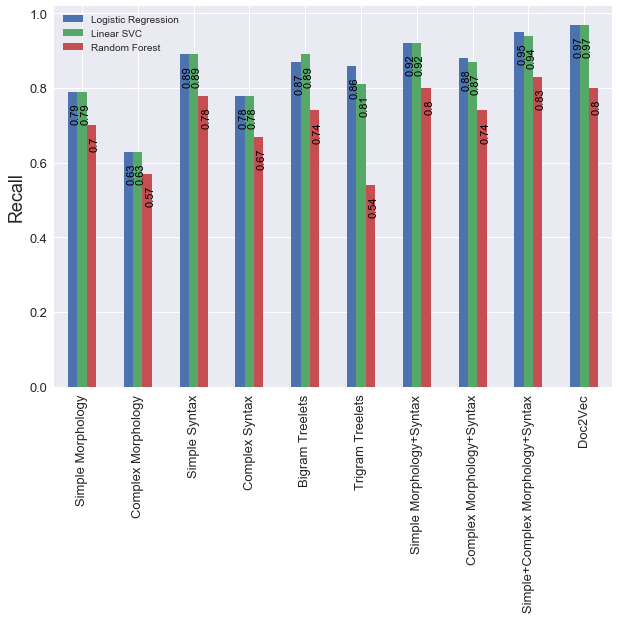

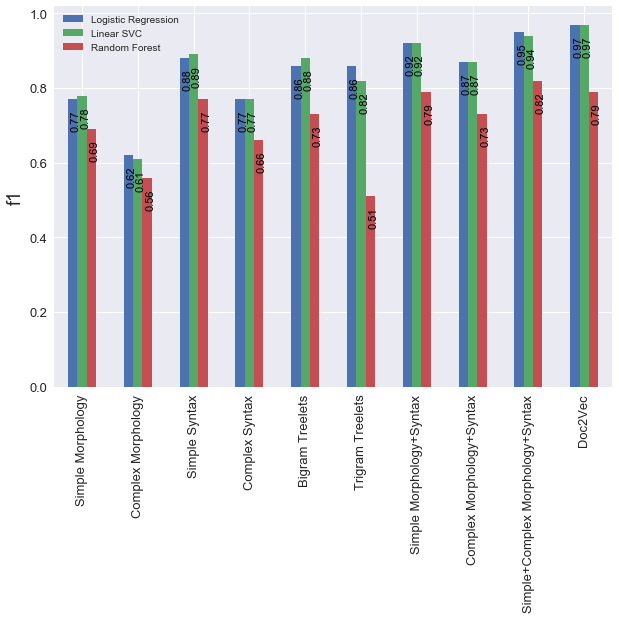

In [532]:
specificMetrics = {} # Будем строить график для каждой отдельной метрики
Index = list(metricsDict.keys())

for metric in metricsTypes:
    currentDict4DF = defaultdict(list)
    for algorithmName in algorithmsList:
        for task in Index:
            currentDict4DF[algorithmName].append(round(metricsDict[task][metric][algorithmName],2))
    specificMetrics[metric] = pd.DataFrame(currentDict4DF, index=Index)
    #specificMetrics[metric].plot.bar(rot=90, title = metric)
    ax = specificMetrics[metric].plot(kind='bar', figsize=(10,7),
                                        #color="coral",
                                      fontsize=13);
    ax.set_alpha(0.8)
    ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
    for i in ax.patches:
        # get_x pulls left or right; get_height pushes up or down
        ax.text(i.get_x()+.05, i.get_height() - 0.05, \
                str(round((i.get_height()), 2)), fontsize=11, color='black',
                    rotation=90)
    plt.savefig(os.path.join(directory, 'Classification_Result', '{}_General (2).png'.format(metric)), bbox_inches="tight")

# По оси x будет категориальная переменная с типом задачи


# Doc2Vec + Simple/Complex MorphoSyntactic

In [533]:
currentPart = 'Doc2Vec + Morphosyntax'
simpleMorphoDF = pd.read_csv('OutData/MorphoTags.csv')
simpleMorphoDF = simpleMorphoDF.drop(columns=[ 'SPACE', simpleMorphoDF.columns[0]], axis=1)
print('simpleMorphoDF: {}'.format(simpleMorphoDF.shape))

simpleSyntaxDF = pd.read_csv('OutData/SyntaxDependencies.csv')
simpleSyntaxDF = simpleSyntaxDF.drop(columns=[simpleSyntaxDF.columns[0], 'Author', 'Novel'], axis=1)
print('simpleSyntaxDF: {}'.format(simpleSyntaxDF.shape))

mergeDFSimple = pd.concat([simpleMorphoDF.drop(columns=['Author', 'Novel'],axis=1),simpleSyntaxDF ], axis=1)
print('mergeDFSimple : {}'.format(mergeDF.shape))

extendedMorphoDF = pd.read_csv('OutData/ExtendedMorpho.csv')
print('extendedMorphoDF: {}'.format(extendedMorphoDF.shape))

complexSyntaxDF = pd.read_csv('OutData/SyntaxComplex.csv')
print('complexSyntaxDF: {}'.format(complexSyntaxDF.shape))

mergeDFComplex = pd.concat([extendedMorphoDF.drop(columns=['Author', 'Novel'],axis=1),complexSyntaxDF ], axis=1)
print('mergeDFComplex : {}'.format(mergeDF.shape))

mergeDF = pd.concat([mergeDFSimple, mergeDFComplex], axis=1)
print('Shape total merge: {}'.format(mergeDF.shape))

label_list_by_authors = mergeDF.Author.values
doc2vec_DF = pd.read_csv('doc2vec/doc2vec_data_size_150_window_5.csv', header=None)

mergeDF = pd.concat([mergeDF, doc2vec_DF], axis=1)
print('Union with doc2vec: {}'.format(mergeDF.shape))

X = mergeDF.drop(columns=['Author', 'Novel'], axis=1).values

print('Shape of main doc2vec matrix: {}'.format(X.shape))
print('Count of classes: {}, unique classes: {}'.format(len(label_list_by_authors), len(set(label_list_by_authors))))

le = LabelEncoder()
Y = le.fit_transform(label_list_by_authors)


countOfAuthors = len(mergeDF.Author.unique())
print('We have {} authors'.format(countOfAuthors))

simpleMorphoDF: (1506, 19)
simpleSyntaxDF: (1506, 40)
mergeDFSimple : (1506, 103)
extendedMorphoDF: (1506, 18)
complexSyntaxDF: (1506, 30)
mergeDFComplex : (1506, 103)
Shape total merge: (1506, 103)
Union with doc2vec: (1506, 253)
Shape of main doc2vec matrix: (1506, 251)
Count of classes: 1506, unique classes: 30
We have 30 authors


In [396]:
clustering_experiment(X, label_list_by_authors, statStructure, currentPart)

Hopkins stats: 0.7541958560354182
Clustering by 30 clusters:
Count of clusters: 30
	ARS: 0.5023850211848809
	AMI: 0.7032083104503032


Current model: Random Forest
Accuracy  	mean: 0.87243
Precision 	mean: 0.87450
Recall    	mean: 0.87243
f1        	mean: 0.86509
Current model: Logistic Regression
Accuracy  	mean: 0.98339
Precision 	mean: 0.98426
Recall    	mean: 0.98339
f1        	mean: 0.98266
Current model: Linear SVC
Accuracy  	mean: 0.99208
Precision 	mean: 0.99236
Recall    	mean: 0.99208
f1        	mean: 0.99195


<Figure size 432x288 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

<Figure size 720x504 with 0 Axes>

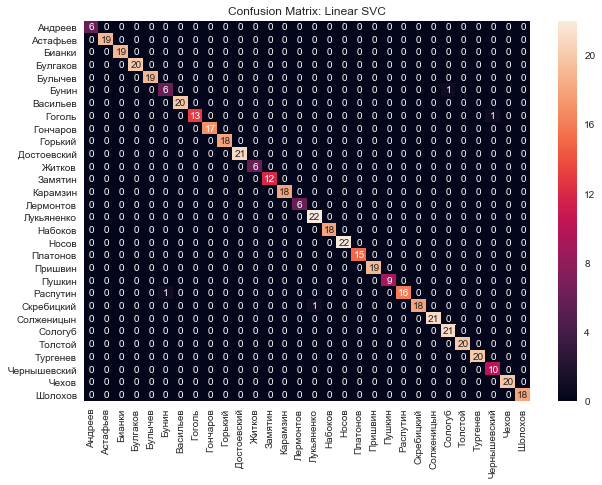

In [534]:
predictions_result = defaultdict(list) # For error analysis
classification_experiment(X, Y, list_of_models,
                         currentPart, statStructure,
                         name_of_features = name_of_features,
                         count_of_folds = COUNT_OF_FOLDS,
                         feature_importance_available = False,
                         folder_with_results = directory,
                         scaling = True, dict_for_predictions = predictions_result)

<Figure size 432x288 with 0 Axes>

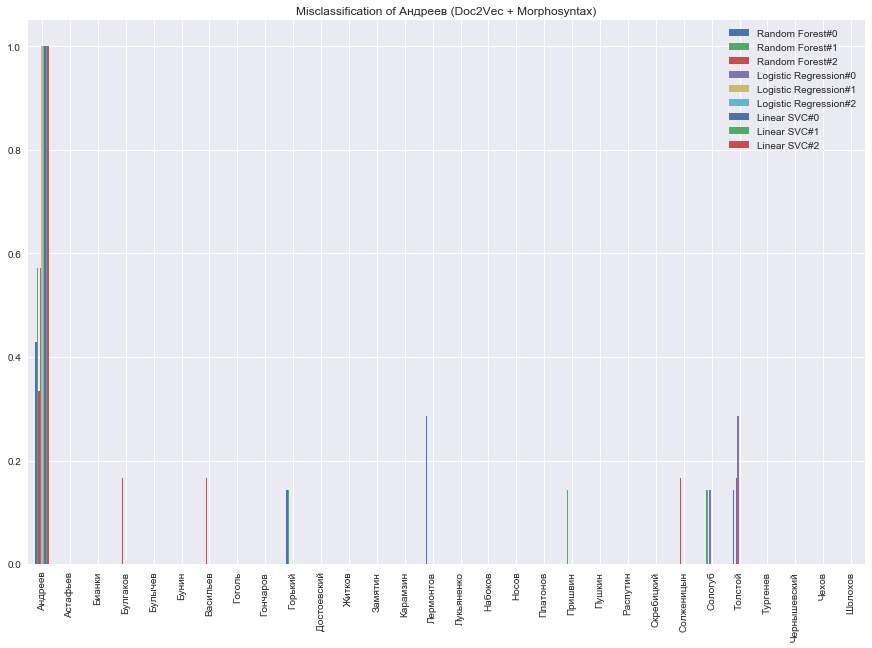

<Figure size 432x288 with 0 Axes>

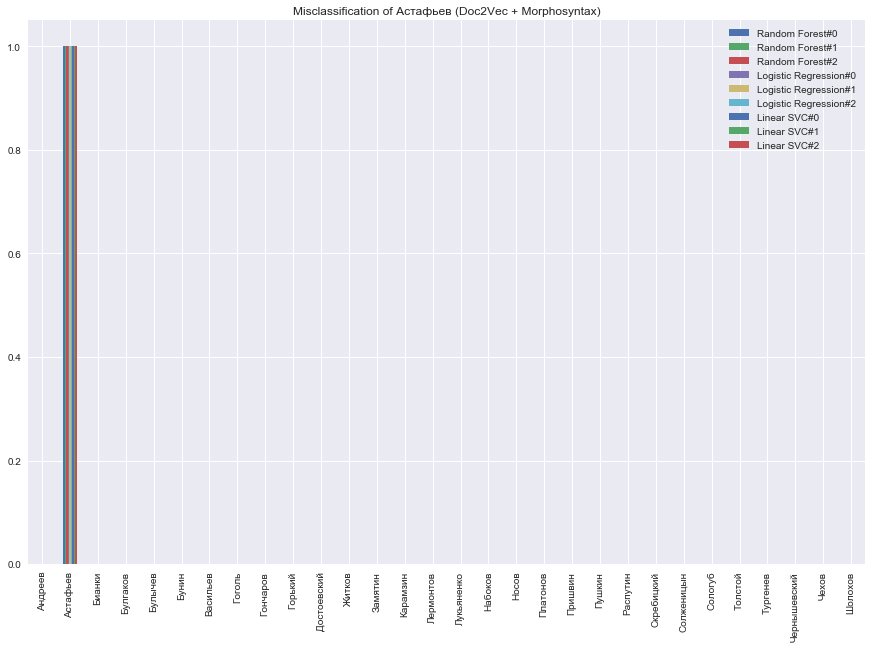

<Figure size 432x288 with 0 Axes>

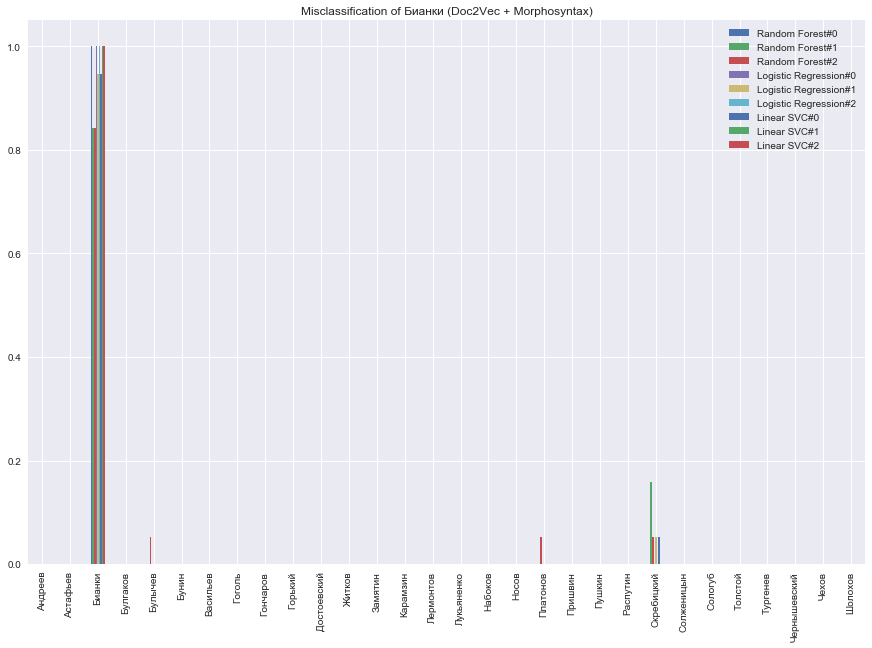

<Figure size 432x288 with 0 Axes>

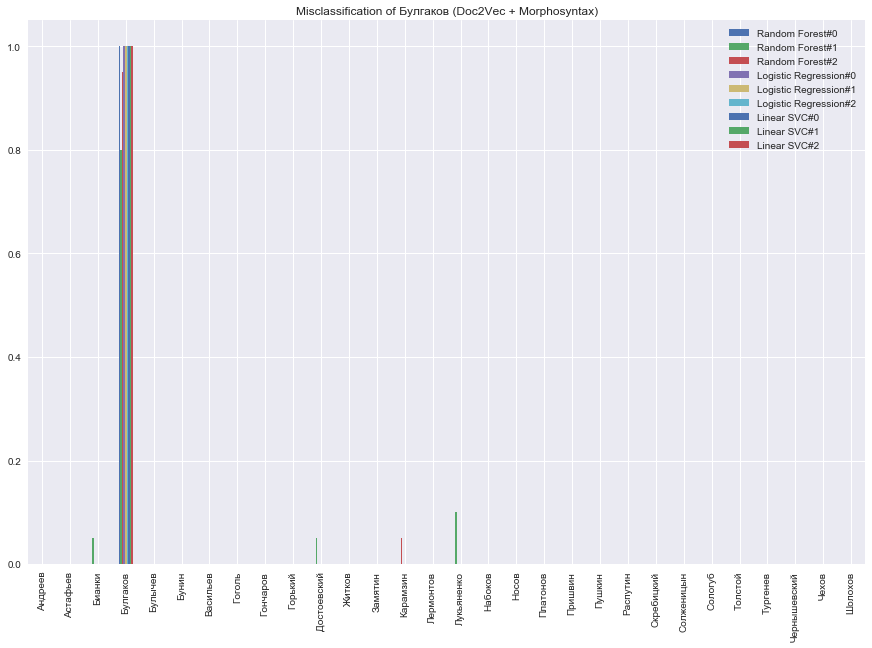

<Figure size 432x288 with 0 Axes>

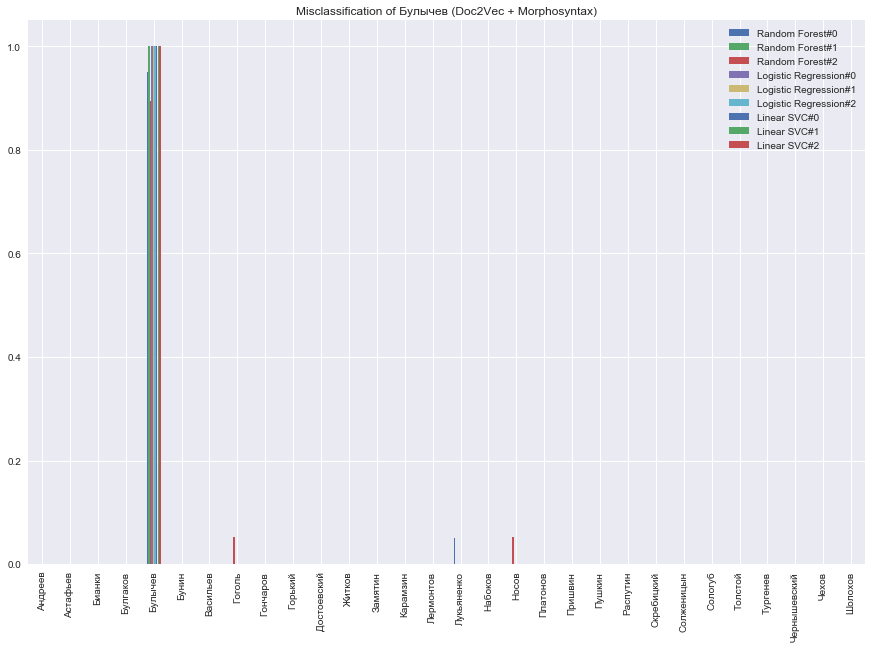

<Figure size 432x288 with 0 Axes>

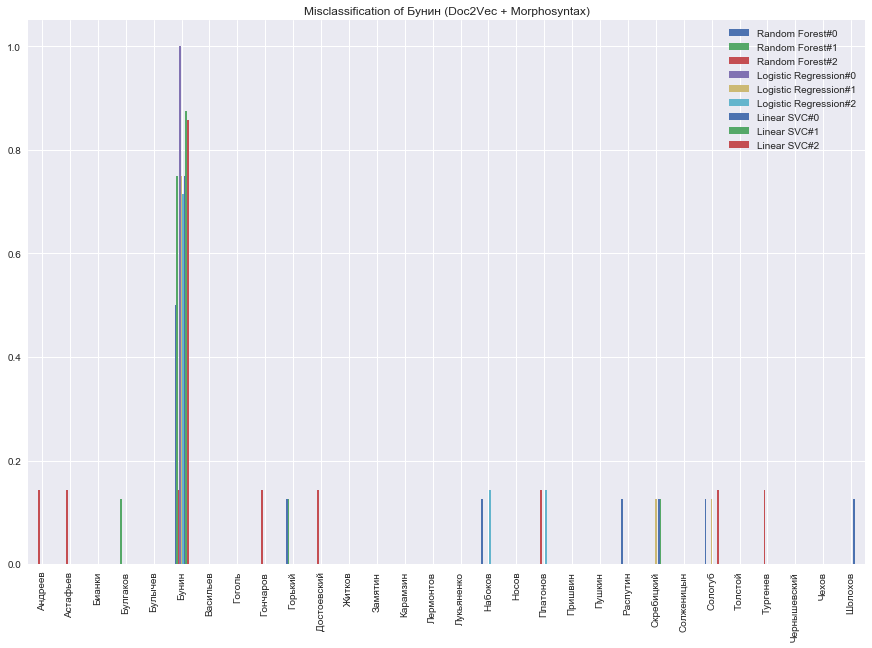

<Figure size 432x288 with 0 Axes>

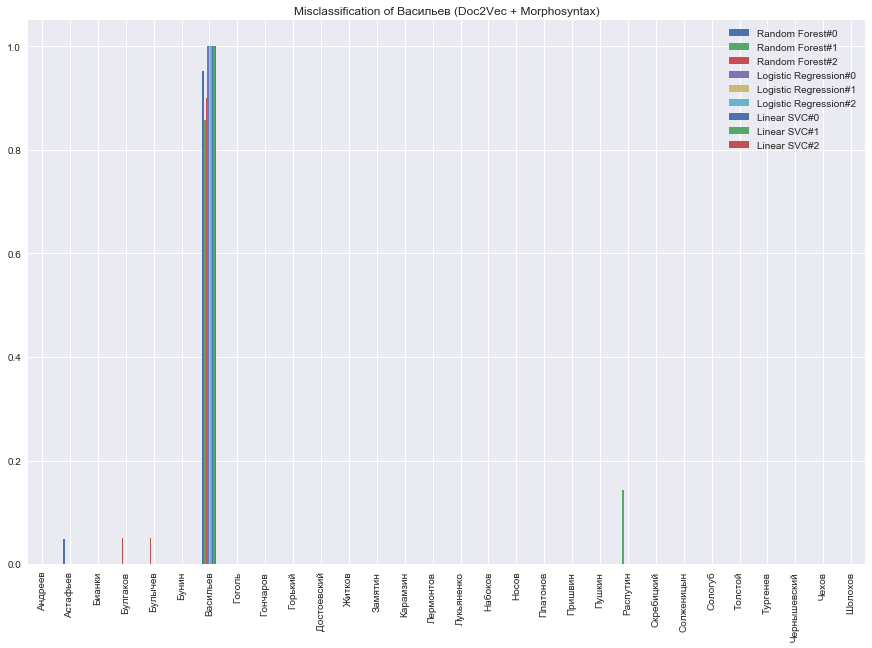

<Figure size 432x288 with 0 Axes>

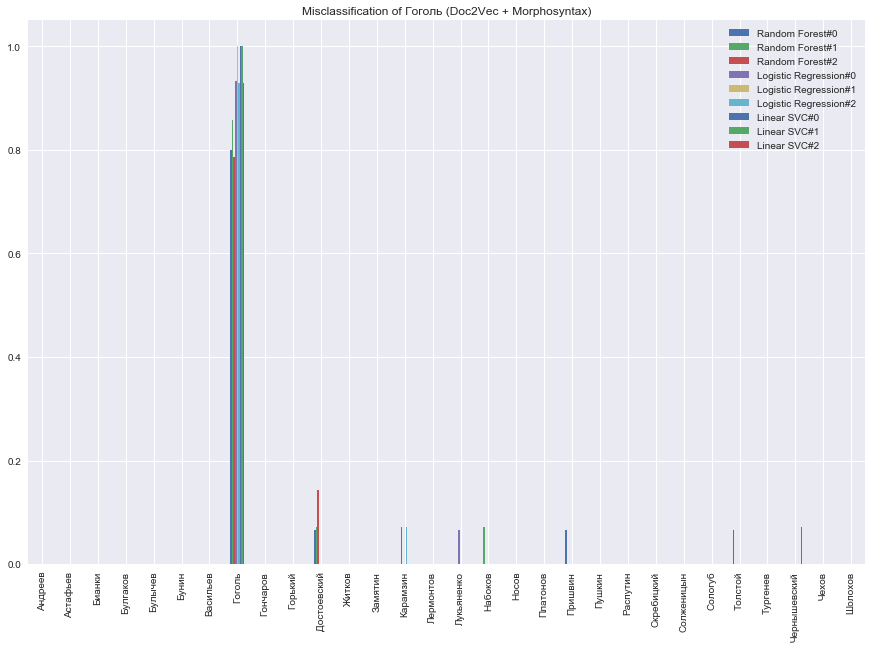

<Figure size 432x288 with 0 Axes>

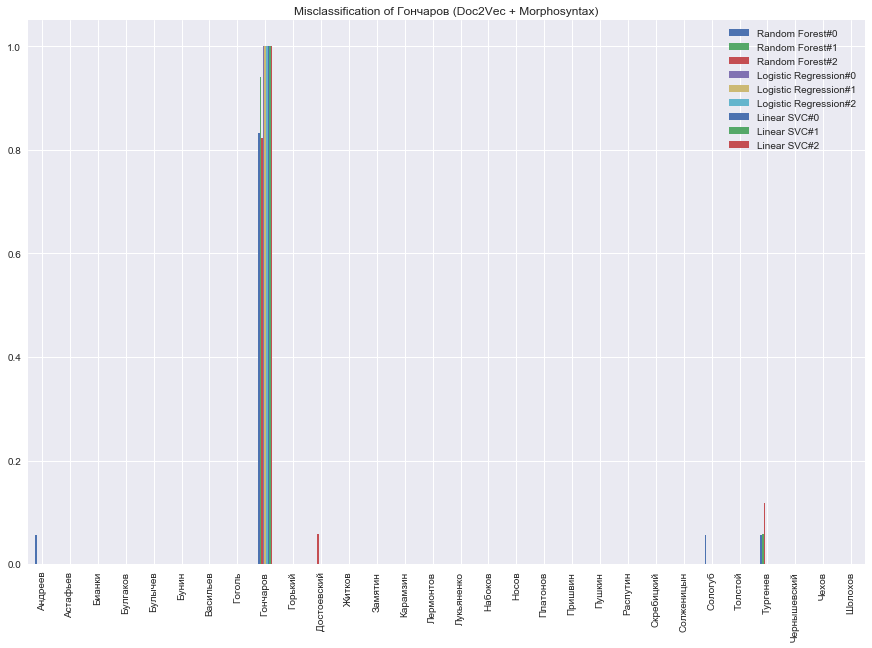

<Figure size 432x288 with 0 Axes>

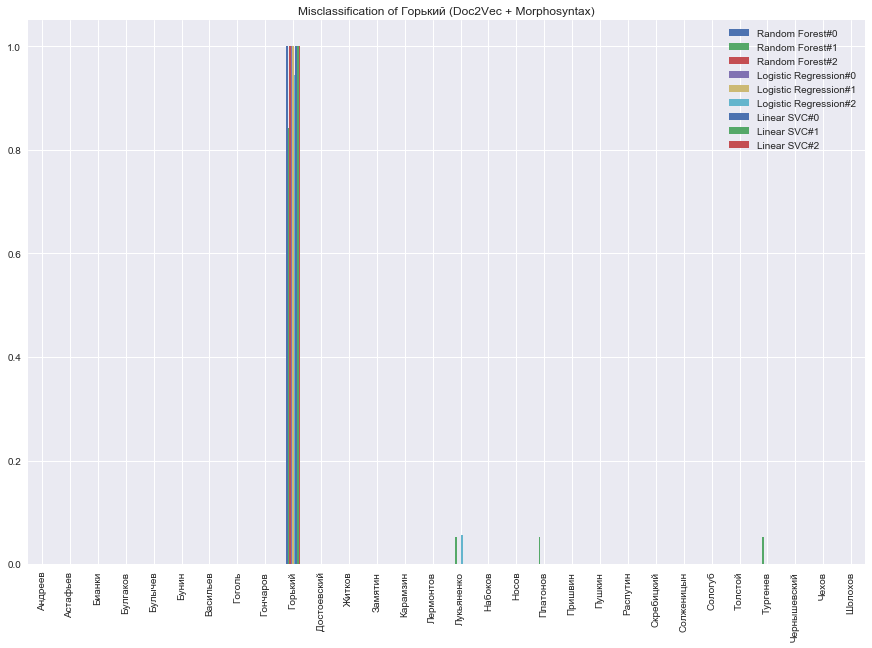

<Figure size 432x288 with 0 Axes>

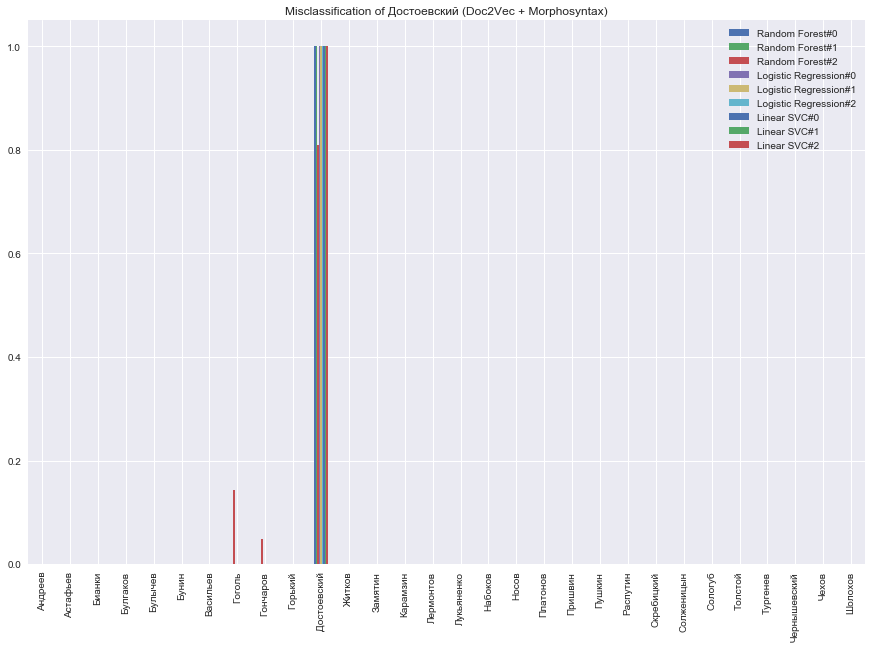

<Figure size 432x288 with 0 Axes>

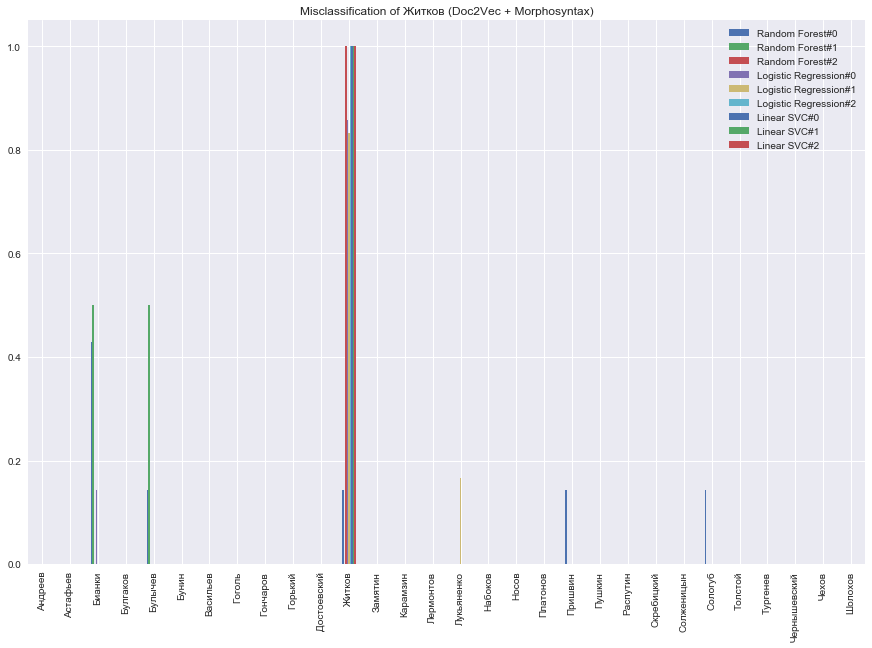

<Figure size 432x288 with 0 Axes>

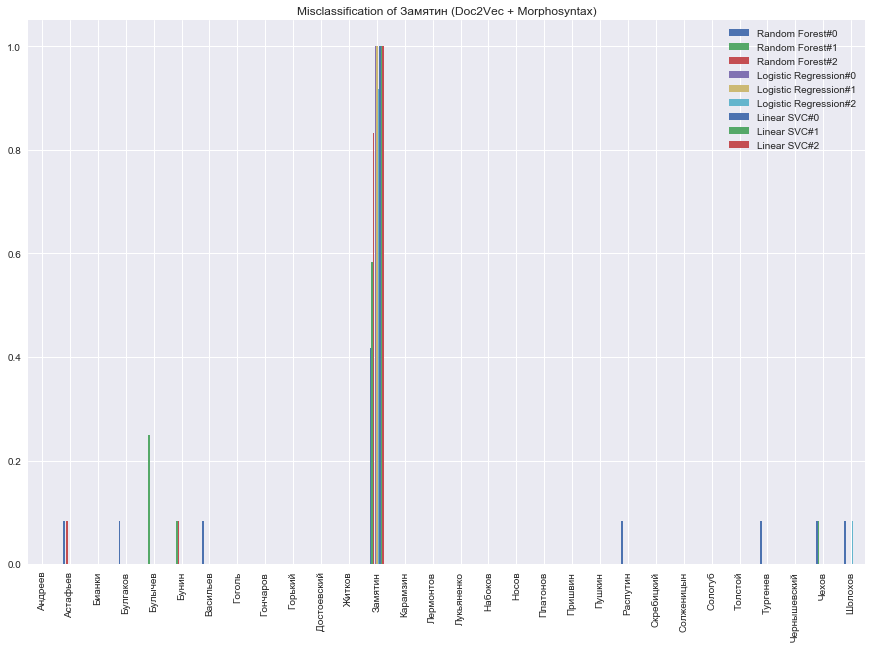

<Figure size 432x288 with 0 Axes>

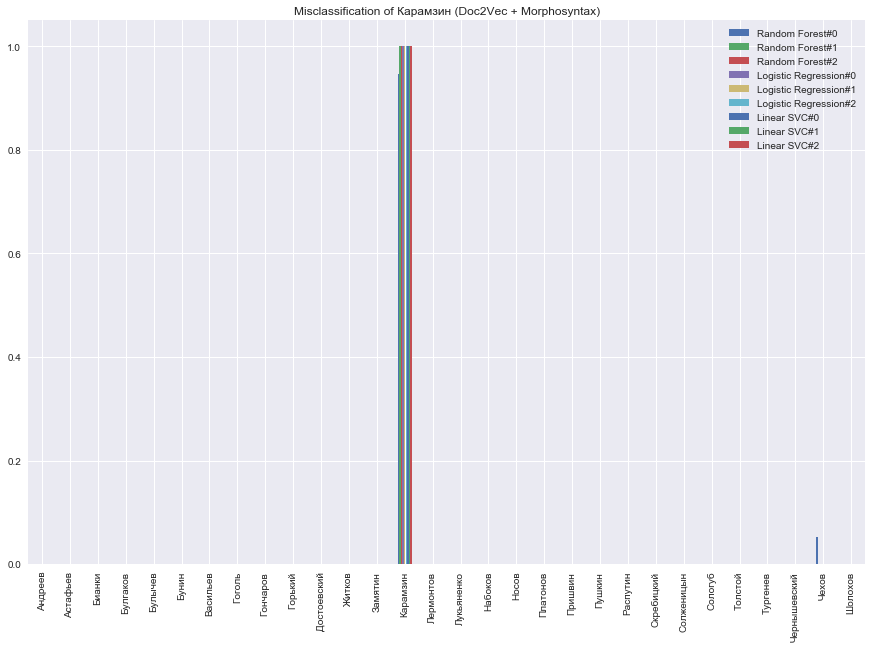

<Figure size 432x288 with 0 Axes>

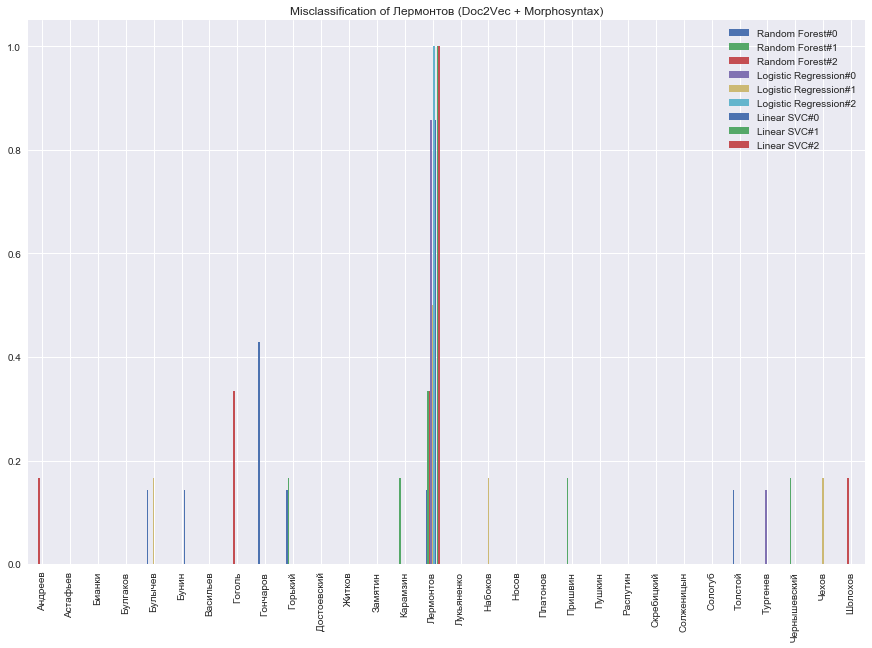

<Figure size 432x288 with 0 Axes>

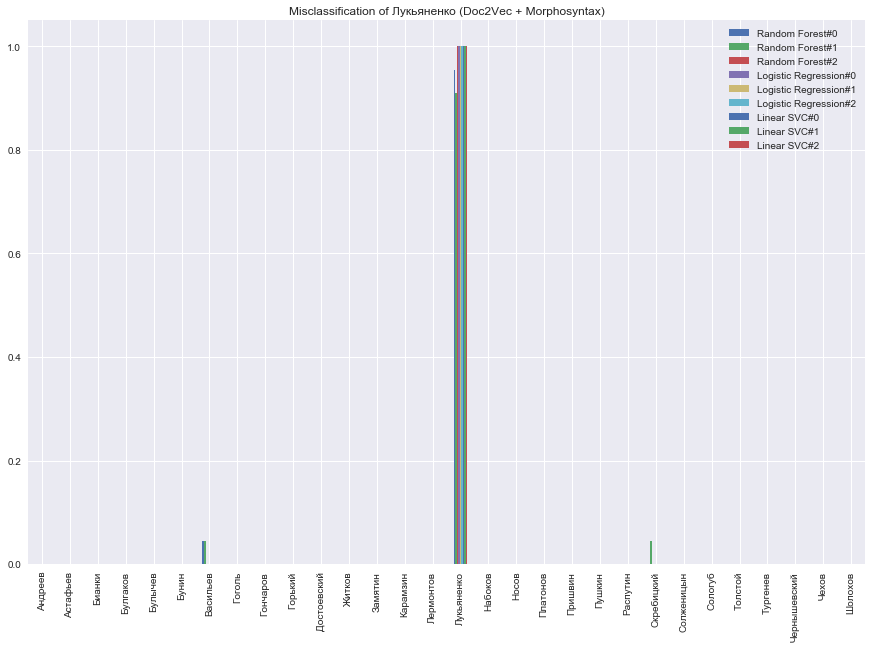

<Figure size 432x288 with 0 Axes>

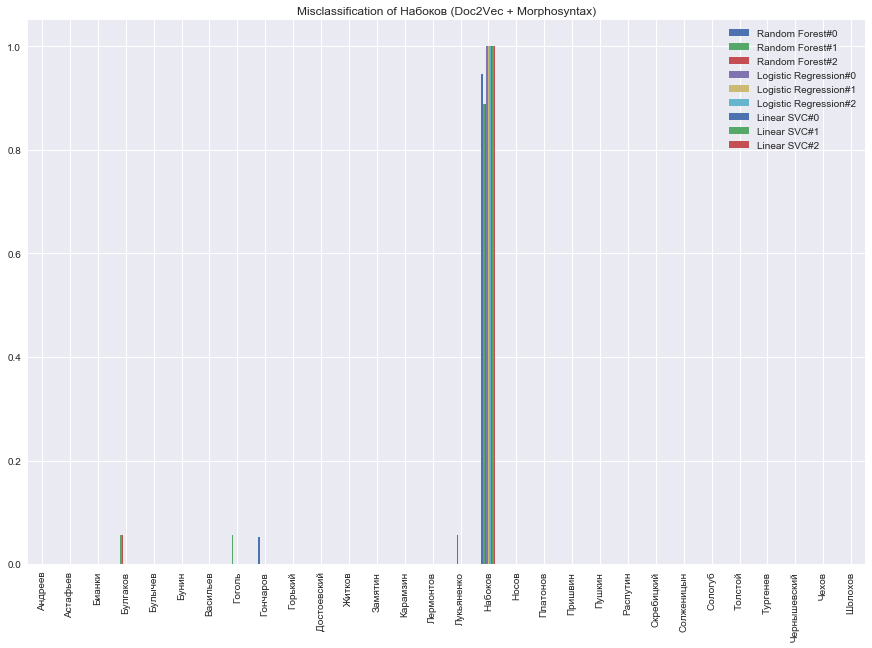

<Figure size 432x288 with 0 Axes>

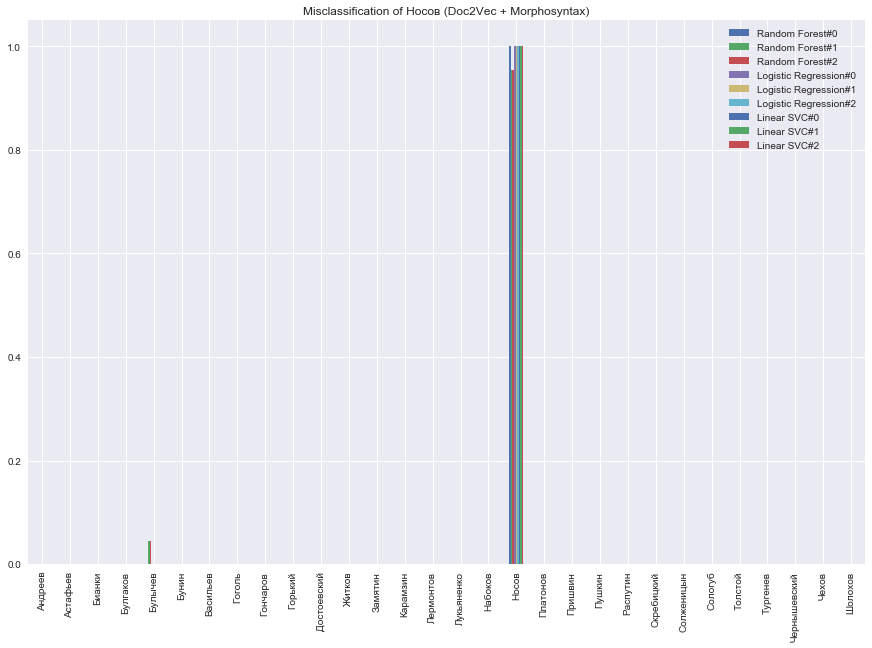

<Figure size 432x288 with 0 Axes>

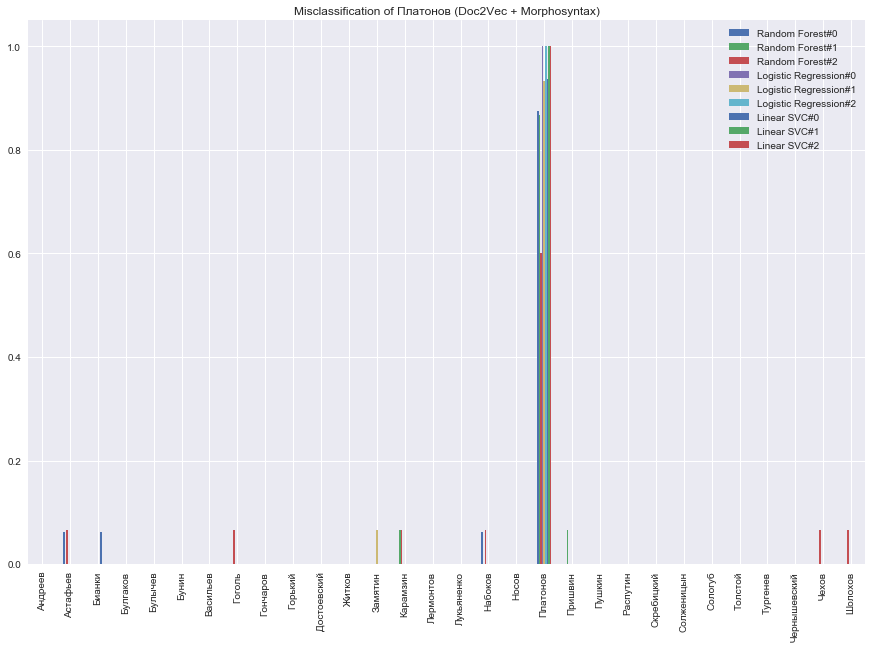

<Figure size 432x288 with 0 Axes>

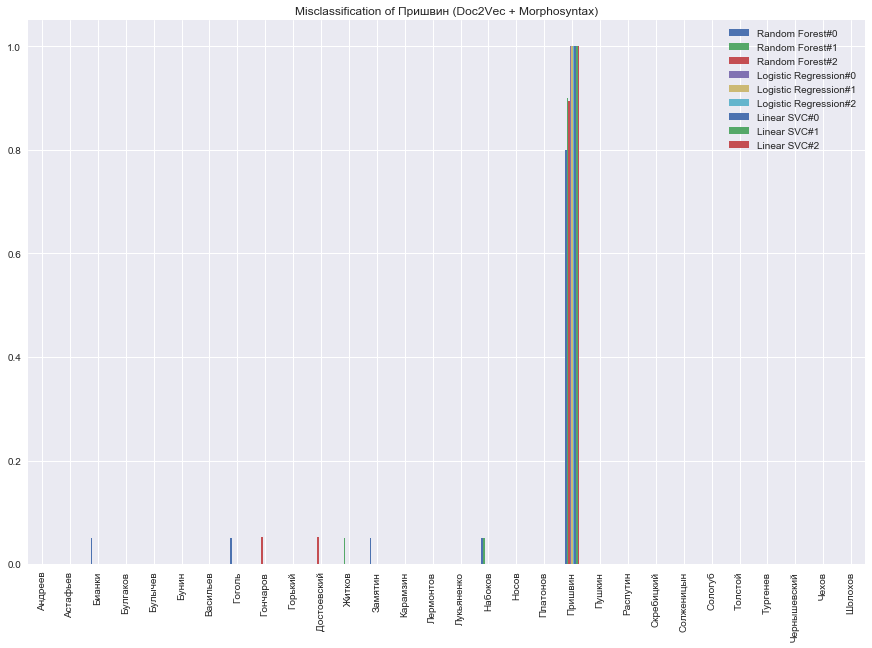

<Figure size 432x288 with 0 Axes>

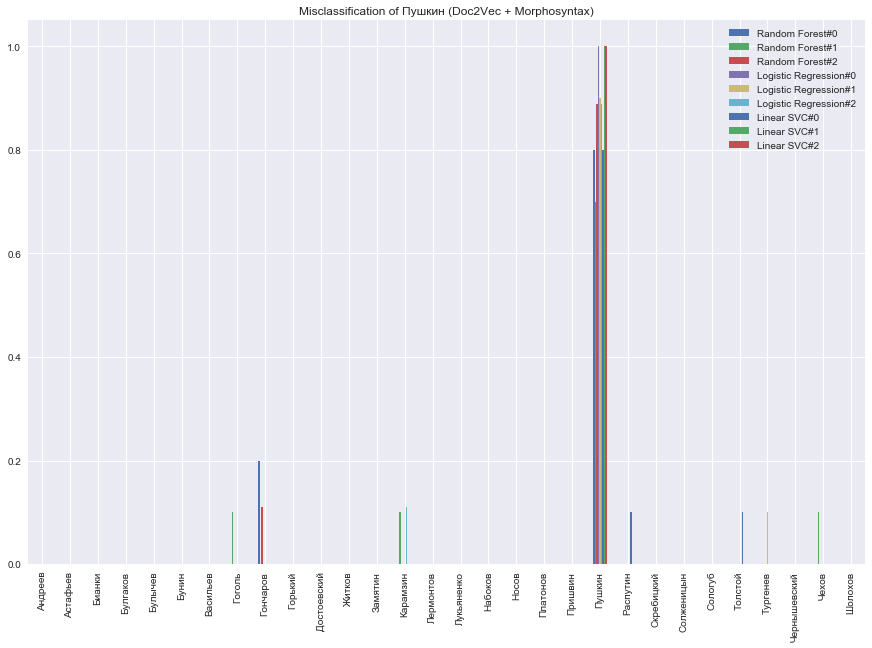

<Figure size 432x288 with 0 Axes>

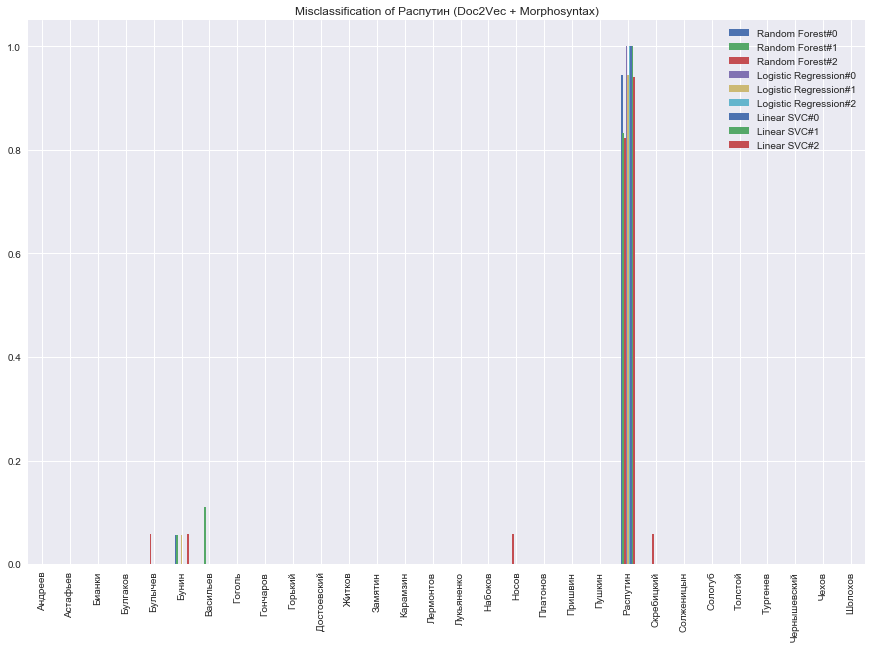

<Figure size 432x288 with 0 Axes>

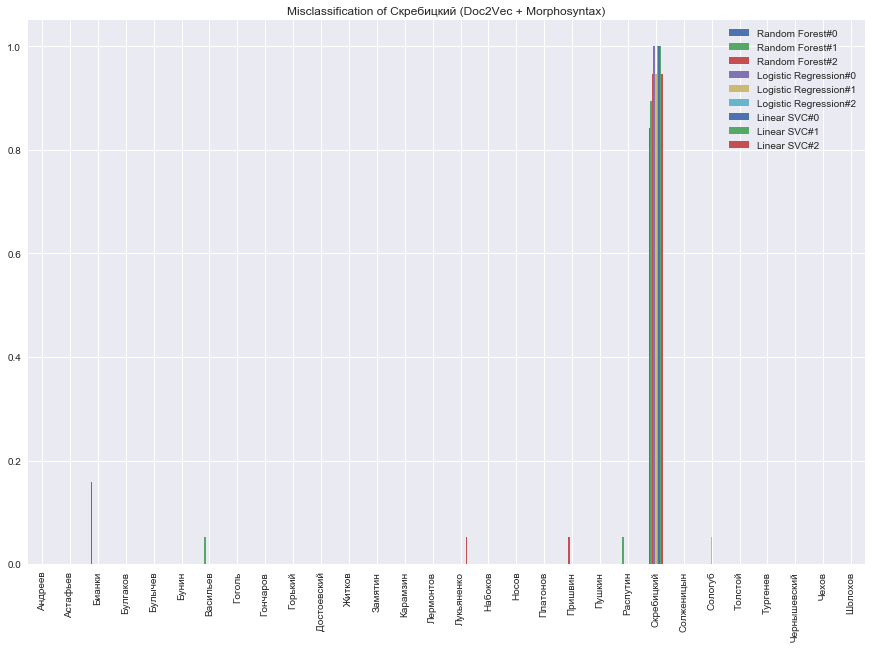

<Figure size 432x288 with 0 Axes>

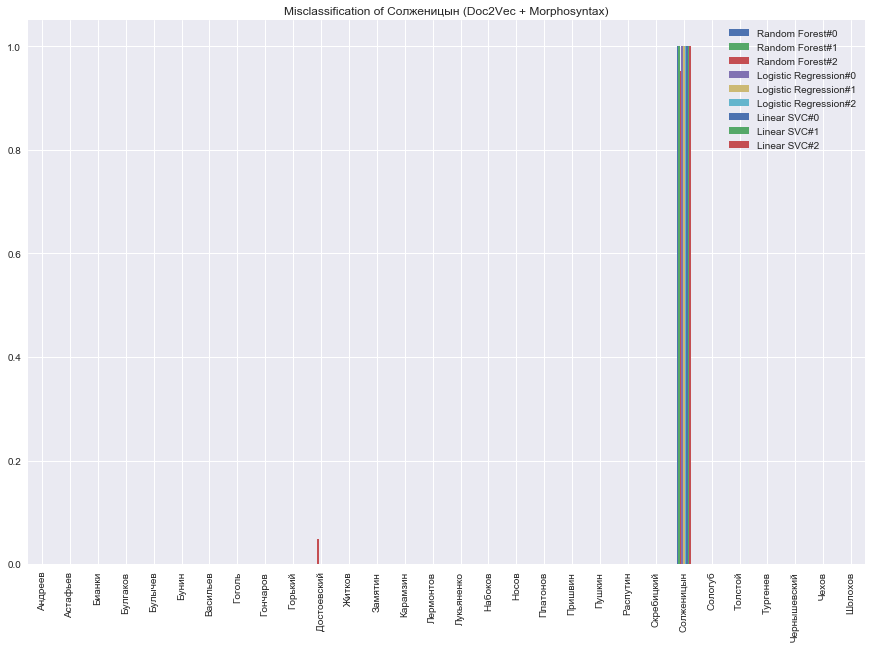

<Figure size 432x288 with 0 Axes>

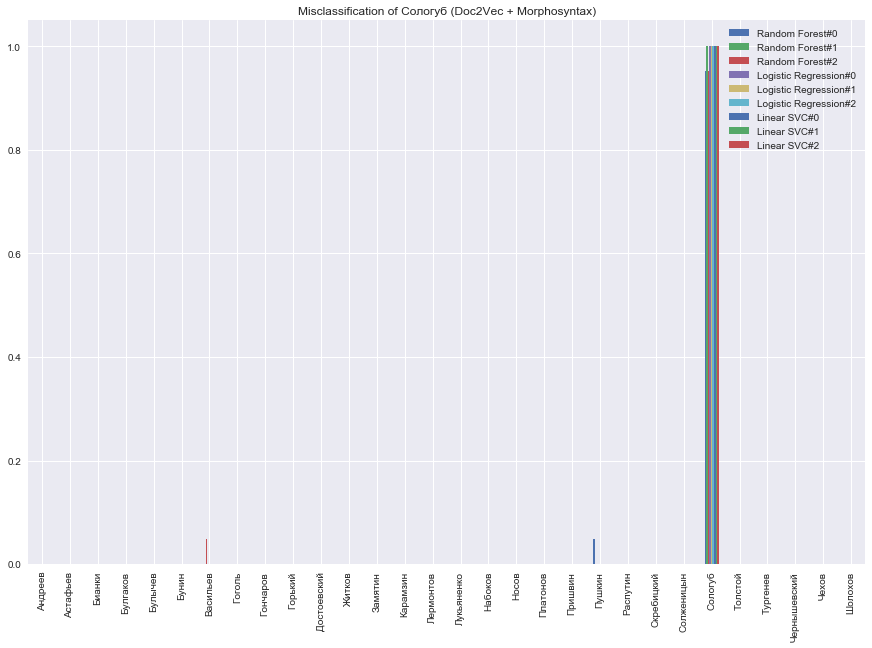

<Figure size 432x288 with 0 Axes>

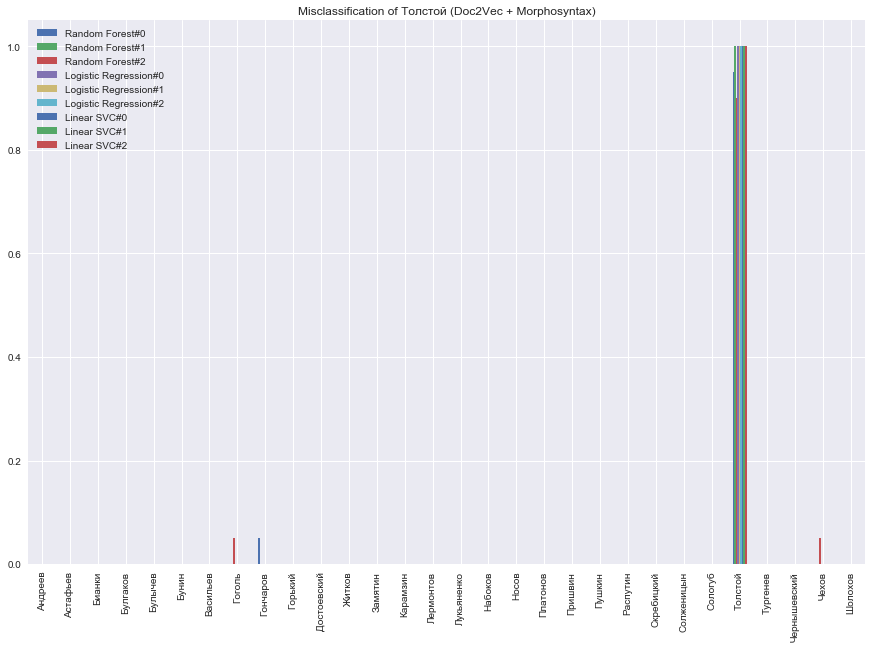

<Figure size 432x288 with 0 Axes>

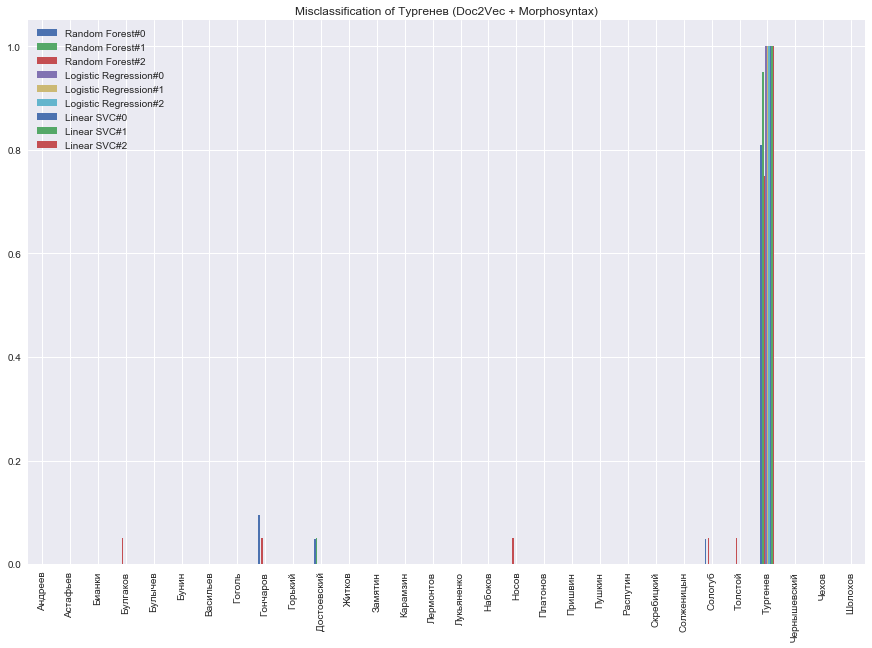

<Figure size 432x288 with 0 Axes>

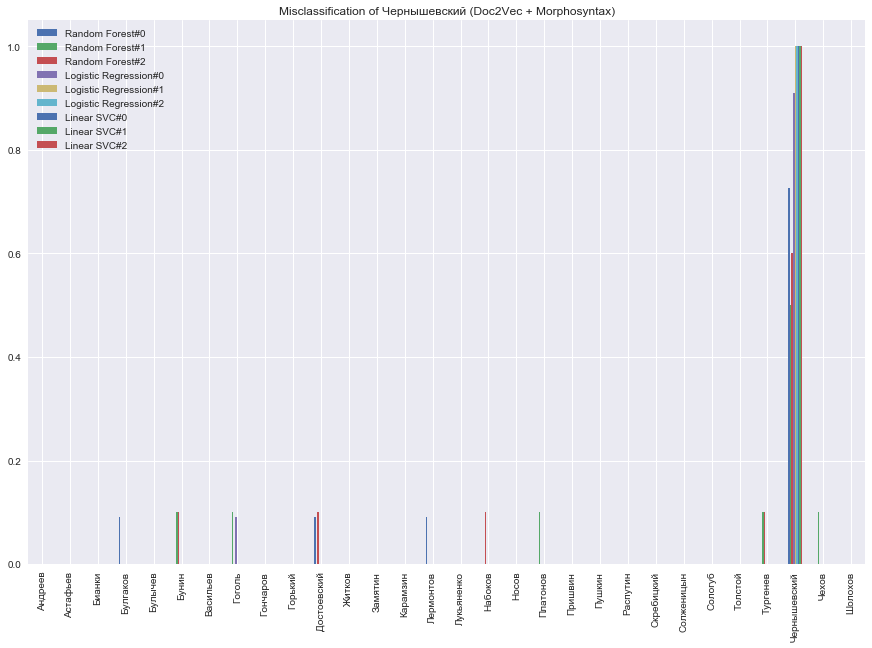

<Figure size 432x288 with 0 Axes>

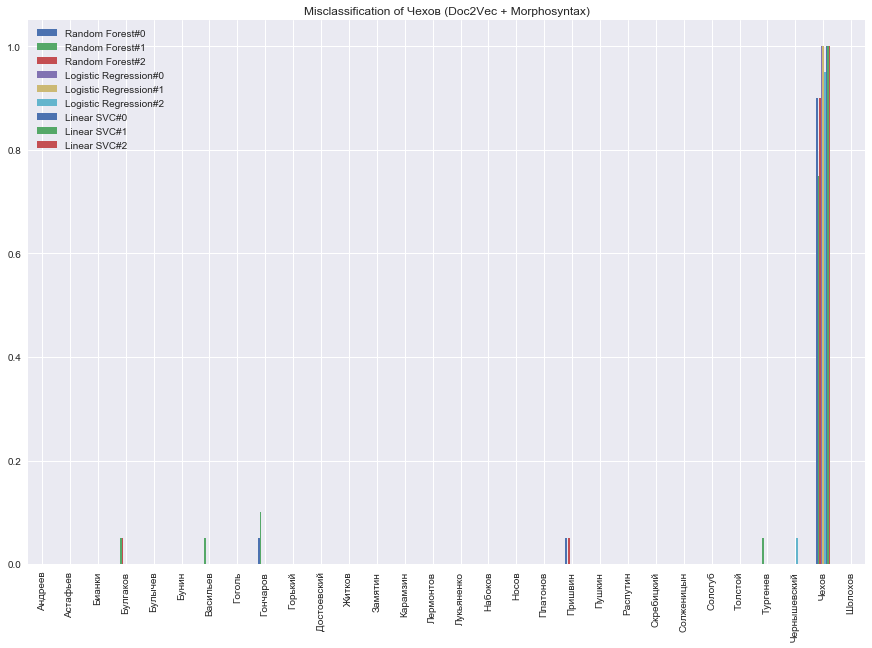

<Figure size 432x288 with 0 Axes>

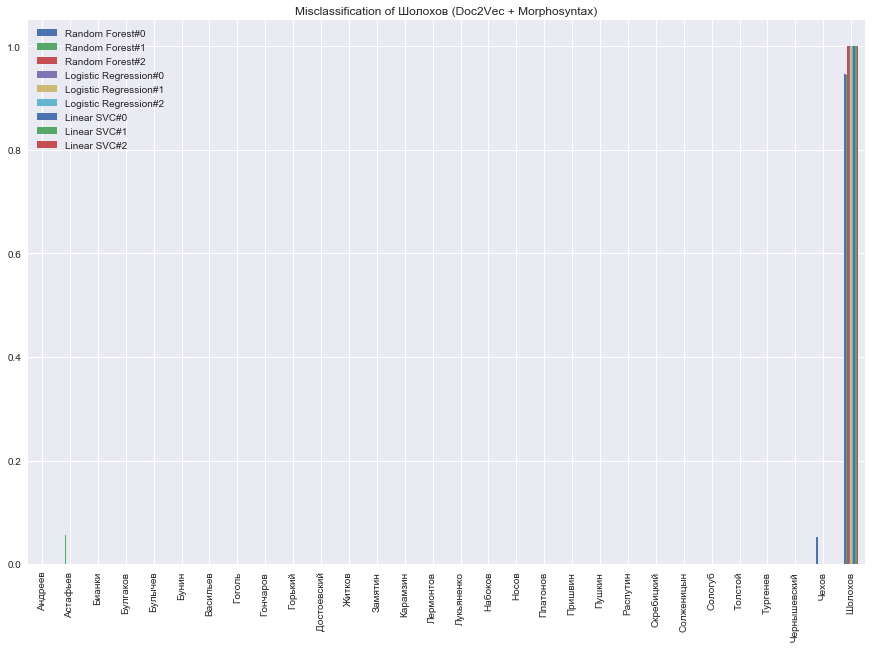

In [535]:
# Словарь. Ключ - имя автора, значение - датафрейм ошибок
errorsDictionary = {}
fixed_names = sorted(le.classes_)
list_of_algorithms = list(predictions_result.keys())

columns_for_df = []
for algoritm_name in list_of_algorithms:
    columns_for_df.extend(['{}#{}'.format(algoritm_name,index) for index in range(3)])

for algorithm_name in predictions_result:
    for cv_index, cv_result in enumerate(predictions_result[algorithm_name]):
        current_dict = calc_description_errors(cv_result[0], cv_result[1], le)
        for author_name in current_dict:
            if author_name not in errorsDictionary:
                errorsDictionary[author_name] = pd.DataFrame(index=fixed_names, columns=columns_for_df)
            vals = [current_dict[author_name][sub_author] for sub_author in fixed_names]
            errorsDictionary[author_name]['{}#{}'.format(algorithm_name, cv_index)] = [x/sum(vals) for x in vals]

if not os.path.exists(os.path.join(directory,currentPart,  'error_analysis')):
    os.makedirs(os.path.join(directory, currentPart, 'error_analysis'))
for author_name in errorsDictionary:
    if not os.path.exists(os.path.join(directory, 'error_analysis', author_name)):
        os.makedirs(os.path.join(directory, 'error_analysis', author_name))
    
for author_name in errorsDictionary:
    errorsDictionary[author_name]
    plt.clf()
    ax = errorsDictionary[author_name].plot.bar(rot=90, figsize=(15,10))
    ax.set_alpha(0.8)
    ax.set_title('Misclassification of {} ({})'.format(author_name, currentPart))
    plt.savefig(os.path.join(directory, 'error_analysis', author_name,  '{}.png'.format(currentPart)), bbox_inches="tight")
    plt.savefig(os.path.join(directory, currentPart, 'error_analysis', '{}.png'.format(author_name)), bbox_inches="tight")
    plt.show()

In [536]:
res_table = []
errors_by_authors = []

columns = ['Author', 'Определение автора' , 'Всегда ошибка', 'Много ошибок', 'Всегда без ошибок' ]
for author_name in sorted(errorsDictionary.keys()):
    t = errorsDictionary[author_name]
    full_not_null = [x for x in t[t.all(axis=1)].index.values if x != author_name]
    never_errors = [x for x in t[t.sum(axis=1) == 0].index.values if x != author_name]
    many_errors = t[(t[t > 0].isnull().sum(axis=1) < 4) & (t[t > 0].isnull().sum(axis=1) > 0)].index.values
    
    author_detection = [x for x in t[t.all(axis=1)].index.values if x == author_name]
    
    res_table.append({
        'Author' : author_name,
        'Определение автора' : ' '.join(author_detection),
        'Всегда ошибка' : ' '.join(full_not_null),
        'Всегда без ошибок' : ' '.join(never_errors),
        'Много ошибок' : ' '.join(many_errors)
    })
    
    tmp_dict = { 'Author' : author_name }

    for tttt in sorted(errorsDictionary.keys()):
        tmp_dict[tttt] = ''
    
    for author_tt in author_detection:
        tmp_dict[author_tt] = 'green'
    for author_tt in full_not_null:
        tmp_dict[author_tt] = 'red'
    for author_tt in many_errors:
        tmp_dict[author_tt] = 'yellow'
    for author_tt in never_errors:
        tmp_dict[author_tt] = 'lime'
    
    errors_by_authors.append(tmp_dict)

df = pd.DataFrame(res_table, columns=columns)

# Convert the dataframe to an XlsxWriter Excel object.
df.to_excel(global_error_writer, sheet_name=currentPart, index=False, columns = columns)
sheetname = currentPart
worksheet = global_error_writer.sheets[sheetname]  # pull worksheet object
for idx, col in enumerate(df):  # loop through all columns
    series = df[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width


    
df1 = pd.DataFrame(errors_by_authors, columns=(['Author']+list(sorted(errorsDictionary.keys()))))
# Create a Pandas Excel writer using XlsxWriter as the engine.
# Convert the dataframe to an XlsxWriter Excel object.
df1.to_excel(global_confusion_matrix_write, sheet_name=currentPart, index=False,  columns=(['Author']+list(sorted(errorsDictionary.keys()))))
sheetname = currentPart
worksheet = global_confusion_matrix_write.sheets[sheetname]  # pull worksheet object
cell_red_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'red'})
cell_lime_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'lime'})
cell_green_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'green'})
cell_yellow_format = global_confusion_matrix_write.book.add_format({'bold': True, 'bg_color': 'yellow'})


for row_index, author_list in enumerate(errors_by_authors):
    for column_index, column_author_name in enumerate(['Author']+list(sorted(errorsDictionary.keys()))):
        if column_author_name == 'Author':
            continue
        else:
            if errors_by_authors[row_index][column_author_name] == 'lime':
                worksheet.write(row_index+1, column_index, column_author_name, cell_lime_format)
            if errors_by_authors[row_index][column_author_name] == 'red':
                worksheet.write(row_index+1, column_index, column_author_name, cell_red_format)
            if errors_by_authors[row_index][column_author_name] == 'green':
                worksheet.write(row_index+1, column_index, column_author_name, cell_green_format) 
            if errors_by_authors[row_index][column_author_name] == 'yellow':
                worksheet.write(row_index+1, column_index, column_author_name, cell_yellow_format)   

for idx, col in enumerate(df1):  # loop through all columns
    series = df1[col]
    max_len = max((
            series.astype(str).map(len).max(),  # len of largest item
            len(str(series.name))  # len of column name/header
            )) + 1  # adding a little extra space
    worksheet.set_column(idx, idx, max_len)  # set column width

## Close Global Excel Writers

In [537]:
global_error_writer.save()
global_confusion_matrix_write.save()

In [538]:
Index = ['Simple Morphology', 'Complex Morphology', 'Simple Syntax', 'Complex Syntax',
         'Bigram Treelets', 
         'Trigram Treelets', 
         'Simple Morphology+Syntax',  
         'Complex Morphology+Syntax', 
         'Simple+Complex Morphology+Syntax', 
         'Doc2Vec',
         'Doc2Vec + Morphosyntax'
        ]

colData = defaultdict(list)
algorithmsList = set()

metricsTypes = ['Accuracy', 'Precision', 'Recall', 'f1']
metricsDict = defaultdict(lambda : defaultdict(dict))

algorithmsList = set()
for method in Index:
    for characteristic in statStructure[method]:
        #if characteristic == 'Hopkins':
        #    continue
        if not isinstance(statStructure[method][characteristic], dict):
            colData[characteristic].append(statStructure[method][characteristic])
        else:
            algorithmName = characteristic
            algorithmsList.add(algorithmName)
            
            for metric in statStructure[method][algorithmName]:
                metricsDict[method][metric][algorithmName] = statStructure[method][algorithmName][metric]
algorithmsList = sorted(list(algorithmsList))                

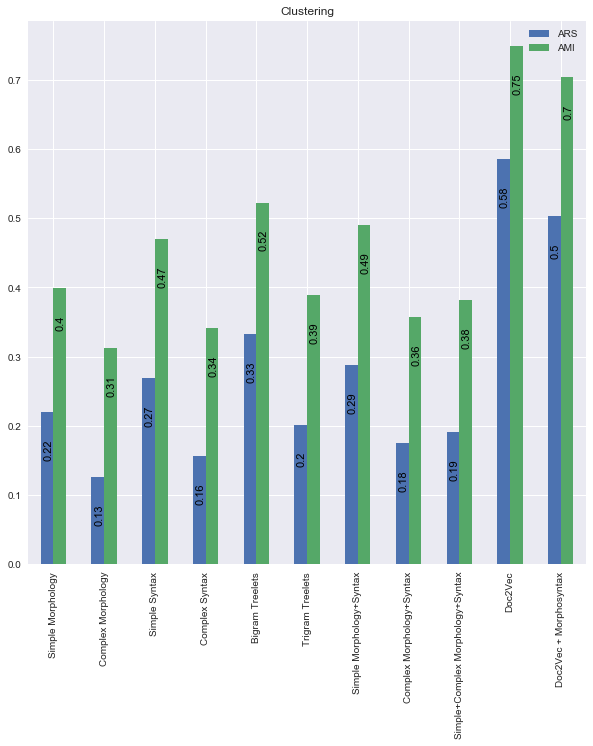

<Figure size 432x288 with 0 Axes>

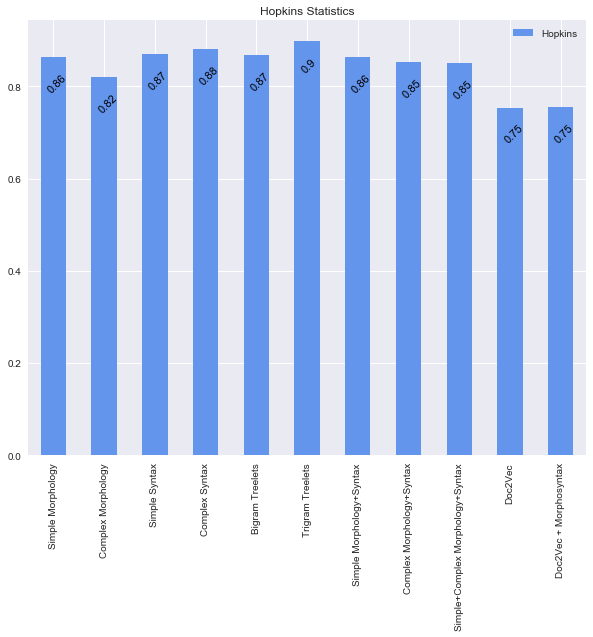

<Figure size 432x288 with 0 Axes>

In [539]:

resStat = pd.DataFrame(colData, index = Index)
#algorithmsList = sorted(algorithmsList)
ax = resStat[['ARS', 'AMI']].plot.bar(rot=90, figsize=(10,10))
ax.set_alpha(0.8)
ax.set_title('Clustering')
#ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
for i in ax.patches:
    # get_x pulls left or right; get_height pushes up or down
    ax.text(i.get_x()+0.05, i.get_height() - 0.05, \
            str(round((i.get_height()), 2)), fontsize=11, color='black',
            rotation=90)
plt.savefig(os.path.join(directory, 'Clustering_Result','Clustering_General_Metrics(Final).png'), bbox_inches="tight")
plt.show()
plt.clf()

ax = resStat[['Hopkins']].plot.bar(rot=90, color='cornflowerblue', figsize=(10,8))
ax.set_alpha(0.8)
ax.set_title('Hopkins Statistics')
#ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
for i in ax.patches:
    # get_x pulls left or right; get_height pushes up or down
    ax.text(i.get_x()+0.1, i.get_height() - 0.05, \
            str(round((i.get_height()), 2)), fontsize=11, color='black',
            rotation=45)
plt.savefig(os.path.join(directory, 'Clustering_Result','Clustering_General_Structure(Final).png'), bbox_inches="tight")
plt.show()
plt.clf()


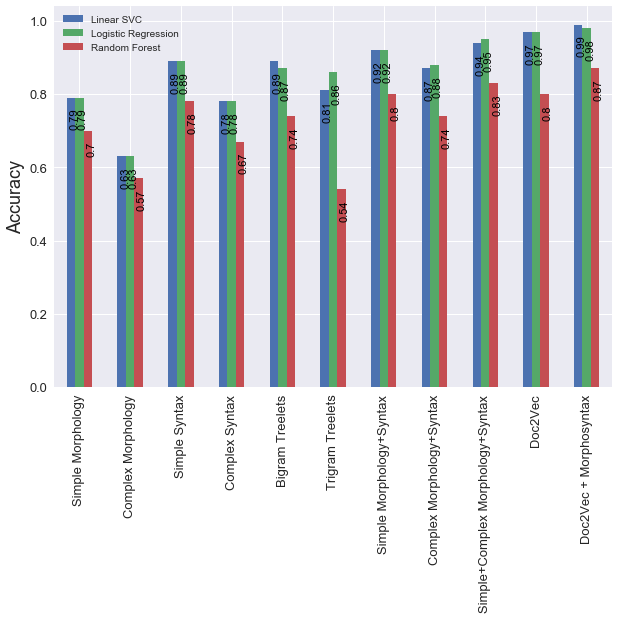

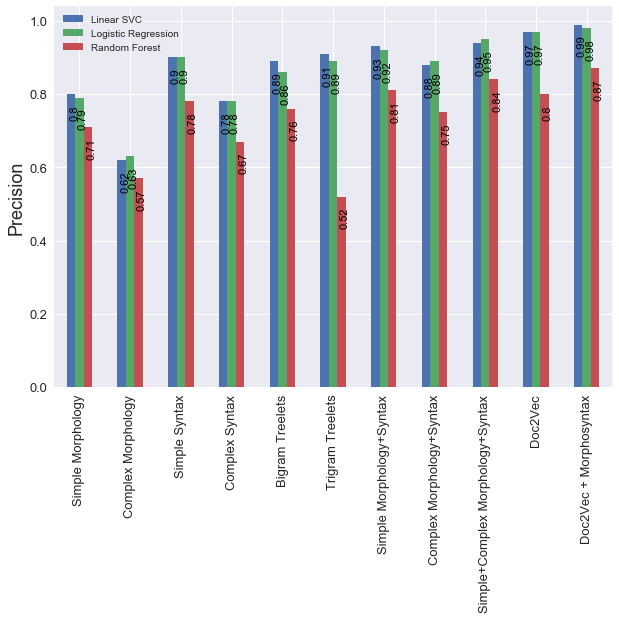

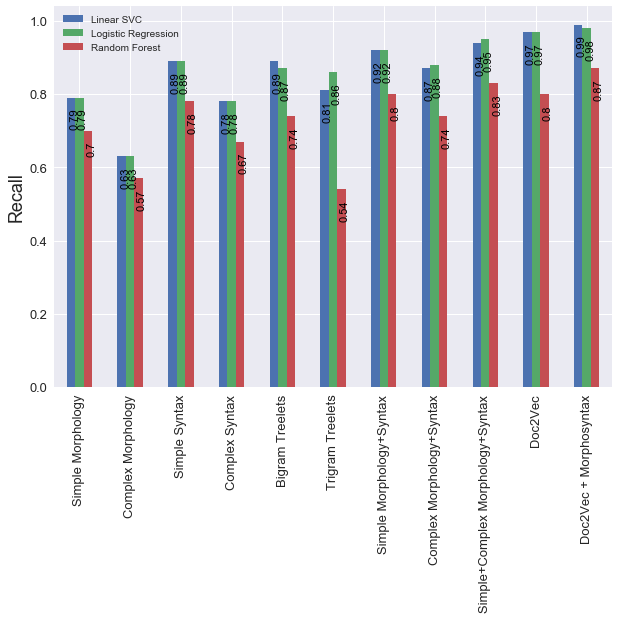

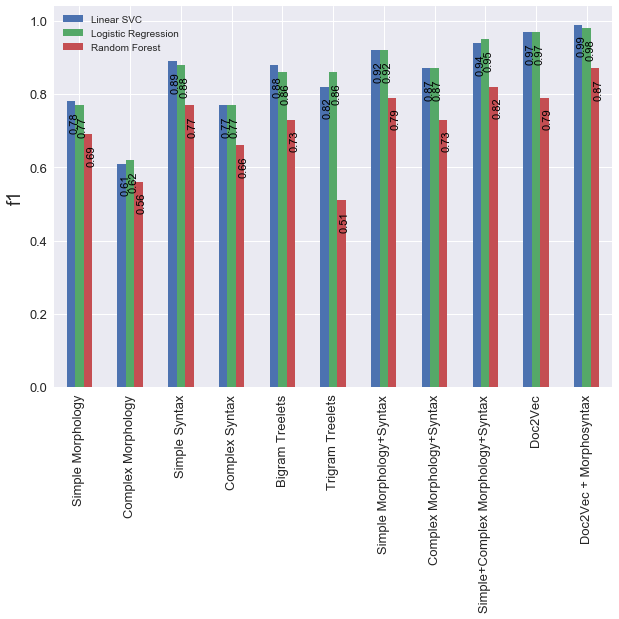

In [540]:
specificMetrics = {} # Будем строить график для каждой отдельной метрики
Index = list(metricsDict.keys())

for metric in metricsTypes:
    currentDict4DF = defaultdict(list)
    for algorithmName in algorithmsList:
        for task in Index:
            currentDict4DF[algorithmName].append(round(metricsDict[task][metric][algorithmName],2))
    specificMetrics[metric] = pd.DataFrame(currentDict4DF, index=Index)
    #specificMetrics[metric].plot.bar(rot=90, title = metric)
    ax = specificMetrics[metric].plot(kind='bar', figsize=(10,7),
                                        #color="coral",
                                      fontsize=13);
    ax.set_alpha(0.8)
    ax.set_ylabel(metric, fontsize=18);
    # set individual bar lables using above list
    for i in ax.patches:
        # get_x pulls left or right; get_height pushes up or down
        ax.text(i.get_x()+.05, i.get_height() - 0.05, \
                str(round((i.get_height()), 2)), fontsize=11, color='black',
                    rotation=90)
    plt.savefig(os.path.join(directory, 'Classification_Result', '{}_General (Final).png'.format(metric)), bbox_inches="tight")

# По оси x будет категориальная переменная с типом задачи



# Анализ признаков с точки зрения кластерной структуры

In [228]:
extendedMorphoDF = pd.read_csv('OutData/ExtendedMorpho.csv')
complexSyntaxDF = pd.read_csv('OutData/SyntaxComplex.csv')
doc2vec_DF = pd.read_csv('doc2vec/doc2vec_data_size_150_window_5.csv', header=None)

In [229]:
doc2vec_DF['Author'] = complexSyntaxDF.Author.values
doc2vec_DF['Novel'] = complexSyntaxDF.Novel.values

if not os.path.exists(os.path.join(directory, 'hopkins_analysis')):
    os.makedirs(os.path.join(directory,'hopkins_analysis'))

In [230]:
from tqdm import tqdm_notebook
rows = []
for authorName in tqdm_notebook(complexSyntaxDF.Author.unique()):
    X1 = complexSyntaxDF[complexSyntaxDF.Author == authorName].drop(columns=['Author', 'Novel'], axis=1).values
    hstat_complex_syntax = hopkins(X1)
    X2 = extendedMorphoDF[extendedMorphoDF.Author == authorName].drop(columns=['Author', 'Novel'], axis=1).values
    hstat_complex_morpho = hopkins(X2)
    X12 = np.concatenate((X1, X2), axis=1)
    
    XDOC = doc2vec_DF[doc2vec_DF.Author == authorName].drop(columns=['Author', 'Novel'], axis=1).values
    hstat_doc2vec = hopkins(XDOC)
    
    
    hstat_complex_syntaxmorpho = hopkins(X12)
    #print('Hopkins stats: {}'.format(hstat))
    rows.append({'Author' : authorName, 
                 'C-Syntax H-Stat': hstat_complex_syntax,
                 'C-Morpho H-Stat': hstat_complex_morpho,
                 'C-SM H-Stat' : hstat_complex_syntaxmorpho,
                'DOC2VEC H-Stat' : hstat_doc2vec})
    
resDF = pd.DataFrame(rows)
resDF

,Author,C-Morpho H-Stat,C-SM H-Stat,C-Syntax H-Stat,DOC2VEC H-Stat
0,Андреев,0.619963,0.594293,0.612110,0.559237
1,Астафьев,0.655411,0.650784,0.681923,0.615134
2,Бианки,0.693253,0.708784,0.733321,0.650228
3,Булгаков,0.690626,0.690211,0.710759,0.634990
4,Булычев,0.605183,0.609427,0.612938,0.602864
5,Бунин,0.672316,0.650534,0.843471,0.567704
6,Васильев,0.625226,0.621025,0.625667,0.630299
7,Гоголь,0.670002,0.691276,0.724965,0.631560
8,Гончаров,0.614511,0.614577,0.677192,0.595069
9,Горький,0.691076,0.669407,0.703427,0.632181


In [231]:
resDF.index = resDF.Author

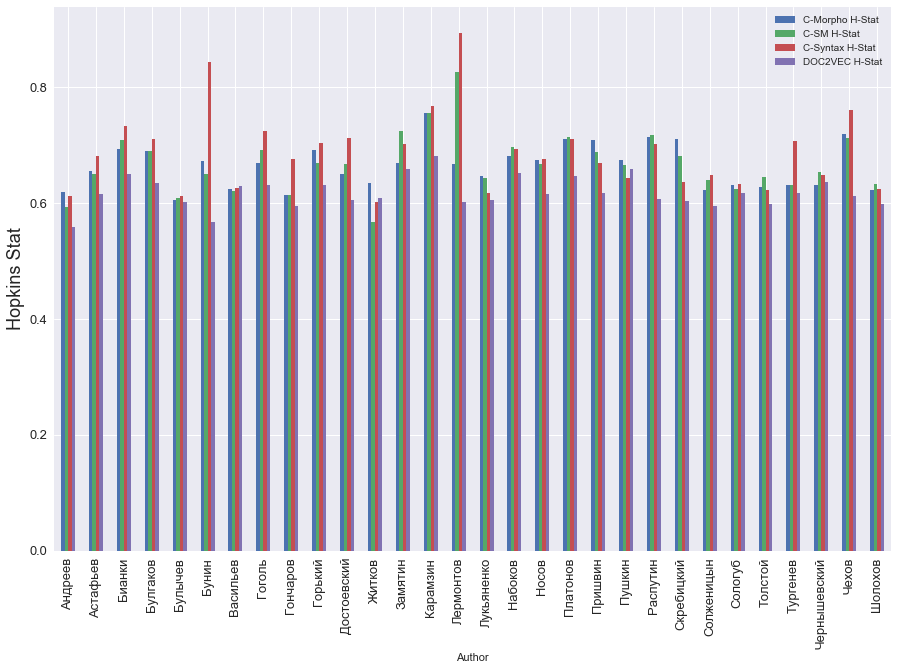

In [232]:
ax = resDF.plot(kind='bar', figsize=(15,10),
                                      fontsize=13);
ax.set_alpha(0.8)
ax.set_ylabel('Hopkins Stat', fontsize=18);
plt.savefig(os.path.join(directory,'hopkins_analysis', 'HopkinsByAuthors.png'))
# set individual bar lables using above list
# for i in ax.patches:
#     # get_x pulls left or right; get_height pushes up or down
#     ax.text(i.get_x()+.05, i.get_height() - 0.05, \
#         str(round((i.get_height()), 2)), fontsize=11, color='black',
#                     rotation=90)
#plt.savefig(os.path.join(directory, '{}_General (Final).png'.format(metric)))

# По оси x будет категориальная переменная с типом задачи

In [233]:
resDF.to_csv(os.path.join(directory,'hopkins_analysis', 'HopkinsByAuthors.csv'), index=False, encoding='ansi')

In [234]:
rows = []
for authorName in tqdm_notebook(complexSyntaxDF.Author.unique()):
    oneAuthorDF = complexSyntaxDF[complexSyntaxDF.Author == authorName]
    for novelName in oneAuthorDF.Novel.unique():
        if oneAuthorDF[oneAuthorDF.Novel == novelName].shape[0] < 10:
            continue
        currentNovelDF = oneAuthorDF[oneAuthorDF.Novel == novelName]
        X1 = currentNovelDF.drop(columns=['Author', 'Novel'], axis=1).values
        hstat_complex_syntax = hopkins(X1)
        X2 = extendedMorphoDF[(extendedMorphoDF.Author == authorName) &
                              (extendedMorphoDF.Novel == novelName)].drop(columns=['Author', 'Novel'], axis=1).values
        hstat_complex_morpho = hopkins(X2)
        
        
        
        X12 = np.concatenate((X1, X2), axis=1)
        hstat_complex_syntaxmorpho = hopkins(X12)

        XDOC = doc2vec_DF[(doc2vec_DF.Author == authorName) &
                              (doc2vec_DF.Novel == novelName)].drop(columns=['Author', 'Novel'], axis=1).values
        hstat_doc2vec = hopkins(XDOC)

        #doc2vec_DF[doc2vec_DF.Author == authorName].drop(columns=['Author', 'Novel'], axis=1).values

        
        rows.append({'Author' : authorName,
                     'Novel' : novelName,
                     'C-Syntax H-Stat': hstat_complex_syntax,
                     'C-Morpho H-Stat': hstat_complex_morpho,
                     'C-SM H-Stat' : hstat_complex_syntaxmorpho,
                    'DOC2VEC H-Stat' : hstat_doc2vec})
resDF = pd.DataFrame(rows, columns=['Author', 'Novel', 'C-Morpho H-Stat', 'C-Syntax H-Stat', 'C-SM H-Stat', 'DOC2VEC H-Stat'])
resDF.to_csv(os.path.join(directory,'hopkins_analysis', 'HopkinsByNovels.csv'), index=False, encoding='ansi')
resDF

,Author,Novel,C-Morpho H-Stat,C-Syntax H-Stat,C-SM H-Stat,DOC2VEC H-Stat
0,Астафьев,Прокляты и убиты. Книга вторая,0.609654,0.649579,0.604513,0.554111
1,Астафьев,Прокляты и убиты. Книга первая,0.609242,0.562899,0.566647,0.514224
2,Астафьев,Царь-рыба,0.613176,0.566218,0.597585,0.540056
3,Бианки,Лесная газета. Сказки и рассказы,0.665292,0.657285,0.657694,0.553084
4,Бианки,Собрание сочинений. Том 1. Рассказы и сказки,0.688294,0.733961,0.704154,0.610657
5,Булгаков,Белая гвардия,0.565350,0.620320,0.577646,0.514058
6,Булгаков,Мастер и Маргарита,0.630093,0.594526,0.622408,0.557149
7,Булычев,Гай-до,0.541420,0.567790,0.552807,0.547405
8,Булычев,Древние тайны,0.575791,0.523091,0.536820,0.532242
9,Булычев,Миллион приключений,0.567994,0.584104,0.593731,0.567915


In [235]:
resDF.index = [t[0] + ' ' + t[1] for t in zip(resDF.Author, resDF.Novel)]

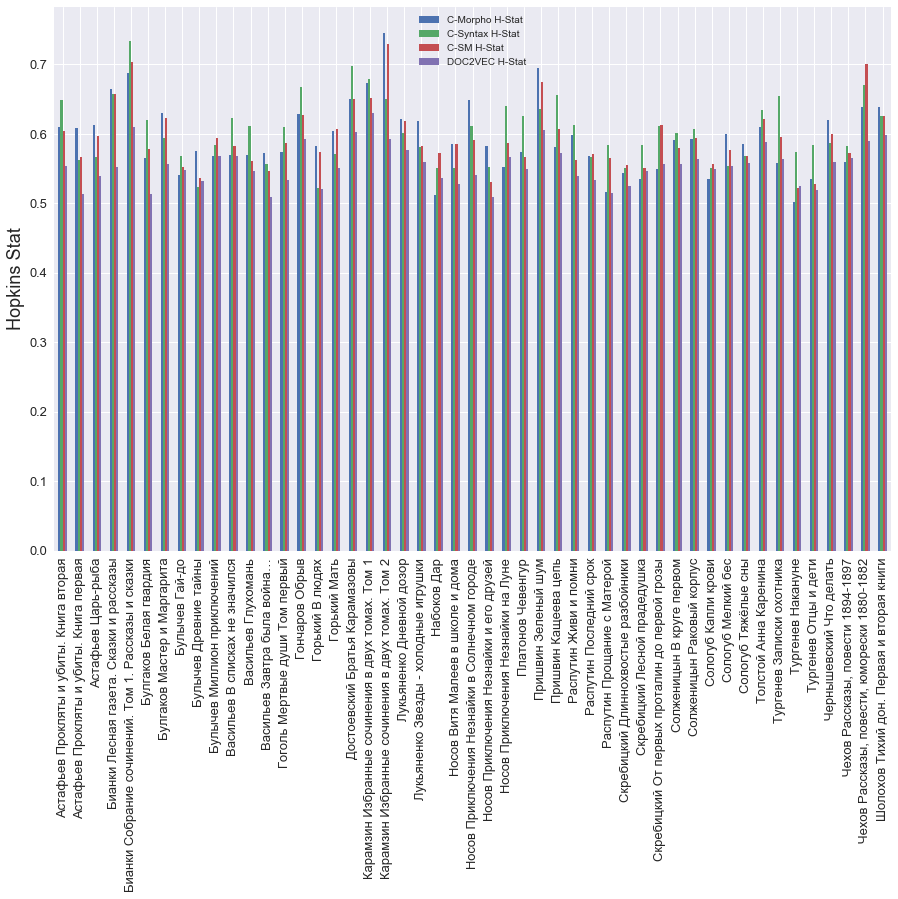

In [236]:
ax = resDF.plot(kind='bar', figsize=(15,10),
                                      fontsize=13);
ax.set_alpha(0.8)
ax.set_ylabel('Hopkins Stat', fontsize=18);
plt.savefig(os.path.join(directory, 'hopkins_analysis','HopkinsByNovels.png'), bbox_inches = "tight")